In [241]:
import pandas as pd
import scipy.io as sio
import numpy as np
import os

In [242]:
cols = {0:'acc_x', 1:'acc_y', 2:'acc_z', 3:'gyr_x', 4:'gyr_y', 5:'gyr_z', 6:'label'}

labeldict = {1.0: 'labelFreezingOfGait', 2.0: 'labelBradykinesia', 3.0: 'labelSittingWithTremor',
             4.0: 'labelAtaxicGait', 5.0: 'labelMyopathicGait', 6.0: 'labelMuscleAtrophy',
             7.0: 'labelNoPathologicalGait'}

In [243]:
data = {}

for root, dirs, filenames in os.walk('./parkinson_dataset/mat/'):
    for mat_file in filenames:
        if 'dataset_' in mat_file:
            df = pd.DataFrame(sio.loadmat('./parkinson_dataset/mat/'+mat_file)[mat_file[:-4]])
            
            df = df.rename(index=str, columns=cols)
            df['label'] = df['label'].map(labeldict)
            
            df.index = np.arange(0, len(df.index)*10, 10)
            df.index = pd.to_datetime(df.index, unit='ms')
            
            df = df.join(pd.get_dummies(df['label']))
            df = df.drop('label', axis=1)            
            df['timestamps'] = df.index
            
            data[mat_file[:-4]] = df

In [244]:
for key, value in data.items():
    data[key].to_csv('./parkinson_dataset/csv/pre_arranged_data/'+key+'.csv')

# Chapter 2

In [245]:
import sys
sys.path.append('ML4QS-master')
%matplotlib inline

from Chapter2.CreateDataset import CreateDataset
import math
from util.VisualizeDataset import VisualizeDataset
from util import util
import copy
import os

In [246]:
import matplotlib
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = [20,15]
matplotlib.rc('font', **{'family' : 'normal', 'size'   : 22})
matplotlib.rc('xtick',labelsize=22)
matplotlib.rc('ytick',labelsize=22)

## Granularization

In [247]:
def roundup(x):
    return int(math.ceil(x))

def create_granularity(DATA_PATH, RESULT_PATH, granularities, name):
    for milliseconds_per_instance in granularities:
        
        print('For Granularity: ', milliseconds_per_instance)
        
        print('Creating empty dataset...')
        DataSet = CreateDataset(DATA_PATH, milliseconds_per_instance)

        print('Adding Numerical data...')
        DataSet.add_numerical_dataset(f'dataset_{name}.csv', 'timestamps', ['acc_x',
                                         'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z',
                                         'labelAtaxicGait', 'labelBradykinesia', 'labelFreezingOfGait',
                                         'labelMuscleAtrophy', 'labelMyopathicGait', 'labelNoPathologicalGait',
                                         'labelSittingWithTremor'], 'avg', '')

        # Get the resulting pandas data table.
        #
        print('Converting to pandas data table...')
        dataset = DataSet.data_table
        
        dataset['acc_x'] = dataset['acc_x'].astype(np.float64)
        dataset['acc_y'] = dataset['acc_y'].astype(np.float64)
        dataset['acc_z'] = dataset['acc_z'].astype(np.float64)
        dataset['gyr_x'] = dataset['gyr_x'].astype(np.float64)
        dataset['gyr_y'] = dataset['gyr_y'].astype(np.float64)
        dataset['gyr_z'] = dataset['gyr_z'].astype(np.float64)
        dataset['labelAtaxicGait'] = dataset['labelAtaxicGait'].astype(np.int64)
        dataset['labelBradykinesia'] = dataset['labelBradykinesia'].astype(np.int64)
        dataset['labelFreezingOfGait'] = dataset['labelFreezingOfGait'].astype(np.int64)
        dataset['labelMuscleAtrophy'] = dataset['labelMuscleAtrophy'].astype(np.int64)
        dataset['labelMyopathicGait'] = dataset['labelMyopathicGait'].astype(np.int64)
        dataset['labelSittingWithTremor'] = dataset['labelSittingWithTremor'].astype(np.int64)
        dataset['labelNoPathologicalGait'] = dataset['labelNoPathologicalGait'].astype(np.int64)

        # fix labels when multiple labels in same row.
        #
        for x in dataset.columns:
            if 'label' in x:
                dataset[x] = dataset[x].apply(roundup)
                
        # Plot and Visualize.
        #
        DataViz = VisualizeDataset()
        DataViz.plot_dataset_boxplot(dataset, ['acc_x','acc_y','acc_z', 'gyr_x','gyr_y','gyr_z'])
        DataViz.plot_dataset(dataset, ['acc_x','acc_y','acc_z', 'gyr_x','gyr_y','gyr_z', 'label'], 
                                         ['like', 'like', 'like', 'like', 'like', 'like', 'like'], 
                                             ['line', 'line', 'line', 'line', 'line', 'line', 'points'])

        util.print_statistics(dataset)

    dataset.to_csv(RESULT_PATH + f'{name}_{milliseconds_per_instance}.csv')
    print('Saved as csv!')

For Granularity:  250
Creating empty dataset...
Adding Numerical data...
Reading data from dataset_10Bice.csv
Converting to pandas data table...
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


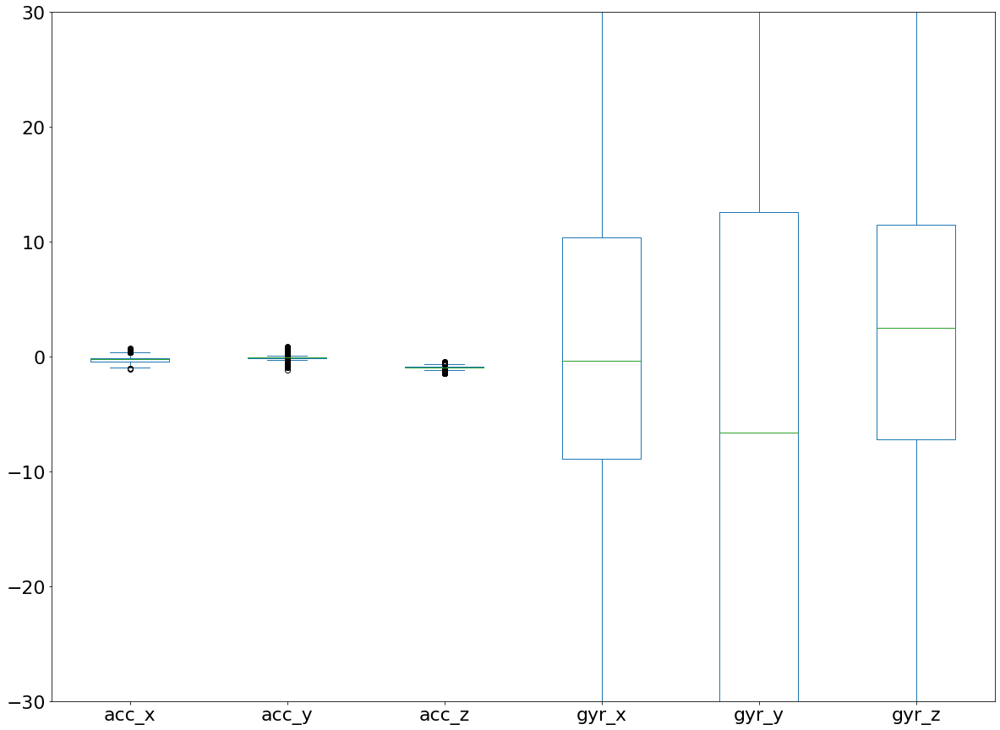

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


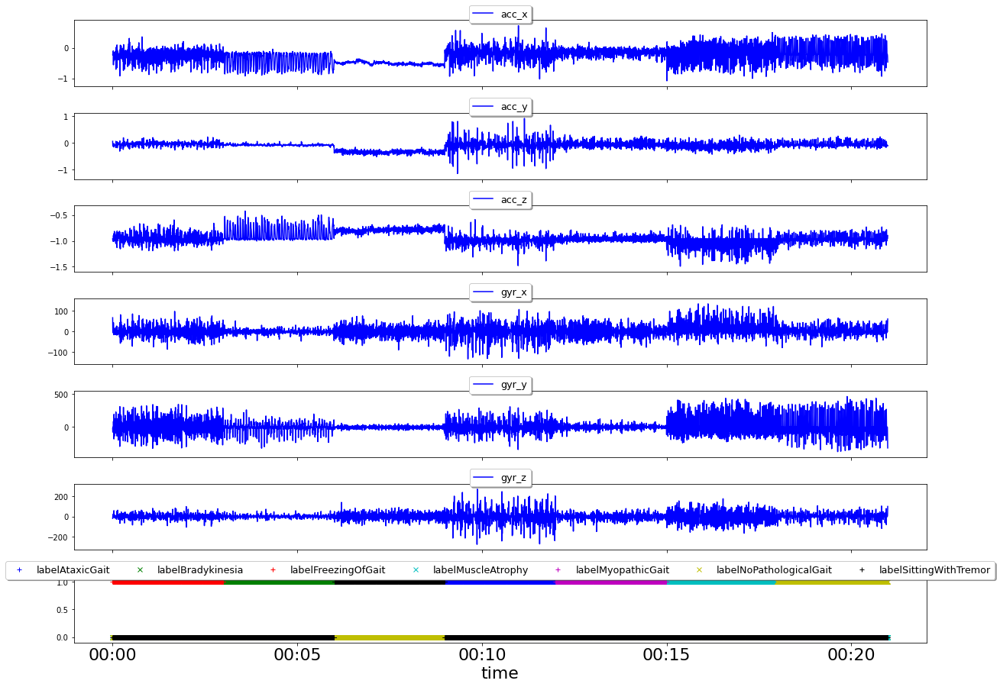

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.258    -0.107    -0.930     1.249    -4.210     1.673            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.241     0.140     0.116    25.366    96.423    37.941            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.080    -1.139    -1.491  -132.723  -378.291  -272.801            0.000              0.000                0.000               0.000          

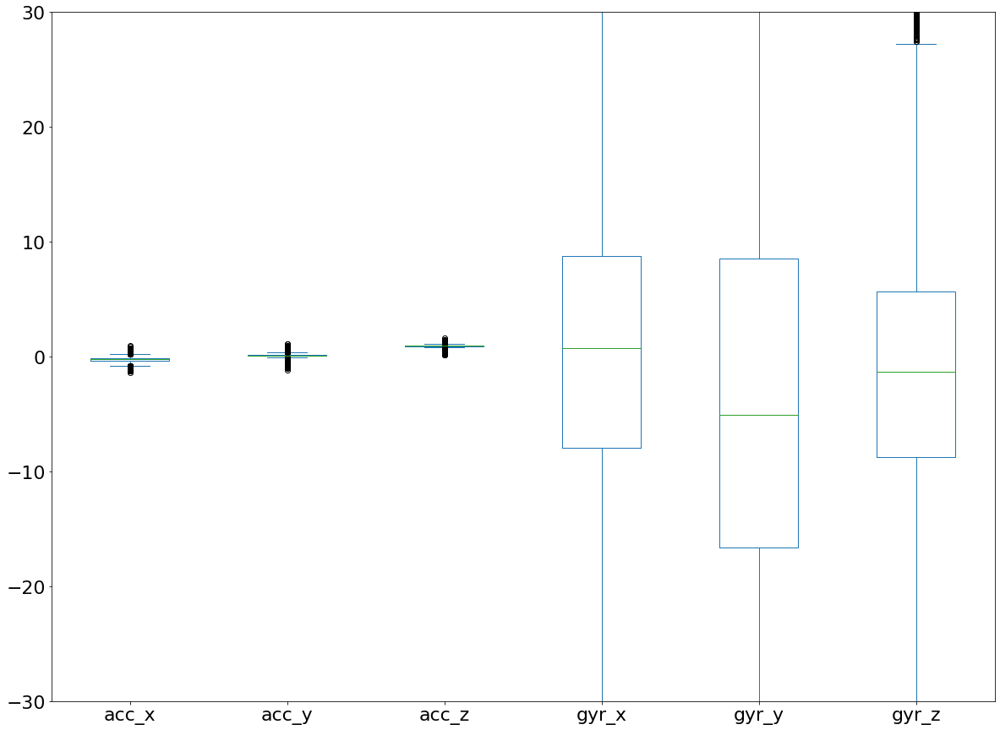

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


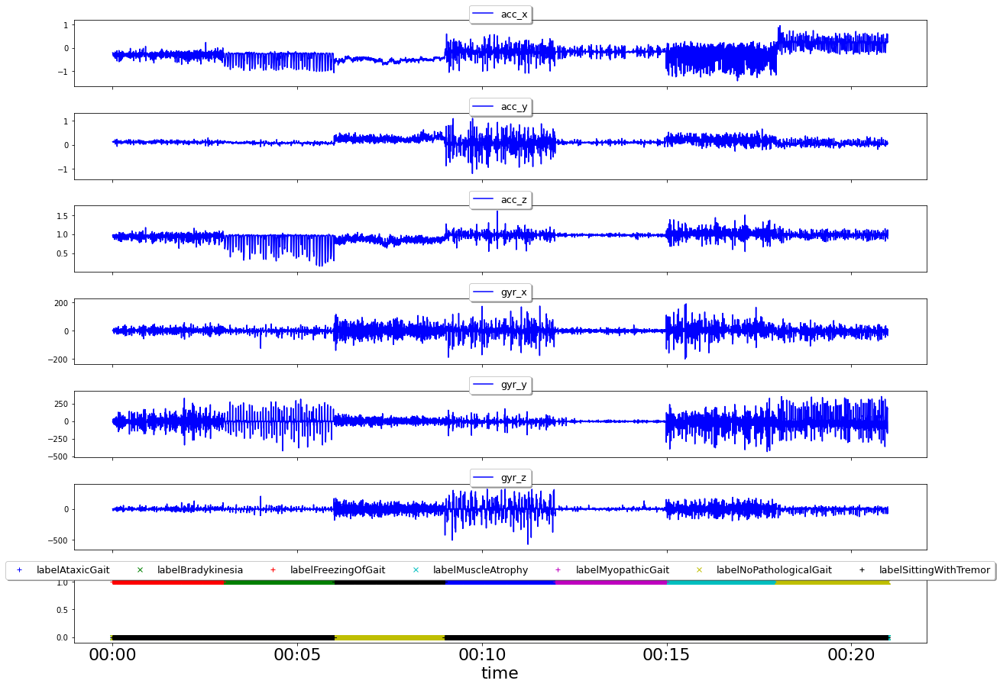

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.222     0.122     0.943     0.239    -4.343    -2.251            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.290     0.139     0.117    27.983    72.173    52.119            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.412    -1.198     0.155  -200.626  -434.991  -569.447            0.000              0.000                0.000               0.000          

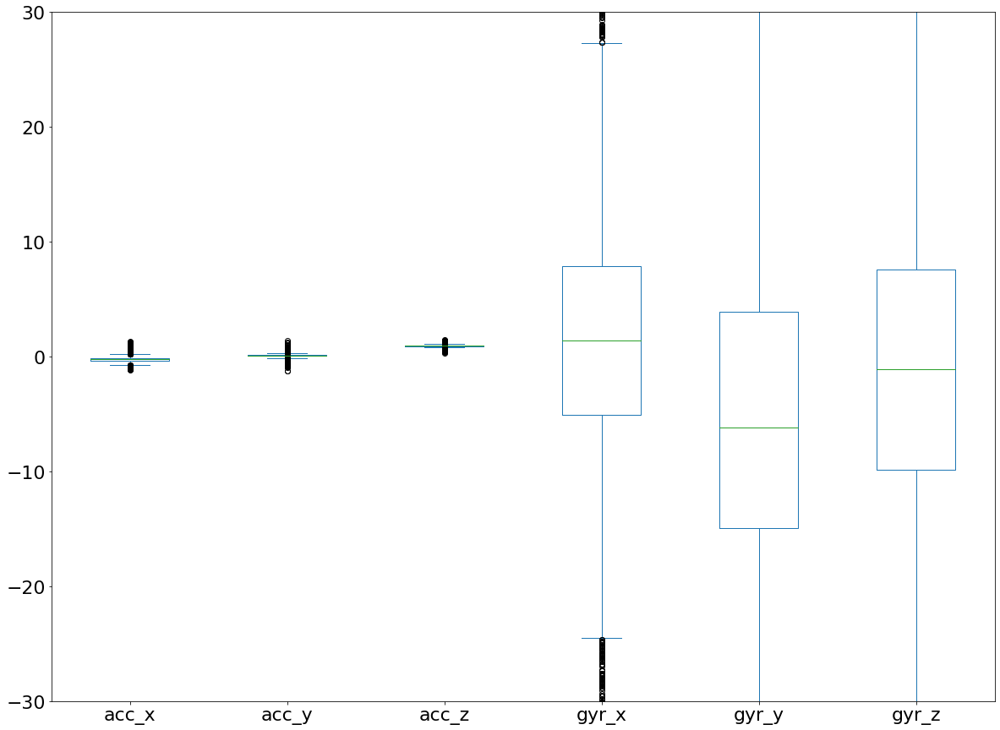

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


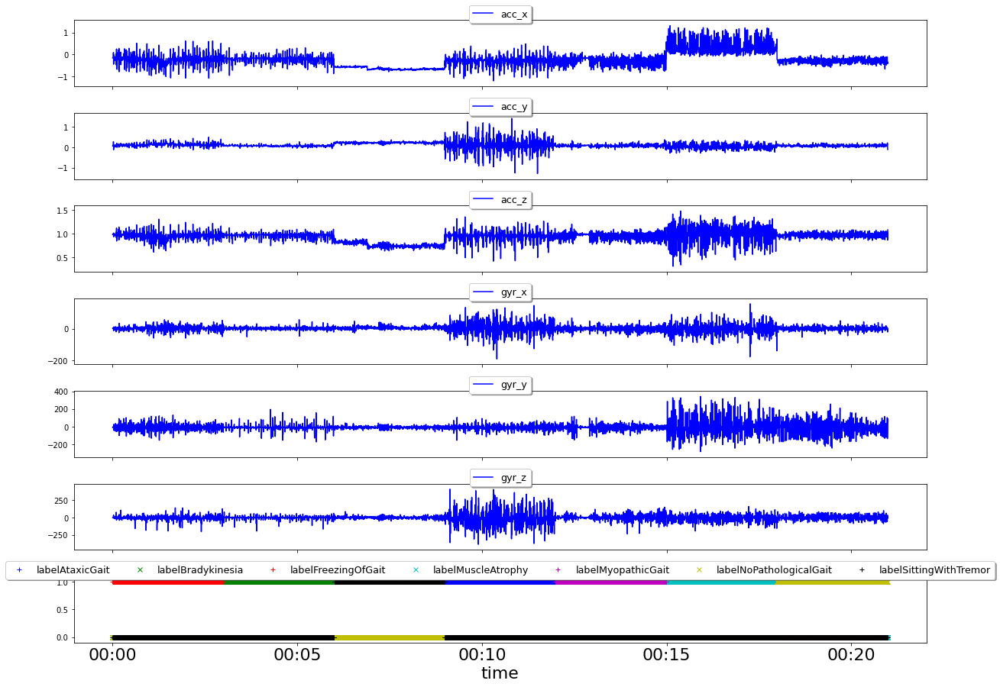

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.224     0.104     0.939     1.171    -5.648    -1.300            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.311     0.138     0.110    20.438    46.585    51.881            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.197    -1.272     0.318  -189.350  -278.986  -386.529            0.000              0.000                0.000               0.000          

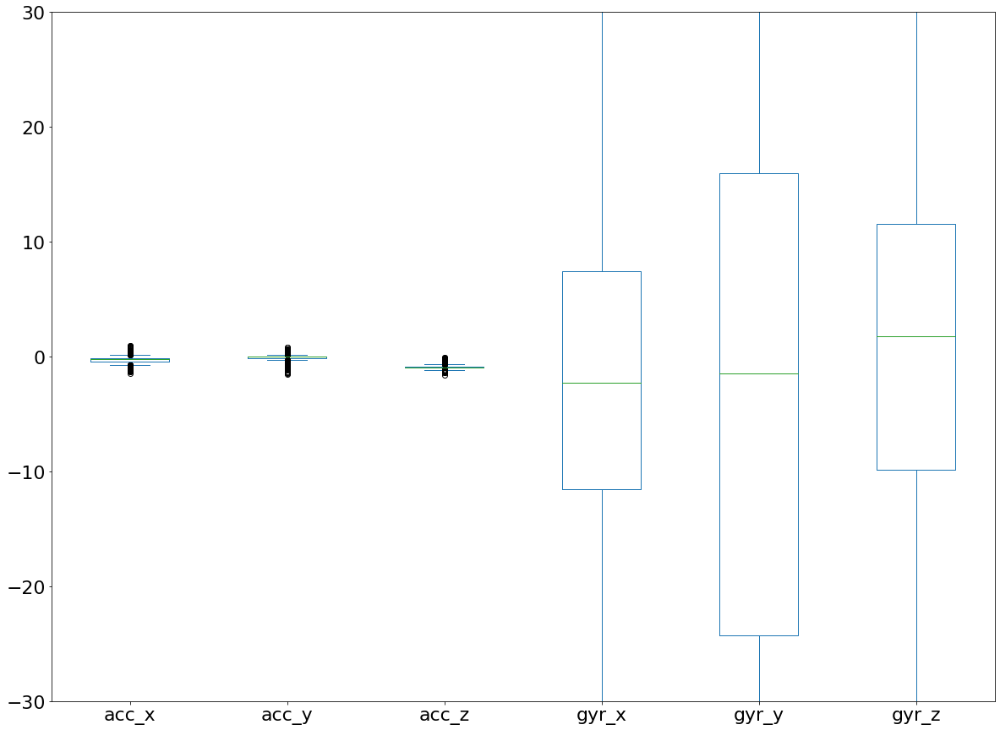

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


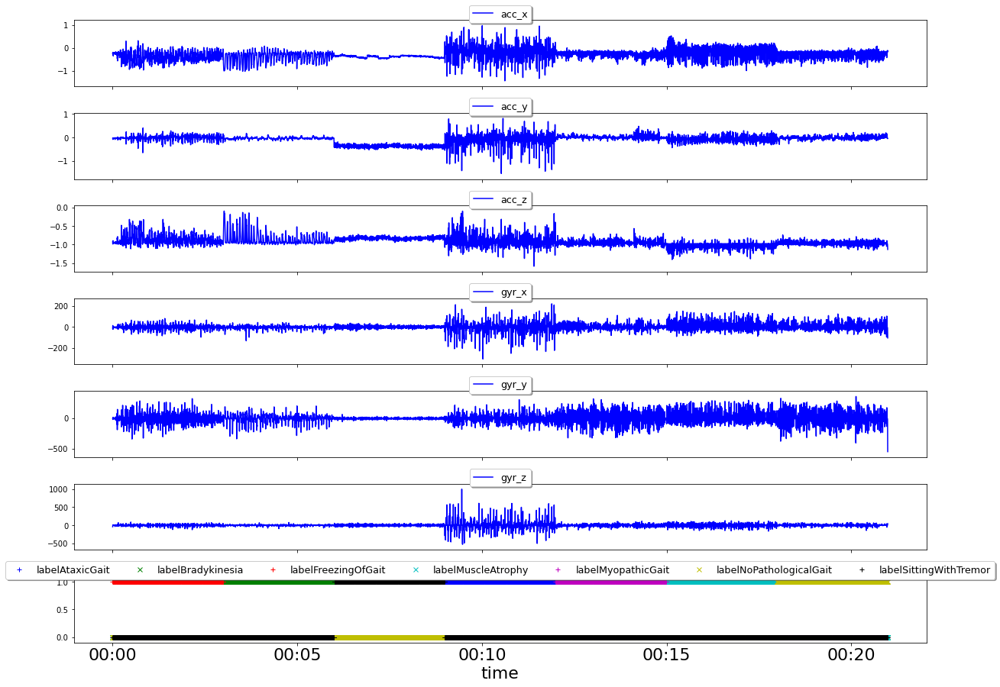

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.283    -0.076    -0.917    -0.930    -1.379     0.728            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.230     0.176     0.131    32.822    81.279    64.340            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.439    -1.531    -1.584  -303.528  -547.204  -525.112            0.000              0.000                0.000               0.000          

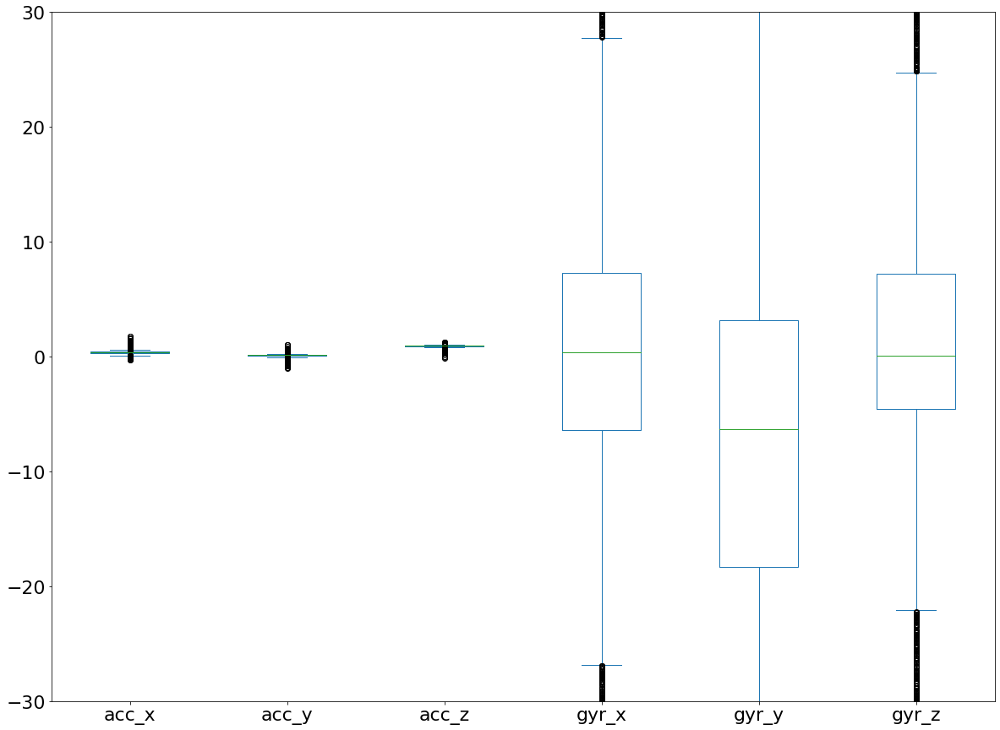

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


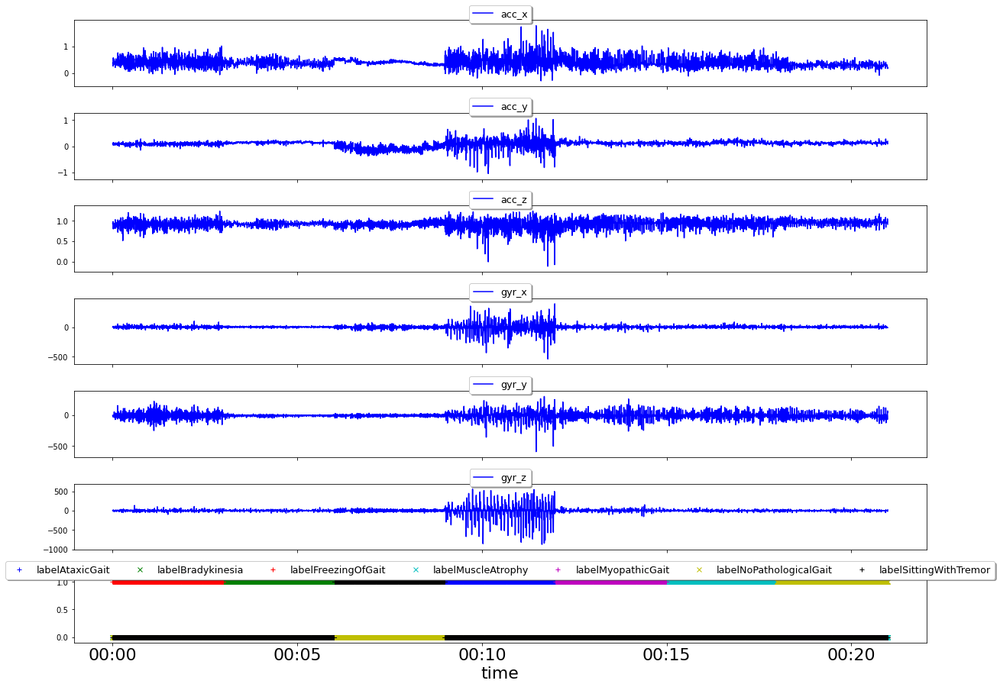

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean      0.371     0.090     0.921     0.671    -6.871     0.665            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.159     0.130     0.091    38.220    47.556    73.576            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -0.294    -1.038    -0.117  -539.221  -591.371  -866.667            0.000              0.000                0.000               0.000          

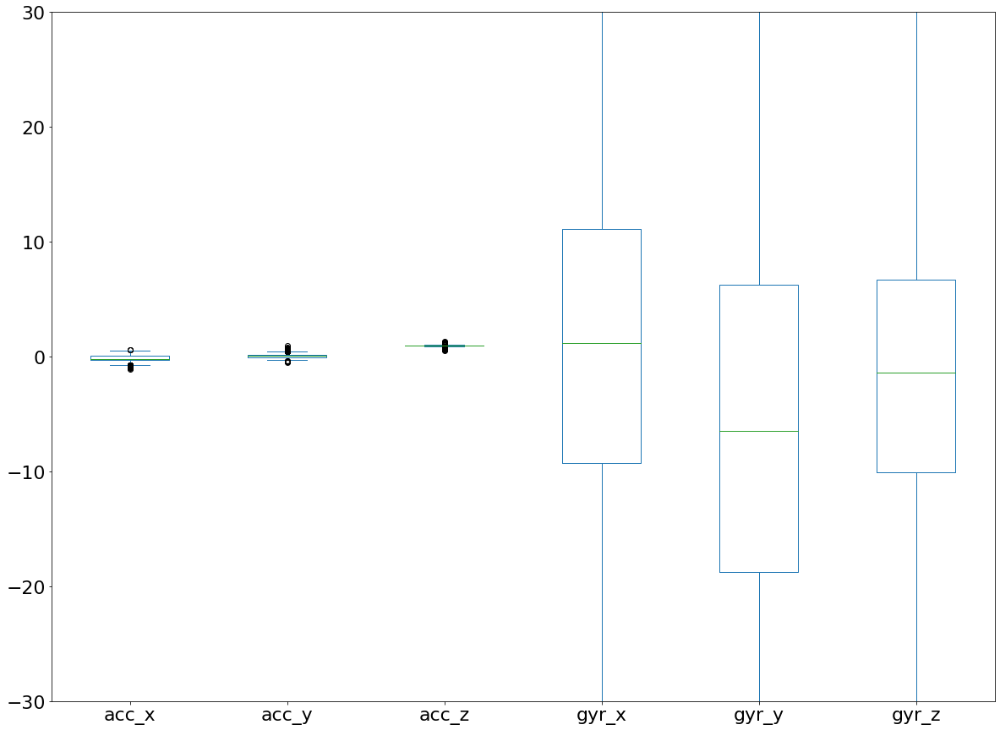

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


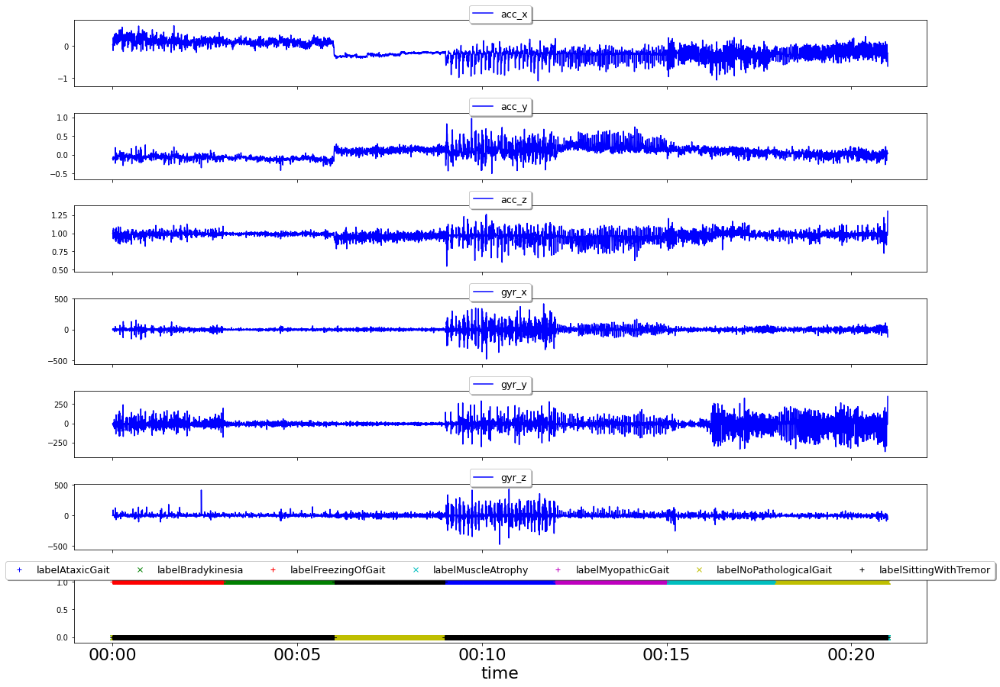

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.139     0.069     0.968     1.057    -7.240     0.218            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.214     0.148     0.055    47.408    58.136    45.448            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.081    -0.497     0.547  -474.821  -367.035  -475.726            0.000              0.000                0.000               0.000          

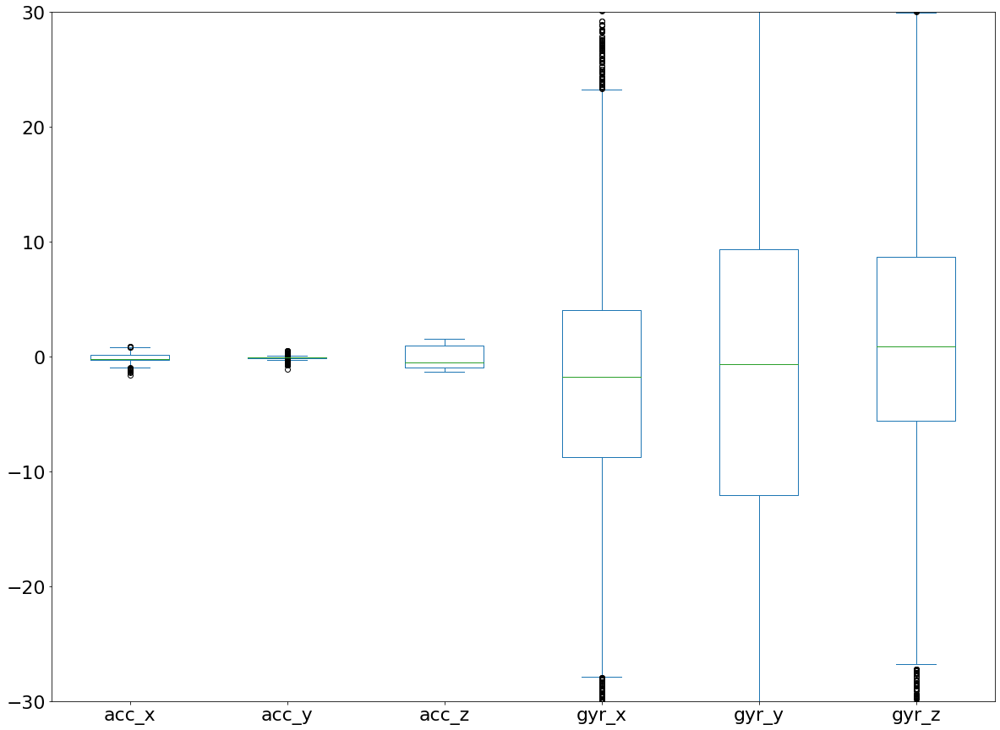

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


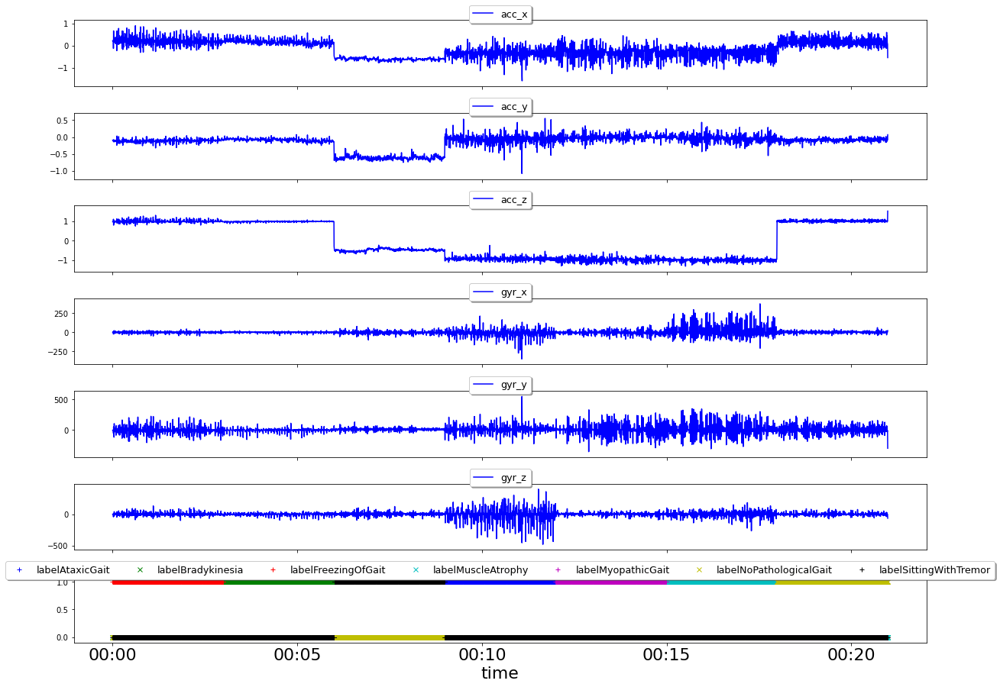

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.140    -0.143    -0.055    -2.096    -0.027     0.177            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.325     0.206     0.923    33.019    56.404    44.498            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.579    -1.075    -1.314  -351.291  -358.193  -482.759            0.000              0.000                0.000               0.000          

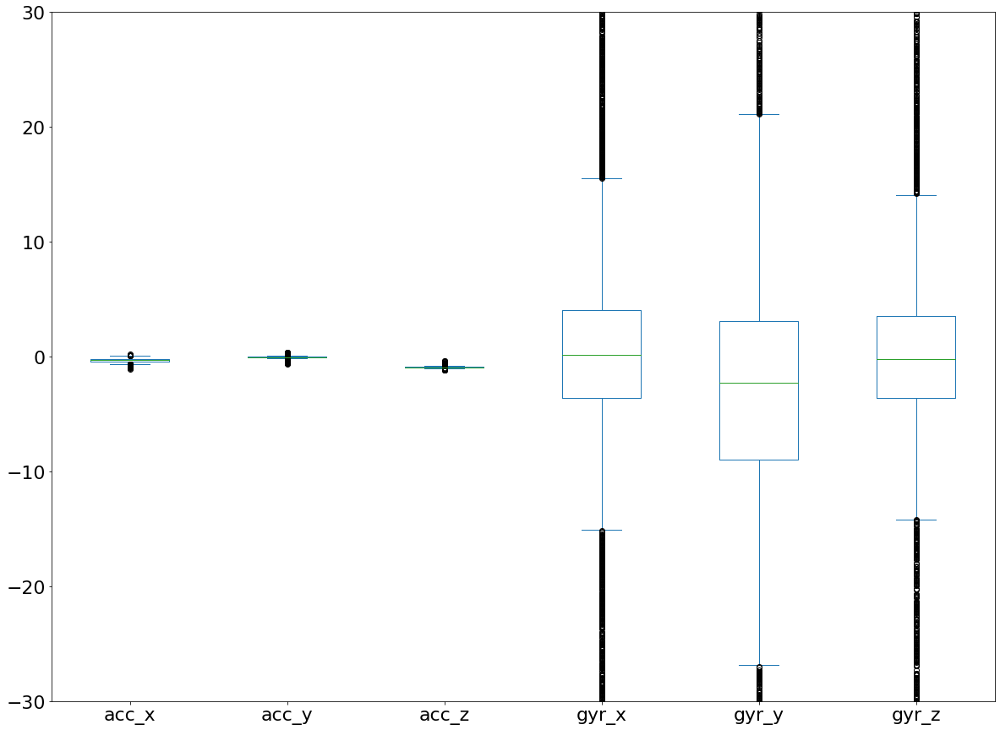

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


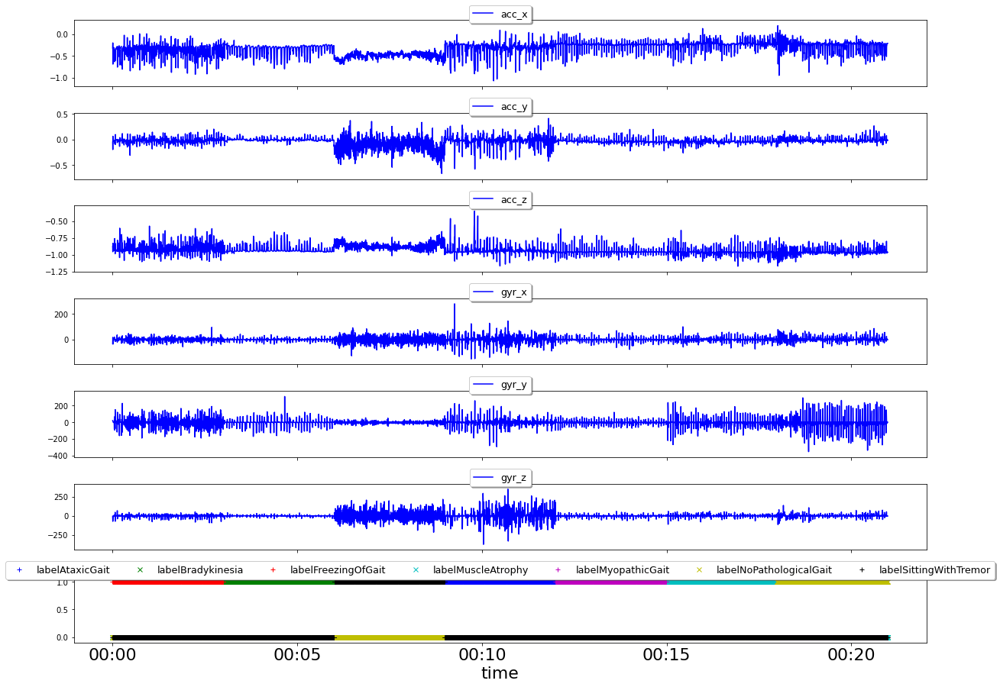

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.317    -0.038    -0.932     0.152    -3.058    -0.638            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.136     0.079     0.062    19.922    46.860    39.453            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.069    -0.666    -1.172  -150.326  -353.097  -371.767            0.000              0.000                0.000               0.000          

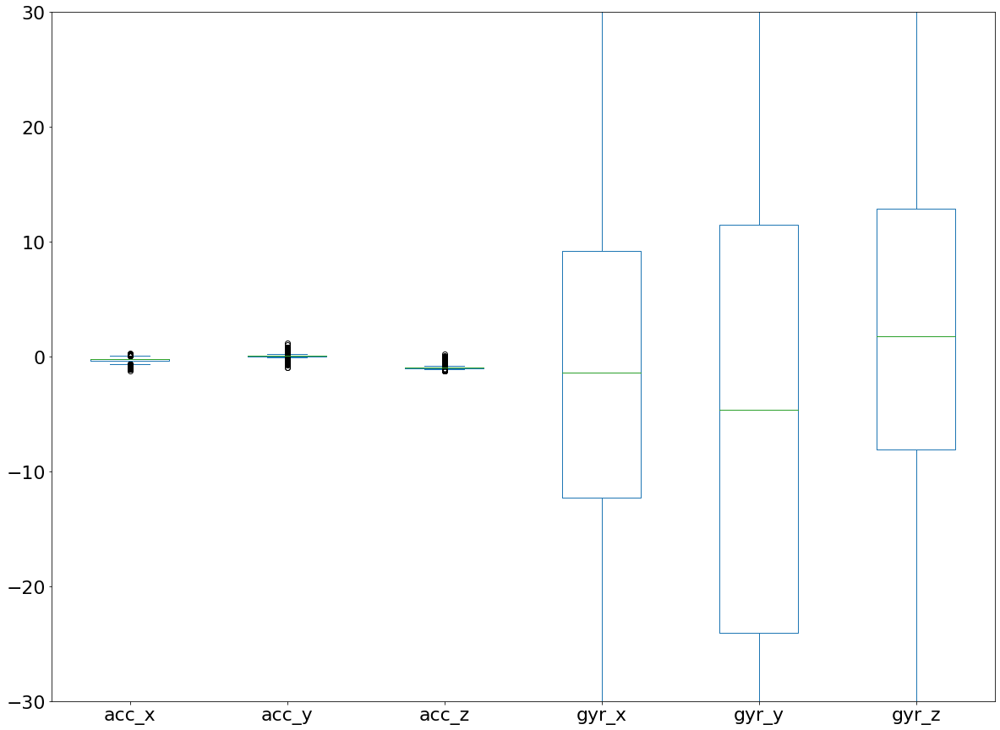

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


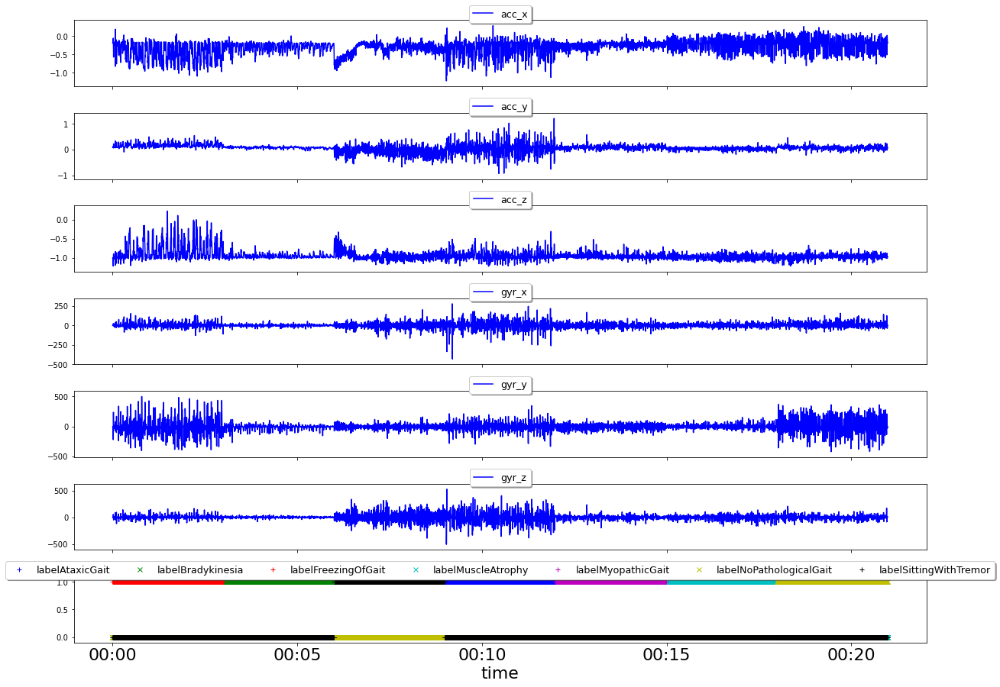

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.293     0.064    -0.947    -0.748    -4.848     1.367            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.188     0.137     0.129    35.410    76.906    60.993            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.226    -0.927    -1.222  -431.169  -419.614  -507.668            0.000              0.000                0.000               0.000          

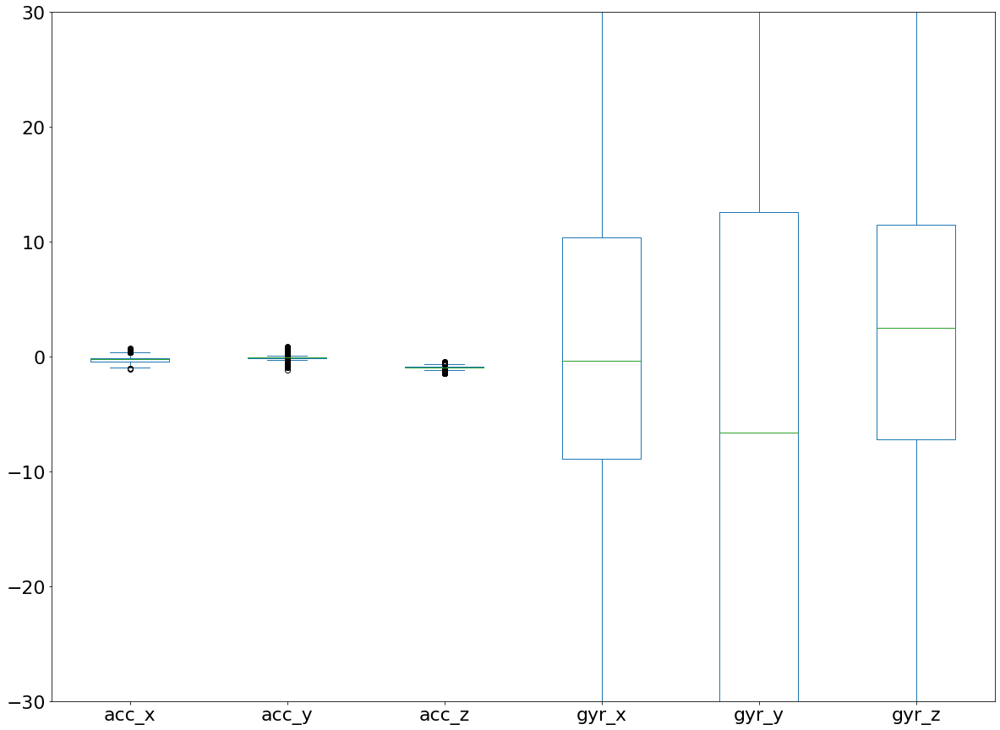

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


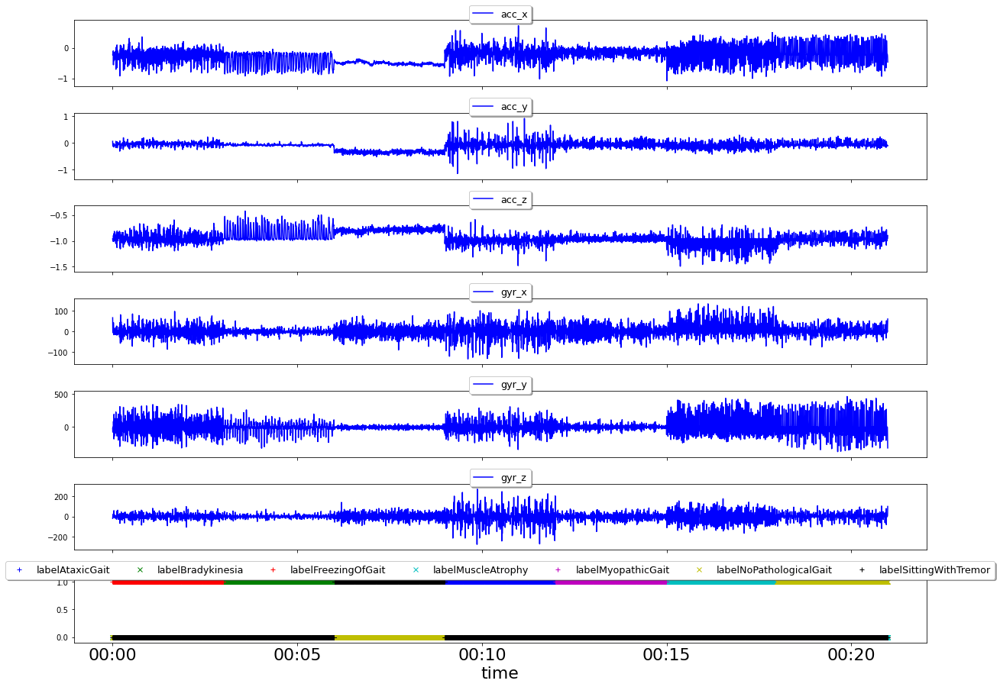

          acc_x     acc_y     acc_z     gyr_x     gyr_y     gyr_z  labelAtaxicGait  labelBradykinesia  labelFreezingOfGait  labelMuscleAtrophy  labelMyopathicGait  labelNoPathologicalGait  labelSittingWithTremor
count  5038.000  5038.000  5038.000  5038.000  5038.000  5038.000         5038.000           5038.000             5038.000            5038.000            5038.000                 5038.000                5038.000
mean     -0.258    -0.107    -0.930     1.249    -4.210     1.673            0.143              0.143                0.143               0.143               0.143                    0.143                   0.143
std       0.241     0.140     0.116    25.366    96.423    37.941            0.350              0.350                0.350               0.350               0.350                    0.350                   0.350
min      -1.080    -1.139    -1.491  -132.723  -378.291  -272.801            0.000              0.000                0.000               0.000          

In [248]:
DATA_PATH = './parkinson_dataset/csv/pre_arranged_data/'
RESULT_PATH = './parkinson_dataset/csv/granularity_results/'
granularities = [250]

for key, value in data.items():
    name = key[8:]
    create_granularity(DATA_PATH, RESULT_PATH, granularities, name)

## Combine data

In [249]:
# Combine all person data.
#
files = []
source = './parkinson_dataset/csv/granularity_results/'
for root, dirs, filenames in os.walk(source):
    for fn in filenames:
        files.append(pd.read_csv(source+fn))

data = pd.concat(files)
data.to_csv('./parkinson_dataset/csv/chapter2_combined.csv')

# Chapter 3

## Kalman Filtering

In [250]:
import numpy as np
from pykalman import KalmanFilter

# Implements the Kalman filter for single columns.
class KalmanFilters:

    # Very simple Kalman filter: fill missing values and remove outliers for single attribute.
    # We assume a very simple transition matrix, namely simply a [[1]]. It
    # is however still useful as it is able to dampen outliers and impute missing values. The new
    # values are appended in a new column.
    def apply_kalman_filter(self, data_table, col):

        # Initialize the Kalman filter with the trivial transition and observation matrices.
        kf = KalmanFilter(transition_matrices=[[1]], observation_matrices=[[1]])

        numpy_array_state = data_table[col].values
        numpy_array_state = numpy_array_state.astype(np.float32)
        numpy_matrix_state_with_mask = np.ma.masked_invalid(numpy_array_state)

        # Find the best other parameters based on the data (e.g. Q)
        kf = kf.em(numpy_matrix_state_with_mask, n_iter=5)

        # And apply the filter.
        (new_data, filtered_state_covariances) = kf.filter(numpy_matrix_state_with_mask)

        data_table[col + '_kalman'] = new_data
        return data_table

In [251]:
original_dataset = pd.read_csv('./parkinson_dataset/csv/chapter2_combined.csv', index_col=1)
original_dataset

In [253]:
original_dataset.index = pd.to_datetime(original_dataset.index)
original_dataset = original_dataset.drop(columns=['Unnamed: 0.1'])

In [254]:
# Kalman filtering.
#
DataViz = VisualizeDataset()
KalFilter = KalmanFilters()

for feature in list(cols.values())[:-1]:
    print(f'Current feature {feature}...')
    kalman_dataset = KalFilter.apply_kalman_filter(original_dataset, feature)
    original_dataset = kalman_dataset
    print('Done!')

Current feature acc_x...
Done!
Current feature acc_y...
Done!
Current feature acc_z...
Done!
Current feature gyr_x...
Done!
Current feature gyr_y...
Done!
Current feature gyr_z...
Done!


Feature: acc_x...
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


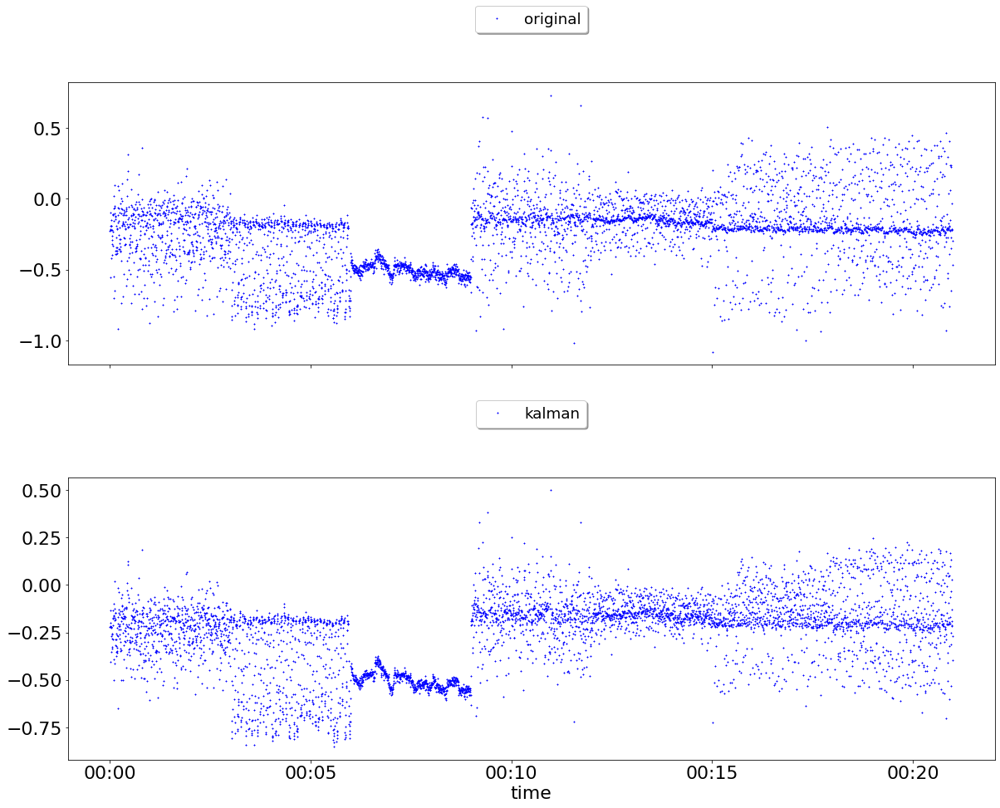

Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


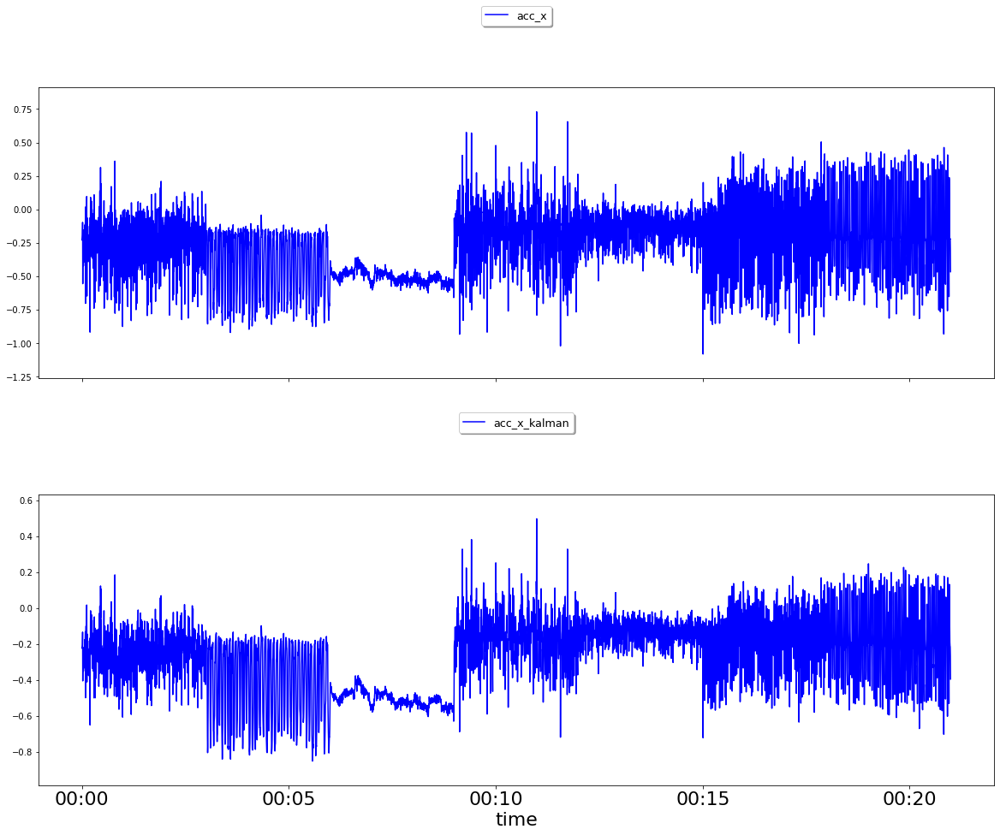

Done!
Feature: acc_y...
Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


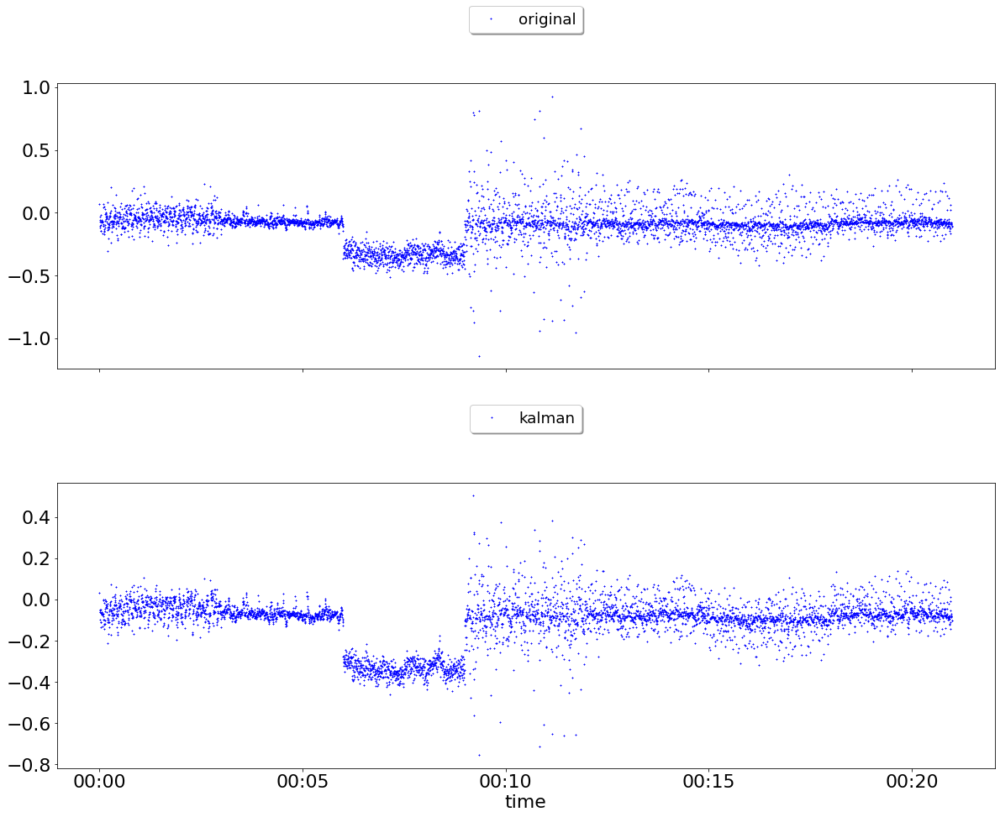

Figure saved to figures\figure_4.png
Figure saved to figures\figure_4.pdf


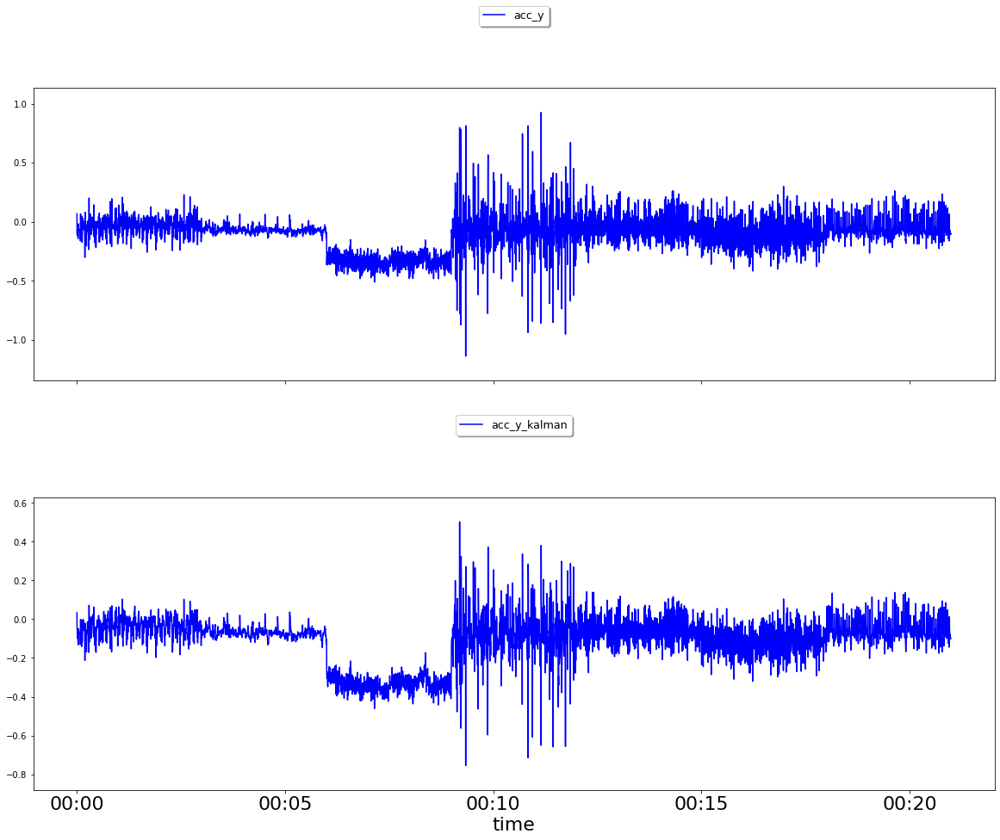

Done!
Feature: acc_z...
Figure saved to figures\figure_5.png
Figure saved to figures\figure_5.pdf


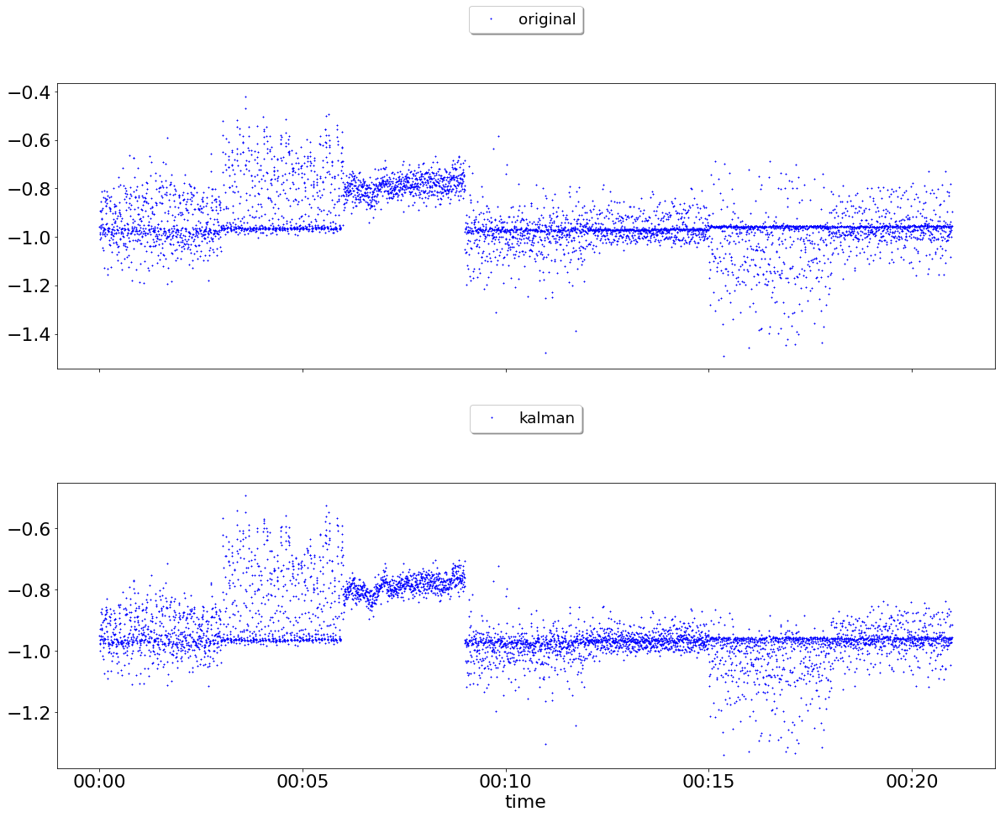

Figure saved to figures\figure_6.png
Figure saved to figures\figure_6.pdf


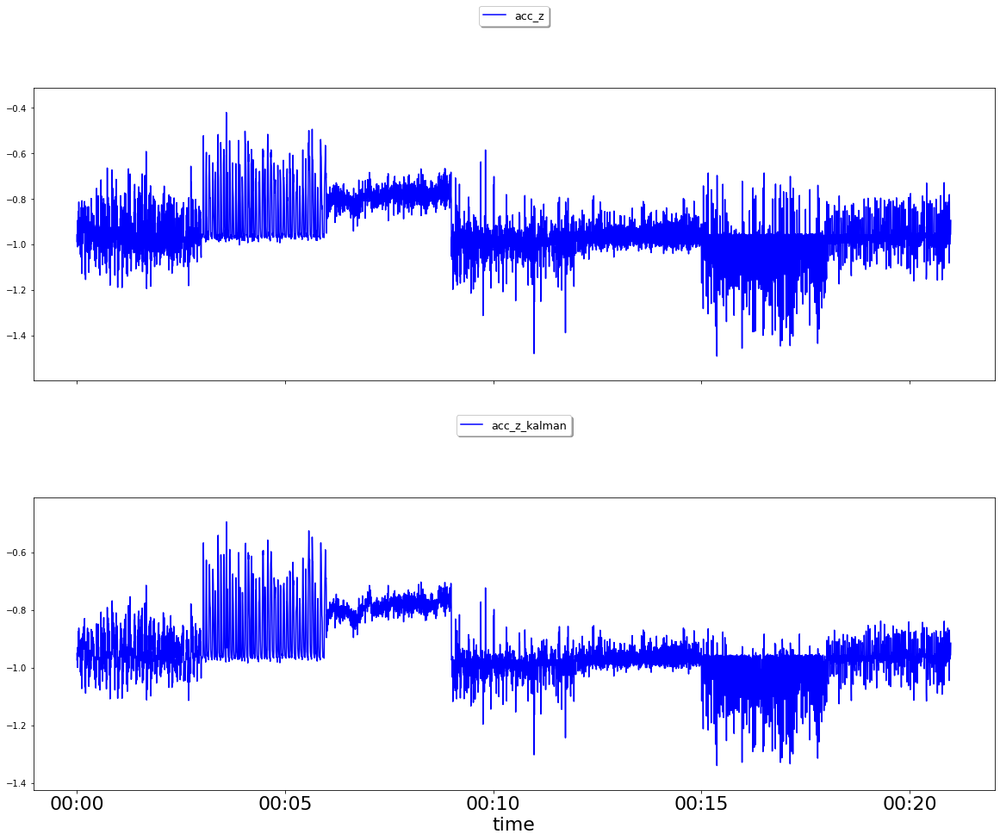

Done!
Feature: gyr_x...
Figure saved to figures\figure_7.png
Figure saved to figures\figure_7.pdf


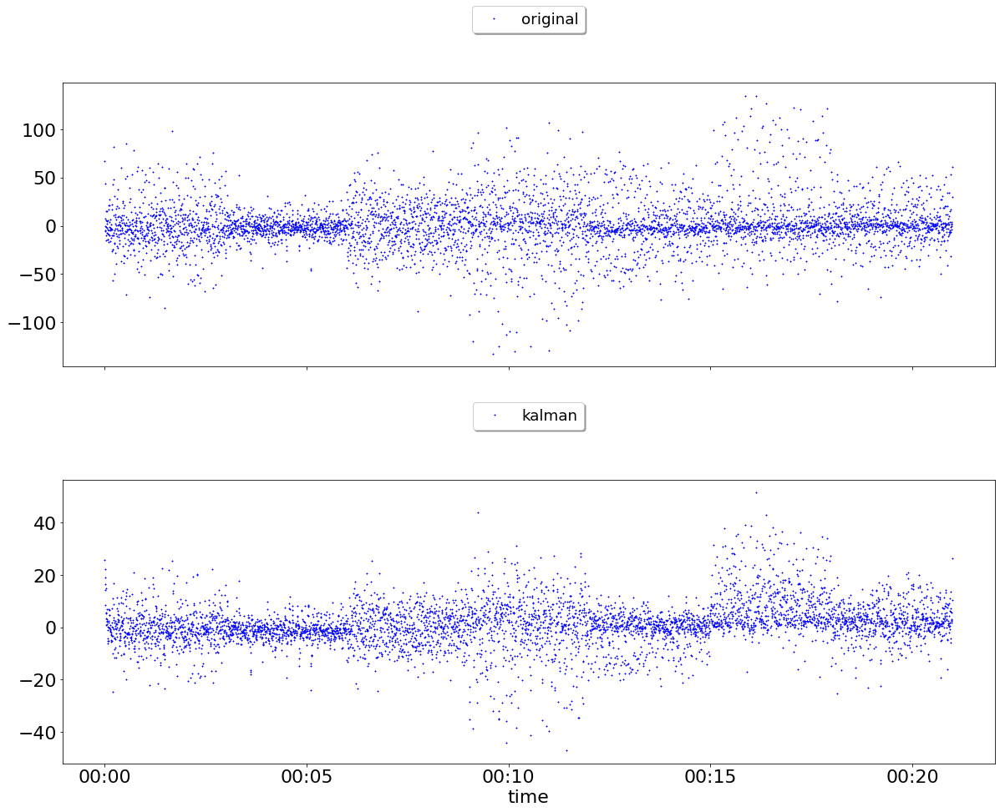

Figure saved to figures\figure_8.png
Figure saved to figures\figure_8.pdf


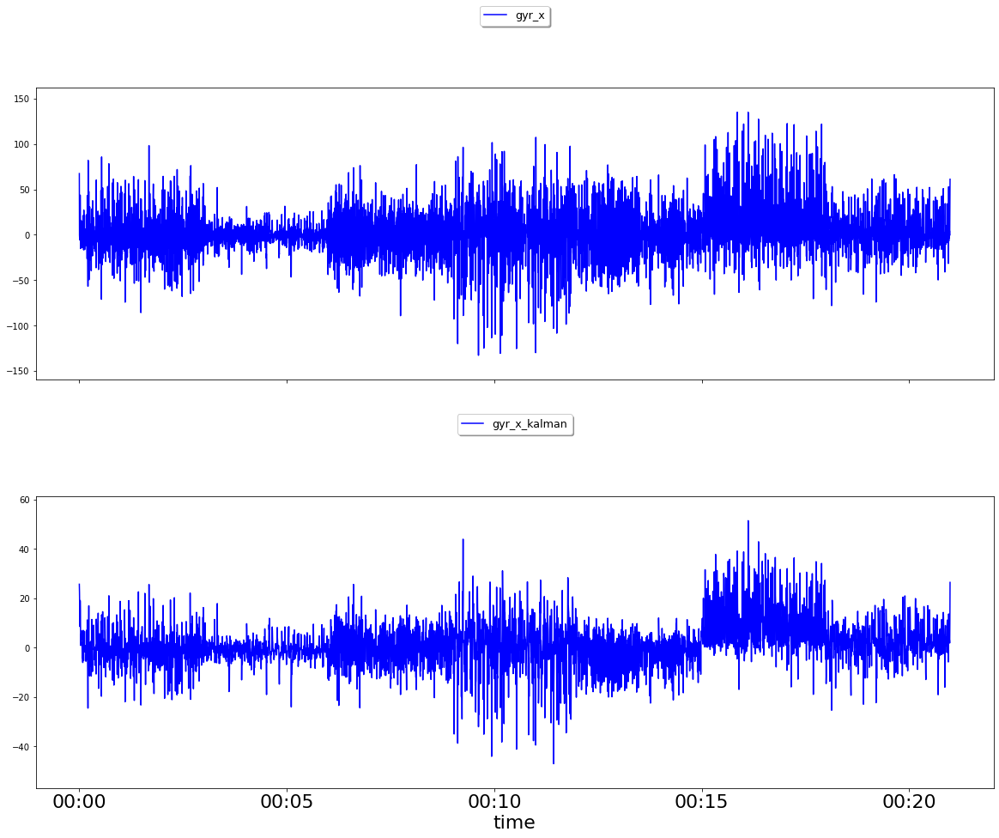

Done!
Feature: gyr_y...
Figure saved to figures\figure_9.png
Figure saved to figures\figure_9.pdf


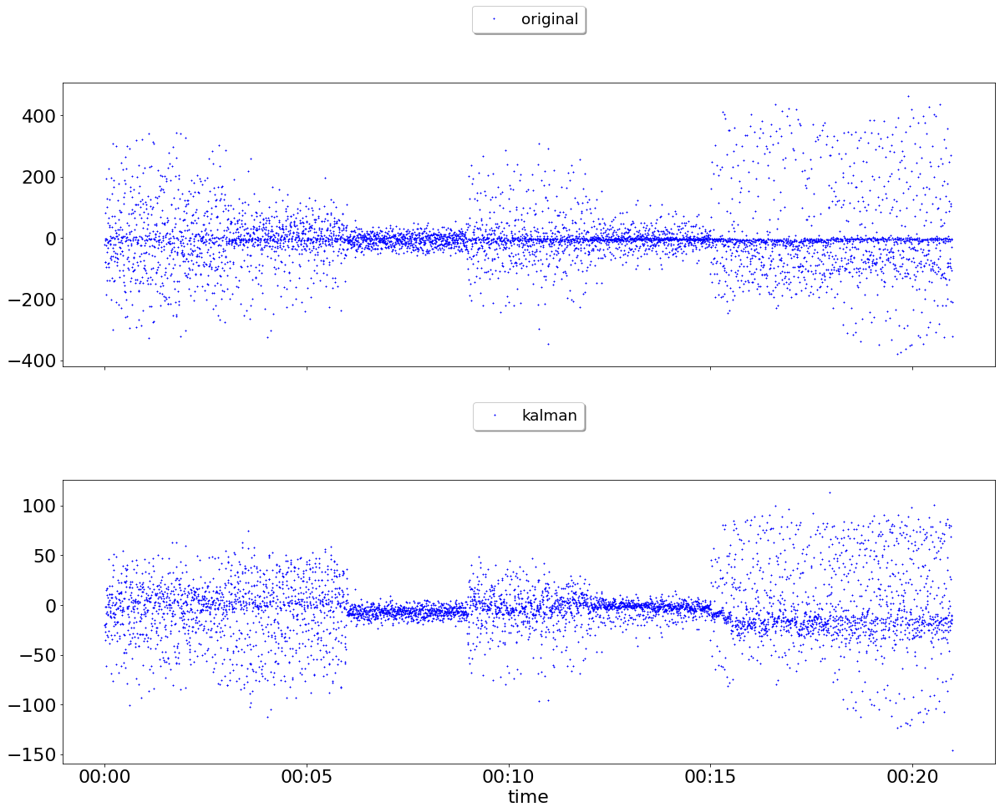

Figure saved to figures\figure_10.png
Figure saved to figures\figure_10.pdf


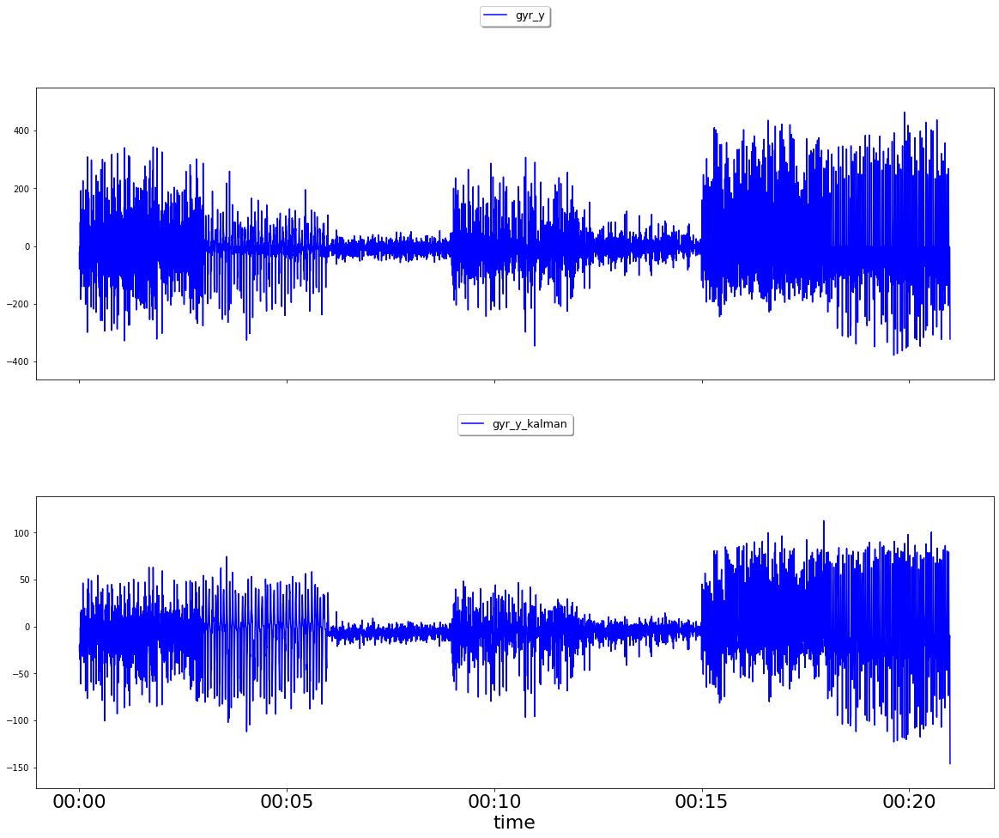

Done!
Feature: gyr_z...
Figure saved to figures\figure_11.png
Figure saved to figures\figure_11.pdf


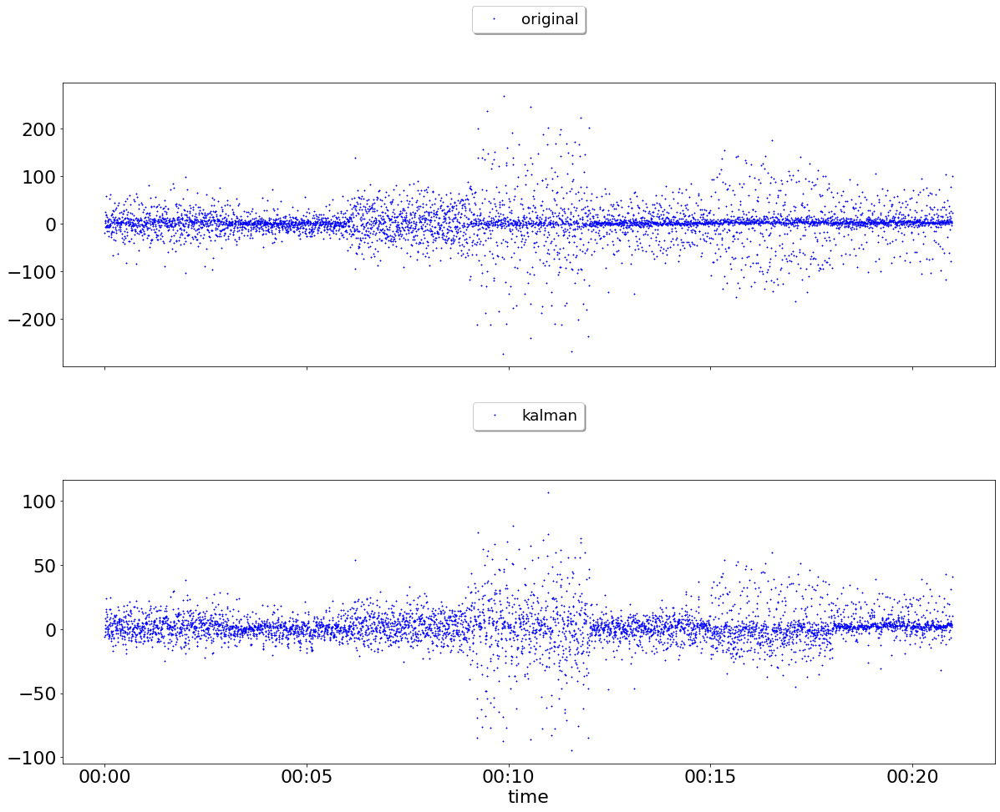

Figure saved to figures\figure_12.png
Figure saved to figures\figure_12.pdf


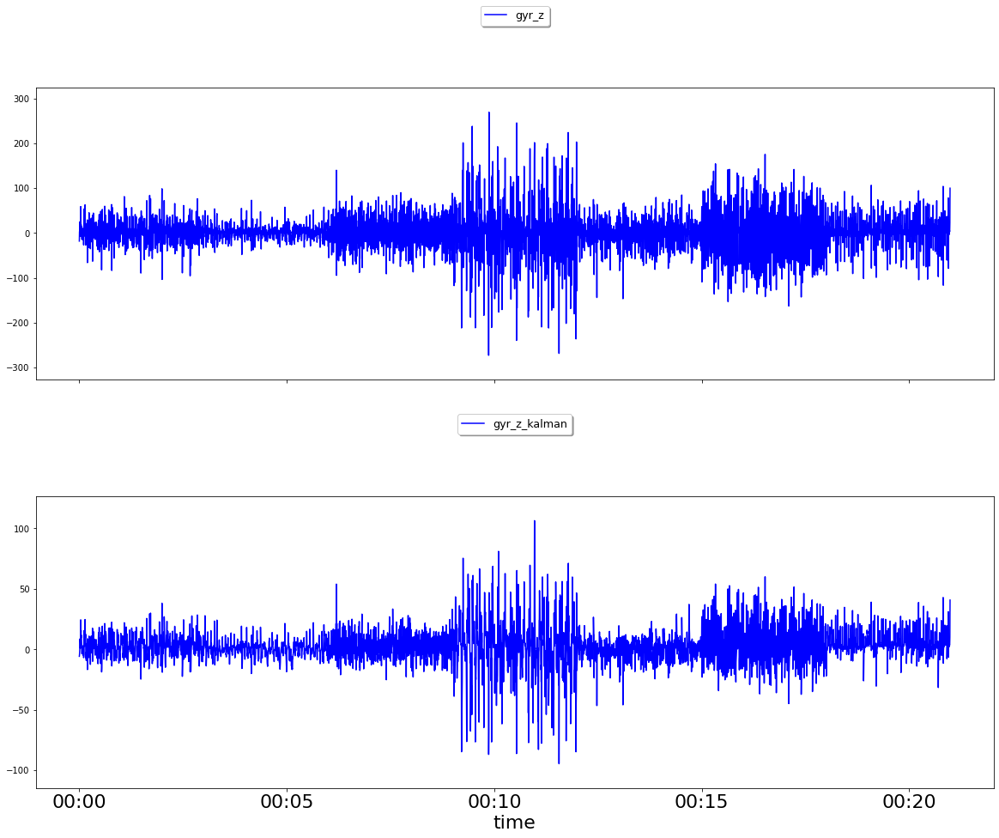

Done!


In [255]:
for feature in list(cols.values())[:-1]:
    print(f'Feature: {feature}...')
    
    # plot for 1st person.
    #
    DataViz.plot_imputed_values(kalman_dataset[:int(len(kalman_dataset)/10)], ['original', 'kalman'], feature, kalman_dataset[feature+'_kalman'][:int(len(kalman_dataset)/10)])
    DataViz.plot_dataset(kalman_dataset[:int(len(kalman_dataset)/10)], [feature, feature+'_kalman'], ['exact','exact'], ['line', 'line'])
    print('Done!')

## Apply PCA

In [256]:
from Chapter3.DataTransformation import PrincipalComponentAnalysis

In [257]:
PCA = PrincipalComponentAnalysis()
selected_predictor_cols = [c for c in kalman_dataset.columns if 'kalman' in c]
pc_values = PCA.determine_pc_explained_variance(kalman_dataset, selected_predictor_cols)

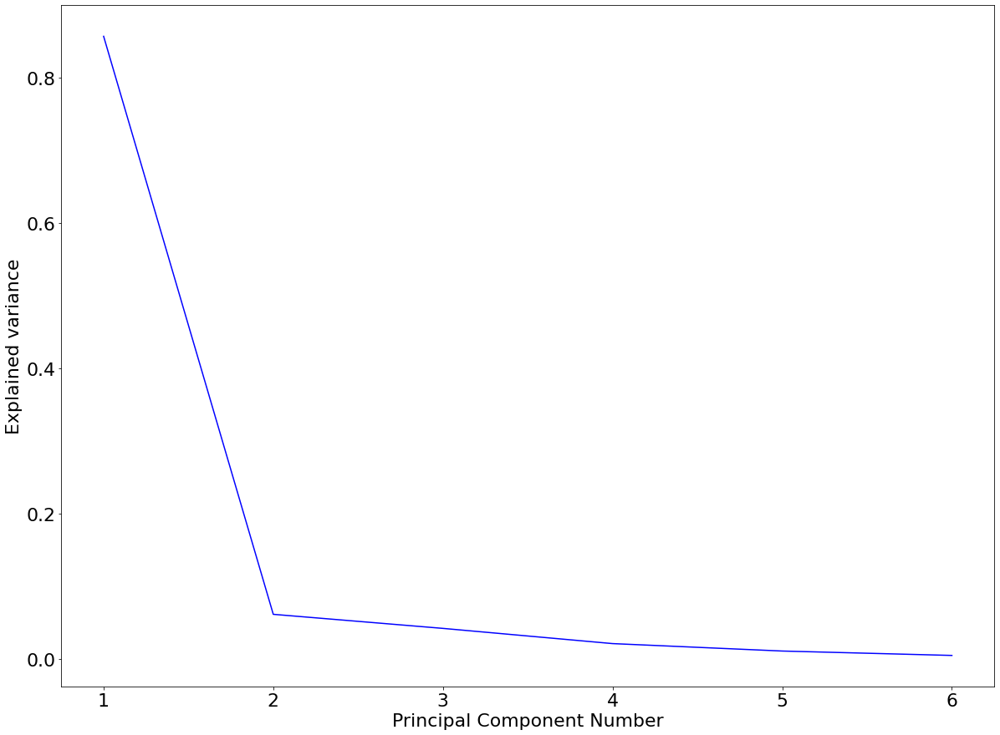

In [258]:
# Plot the variance explained.
#
plt.plot(range(1, len(selected_predictor_cols)+1), pc_values, 'b-')
plt.xlabel('Principal Component Number')
plt.ylabel('Explained variance')
plt.show(block=False)

Figure saved to figures\figure_7.png
Figure saved to figures\figure_7.pdf


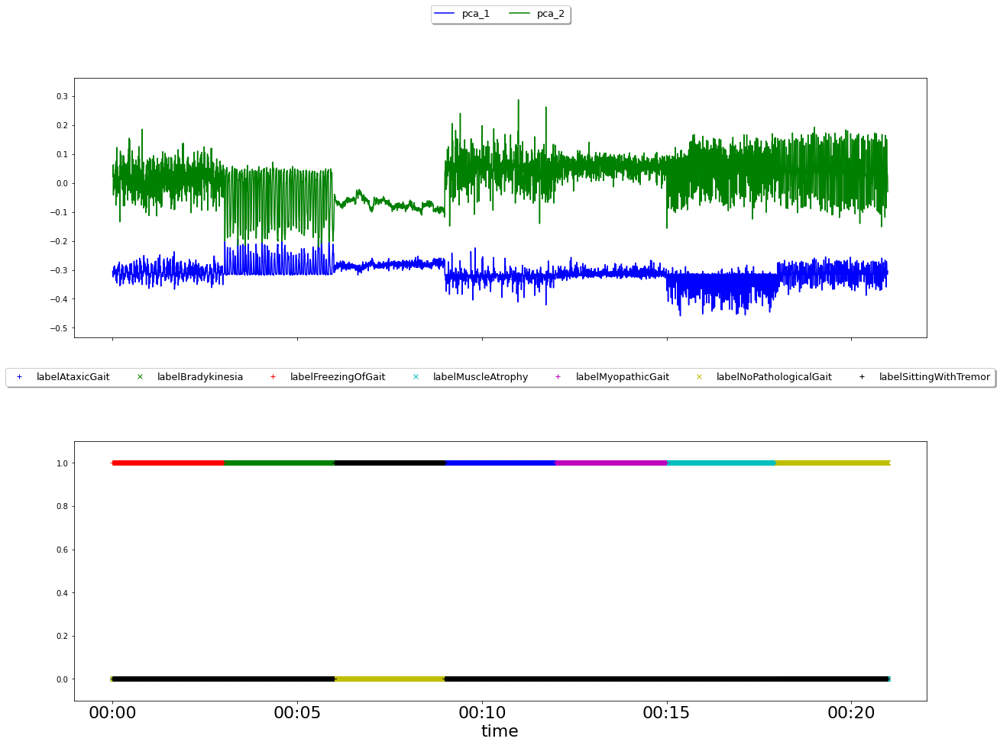

Figure saved to figures\figure_8.png
Figure saved to figures\figure_8.pdf


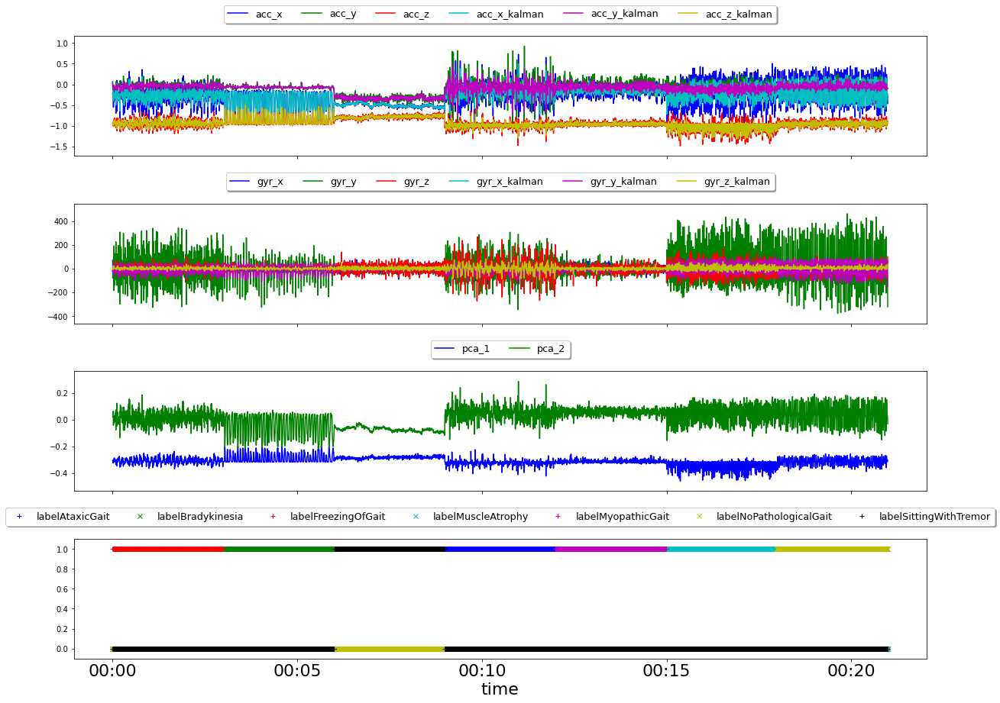

In [307]:
import copy 

n_pcs = 2
dataset = PCA.apply_pca(copy.deepcopy(kalman_dataset), selected_predictor_cols, n_pcs)

#And we visualize the result of the PC's
#
DataViz.plot_dataset(dataset[:int(len(dataset)/10)], ['pca_', 'label'], ['like', 'like'], ['line', 'points'])

# And the overall final dataset:
#
DataViz.plot_dataset(dataset[:int(len(dataset)/10)], ['acc_', 'gyr_', 'pca_', 'label'], 
                                                         ['like', 'like', 'like', 'like'], 
                                                             ['line', 'line', 'line', 'points'])

In [260]:
# Store the outcome.
#
dataset.to_csv('./parkinson_dataset/csv/chapter3_kalman_PCA.csv')

# Chapter 4

In [261]:
dataset = pd.read_csv('./parkinson_dataset/csv/chapter3_kalman_PCA.csv', index_col=0)

In [262]:
participant = len(dataset)/10
data = []
dataset.index = pd.to_datetime(dataset.index)

# split data into participants
#
ranges = np.arange(0,len(dataset)+int(len(dataset)/10),int(len(dataset)/10))
for i in range(10):
    data.append(dataset[ranges[i]:ranges[i+1]])

In [263]:
data[0].columns

Index(['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'labelAtaxicGait',
       'labelBradykinesia', 'labelFreezingOfGait', 'labelMuscleAtrophy',
       'labelMyopathicGait', 'labelNoPathologicalGait',
       'labelSittingWithTremor', 'acc_x_kalman', 'acc_y_kalman',
       'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman', 'pca_1',
       'pca_2'],
      dtype='object')

## Time domain: Numerical data

In [264]:
from Chapter4.TemporalAbstraction import NumericalAbstraction
import copy

### For gyr_x

Figure saved to figures\figure_14.png
Figure saved to figures\figure_14.pdf


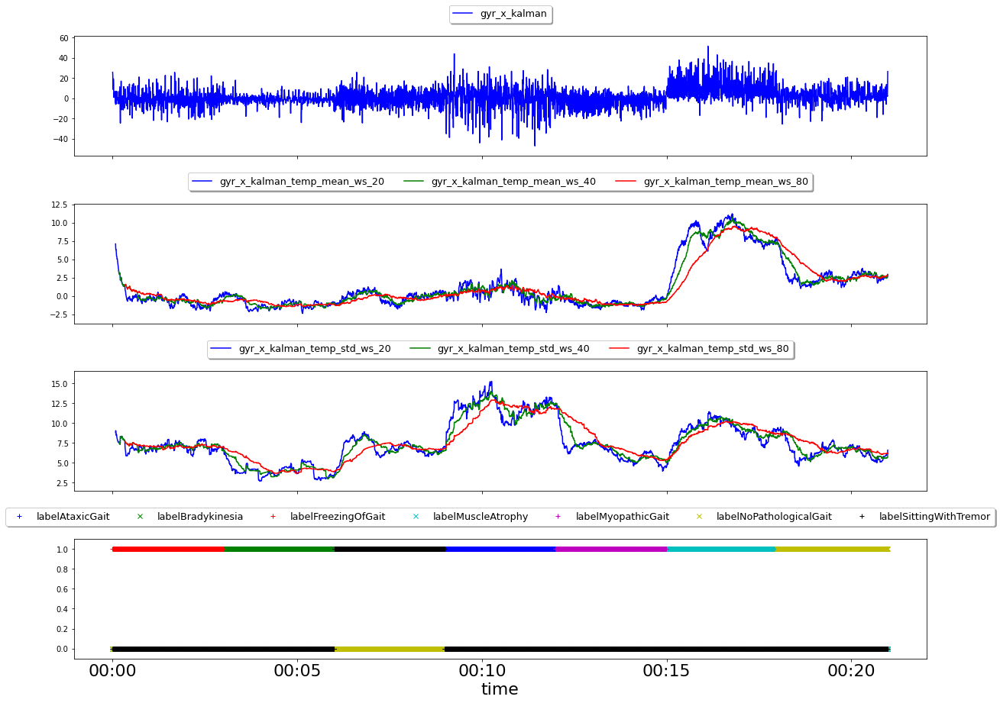

In [265]:
milliseconds_per_instance = (dataset.index[1] - dataset.index[0]).microseconds/1000

# Set the window sizes to the number of instances representing 5 seconds, 30 seconds and 5 minutes
window_sizes = [int(float(5000)/milliseconds_per_instance), int(float(10000)/milliseconds_per_instance), int(float(20000)/milliseconds_per_instance)]

NumAbs = NumericalAbstraction()

for dataset in data[:1]:
    dataset_copy = copy.deepcopy(dataset)
    
    for ws in window_sizes:
        dataset_copy = NumAbs.abstract_numerical(dataset_copy, ['gyr_x_kalman'], ws, 'mean')
        dataset_copy = NumAbs.abstract_numerical(dataset_copy, ['gyr_x_kalman'], ws, 'std')
    DataViz.plot_dataset(dataset_copy, ['gyr_x_kalman', 'gyr_x_kalman_temp_mean', 'gyr_x_kalman_temp_std', 'label'], ['exact', 'like', 'like', 'like'], ['line', 'line', 'line', 'points'])

In [266]:
from Chapter4.TemporalAbstraction import NumericalAbstraction
import copy

### For acc_x

Figure saved to figures\figure_15.png
Figure saved to figures\figure_15.pdf


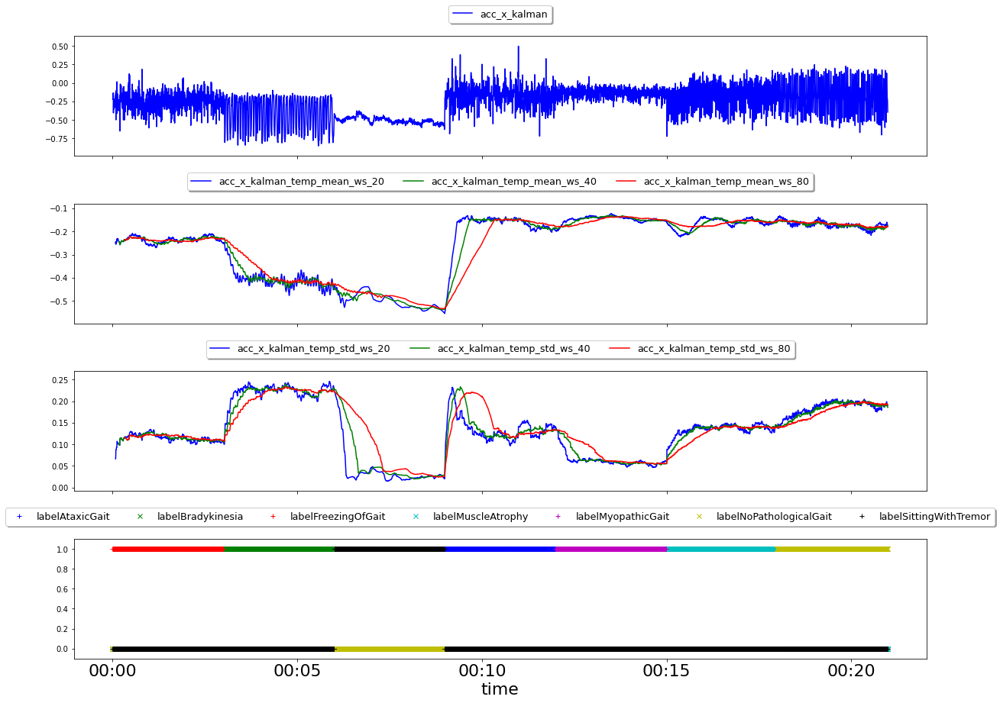

In [267]:
milliseconds_per_instance = (dataset.index[1] - dataset.index[0]).microseconds/1000

# Set the window sizes to the number of instances representing 5 seconds, 30 seconds and 5 minutes
window_sizes = [int(float(5000)/milliseconds_per_instance), int(float(10000)/milliseconds_per_instance), int(float(20000)/milliseconds_per_instance)]

NumAbs = NumericalAbstraction()

for dataset in data[:1]:
    dataset_copy = copy.deepcopy(dataset)
    
    for ws in window_sizes:
        dataset_copy = NumAbs.abstract_numerical(dataset_copy, ['acc_x_kalman'], ws, 'mean')
        dataset_copy = NumAbs.abstract_numerical(dataset_copy, ['acc_x_kalman'], ws, 'std')
    DataViz.plot_dataset(dataset_copy, ['acc_x_kalman', 'acc_x_kalman_temp_mean', 'acc_x_kalman_temp_std', 'label'], ['exact', 'like', 'like', 'like'], ['line', 'line', 'line', 'points'])

### Applied Time domin to all selected predictors

In [268]:
ws1 = int(float(10000)/milliseconds_per_instance)
ws2 = int(float(20000)/milliseconds_per_instance)    # Chosen Window size for further steps. 

for i, dataset in enumerate(data):
    selected_predictor_cols = [c for c in dataset.columns if 'kalman' in c]
    print (selected_predictor_cols)
    dataset = NumAbs.abstract_numerical(dataset, selected_predictor_cols, ws1, 'mean')
    dataset = NumAbs.abstract_numerical(dataset, selected_predictor_cols, ws1, 'std')
    dataset = NumAbs.abstract_numerical(dataset, selected_predictor_cols, ws2, 'mean')
    dataset = NumAbs.abstract_numerical(dataset, selected_predictor_cols, ws2, 'std')
    data[i] = dataset
    print (i)

['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
0
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
1
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
2
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
3
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
4
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
5
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
6
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
7
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
8
['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 'gyr_y_kalman', 'gyr_z_kalman']
9


In [269]:
# Use mean to fill NaN spaces.
#
for i, dataset in enumerate(data):
    for c in dataset.columns:
        if 'mean' in c or 'std' in c:
            data[i][c] = data[i][c].fillna(data[i][c].mean())

In [270]:
data[0]

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,labelAtaxicGait,labelBradykinesia,labelFreezingOfGait,labelMuscleAtrophy,...,acc_z_kalman_temp_mean_ws_80,gyr_x_kalman_temp_mean_ws_80,gyr_y_kalman_temp_mean_ws_80,gyr_z_kalman_temp_mean_ws_80,acc_x_kalman_temp_std_ws_80,acc_y_kalman_temp_std_ws_80,acc_z_kalman_temp_std_ws_80,gyr_x_kalman_temp_std_ws_80,gyr_y_kalman_temp_std_ws_80,gyr_z_kalman_temp_std_ws_80
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
1970-01-01 00:00:00.000,-0.227779,0.067886,-0.957119,67.3792,-21.2604,-18.1216,0,0,1,0,...,-0.929696,1.177348,-4.201730,1.583753,0.134988,0.066293,0.065393,7.579697,24.608538,11.969884
1970-01-01 00:00:00.250,-0.222094,-0.102875,-0.989630,-0.5012,-78.9236,2.9176,0,0,1,0,...,-0.929696,1.177348,-4.201730,1.583753,0.134988,0.066293,0.065393,7.579697,24.608538,11.969884
1970-01-01 00:00:00.500,-0.216042,-0.068632,-0.959530,-5.0232,-1.6800,5.5412,0,0,1,0,...,-0.929696,1.177348,-4.201730,1.583753,0.134988,0.066293,0.065393,7.579697,24.608538,11.969884
1970-01-01 00:00:00.750,-0.190950,-0.060995,-0.983296,7.5208,-9.1392,7.5068,0,0,1,0,...,-0.929696,1.177348,-4.201730,1.583753,0.134988,0.066293,0.065393,7.579697,24.608538,11.969884
1970-01-01 00:00:01.000,-0.096629,-0.119921,-1.010614,-5.8156,-78.8172,25.2728,0,0,1,0,...,-0.929696,1.177348,-4.201730,1.583753,0.134988,0.066293,0.065393,7.579697,24.608538,11.969884
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1970-01-01 00:20:58.250,-0.222728,-0.076270,-0.956353,1.5652,-6.6192,4.4212,0,0,0,0,...,-0.960543,2.808531,-1.362292,4.135466,0.193504,0.049768,0.044317,6.170478,47.211343,8.379081
1970-01-01 00:20:58.500,-0.221293,-0.084034,-0.956826,4.3540,-1.8340,5.4012,0,0,0,0,...,-0.960730,2.855753,-1.679718,4.117911,0.192762,0.048534,0.044181,6.113403,46.931635,8.373891
1970-01-01 00:20:58.750,-0.217907,-0.088948,-0.956143,-0.7140,-6.7788,3.0884,0,0,0,0,...,-0.960961,2.822722,-1.903501,4.095051,0.192239,0.048339,0.043965,6.090193,46.797992,8.365400


## Frequency Domain: Fourier Transformations and Features 

In [271]:
from Chapter4.FrequencyAbstraction import FourierTransformation

import warnings
warnings.filterwarnings("ignore")

Person 0...
Figure saved to figures\figure_16.png
Figure saved to figures\figure_16.pdf


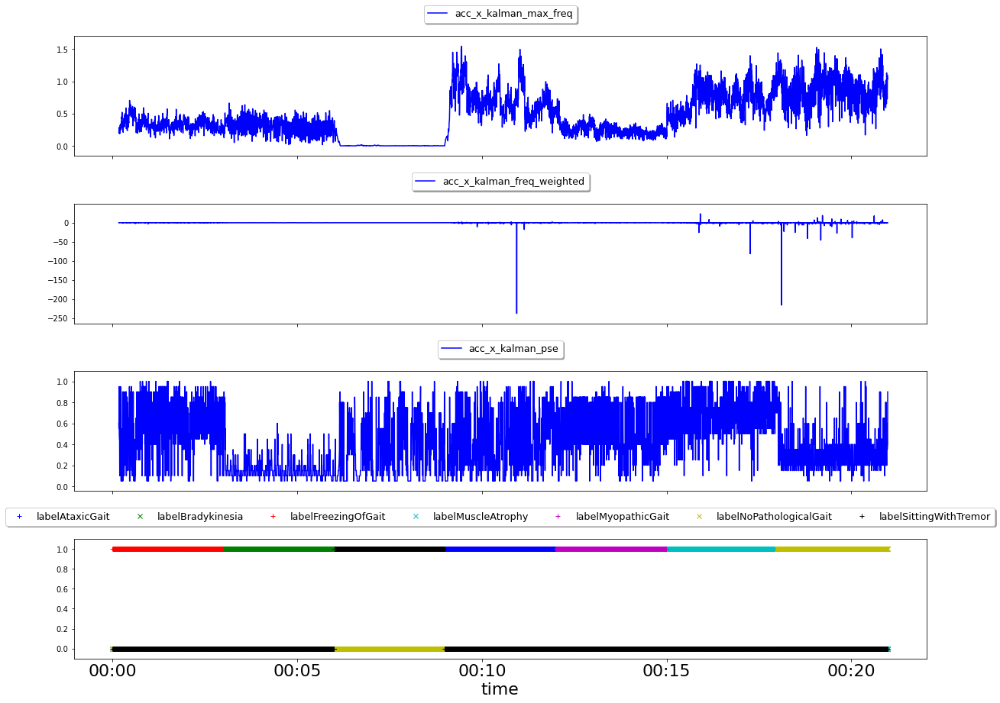

Figure saved to figures\figure_17.png
Figure saved to figures\figure_17.pdf


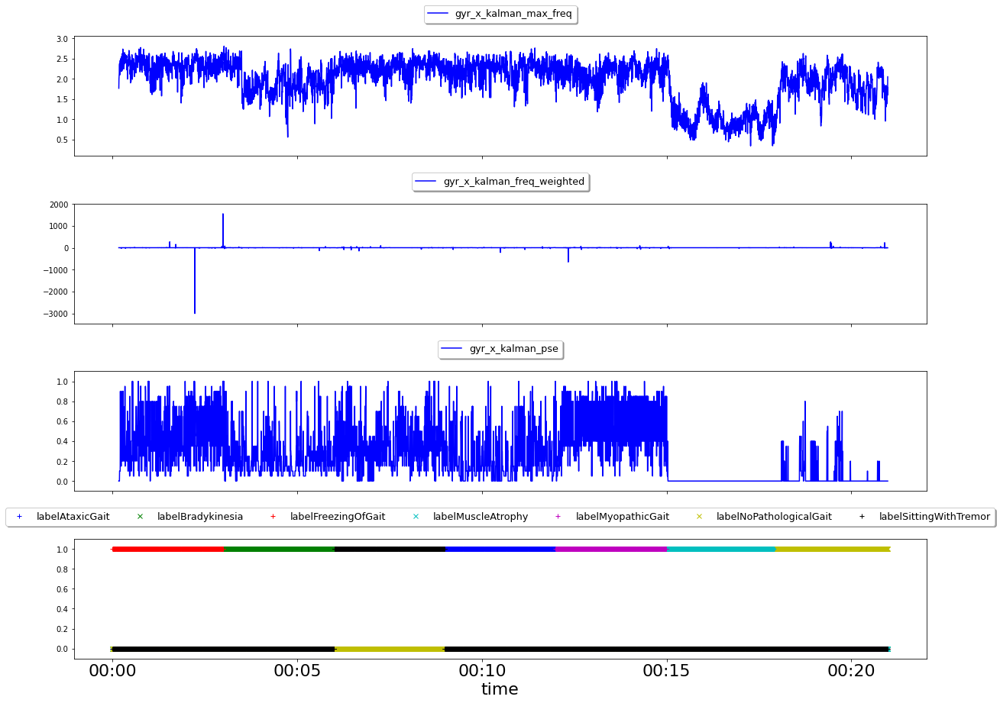

Person 1...
Figure saved to figures\figure_18.png
Figure saved to figures\figure_18.pdf


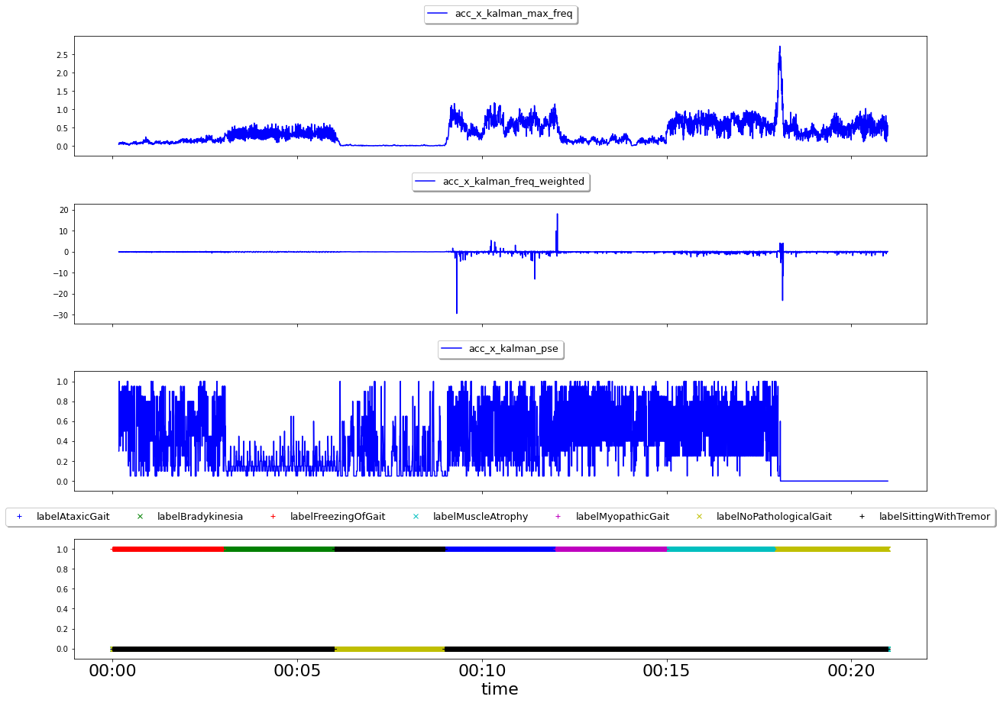

Figure saved to figures\figure_19.png
Figure saved to figures\figure_19.pdf


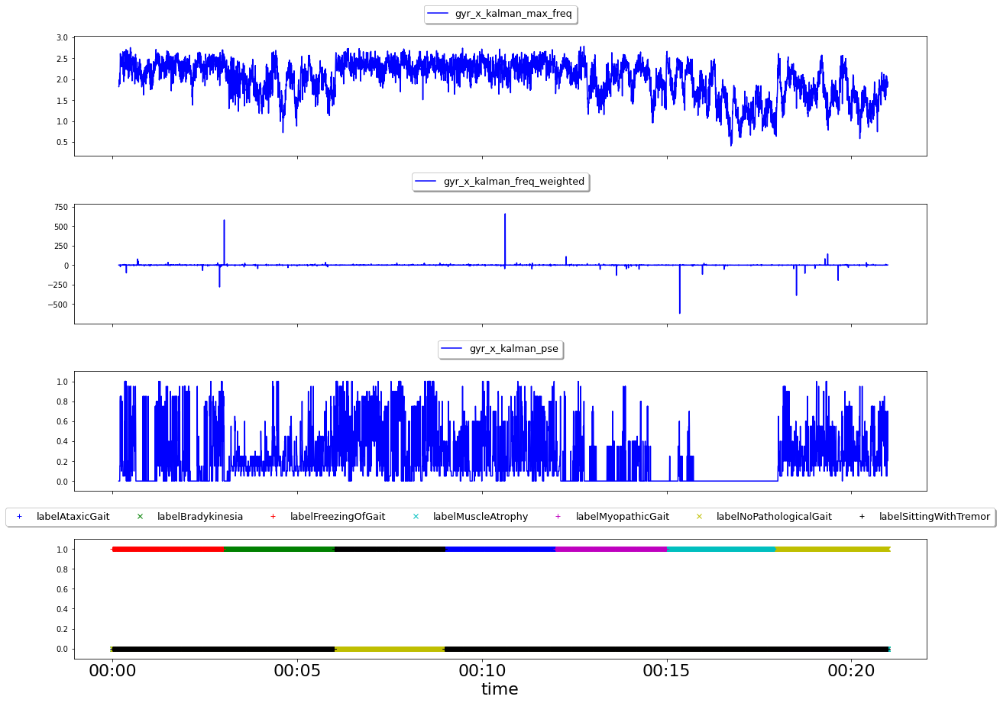

Person 2...
Figure saved to figures\figure_20.png
Figure saved to figures\figure_20.pdf


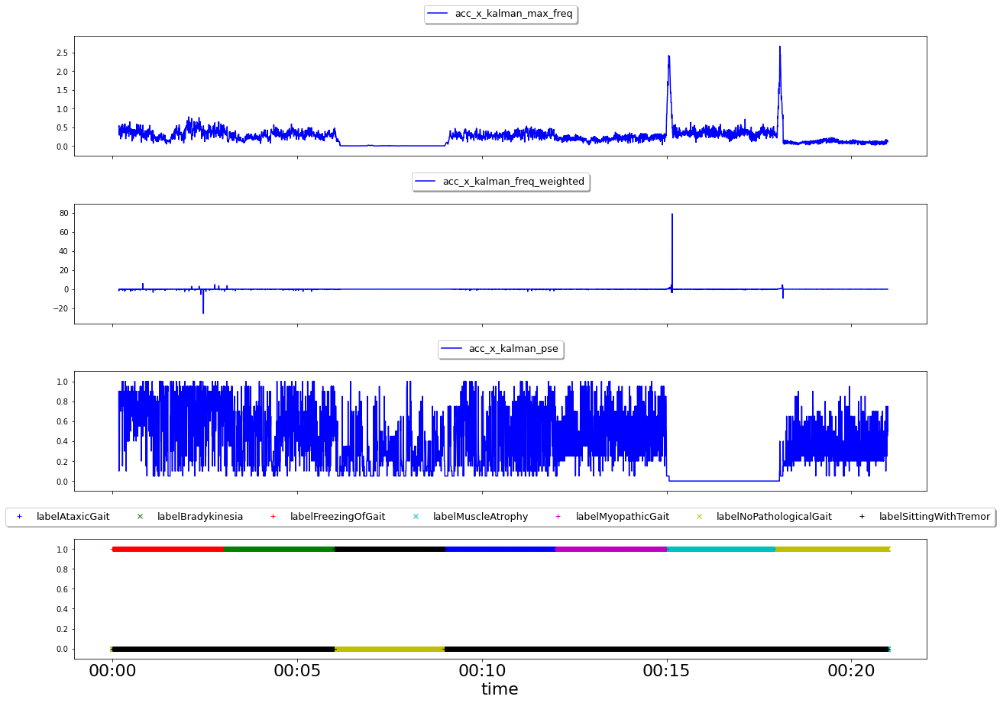

Figure saved to figures\figure_21.png
Figure saved to figures\figure_21.pdf


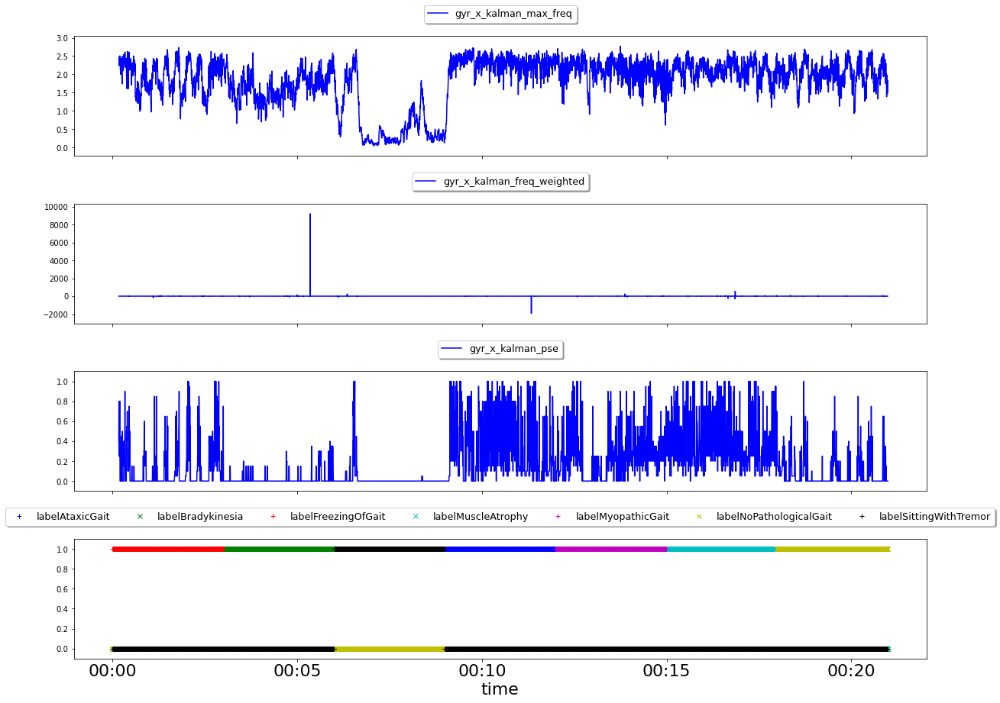

Person 3...
Figure saved to figures\figure_22.png
Figure saved to figures\figure_22.pdf


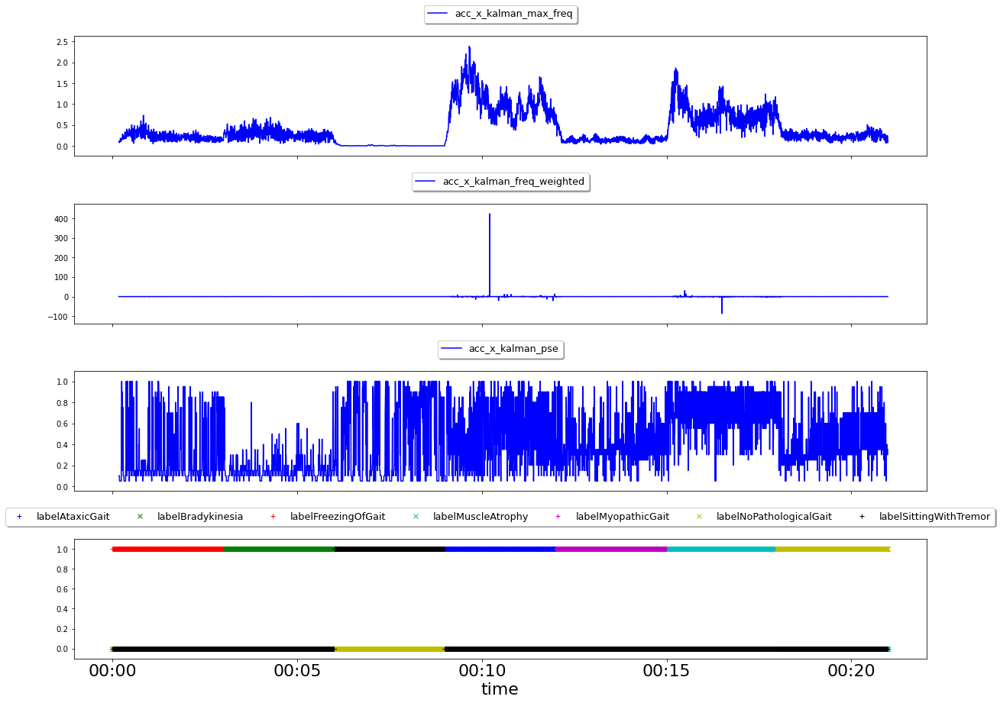

Figure saved to figures\figure_23.png
Figure saved to figures\figure_23.pdf


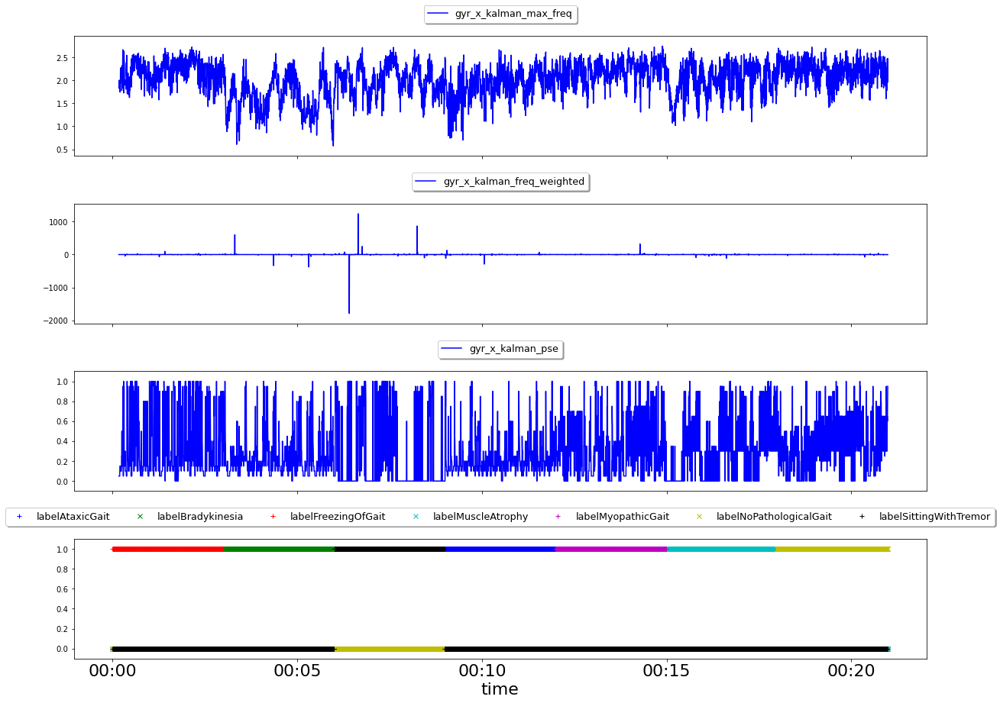

Person 4...
Figure saved to figures\figure_24.png
Figure saved to figures\figure_24.pdf


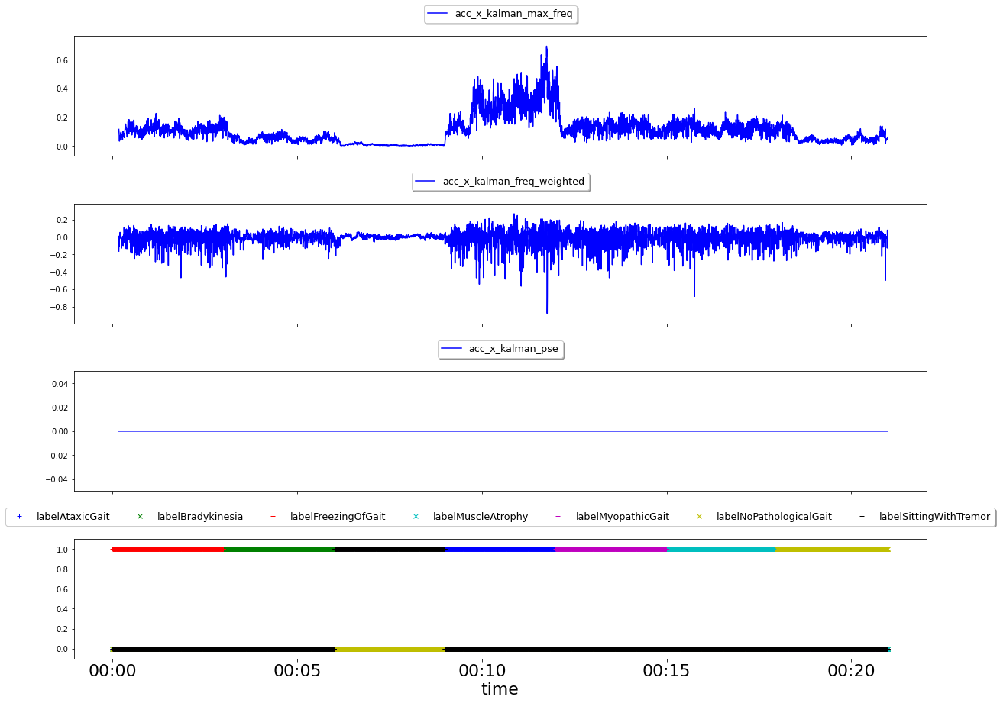

Figure saved to figures\figure_25.png
Figure saved to figures\figure_25.pdf


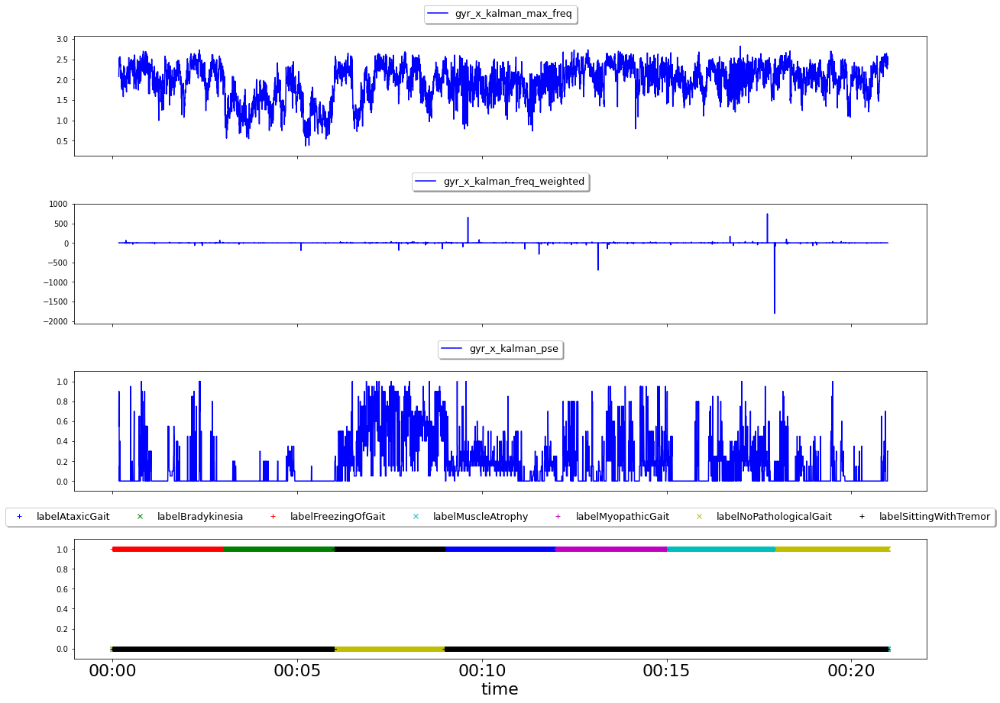

Person 5...
Figure saved to figures\figure_26.png
Figure saved to figures\figure_26.pdf


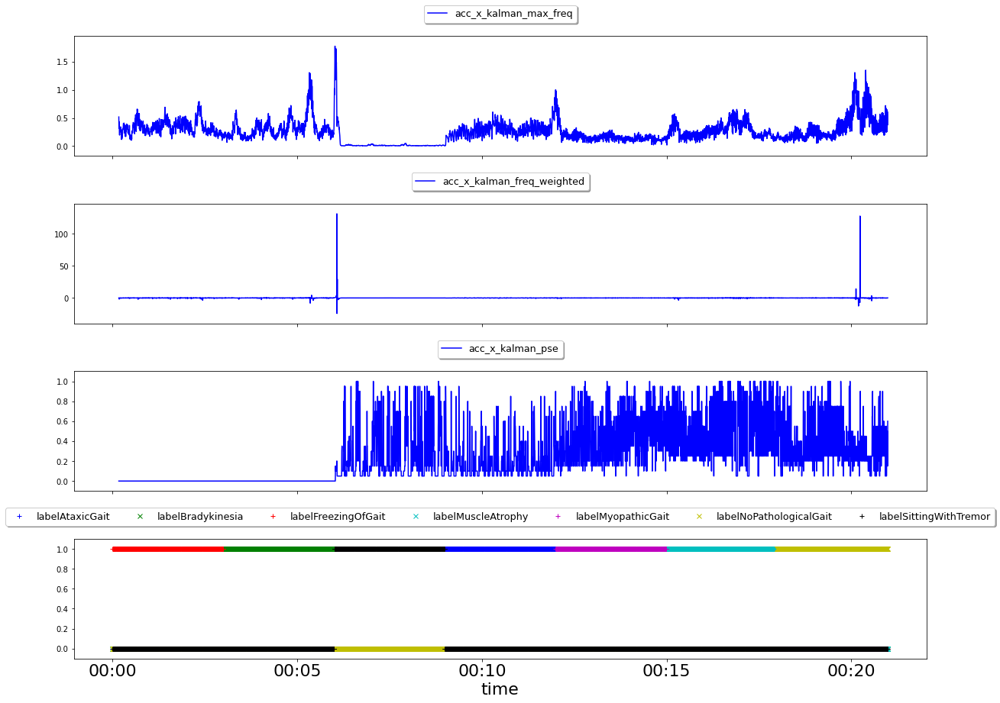

Figure saved to figures\figure_27.png
Figure saved to figures\figure_27.pdf


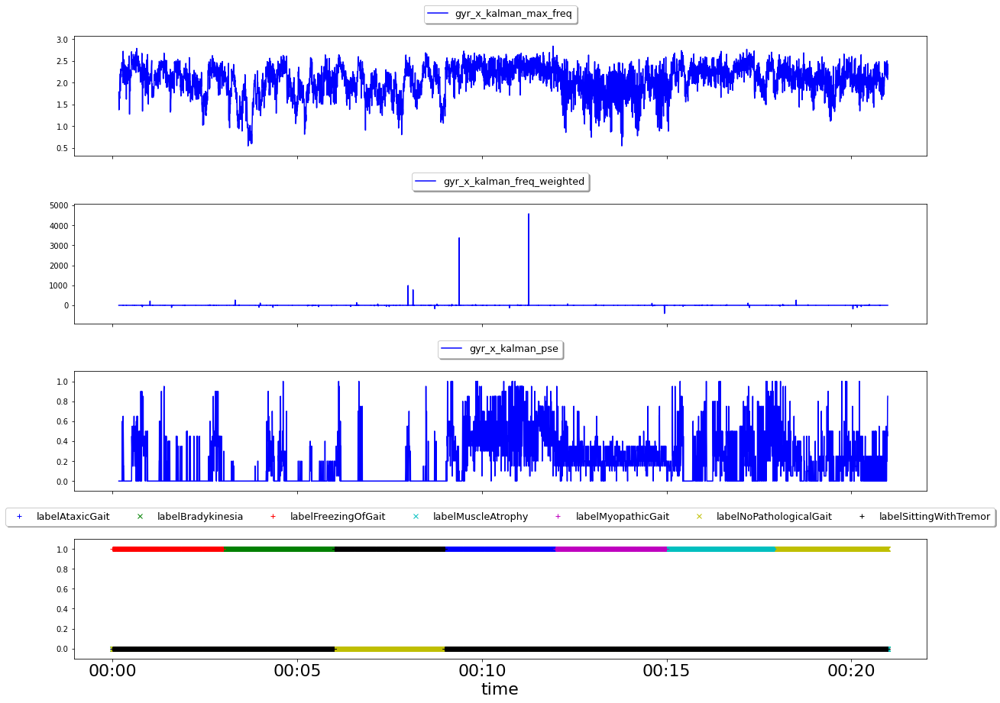

Person 6...
Figure saved to figures\figure_28.png
Figure saved to figures\figure_28.pdf


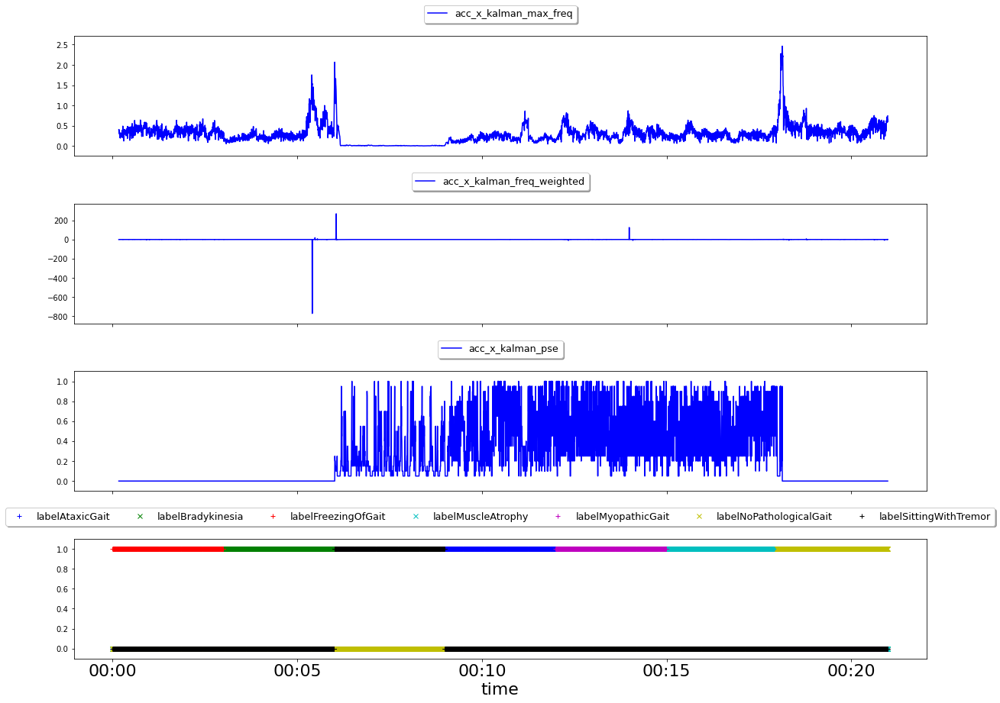

Figure saved to figures\figure_29.png
Figure saved to figures\figure_29.pdf


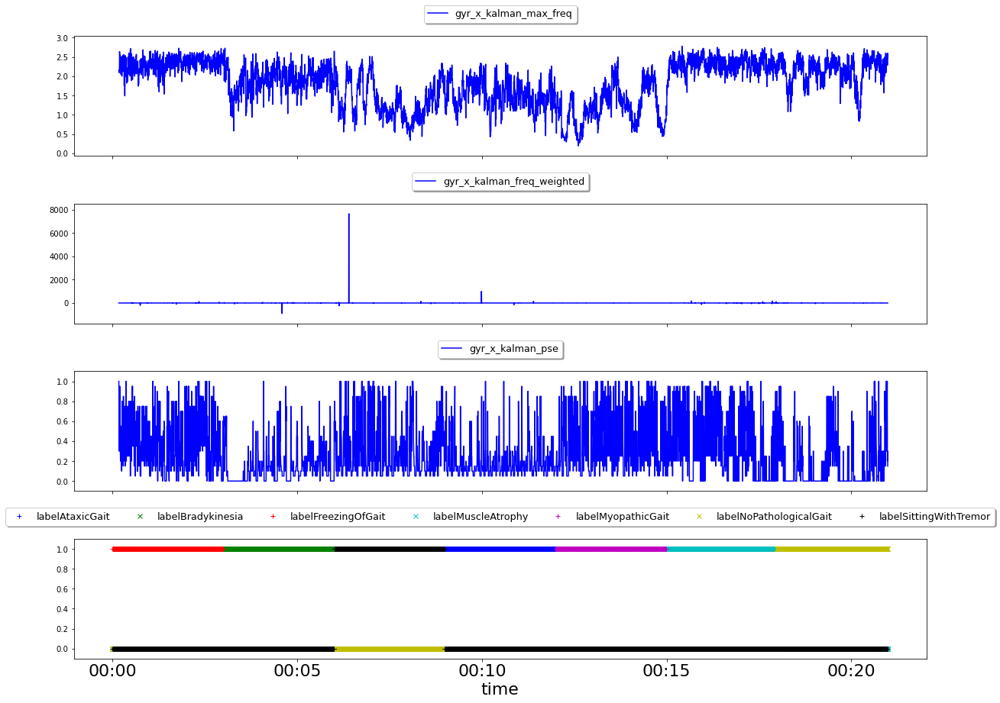

Person 7...
Figure saved to figures\figure_30.png
Figure saved to figures\figure_30.pdf


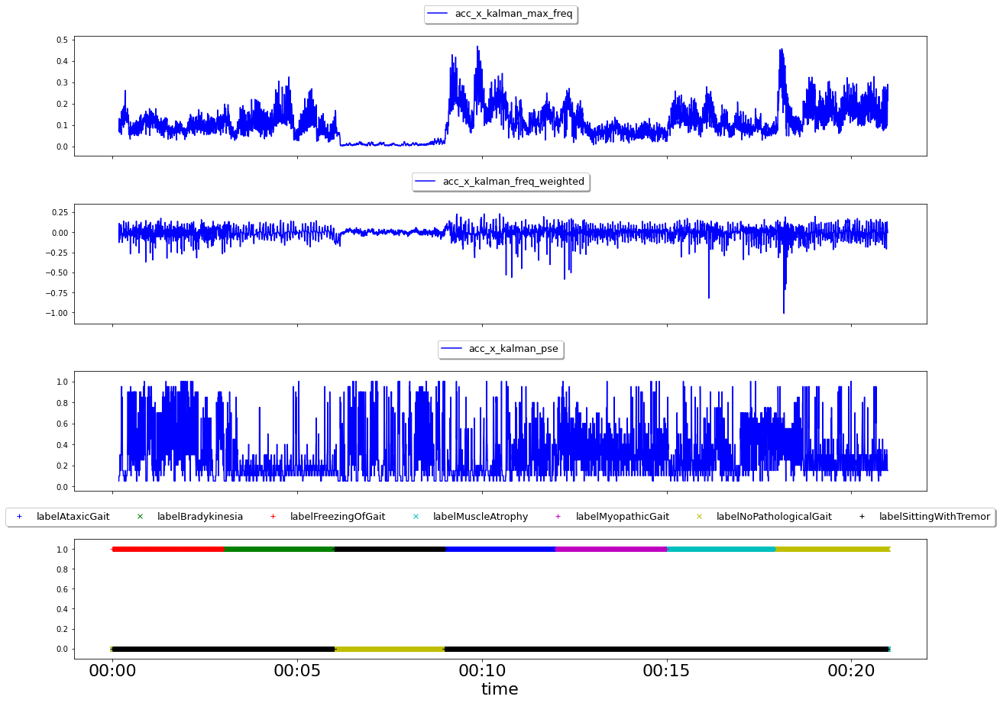

Figure saved to figures\figure_31.png
Figure saved to figures\figure_31.pdf


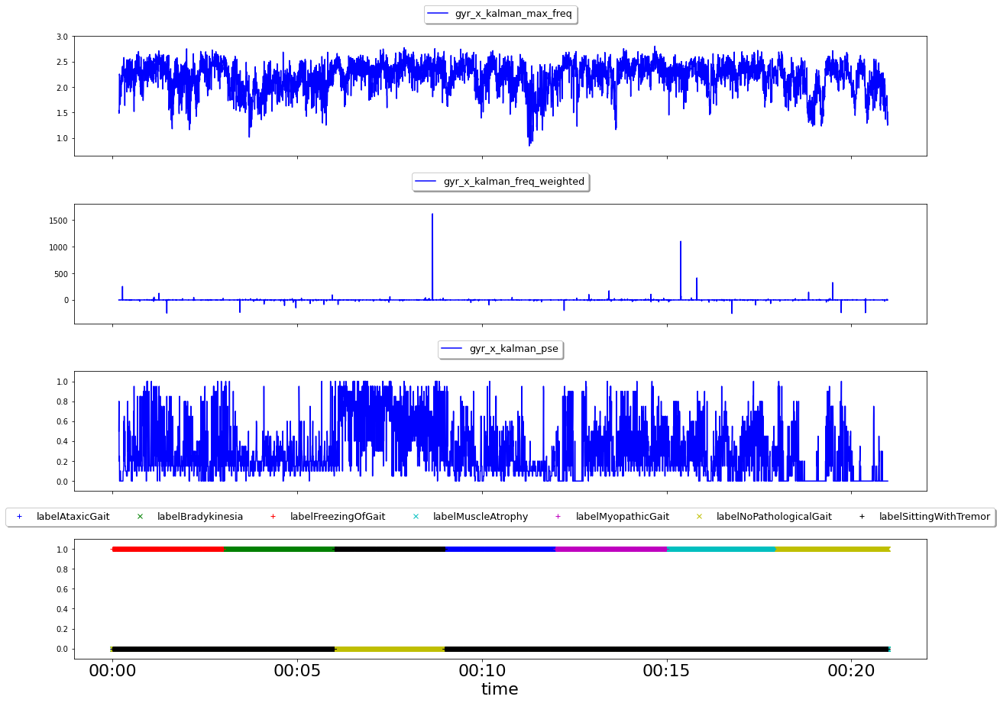

Person 8...
Figure saved to figures\figure_32.png
Figure saved to figures\figure_32.pdf


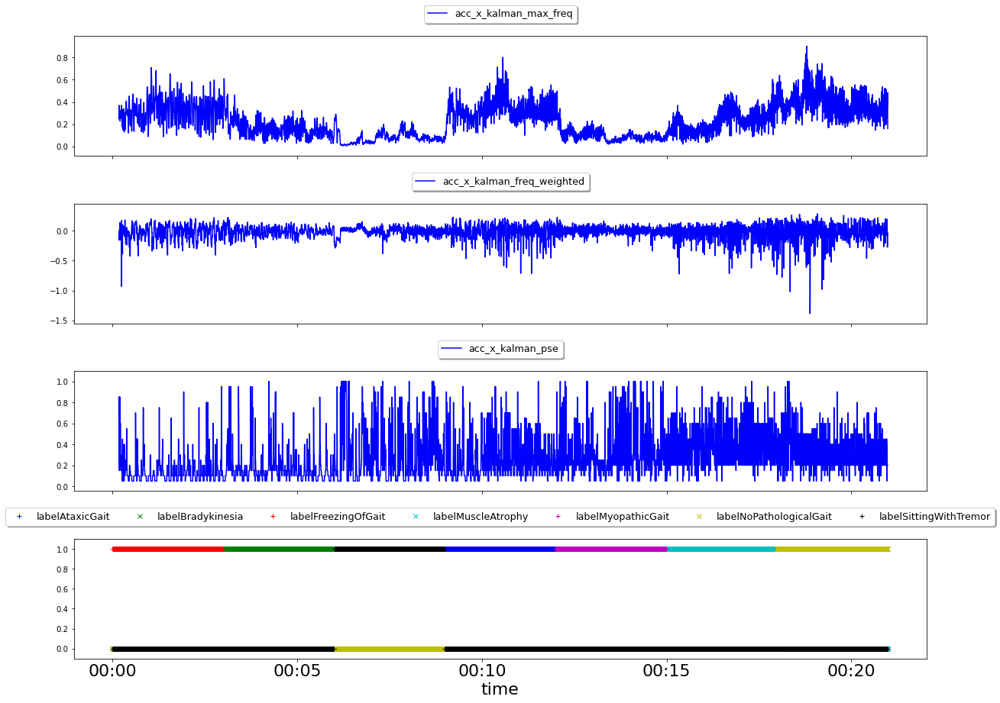

Figure saved to figures\figure_33.png
Figure saved to figures\figure_33.pdf


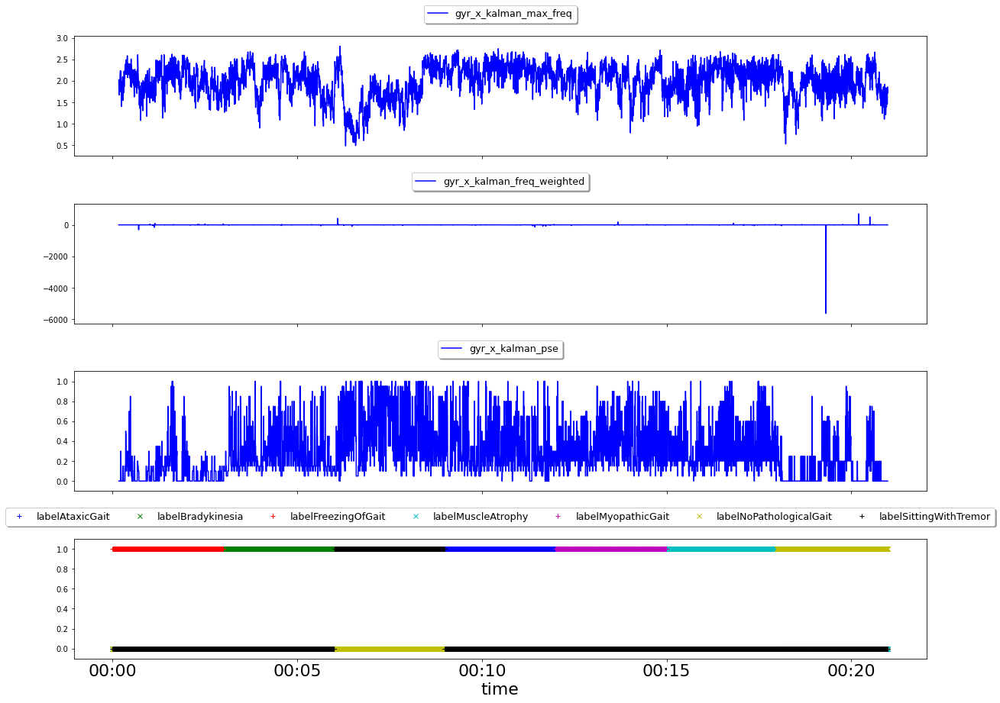

Person 9...
Figure saved to figures\figure_34.png
Figure saved to figures\figure_34.pdf


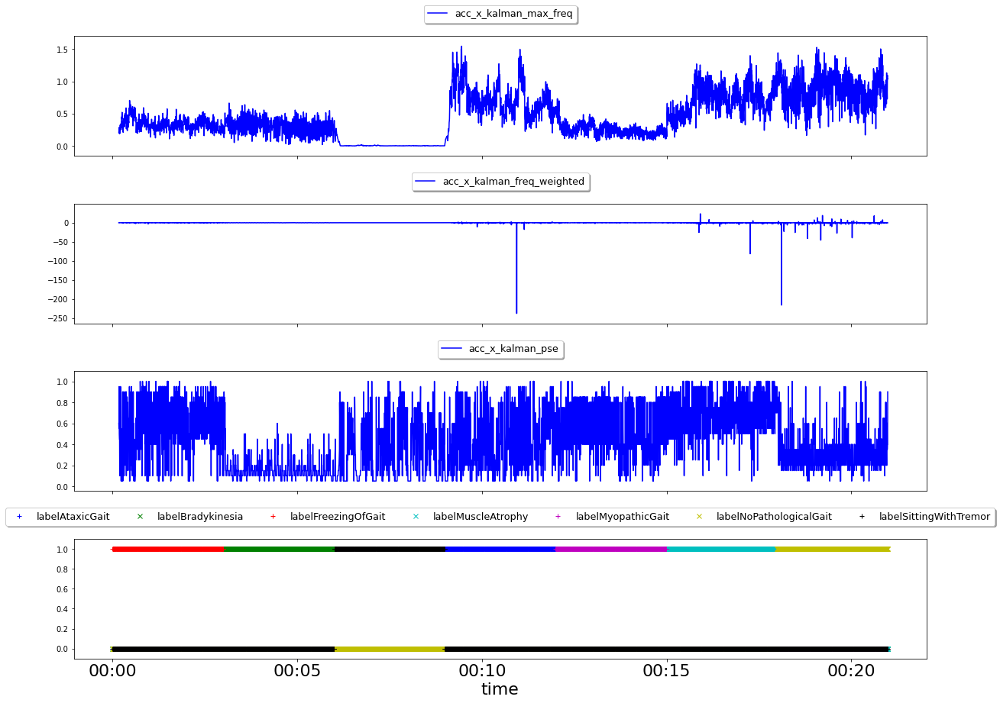

Figure saved to figures\figure_35.png
Figure saved to figures\figure_35.pdf


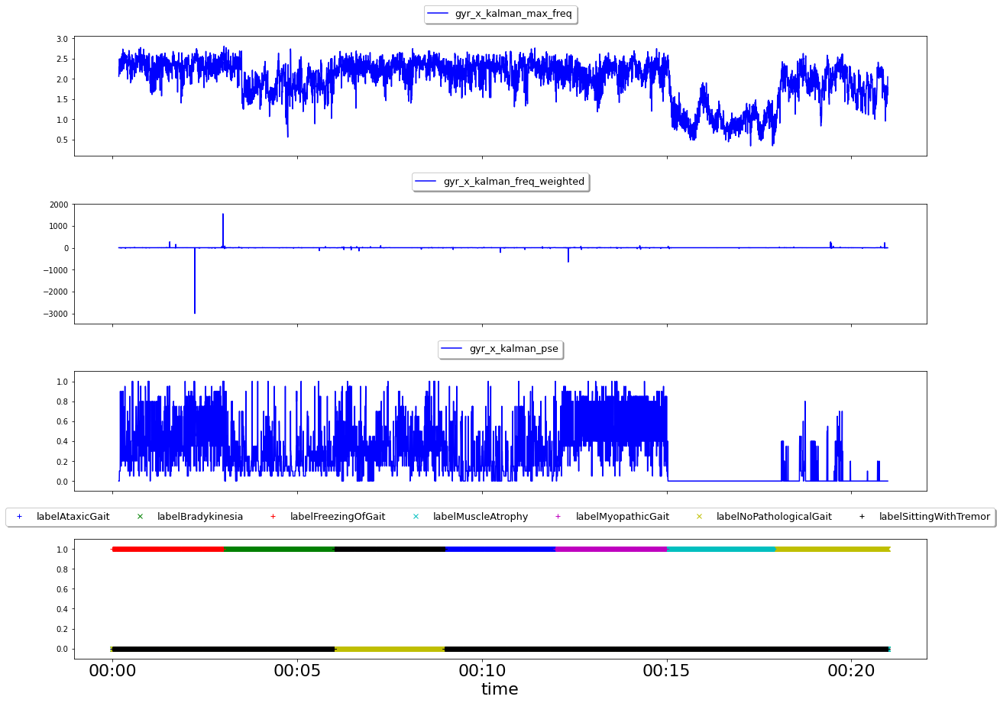

In [272]:
FreqAbs = FourierTransformation()
fs = float(1000)/500
ws = ws1                    # Same window size.
data_fourier = []

for i, dataset in enumerate(data):
    print (f'Person {i}...')
    periodic_predictor_cols = ['acc_x_kalman', 'acc_y_kalman', 'acc_z_kalman', 'gyr_x_kalman', 
                                   'gyr_y_kalman', 'gyr_z_kalman']
    
    dataset = FreqAbs.abstract_frequency(dataset, periodic_predictor_cols, int(float(10000)/milliseconds_per_instance), fs)
    
    DataViz.plot_dataset(dataset, ['acc_x_kalman_max_freq', 'acc_x_kalman_freq_weighted', 'acc_x_kalman_pse', 'label'], 
                                     ['like', 'like', 'like', 'like'], ['line', 'line', 'line','points'])
    DataViz.plot_dataset(dataset, ['gyr_x_kalman_max_freq', 'gyr_x_kalman_freq_weighted', 'gyr_x_kalman_pse', 'label'], 
                                     ['like', 'like', 'like', 'like'], ['line', 'line', 'line','points'])

    window_overlap = 0.9
    skip_points = int((1-window_overlap) * ws)
    dataset = dataset.iloc[::skip_points,:]

    dataset.to_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{i}.csv')

# Chapter 5 - Clustering

## Indiviudal People Clustering

In [273]:
pip install pyclust

Note: you may need to restart the kernel to use updated packages.


In [274]:
pip install treelib

In [275]:
def ch4_combined():
    source = './parkinson_dataset/csv/chapter_4/'
    for root, dirs, filenames in os.walk(source):
        for fn in filenames:
            datasets.append(pd.read_csv(source+fn))
            
    return datasets

In [276]:
from Chapter5.DistanceMetrics import InstanceDistanceMetrics
from Chapter5.DistanceMetrics import PersonDistanceMetricsNoOrdering
from Chapter5.DistanceMetrics import PersonDistanceMetricsOrdering
from Chapter5.Clustering import NonHierarchicalClustering
from Chapter5.Clustering import HierarchicalClustering
import util.util as util
from util.VisualizeDataset import VisualizeDataset

### K-means

===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.6295307709765509
k = 3
silhouette = 0.5290594707157822
k = 4
silhouette = 0.48252935870718044
k = 5
silhouette = 0.44614381166954004
k = 6
silhouette = 0.4424854182706928
k = 7
silhouette = 0.44173707058867784
k = 8
silhouette = 0.4326788368659136
k = 9
silhouette = 0.4334919085353171
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


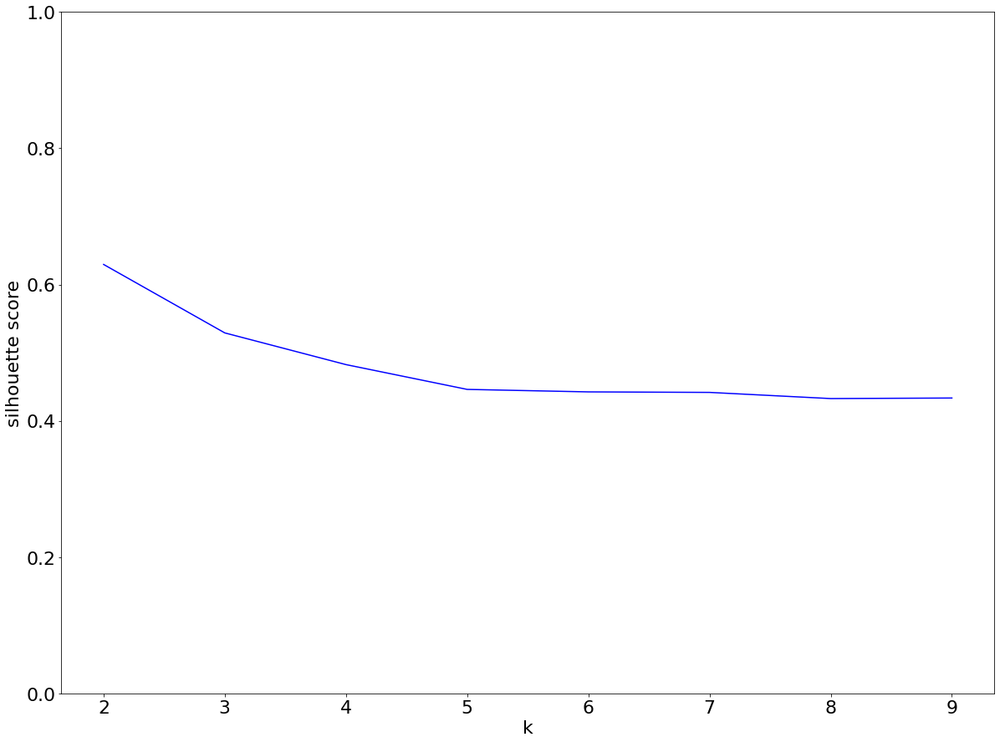

Highest K-Means silhouette score for Person 0: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


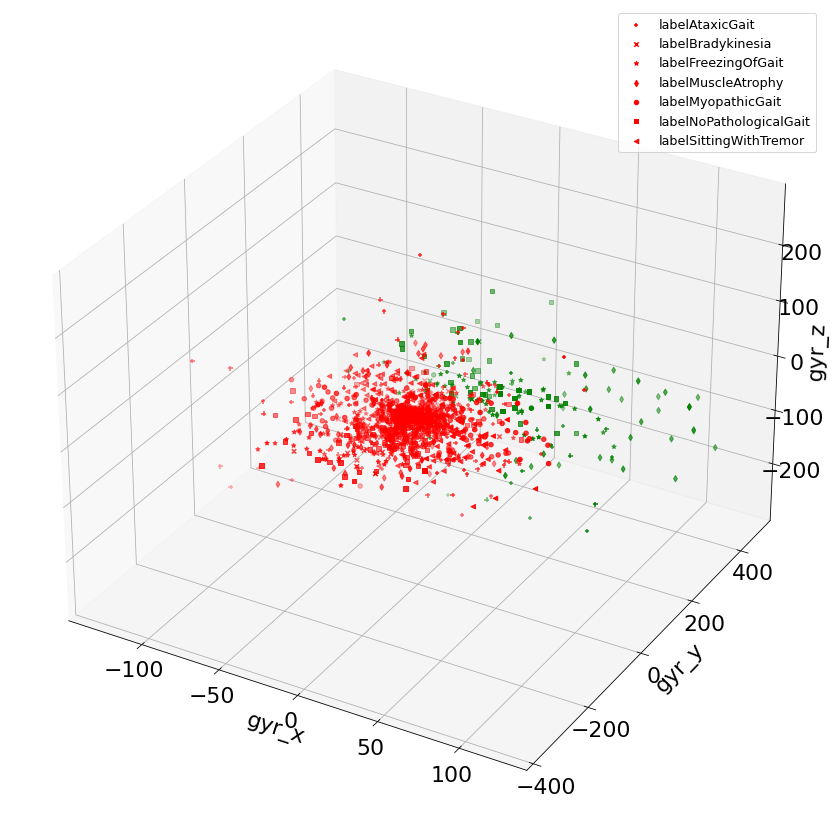

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


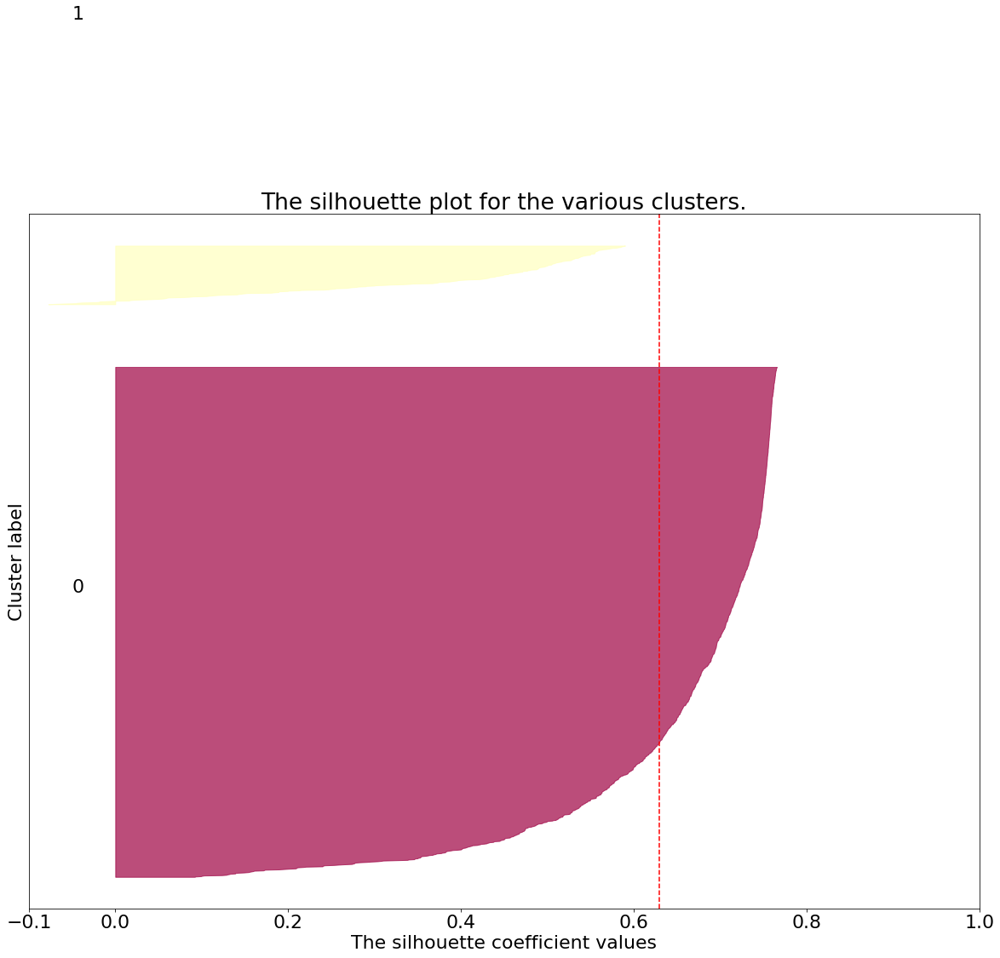

\multirow{2}{*}{ gyr_x } & mean  &  -0.82 &  27.28\\
 & std  &  22.15 &  40.17\\
\multirow{2}{*}{ gyr_y } & mean  &  -25.60 &  198.42\\
 & std  &  61.44 &  89.08\\
\multirow{2}{*}{ gyr_z } & mean  &  4.05 &  -30.65\\
 & std  &  34.61 &  57.23\\
labelAtaxicGait  & percentage  &  86.67 \% &  13.33 \%\\
labelBradykinesia  & percentage  &  97.08 \% &  2.92 \%\\
labelFreezingOfGait  & percentage  &  78.75 \% &  21.25 \%\\
labelMuscleAtrophy  & percentage  &  85.36 \% &  14.64 \%\\
labelMyopathicGait  & percentage  &  99.17 \% &  0.83 \%\\
labelNoPathologicalGait  & percentage  &  80.83 \% &  19.17 \%\\
labelSittingWithTremor  & percentage  &  100.00 \% &  0.00 \%\\
Person 0 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.5511947328018706
k = 3
silhouette = 0.5734005962076554
k = 4
silhouette = 0.5344577407842551
k = 5
silhouette = 0.5396899175686469
k = 6
silhouette = 0.5042507688325147
k = 7
silhouette = 0.4890638078010729
k = 8
silhouette = 0.503051544500

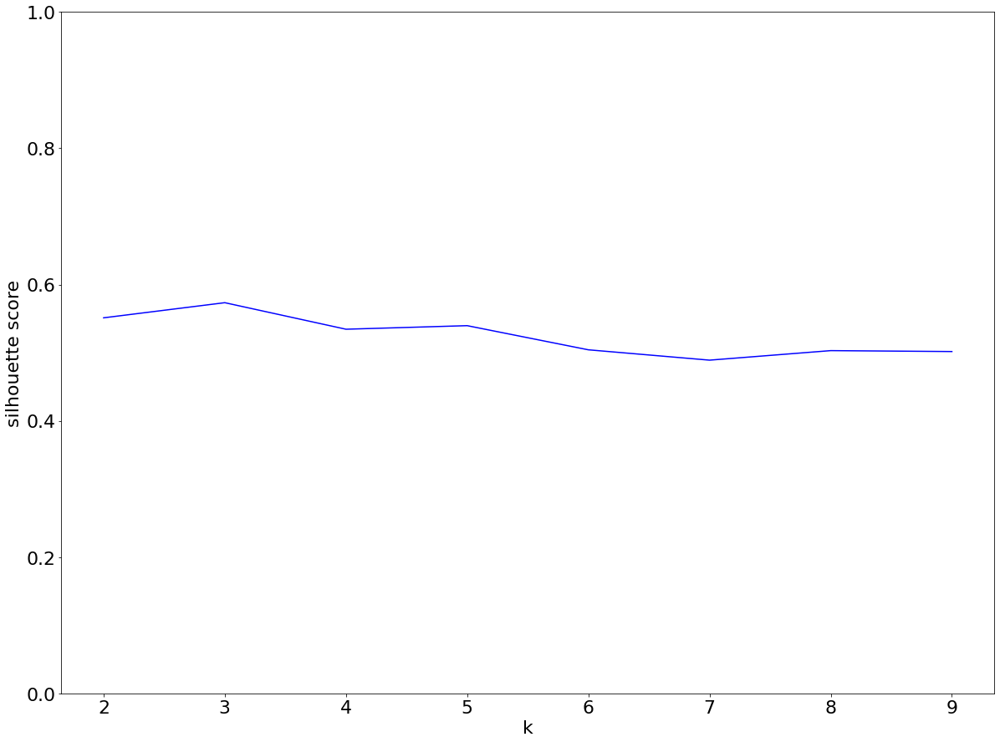

Highest K-Means silhouette score for Person 1: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


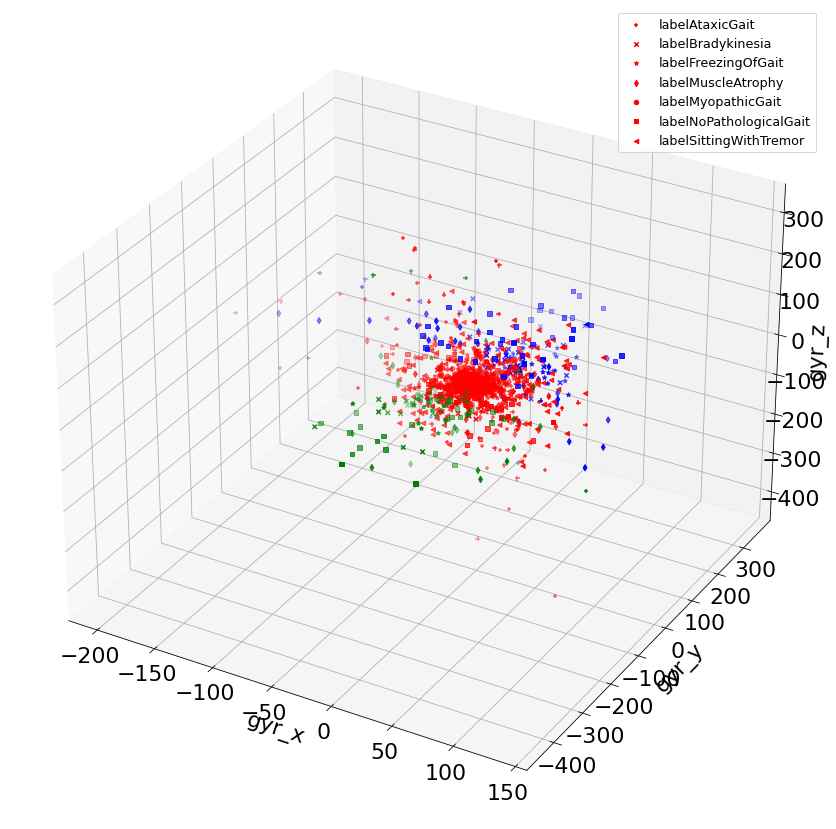

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


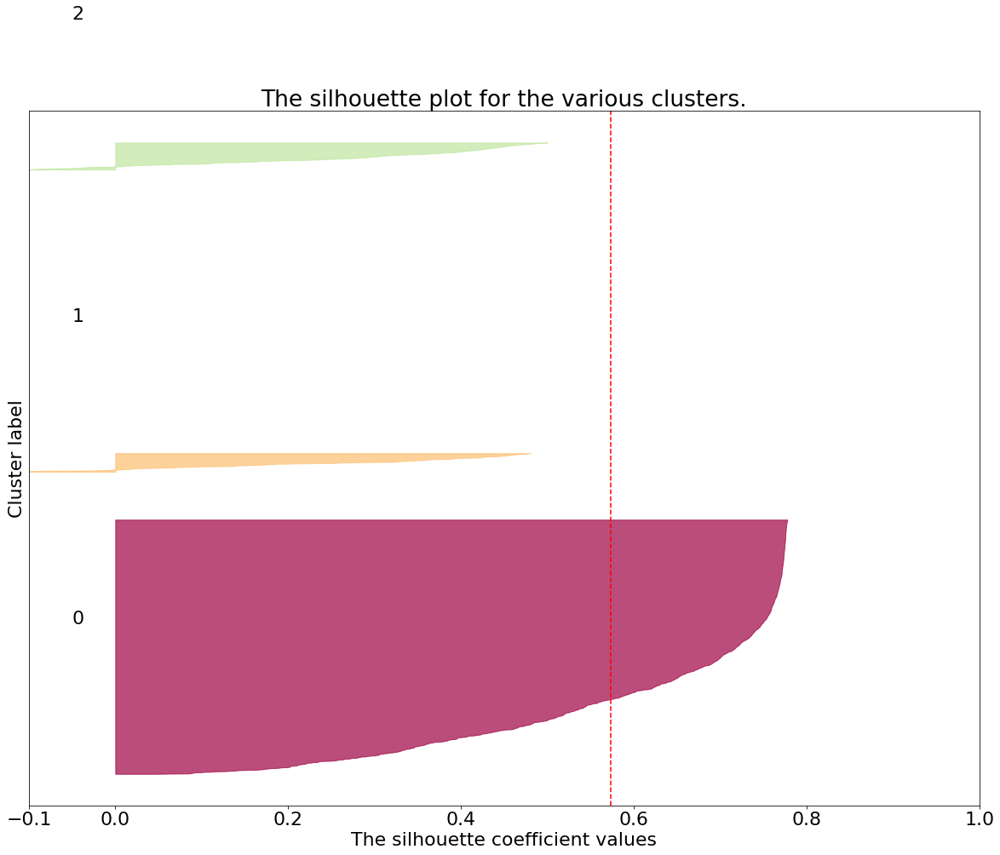

\multirow{2}{*}{ gyr_x } & mean  &  0.02 &  -3.96 &  -5.76\\
 & std  &  22.31 &  43.55 &  43.12\\
\multirow{2}{*}{ gyr_y } & mean  &  -5.51 &  -164.03 &  139.26\\
 & std  &  27.36 &  79.77 &  66.99\\
\multirow{2}{*}{ gyr_z } & mean  &  -1.08 &  35.14 &  -22.68\\
 & std  &  43.26 &  65.44 &  54.00\\
labelAtaxicGait  & percentage  &  93.75 \% &  3.33 \% &  2.92 \%\\
labelBradykinesia  & percentage  &  79.17 \% &  7.08 \% &  13.75 \%\\
labelFreezingOfGait  & percentage  &  73.75 \% &  12.50 \% &  13.75 \%\\
labelMuscleAtrophy  & percentage  &  76.99 \% &  8.79 \% &  14.23 \%\\
labelMyopathicGait  & percentage  &  100.00 \% &  0.00 \% &  0.00 \%\\
labelNoPathologicalGait  & percentage  &  70.00 \% &  12.08 \% &  17.92 \%\\
labelSittingWithTremor  & percentage  &  99.17 \% &  0.00 \% &  0.83 \%\\
Person 1 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.6014315502122314
k = 3
silhouette = 0.6358569140332649
k = 4
silhouette = 0.5869260404948012
k = 5
silhoue

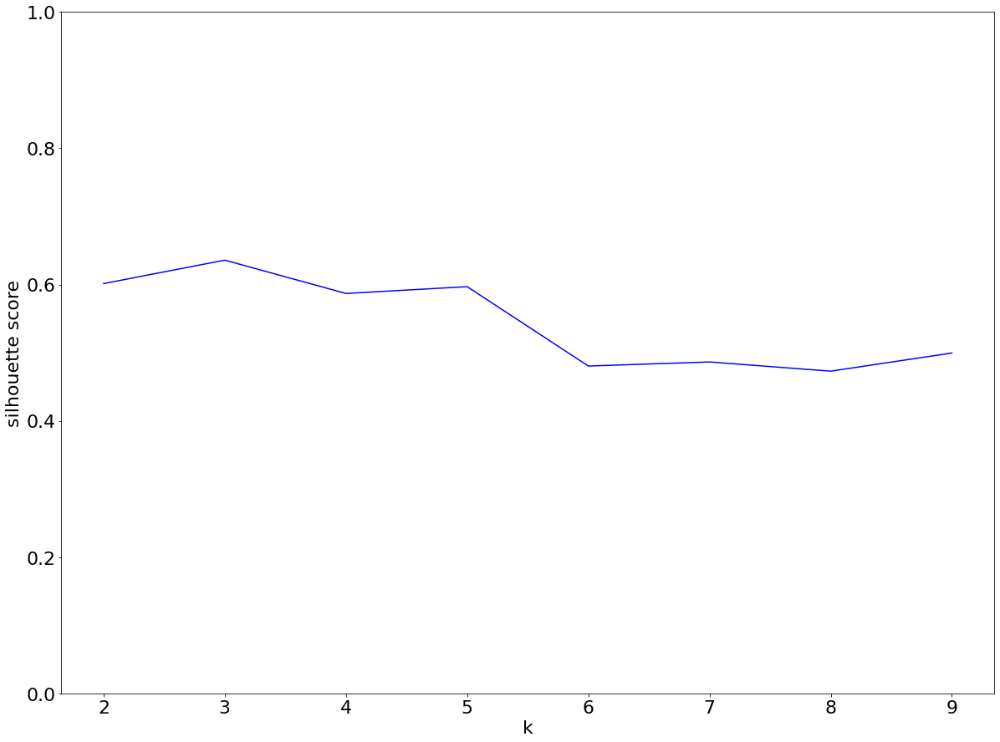

Highest K-Means silhouette score for Person 2: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


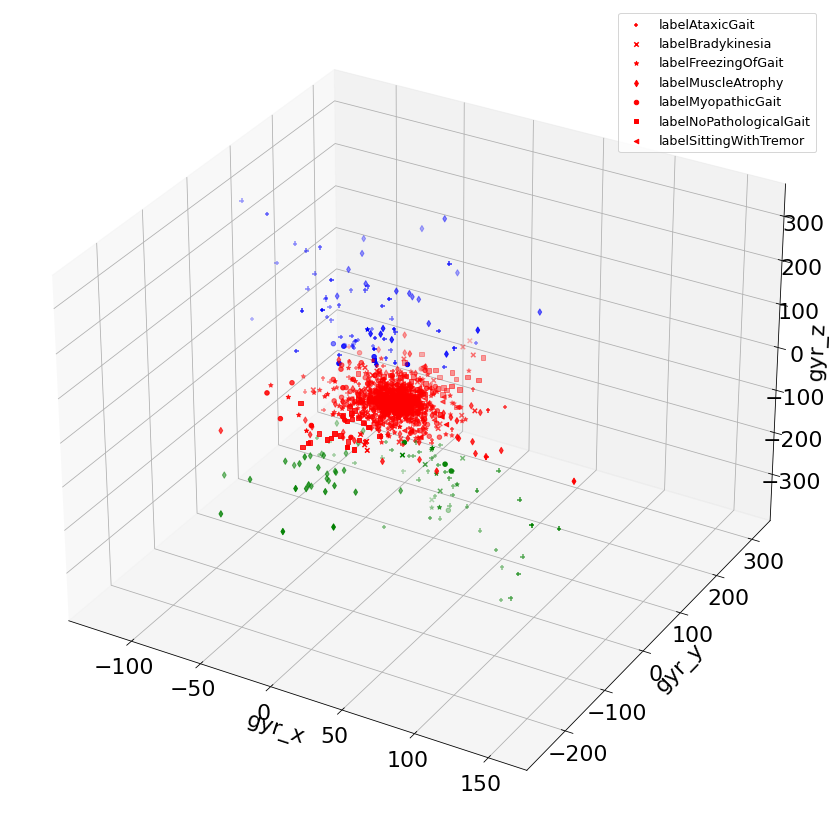

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


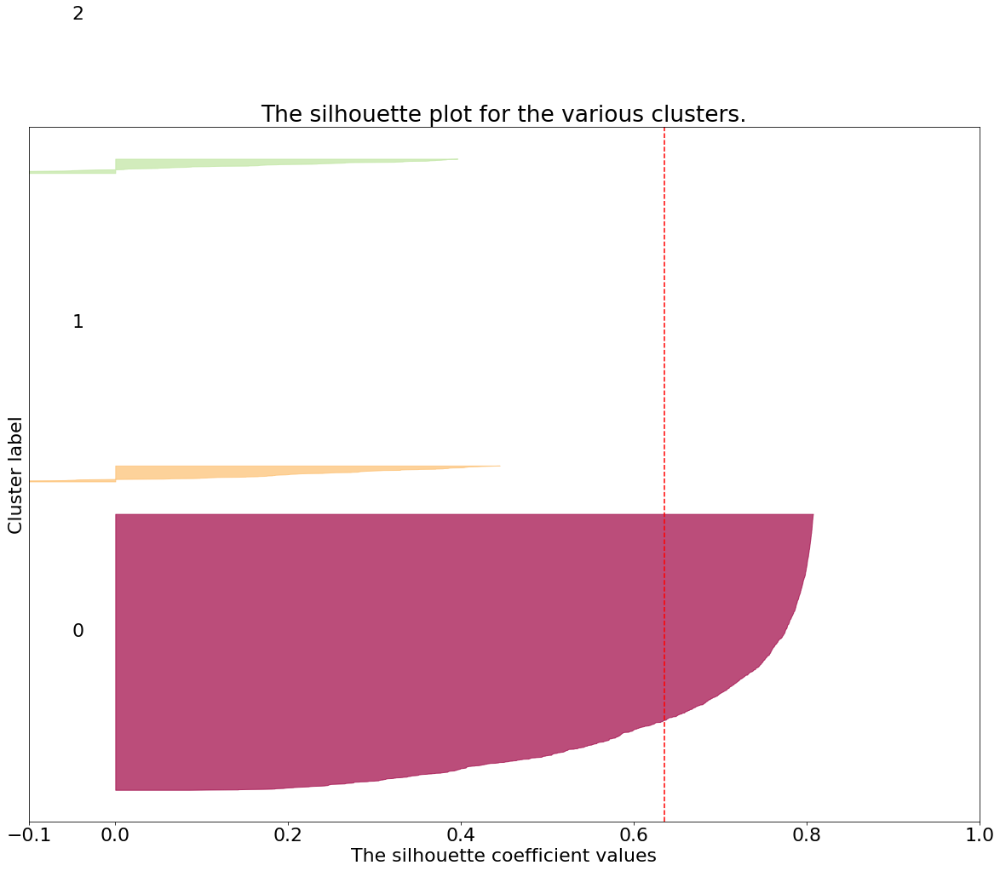

\multirow{2}{*}{ gyr_x } & mean  &  1.64 &  18.45 &  -31.89\\
 & std  &  15.11 &  41.56 &  35.67\\
\multirow{2}{*}{ gyr_y } & mean  &  -6.32 &  -58.08 &  49.58\\
 & std  &  36.39 &  65.72 &  91.60\\
\multirow{2}{*}{ gyr_z } & mean  &  -0.94 &  -127.47 &  126.78\\
 & std  &  22.78 &  63.98 &  70.01\\
labelAtaxicGait  & percentage  &  61.67 \% &  17.50 \% &  20.83 \%\\
labelBradykinesia  & percentage  &  97.92 \% &  2.08 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  97.08 \% &  2.50 \% &  0.42 \%\\
labelMuscleAtrophy  & percentage  &  78.24 \% &  12.97 \% &  8.79 \%\\
labelMyopathicGait  & percentage  &  95.83 \% &  1.67 \% &  2.50 \%\\
labelNoPathologicalGait  & percentage  &  99.58 \% &  0.00 \% &  0.42 \%\\
labelSittingWithTremor  & percentage  &  100.00 \% &  0.00 \% &  0.00 \%\\
Person 2 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.5276967482725943
k = 3
silhouette = 0.5508558322326115
k = 4
silhouette = 0.5447039853401203
k = 5
silhouett

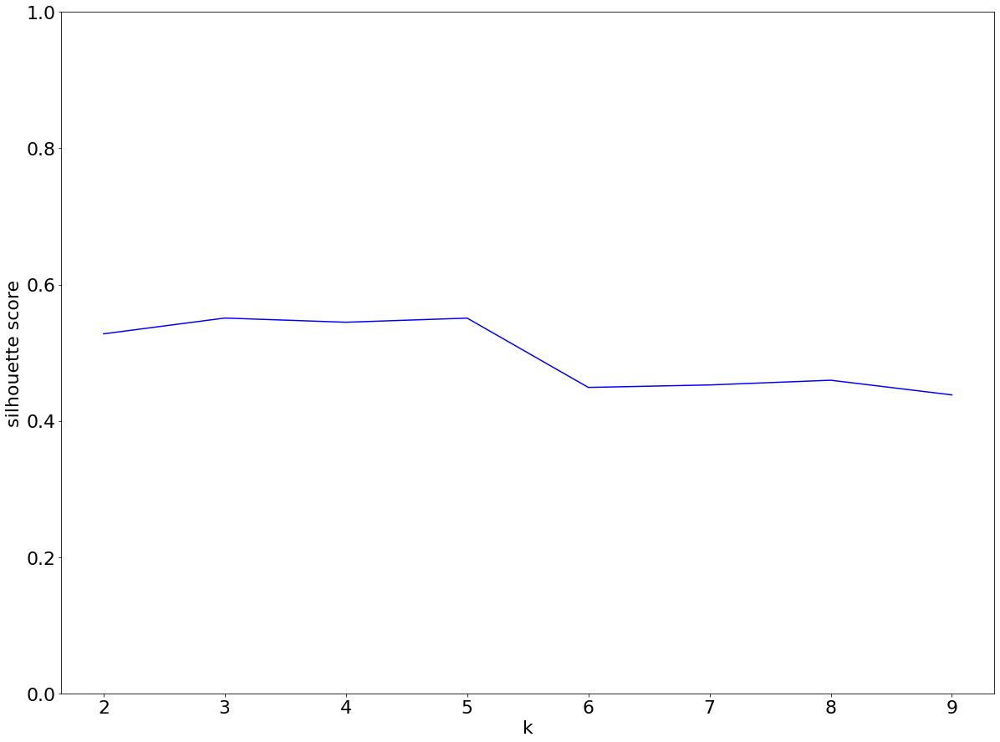

Highest K-Means silhouette score for Person 3: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


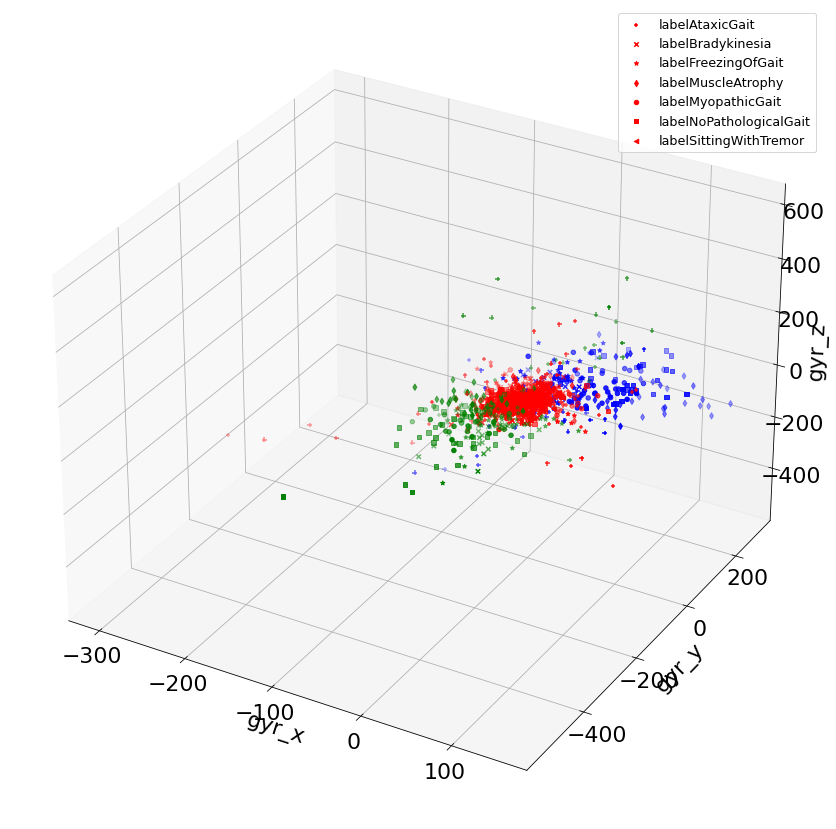

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


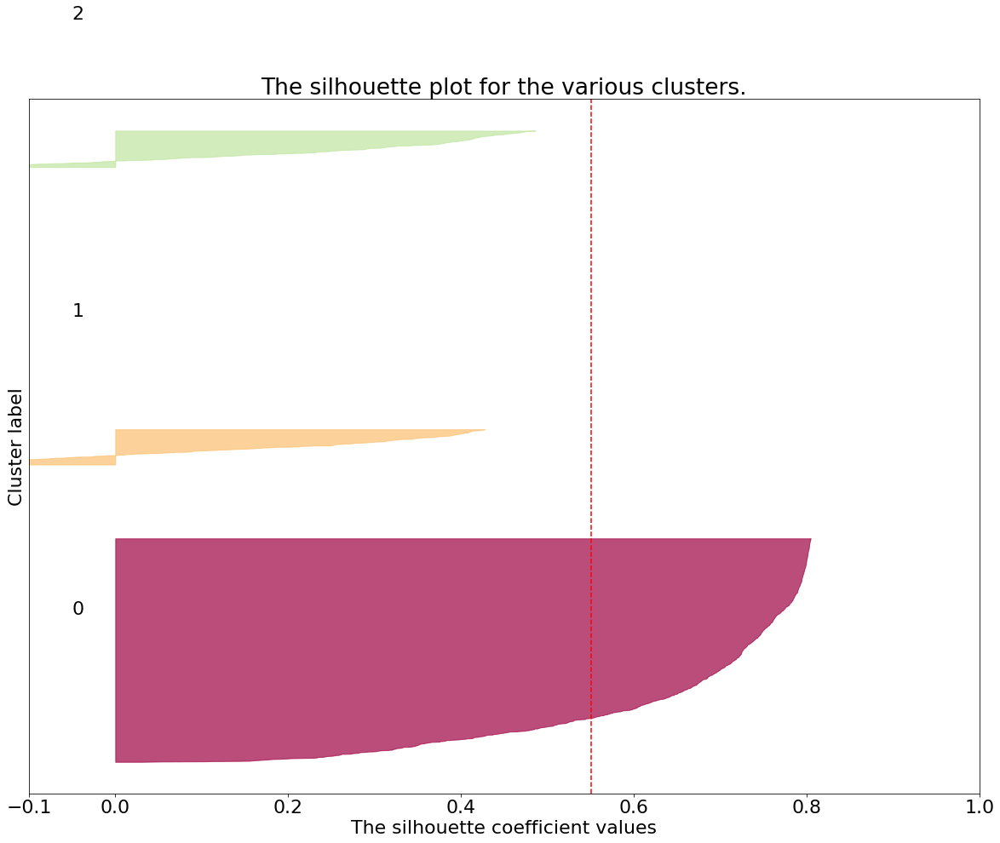

\multirow{2}{*}{ gyr_x } & mean  &  -3.94 &  -7.05 &  24.33\\
 & std  &  23.03 &  40.61 &  49.57\\
\multirow{2}{*}{ gyr_y } & mean  &  -4.06 &  -136.90 &  139.48\\
 & std  &  30.23 &  72.19 &  59.01\\
\multirow{2}{*}{ gyr_z } & mean  &  0.97 &  65.88 &  -59.58\\
 & std  &  32.90 &  108.64 &  80.54\\
labelAtaxicGait  & percentage  &  70.00 \% &  12.50 \% &  17.50 \%\\
labelBradykinesia  & percentage  &  85.42 \% &  9.17 \% &  5.42 \%\\
labelFreezingOfGait  & percentage  &  70.00 \% &  15.83 \% &  14.17 \%\\
labelMuscleAtrophy  & percentage  &  68.62 \% &  16.74 \% &  14.64 \%\\
labelMyopathicGait  & percentage  &  67.08 \% &  12.50 \% &  20.42 \%\\
labelNoPathologicalGait  & percentage  &  68.33 \% &  17.08 \% &  14.58 \%\\
labelSittingWithTremor  & percentage  &  100.00 \% &  0.00 \% &  0.00 \%\\
Person 3 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.8645376924365933
k = 3
silhouette = 0.7679341857067491
k = 4
silhouette = 0.5527173279004634
k = 5
si

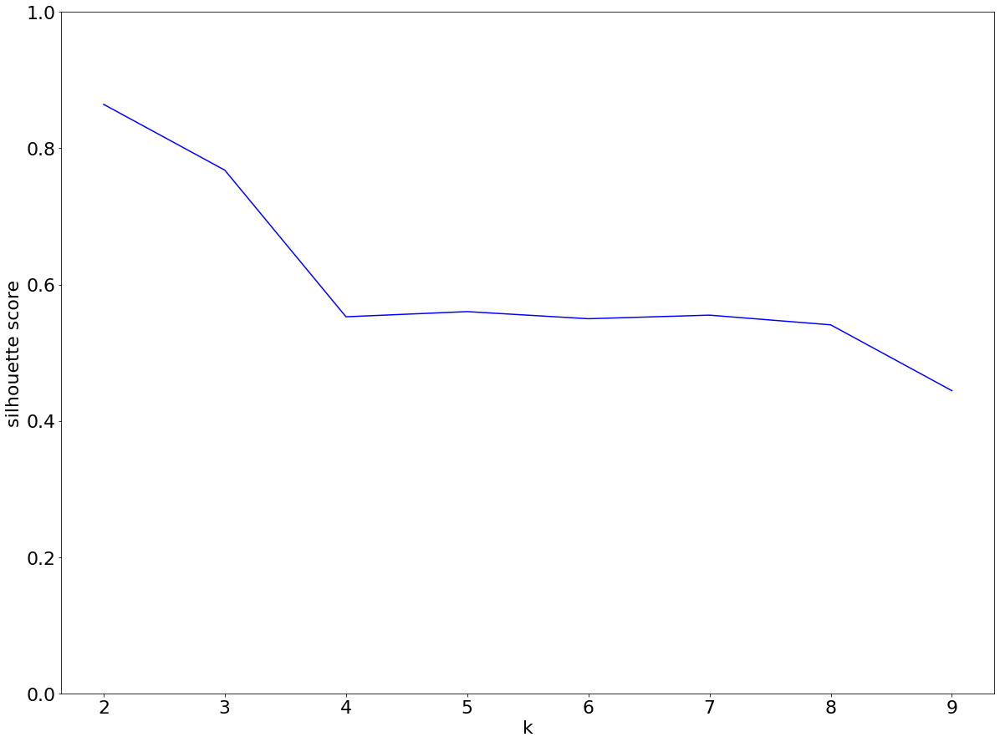

Highest K-Means silhouette score for Person 4: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


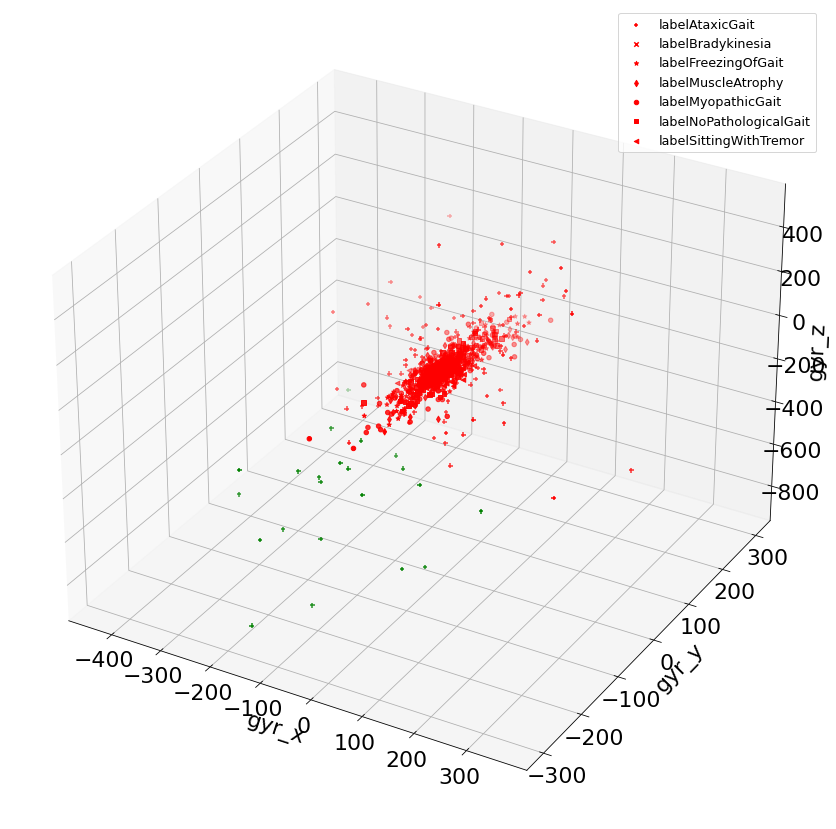

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


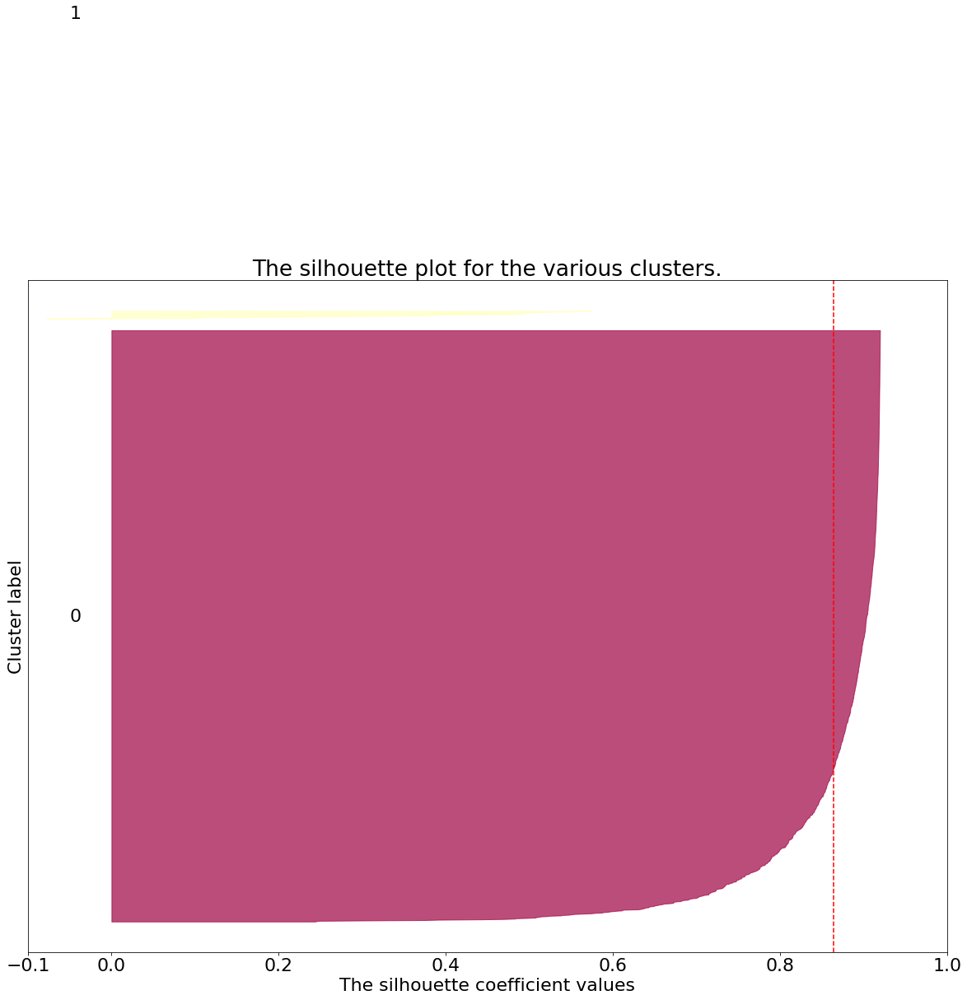

\multirow{2}{*}{ gyr_x } & mean  &  2.30 &  -113.43\\
 & std  &  31.78 &  126.15\\
\multirow{2}{*}{ gyr_y } & mean  &  -5.42 &  -126.00\\
 & std  &  42.53 &  118.43\\
\multirow{2}{*}{ gyr_z } & mean  &  6.03 &  -480.14\\
 & std  &  49.68 &  196.89\\
labelAtaxicGait  & percentage  &  90.83 \% &  9.17 \%\\
labelBradykinesia  & percentage  &  100.00 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  100.00 \% &  0.00 \%\\
labelMuscleAtrophy  & percentage  &  100.00 \% &  0.00 \%\\
labelMyopathicGait  & percentage  &  100.00 \% &  0.00 \%\\
labelNoPathologicalGait  & percentage  &  100.00 \% &  0.00 \%\\
labelSittingWithTremor  & percentage  &  100.00 \% &  0.00 \%\\
Person 4 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.5819035963433253
k = 3
silhouette = 0.5586967143830103
k = 4
silhouette = 0.5762334631653477
k = 5
silhouette = 0.5728291948428545
k = 6
silhouette = 0.4966658084721035
k = 7
silhouette = 0.48867780621220264
k = 8
silhouette = 0.45396

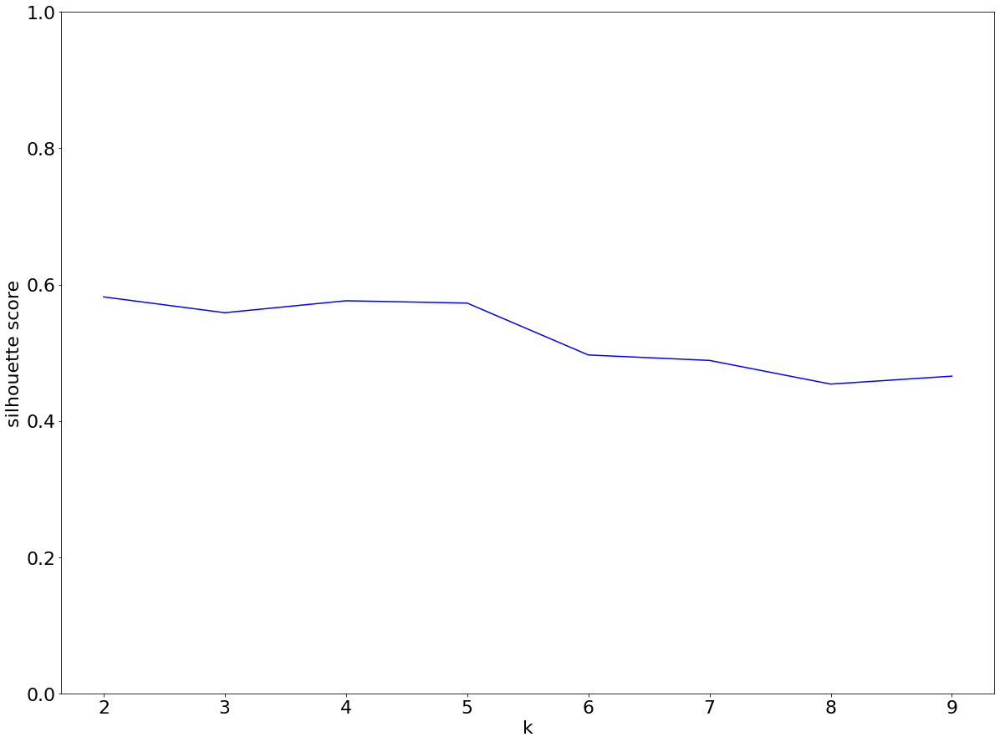

Highest K-Means silhouette score for Person 5: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


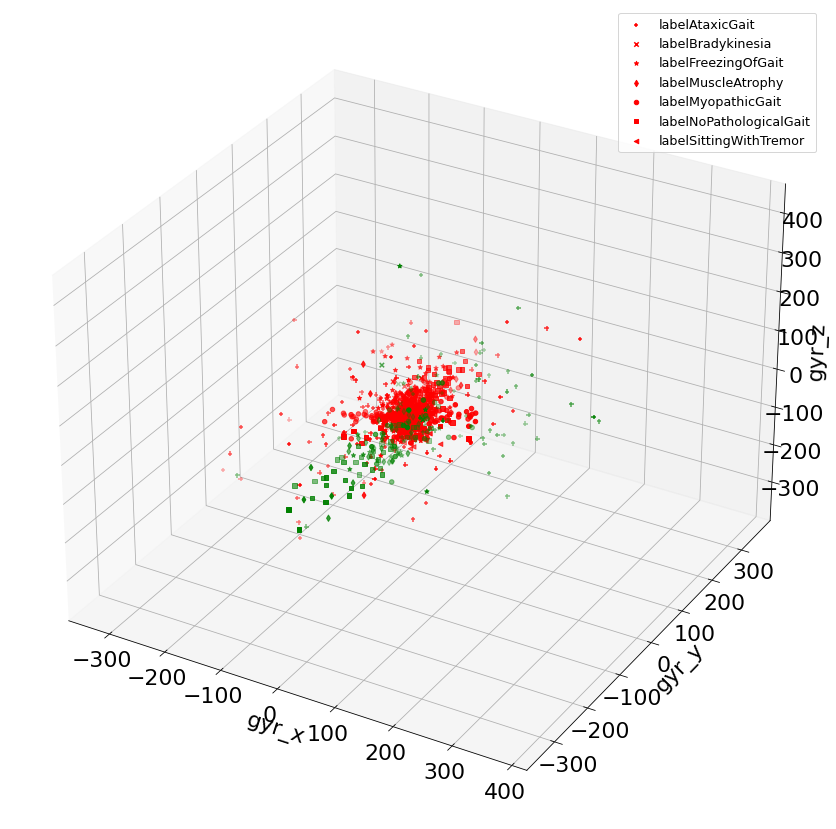

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


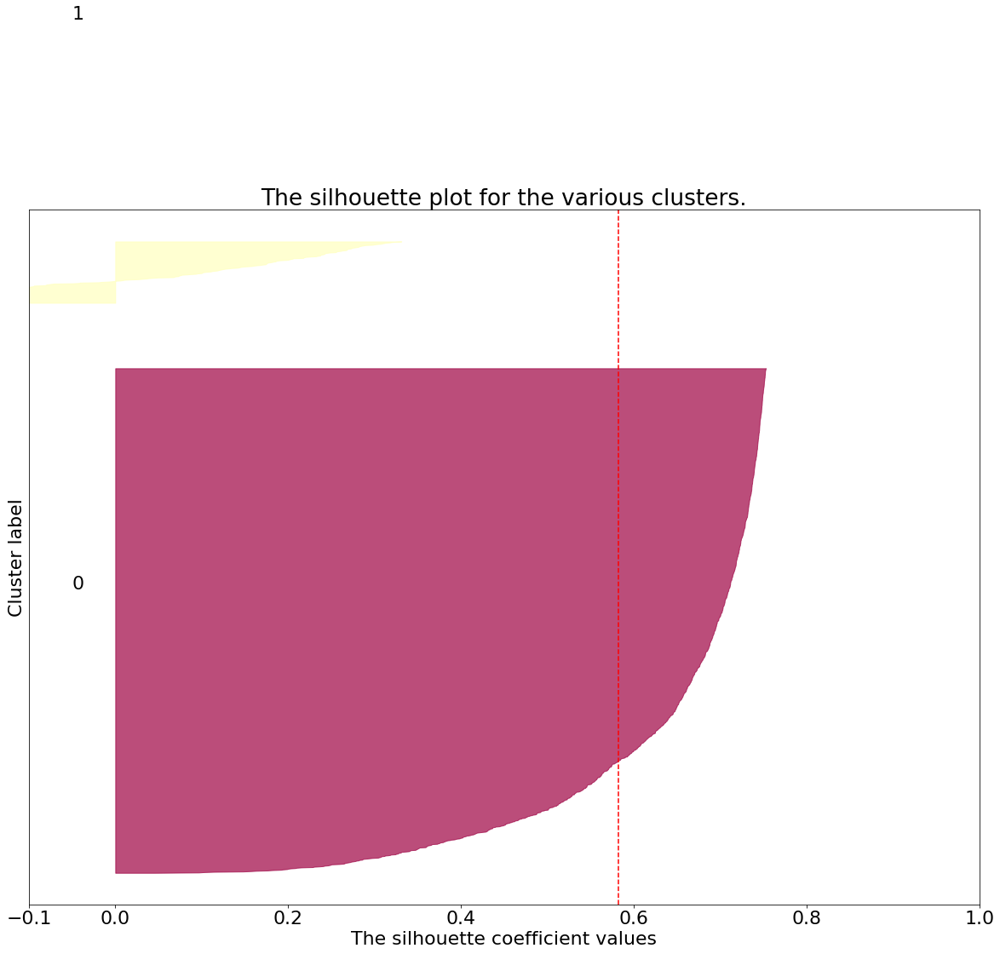

\multirow{2}{*}{ gyr_x } & mean  &  -4.14 &  59.34\\
 & std  &  36.05 &  72.37\\
\multirow{2}{*}{ gyr_y } & mean  &  3.87 &  -101.83\\
 & std  &  41.58 &  76.51\\
\multirow{2}{*}{ gyr_z } & mean  &  -4.29 &  57.07\\
 & std  &  33.43 &  80.15\\
labelAtaxicGait  & percentage  &  77.08 \% &  22.92 \%\\
labelBradykinesia  & percentage  &  97.92 \% &  2.08 \%\\
labelFreezingOfGait  & percentage  &  91.25 \% &  8.75 \%\\
labelMuscleAtrophy  & percentage  &  84.52 \% &  15.48 \%\\
labelMyopathicGait  & percentage  &  90.42 \% &  9.58 \%\\
labelNoPathologicalGait  & percentage  &  82.50 \% &  17.50 \%\\
labelSittingWithTremor  & percentage  &  100.00 \% &  0.00 \%\\
Person 5 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.6376687060465709
k = 3
silhouette = 0.6571535923319515
k = 4
silhouette = 0.613760770501189
k = 5
silhouette = 0.6238802988728916
k = 6
silhouette = 0.558183473049233
k = 7
silhouette = 0.5630228883737802
k = 8
silhouette = 0.5671179834657354

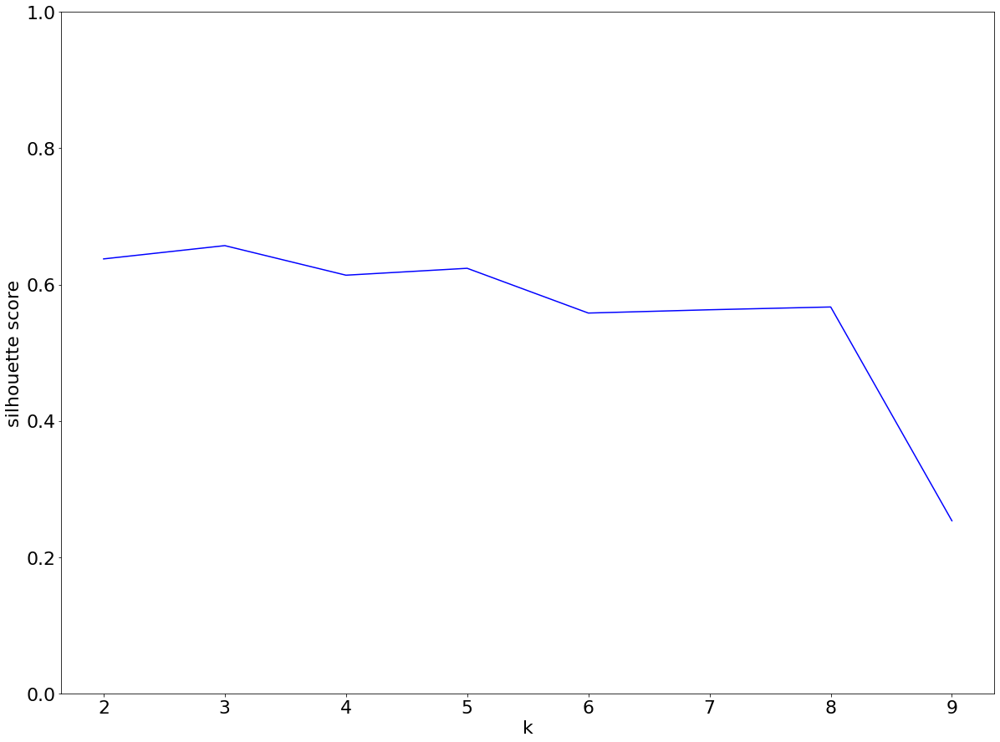

Highest K-Means silhouette score for Person 6: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


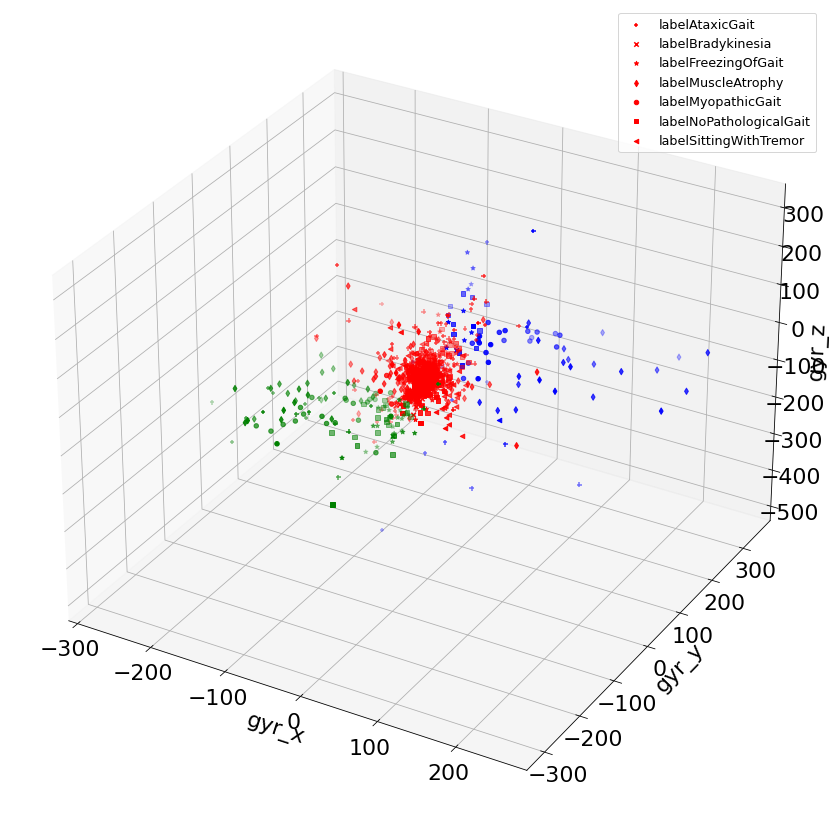

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


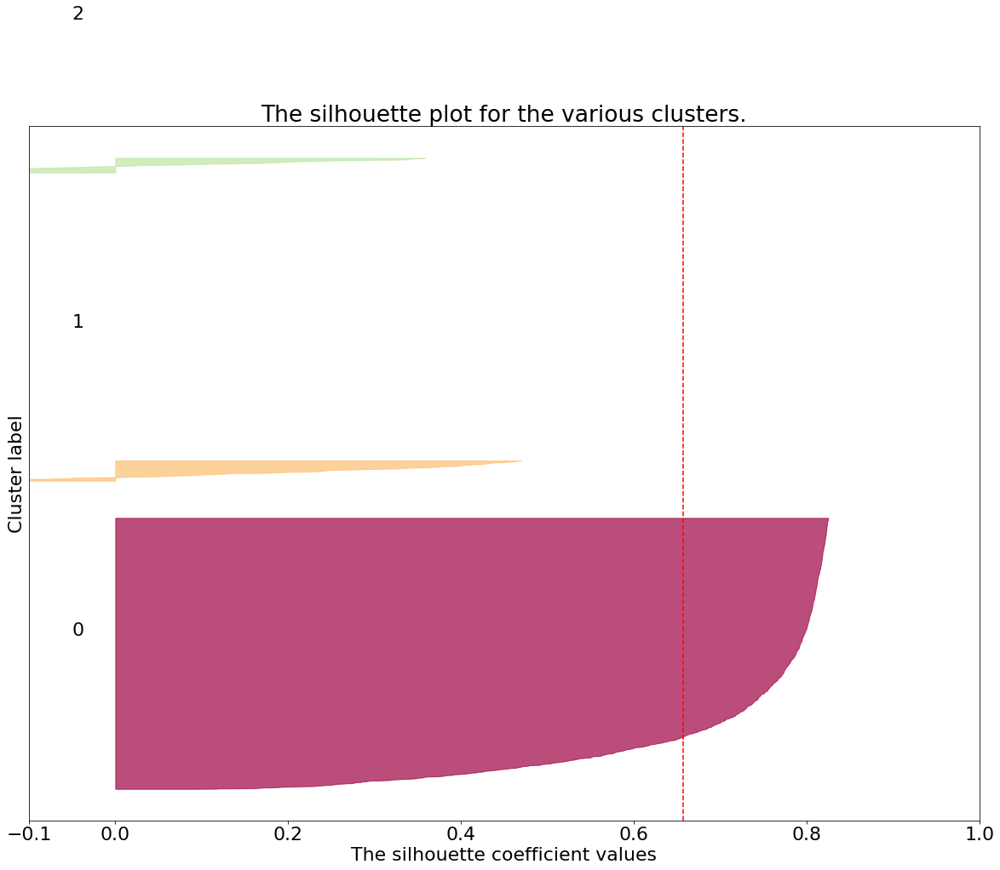

\multirow{2}{*}{ gyr_x } & mean  &  -2.94 &  -41.78 &  39.69\\
 & std  &  18.15 &  57.96 &  72.19\\
\multirow{2}{*}{ gyr_y } & mean  &  -0.96 &  -135.96 &  140.11\\
 & std  &  21.63 &  57.07 &  65.98\\
\multirow{2}{*}{ gyr_z } & mean  &  2.88 &  -8.17 &  -29.39\\
 & std  &  31.60 &  53.69 &  108.05\\
labelAtaxicGait  & percentage  &  87.50 \% &  7.50 \% &  5.00 \%\\
labelBradykinesia  & percentage  &  97.50 \% &  0.83 \% &  1.67 \%\\
labelFreezingOfGait  & percentage  &  87.08 \% &  9.17 \% &  3.75 \%\\
labelMuscleAtrophy  & percentage  &  80.33 \% &  10.46 \% &  9.21 \%\\
labelMyopathicGait  & percentage  &  82.08 \% &  9.17 \% &  8.75 \%\\
labelNoPathologicalGait  & percentage  &  85.42 \% &  9.58 \% &  5.00 \%\\
labelSittingWithTremor  & percentage  &  99.58 \% &  0.00 \% &  0.42 \%\\
Person 6 done!
===== kmeans clustering (Optimal K value search) =====
k = 2
silhouette = 0.603182709300796
k = 3
silhouette = 0.5544873519319597
k = 4
silhouette = 0.6031188586217405
k = 5
silhouette =

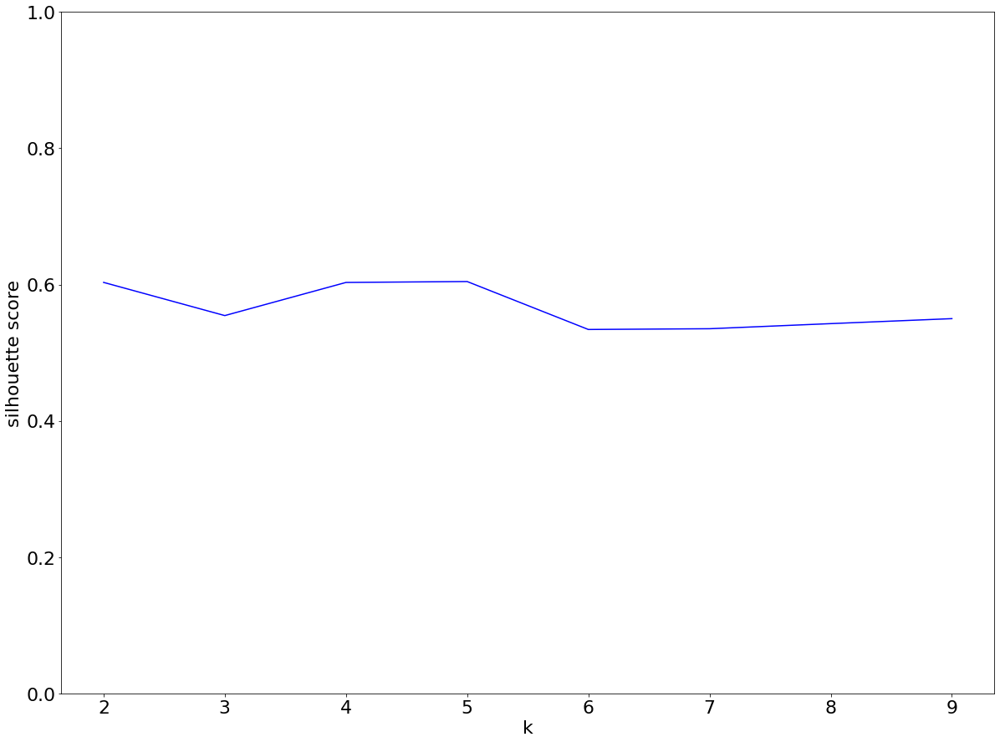

Highest K-Means silhouette score for Person 7: k = 5
Highest k = 5
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


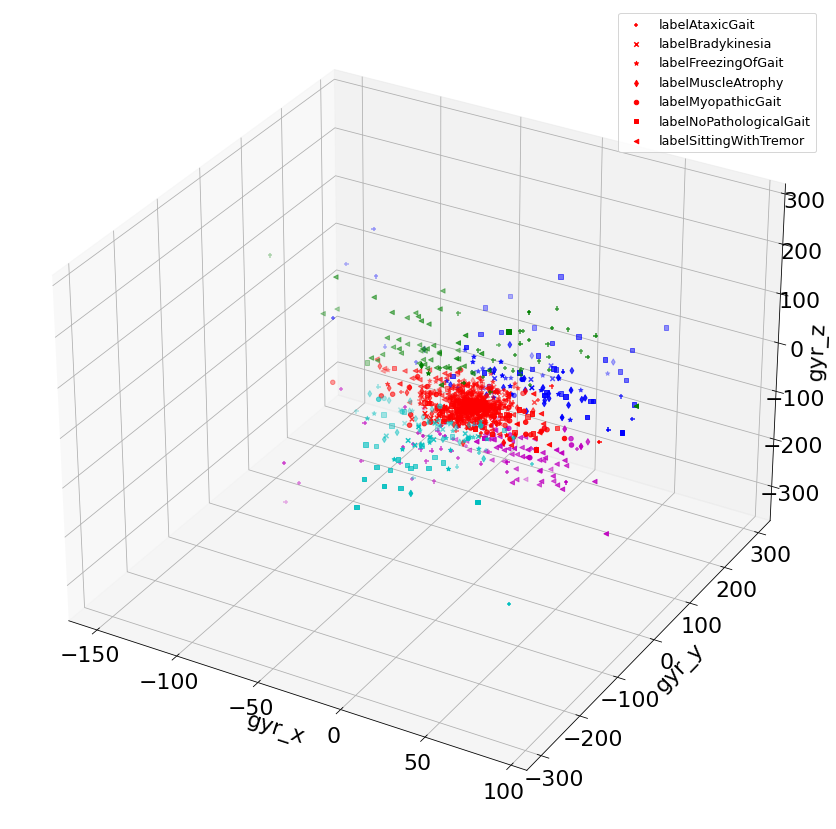

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


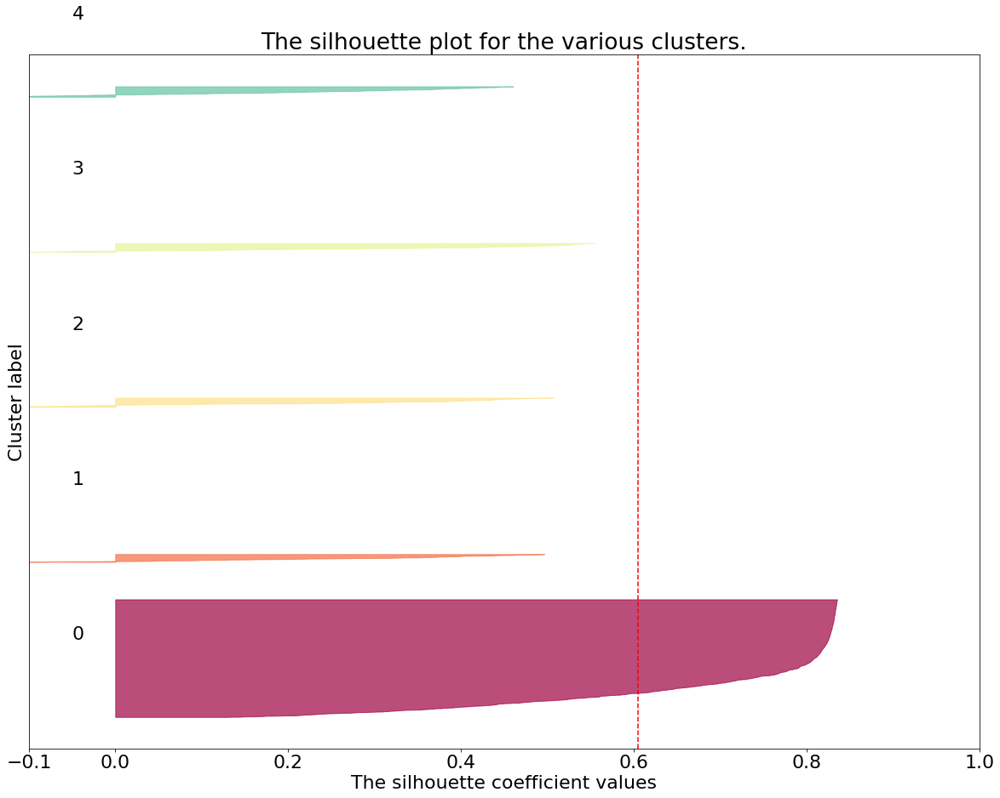

\multirow{2}{*}{ gyr_x } & mean  &  -0.31 &  -9.53 &  4.07 &  -0.20 &  10.01\\
 & std  &  11.28 &  39.32 &  38.02 &  22.69 &  35.62\\
\multirow{2}{*}{ gyr_y } & mean  &  -4.11 &  -1.76 &  116.27 &  -116.82 &  1.65\\
 & std  &  16.20 &  28.16 &  54.74 &  55.25 &  25.93\\
\multirow{2}{*}{ gyr_z } & mean  &  0.30 &  103.81 &  -12.09 &  9.72 &  -84.23\\
 & std  &  12.12 &  44.56 &  34.79 &  20.72 &  44.58\\
labelAtaxicGait  & percentage  &  62.92 \% &  13.75 \% &  4.17 \% &  4.17 \% &  15.00 \%\\
labelBradykinesia  & percentage  &  89.17 \% &  0.00 \% &  3.75 \% &  7.08 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  79.17 \% &  0.42 \% &  10.00 \% &  9.58 \% &  0.83 \%\\
labelMuscleAtrophy  & percentage  &  81.17 \% &  0.42 \% &  9.62 \% &  7.11 \% &  1.67 \%\\
labelMyopathicGait  & percentage  &  93.33 \% &  0.00 \% &  1.67 \% &  2.50 \% &  2.50 \%\\
labelNoPathologicalGait  & percentage  &  76.25 \% &  0.83 \% &  12.50 \% &  9.58 \% &  0.83 \%\\
labelSittingWithTremor  & percentag

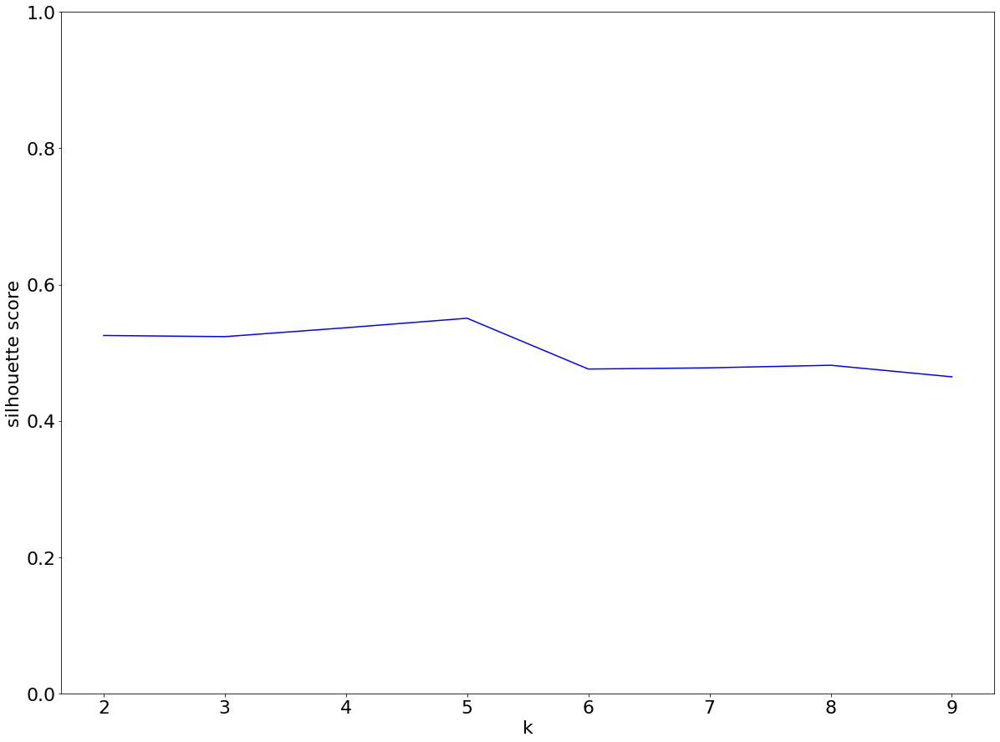

Highest K-Means silhouette score for Person 8: k = 5
Highest k = 5
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


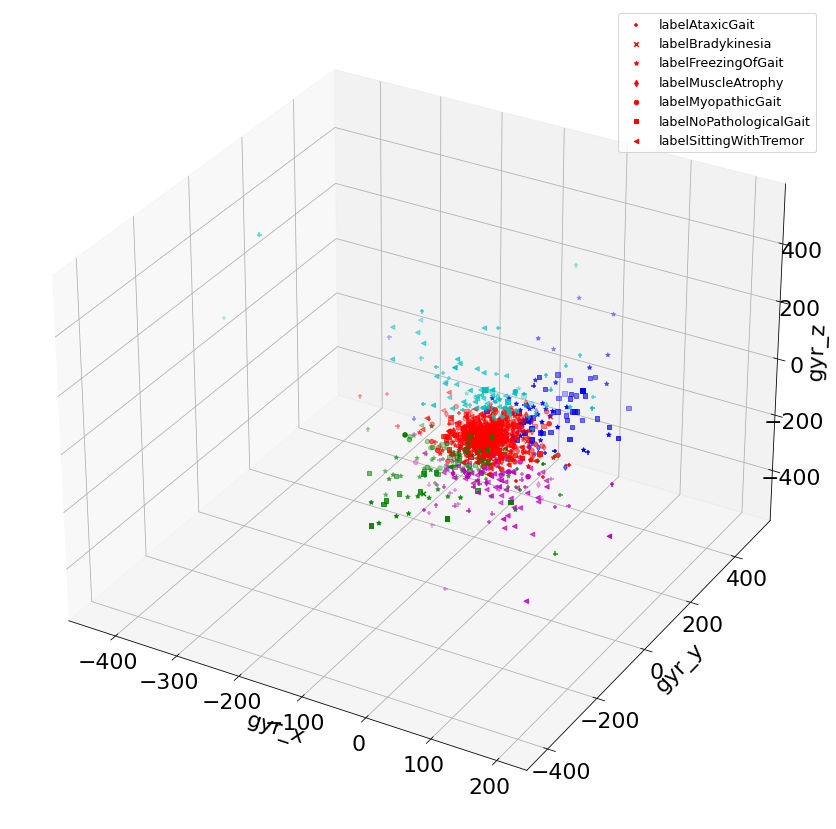

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


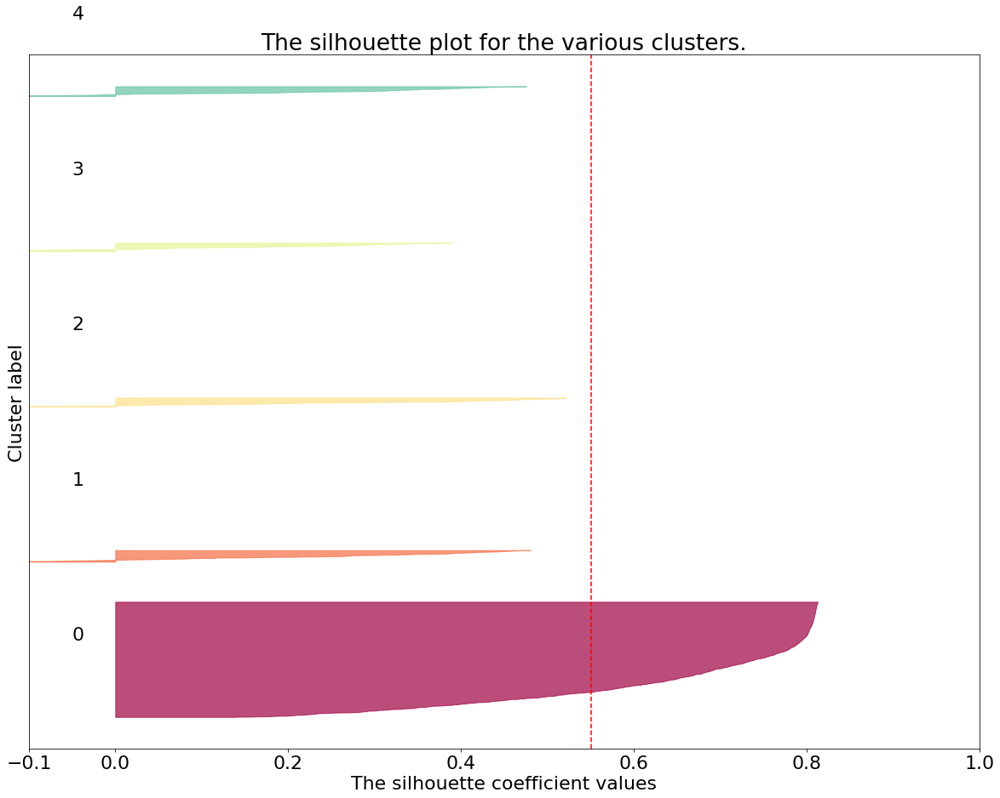

\multirow{2}{*}{ gyr_x } & mean  &  -1.64 &  6.43 &  19.24 &  -19.08 &  8.50\\
 & std  &  22.89 &  54.88 &  50.73 &  80.62 &  57.05\\
\multirow{2}{*}{ gyr_y } & mean  &  -3.84 &  -160.64 &  179.86 &  23.31 &  -18.62\\
 & std  &  27.57 &  76.48 &  87.13 &  55.78 &  44.90\\
\multirow{2}{*}{ gyr_z } & mean  &  1.20 &  19.64 &  -38.05 &  142.34 &  -149.53\\
 & std  &  22.61 &  40.40 &  54.39 &  76.56 &  72.14\\
labelAtaxicGait  & percentage  &  57.92 \% &  7.50 \% &  5.83 \% &  12.92 \% &  15.83 \%\\
labelBradykinesia  & percentage  &  96.67 \% &  3.33 \% &  0.00 \% &  0.00 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  63.33 \% &  21.25 \% &  13.75 \% &  1.67 \% &  0.00 \%\\
labelMuscleAtrophy  & percentage  &  90.38 \% &  1.67 \% &  2.51 \% &  2.93 \% &  2.51 \%\\
labelMyopathicGait  & percentage  &  90.83 \% &  4.58 \% &  0.00 \% &  0.83 \% &  3.75 \%\\
labelNoPathologicalGait  & percentage  &  66.67 \% &  13.75 \% &  18.33 \% &  1.25 \% &  0.00 \%\\
labelSittingWithTremor  & per

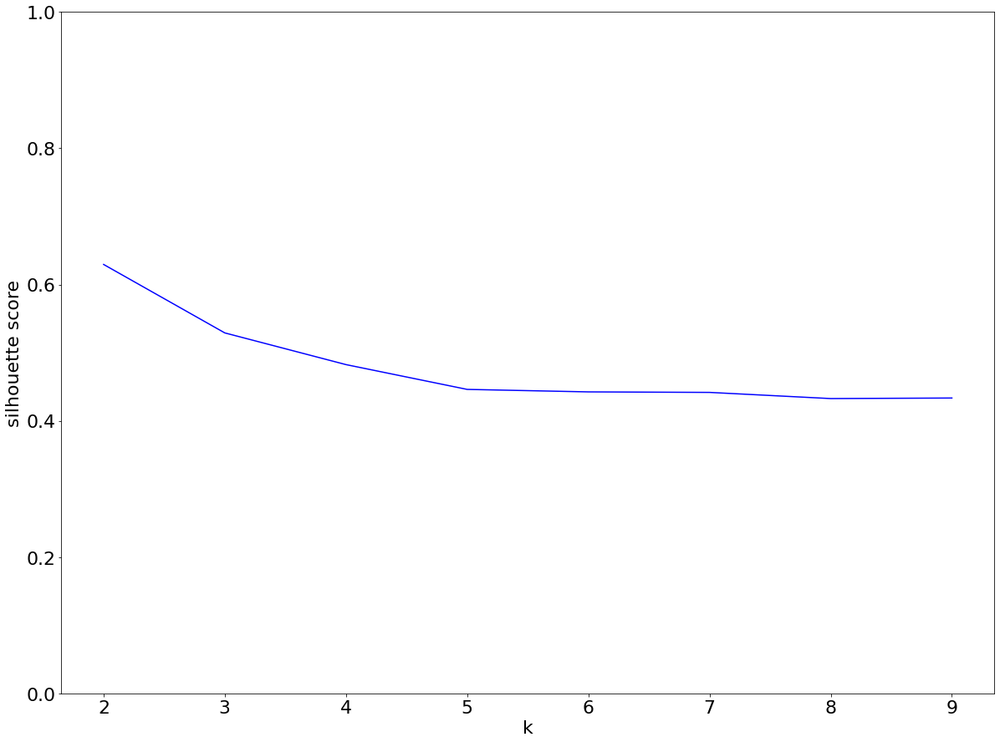

Highest K-Means silhouette score for Person 9: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


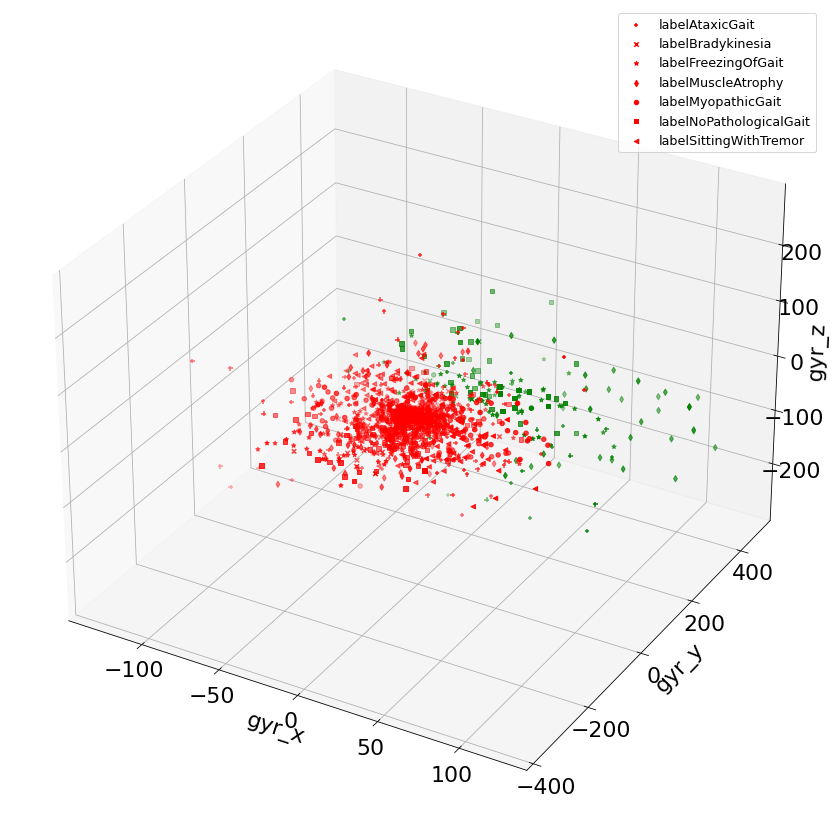

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


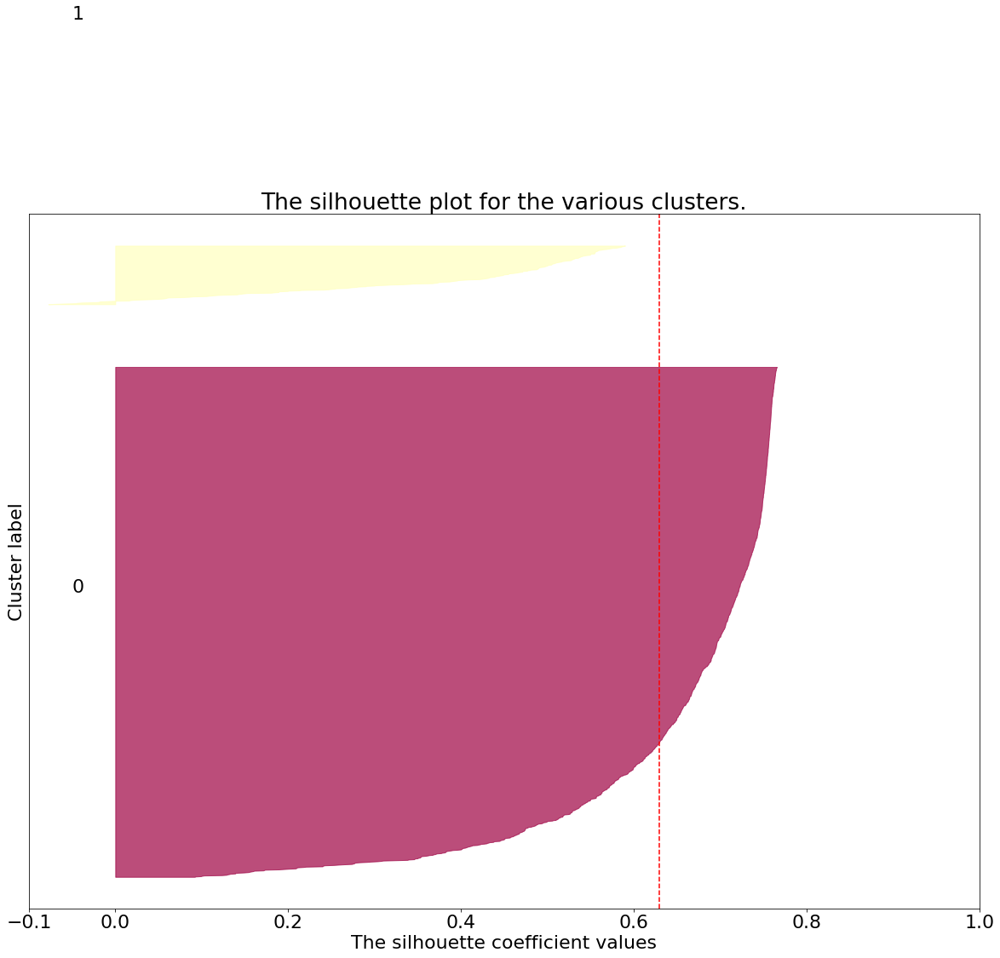

\multirow{2}{*}{ gyr_x } & mean  &  -0.82 &  27.28\\
 & std  &  22.15 &  40.17\\
\multirow{2}{*}{ gyr_y } & mean  &  -25.60 &  198.42\\
 & std  &  61.44 &  89.08\\
\multirow{2}{*}{ gyr_z } & mean  &  4.05 &  -30.65\\
 & std  &  34.61 &  57.23\\
labelAtaxicGait  & percentage  &  86.67 \% &  13.33 \%\\
labelBradykinesia  & percentage  &  97.08 \% &  2.92 \%\\
labelFreezingOfGait  & percentage  &  78.75 \% &  21.25 \%\\
labelMuscleAtrophy  & percentage  &  85.36 \% &  14.64 \%\\
labelMyopathicGait  & percentage  &  99.17 \% &  0.83 \%\\
labelNoPathologicalGait  & percentage  &  80.83 \% &  19.17 \%\\
labelSittingWithTremor  & percentage  &  100.00 \% &  0.00 \%\\
Person 9 done!


In [277]:
for per in range (10):
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)
    # PARAMS_CHOSEN = ['acc_x', 'acc_y', 'acc_z']
    PARAMS_CHOSEN = ['gyr_x', 'gyr_y', 'gyr_z']

    DataViz = VisualizeDataset()
    clusteringNH = NonHierarchicalClustering()

    k_values = range(2, 10)
    silhouette_values = []

    # Simulations to find k with highest silhouette score.
    #
    print('===== kmeans clustering (Optimal K value search) =====')
    for k in k_values:
        print(f'k = {k}')
        dataset_cluster = clusteringNH.k_means_over_instances(copy.deepcopy(dataset), PARAMS_CHOSEN, k, 'default', 50, 50)
        silhouette_score = dataset_cluster['silhouette'].mean()

        print(f'silhouette = {silhouette_score}')
        silhouette_values.append(silhouette_score)

    DataViz.plot_xy(x=[k_values], y=[silhouette_values], xlabel='k', ylabel='silhouette score', ylim=[0, 1], line_styles=['b-'])

    # And run the knn with the highest silhouette score.
    #
    k_best = k_values[np.argmax(silhouette_values)]
    print(f'Highest K-Means silhouette score for Person {per}: k = {k_best}')
    
    # =============================== Clustering, 3d-Visualizing & File Saving =============================== # 
    
    clusteringNH = NonHierarchicalClustering()
    print(f'Highest k = {k_best}')
    dataset = clusteringNH.k_means_over_instances(dataset, PARAMS_CHOSEN, k_best, 'default', 50, 50)

    DataViz.plot_clusters_3d(dataset, PARAMS_CHOSEN, 'cluster', ['label'])
    DataViz.plot_silhouette(dataset, 'cluster', 'silhouette')
    util.print_latex_statistics_clusters(dataset, 'cluster', PARAMS_CHOSEN, 'label')

    dataset = dataset.drop(columns=['silhouette'])
    dataset.to_csv(f'./parkinson_dataset/csv/chapter_5/k_means/chapter5_kmeans_gyr_per{per}.csv')
    print(f'Person {per} done!')

### K-medoids

===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.4983212069219901
k = 3
silhouette = 0.48651586514861583
k = 4
silhouette = 0.42644898717633195
k = 5
silhouette = 0.44915721811492215
k = 6
silhouette = 0.27845808741875266
k = 7
silhouette = 0.2630582148290997
k = 8
silhouette = 0.3208258525500419
k = 9
silhouette = 0.33619627201971364
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


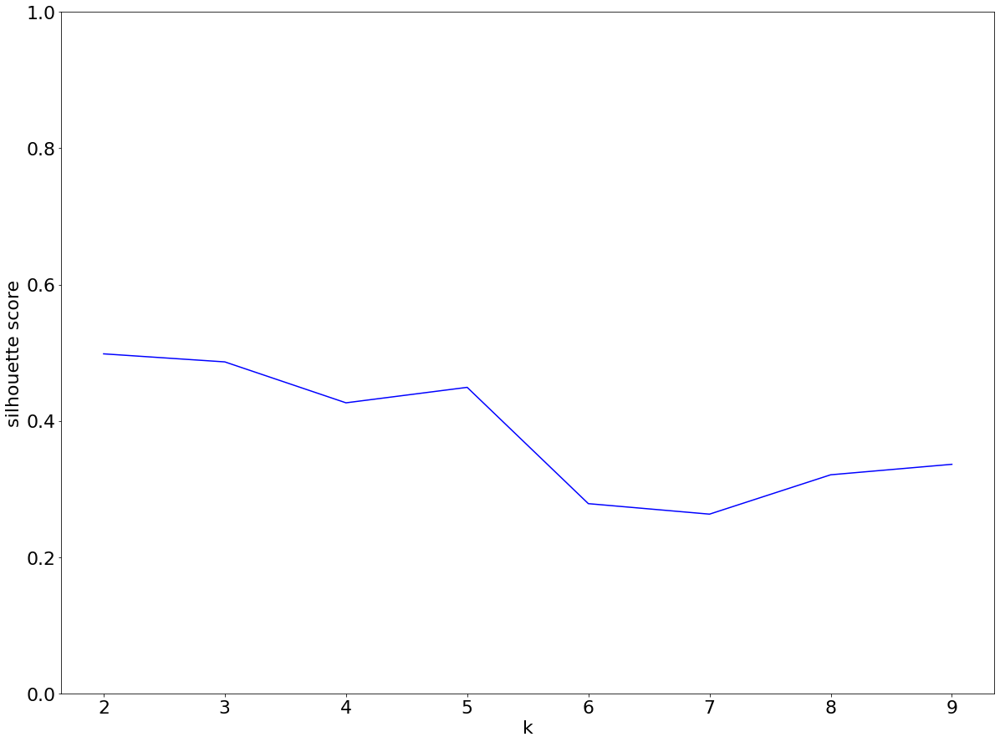

Highest K-Medoids silhouette score for Person 0: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


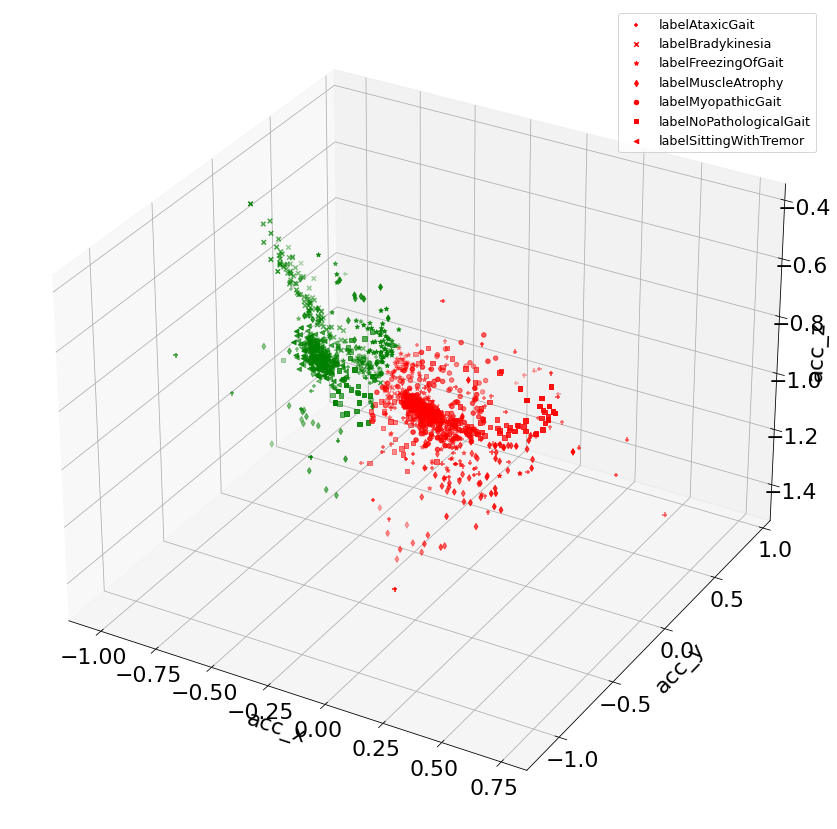

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


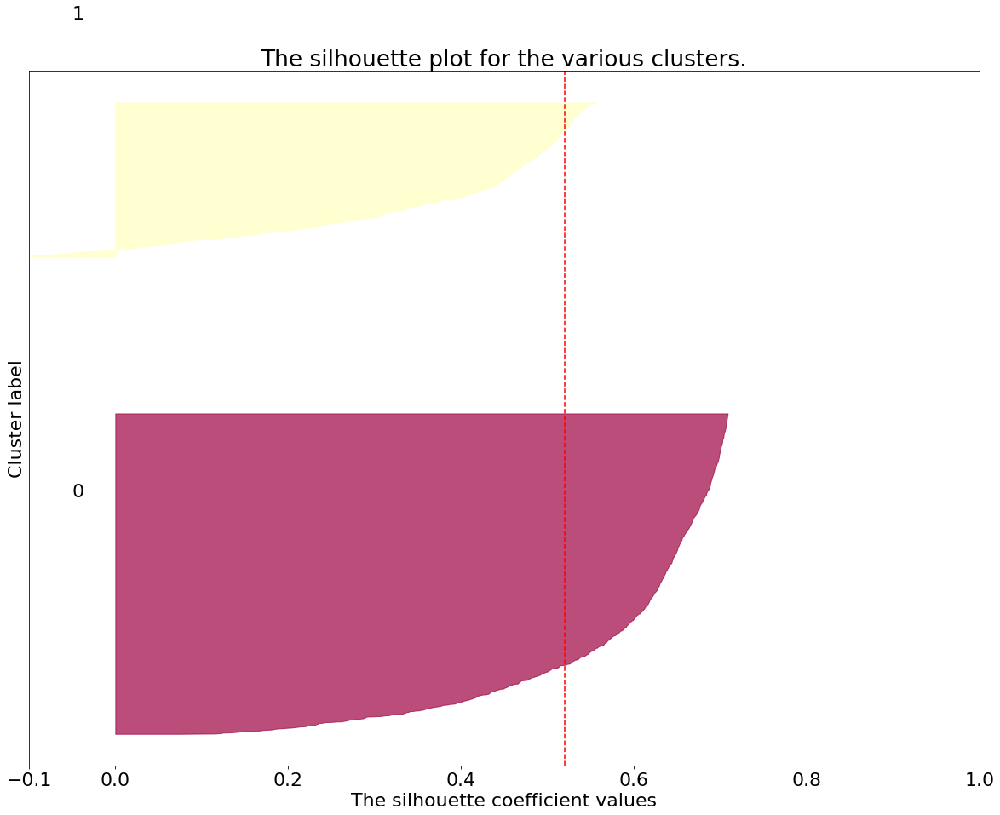

\multirow{2}{*}{ acc_x } & mean  &  -0.12 &  -0.55\\
 & std  &  0.15 &  0.13\\
\multirow{2}{*}{ acc_y } & mean  &  -0.08 &  -0.16\\
 & std  &  0.11 &  0.18\\
\multirow{2}{*}{ acc_z } & mean  &  -0.98 &  -0.82\\
 & std  &  0.07 &  0.12\\
labelAtaxicGait  & percentage  &  85.00 \% &  15.00 \%\\
labelBradykinesia  & percentage  &  51.67 \% &  48.33 \%\\
labelFreezingOfGait  & percentage  &  69.58 \% &  30.42 \%\\
labelMuscleAtrophy  & percentage  &  84.52 \% &  15.48 \%\\
labelMyopathicGait  & percentage  &  96.25 \% &  3.75 \%\\
labelNoPathologicalGait  & percentage  &  85.83 \% &  14.17 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  100.00 \%\\
Person 0 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.48572825502052736
k = 3
silhouette = 0.5118188741618392
k = 4
silhouette = 0.49864207026714585
k = 5
silhouette = 0.5276558478435092
k = 6
silhouette = 0.3731916941194183
k = 7
silhouette = 0.3436764863390021
k = 8
silhouette = 0.25927193106655

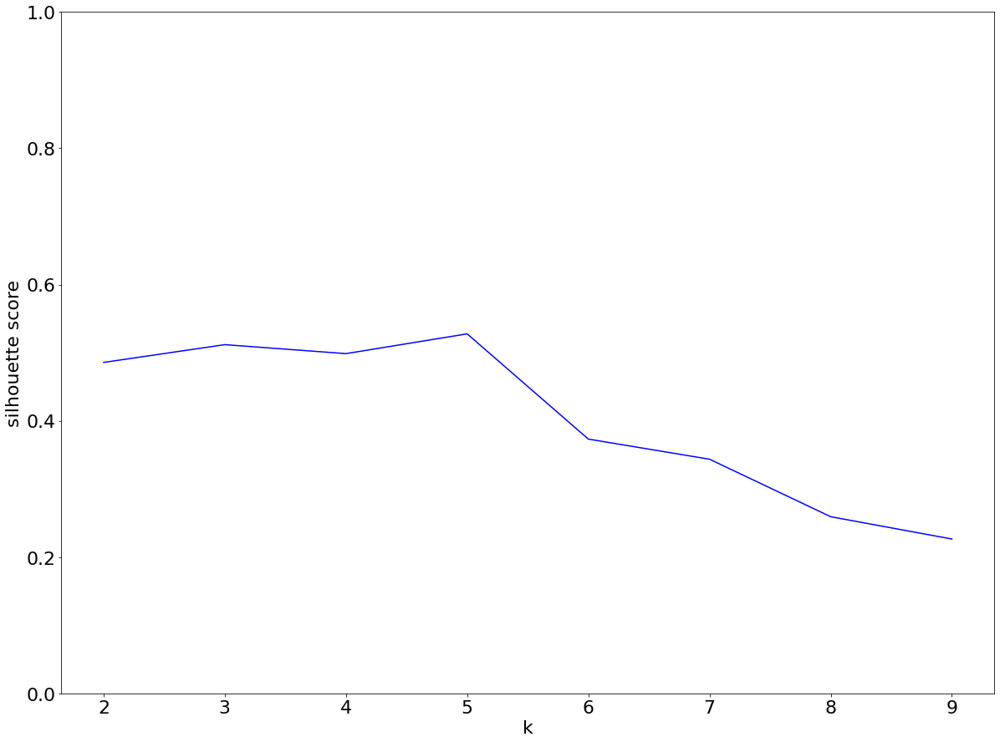

Highest K-Medoids silhouette score for Person 1: k = 5
Highest k = 5
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


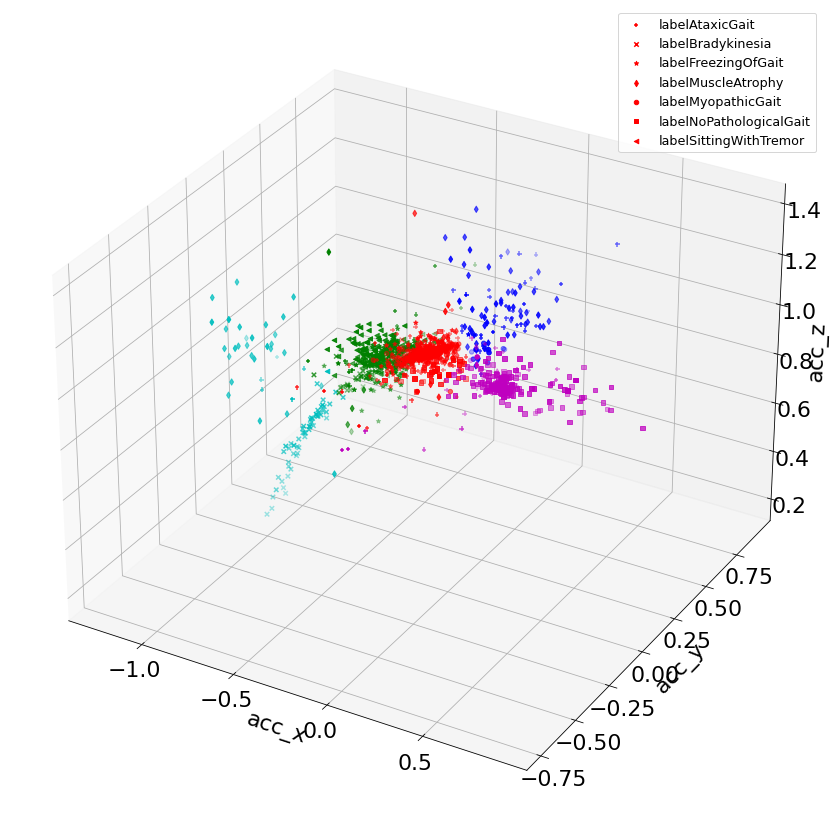

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


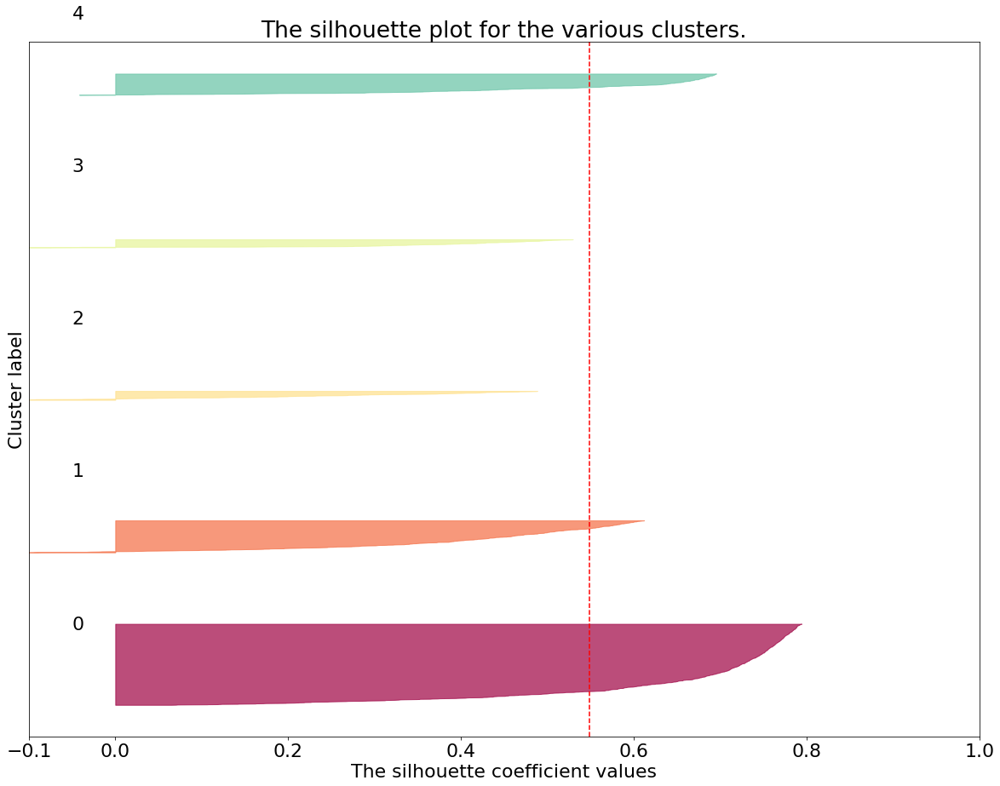

\multirow{2}{*}{ acc_x } & mean  &  -0.20 &  -0.50 &  0.01 &  -0.91 &  0.27\\
 & std  &  0.06 &  0.08 &  0.12 &  0.14 &  0.14\\
\multirow{2}{*}{ acc_y } & mean  &  0.10 &  0.19 &  0.34 &  0.04 &  0.04\\
 & std  &  0.07 &  0.12 &  0.16 &  0.09 &  0.12\\
\multirow{2}{*}{ acc_z } & mean  &  0.98 &  0.86 &  1.07 &  0.65 &  0.98\\
 & std  &  0.03 &  0.07 &  0.09 &  0.22 &  0.06\\
labelAtaxicGait  & percentage  &  66.67 \% &  6.25 \% &  14.58 \% &  2.08 \% &  10.42 \%\\
labelBradykinesia  & percentage  &  63.33 \% &  13.75 \% &  0.00 \% &  22.92 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  77.08 \% &  22.50 \% &  0.42 \% &  0.00 \% &  0.00 \%\\
labelMuscleAtrophy  & percentage  &  61.09 \% &  2.51 \% &  22.59 \% &  12.13 \% &  1.67 \%\\
labelMyopathicGait  & percentage  &  91.67 \% &  3.33 \% &  4.17 \% &  0.00 \% &  0.83 \%\\
labelNoPathologicalGait  & percentage  &  14.58 \% &  0.00 \% &  0.00 \% &  0.00 \% &  85.42 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  99.58 \%

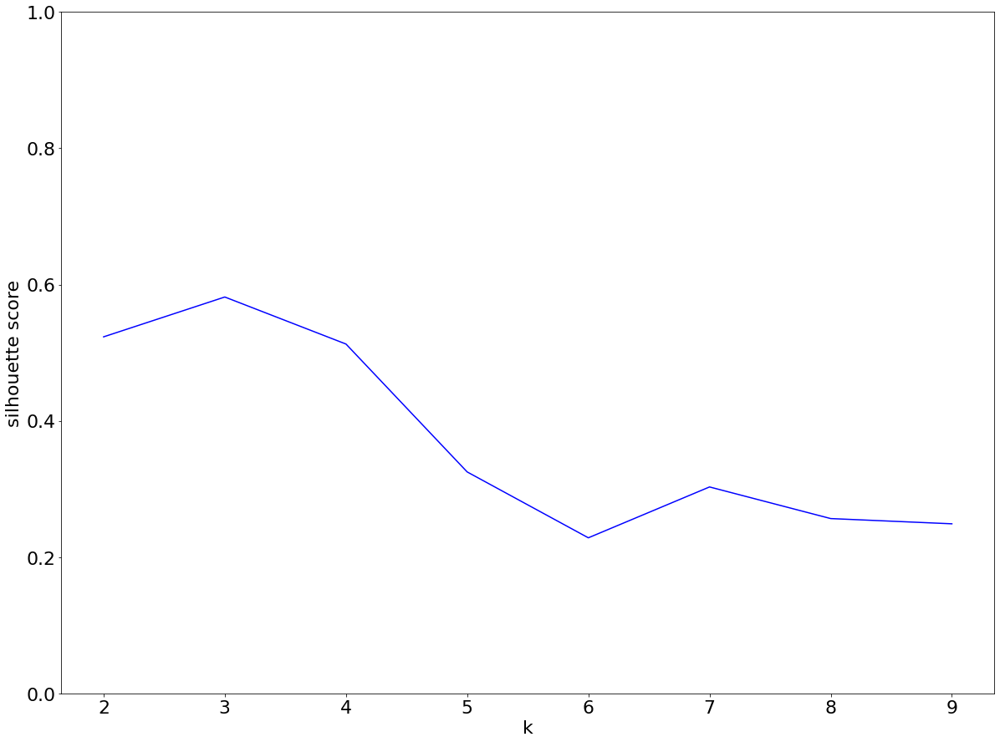

Highest K-Medoids silhouette score for Person 2: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


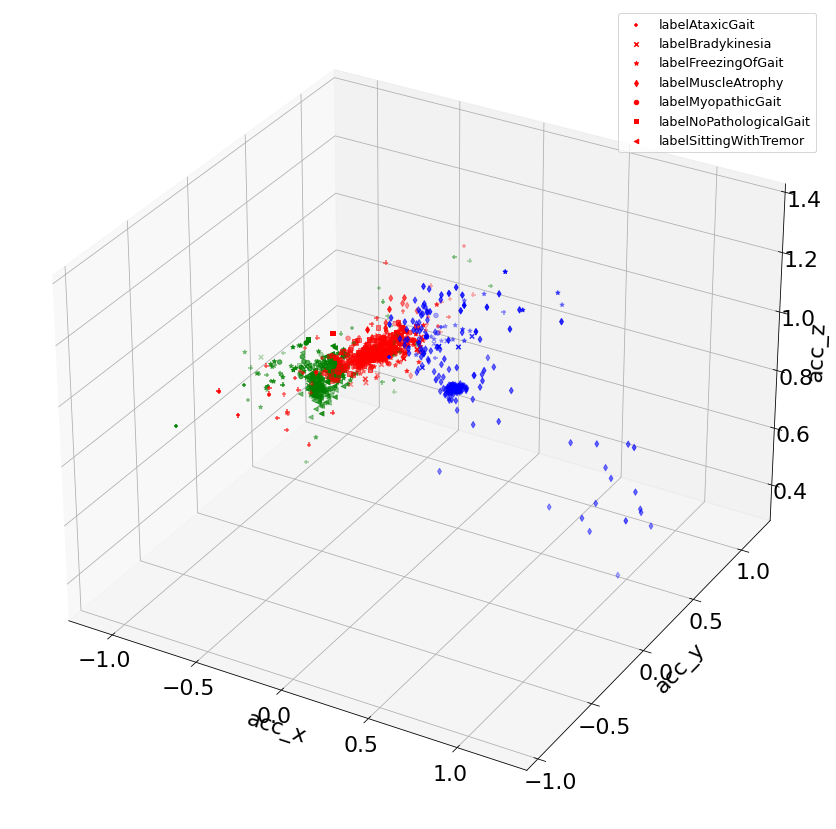

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


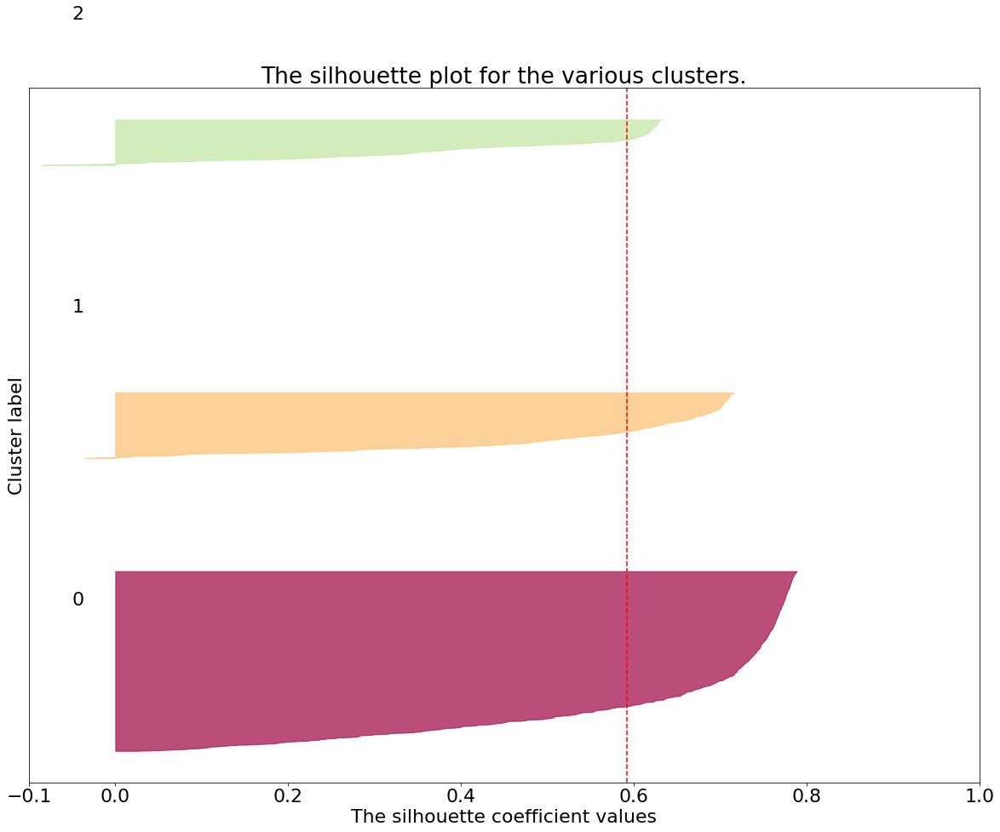

\multirow{2}{*}{ acc_x } & mean  &  -0.22 &  -0.62 &  0.29\\
 & std  &  0.09 &  0.11 &  0.23\\
\multirow{2}{*}{ acc_y } & mean  &  0.08 &  0.22 &  0.05\\
 & std  &  0.12 &  0.15 &  0.10\\
\multirow{2}{*}{ acc_z } & mean  &  0.98 &  0.79 &  1.01\\
 & std  &  0.04 &  0.07 &  0.14\\
labelAtaxicGait  & percentage  &  78.75 \% &  17.92 \% &  3.33 \%\\
labelBradykinesia  & percentage  &  90.83 \% &  5.00 \% &  4.17 \%\\
labelFreezingOfGait  & percentage  &  74.58 \% &  18.75 \% &  6.67 \%\\
labelMuscleAtrophy  & percentage  &  6.28 \% &  0.00 \% &  93.72 \%\\
labelMyopathicGait  & percentage  &  85.00 \% &  13.33 \% &  1.67 \%\\
labelNoPathologicalGait  & percentage  &  97.08 \% &  2.92 \% &  0.00 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  100.00 \% &  0.00 \%\\
Person 2 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.4307373118801115
k = 3
silhouette = 0.5183516467520853
k = 4
silhouette = 0.48936402228775744
k = 5
silhouette = 0.4711313259

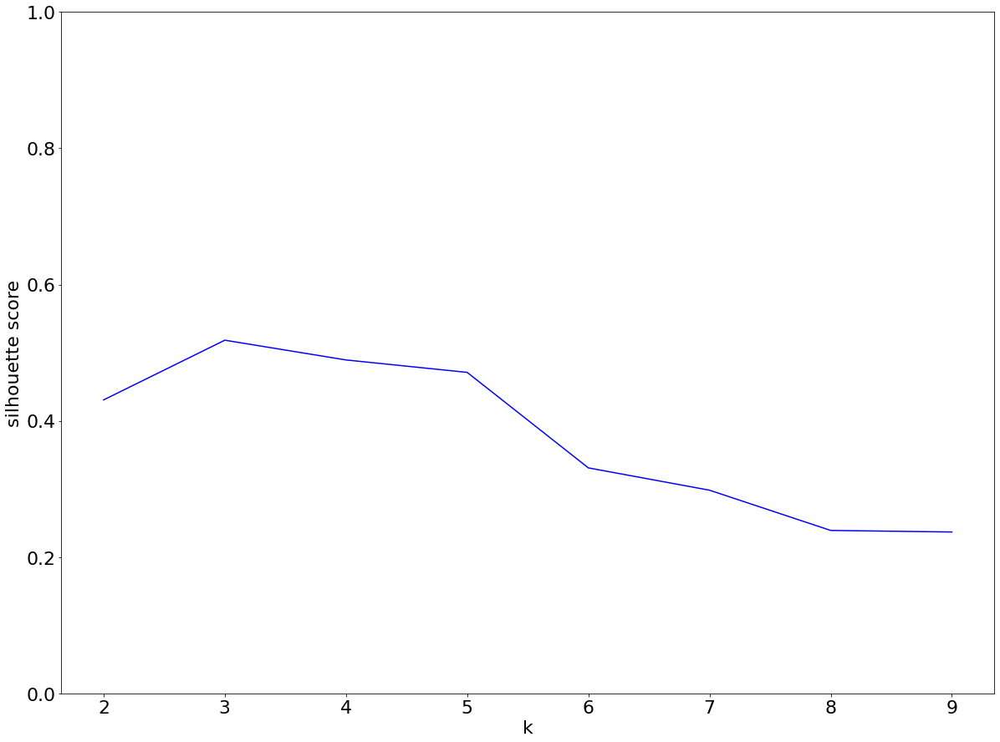

Highest K-Medoids silhouette score for Person 3: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


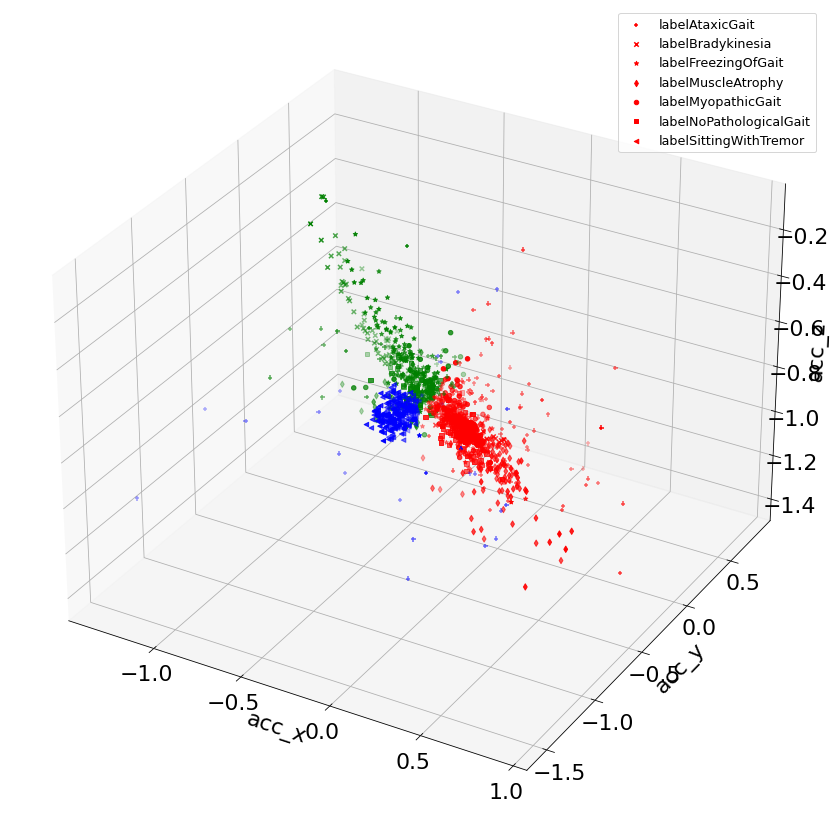

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


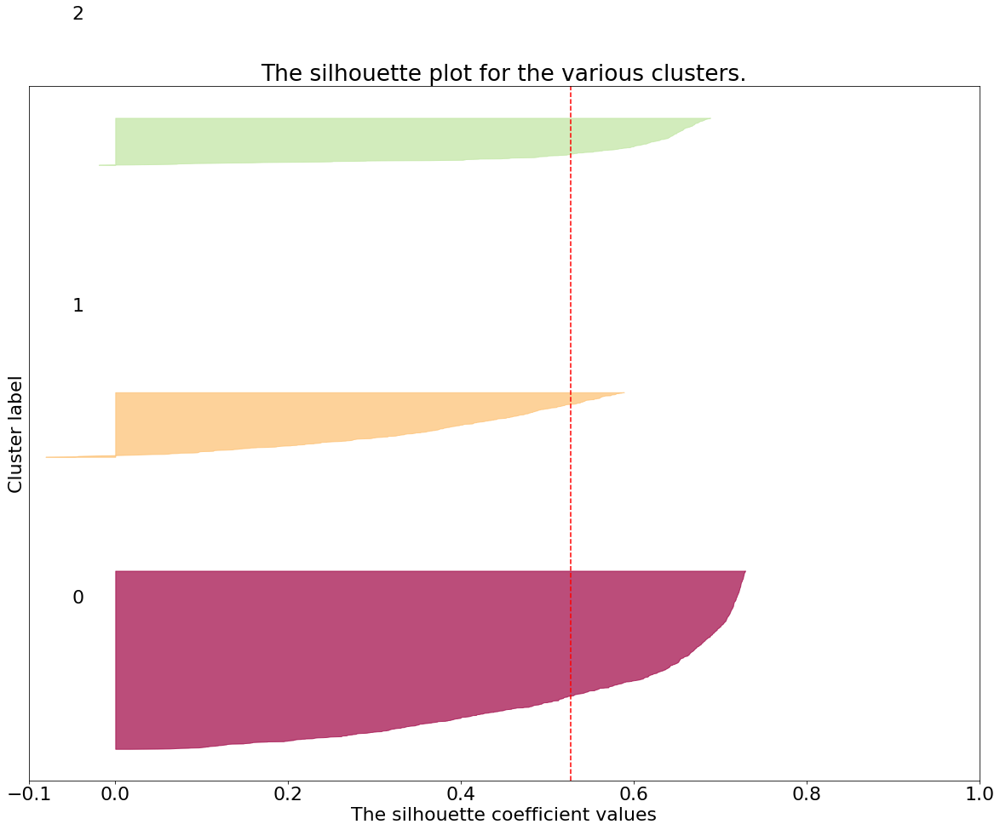

\multirow{2}{*}{ acc_x } & mean  &  -0.15 &  -0.58 &  -0.35\\
 & std  &  0.15 &  0.16 &  0.18\\
\multirow{2}{*}{ acc_y } & mean  &  -0.03 &  0.04 &  -0.40\\
 & std  &  0.09 &  0.10 &  0.17\\
\multirow{2}{*}{ acc_z } & mean  &  -0.98 &  -0.81 &  -0.83\\
 & std  &  0.09 &  0.16 &  0.09\\
labelAtaxicGait  & percentage  &  70.42 \% &  18.33 \% &  11.25 \%\\
labelBradykinesia  & percentage  &  58.33 \% &  41.67 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  50.00 \% &  48.33 \% &  1.67 \%\\
labelMuscleAtrophy  & percentage  &  87.03 \% &  12.97 \% &  0.00 \%\\
labelMyopathicGait  & percentage  &  82.50 \% &  17.08 \% &  0.42 \%\\
labelNoPathologicalGait  & percentage  &  81.67 \% &  17.92 \% &  0.42 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  0.00 \% &  100.00 \%\\
Person 3 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.4190564842744404
k = 3
silhouette = 0.4763639467223413
k = 4
silhouette = 0.29644114459709603
k = 5
silhouette = 0.

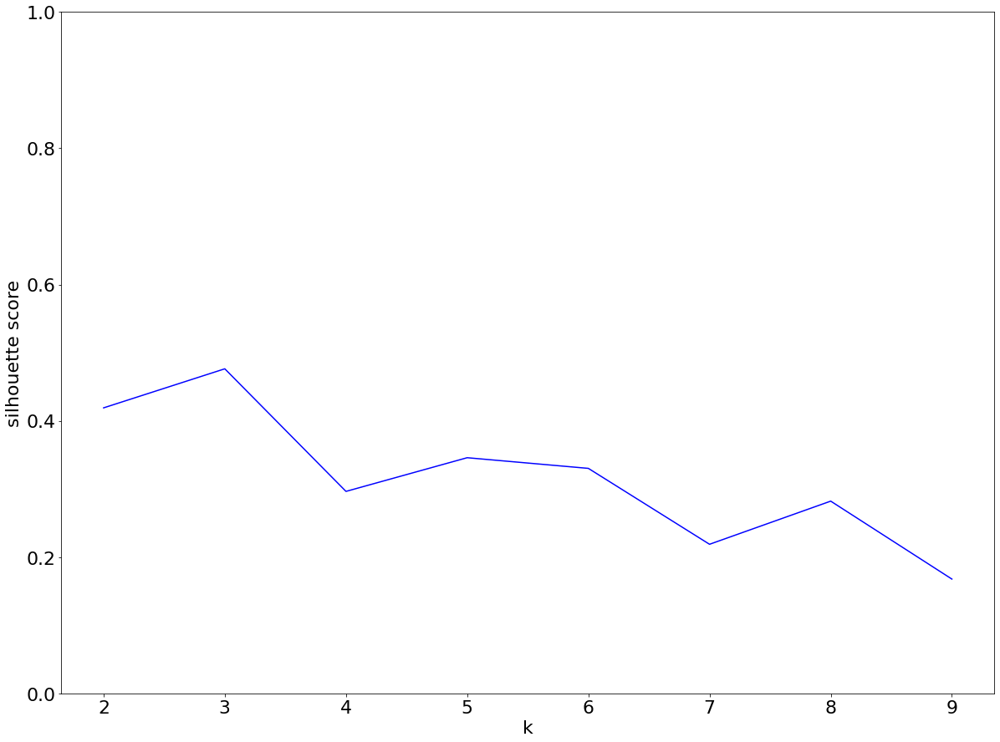

Highest K-Medoids silhouette score for Person 4: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


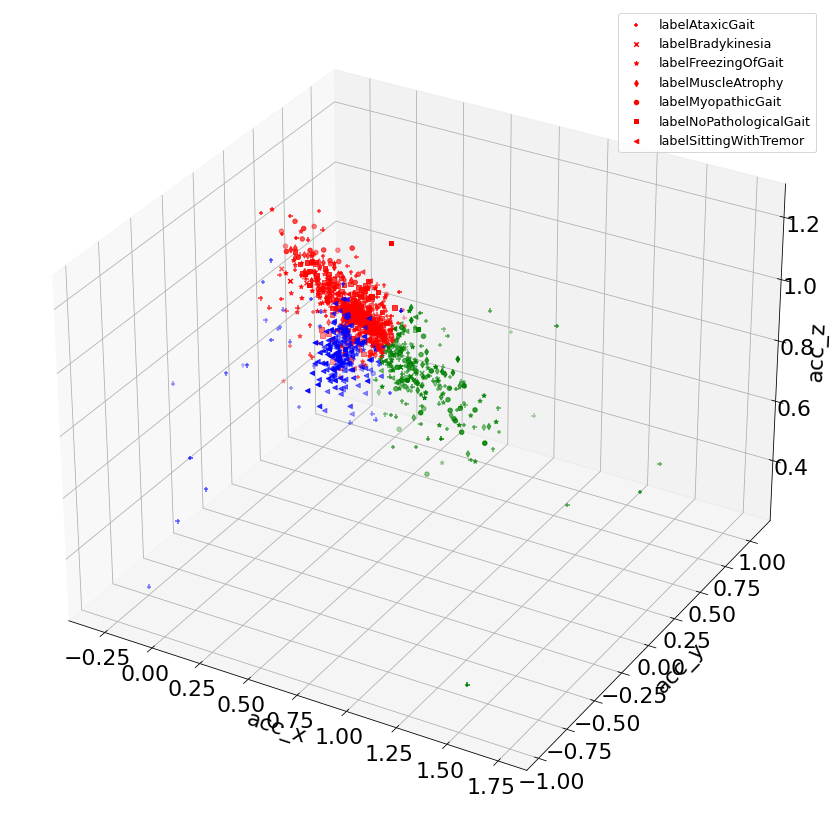

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


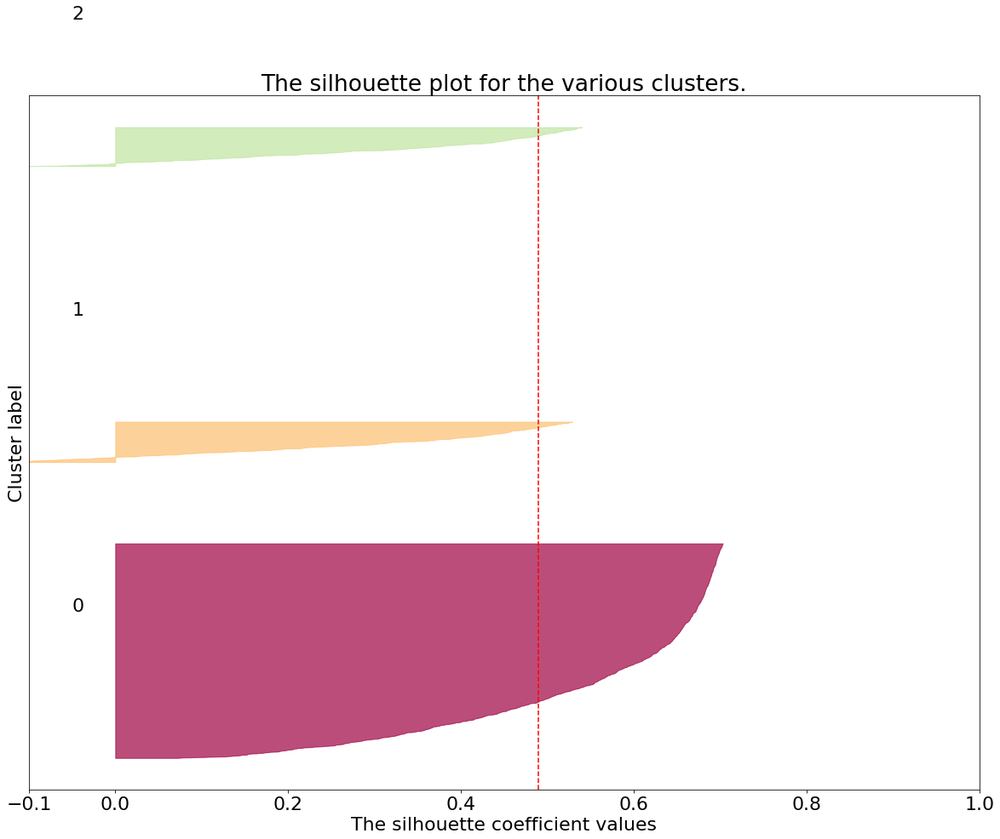

\multirow{2}{*}{ acc_x } & mean  &  0.31 &  0.66 &  0.38\\
 & std  &  0.09 &  0.18 &  0.12\\
\multirow{2}{*}{ acc_y } & mean  &  0.12 &  0.15 &  -0.14\\
 & std  &  0.06 &  0.15 &  0.13\\
\multirow{2}{*}{ acc_z } & mean  &  0.95 &  0.79 &  0.90\\
 & std  &  0.06 &  0.10 &  0.09\\
labelAtaxicGait  & percentage  &  52.08 \% &  33.75 \% &  14.17 \%\\
labelBradykinesia  & percentage  &  91.67 \% &  8.33 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  76.67 \% &  19.58 \% &  3.75 \%\\
labelMuscleAtrophy  & percentage  &  87.03 \% &  12.97 \% &  0.00 \%\\
labelMyopathicGait  & percentage  &  85.83 \% &  13.33 \% &  0.83 \%\\
labelNoPathologicalGait  & percentage  &  97.08 \% &  2.08 \% &  0.83 \%\\
labelSittingWithTremor  & percentage  &  20.42 \% &  6.25 \% &  73.33 \%\\
Person 4 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.5519387287736972
k = 3
silhouette = 0.3727855901092378
k = 4
silhouette = 0.35368674963046165
k = 5
silhouette = 0.244304344

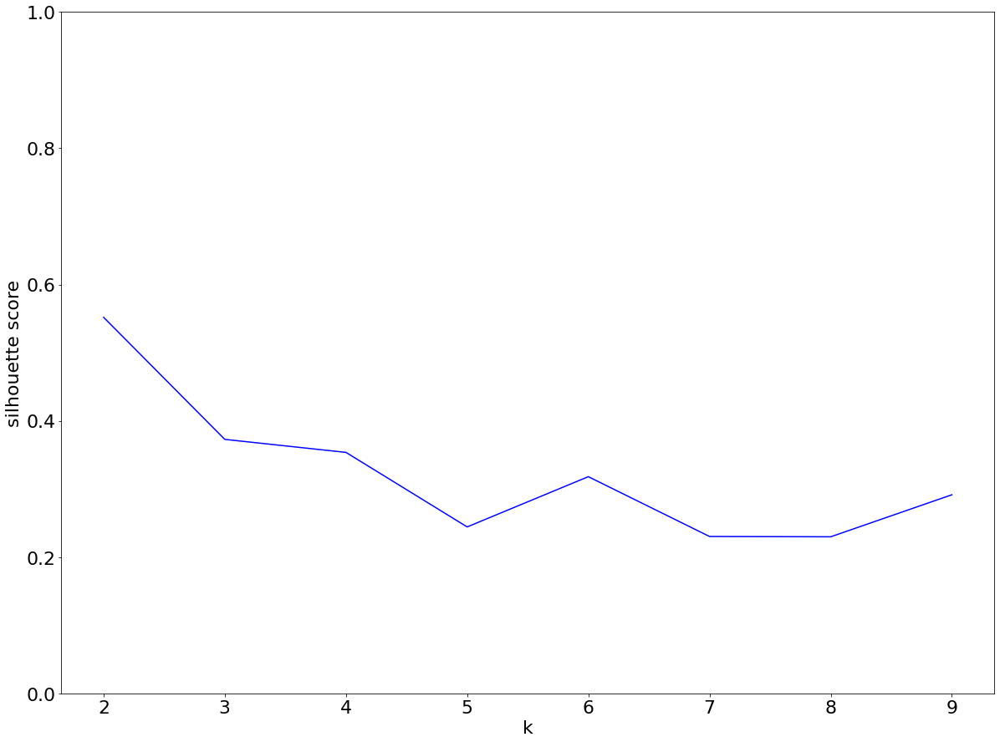

Highest K-Medoids silhouette score for Person 5: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


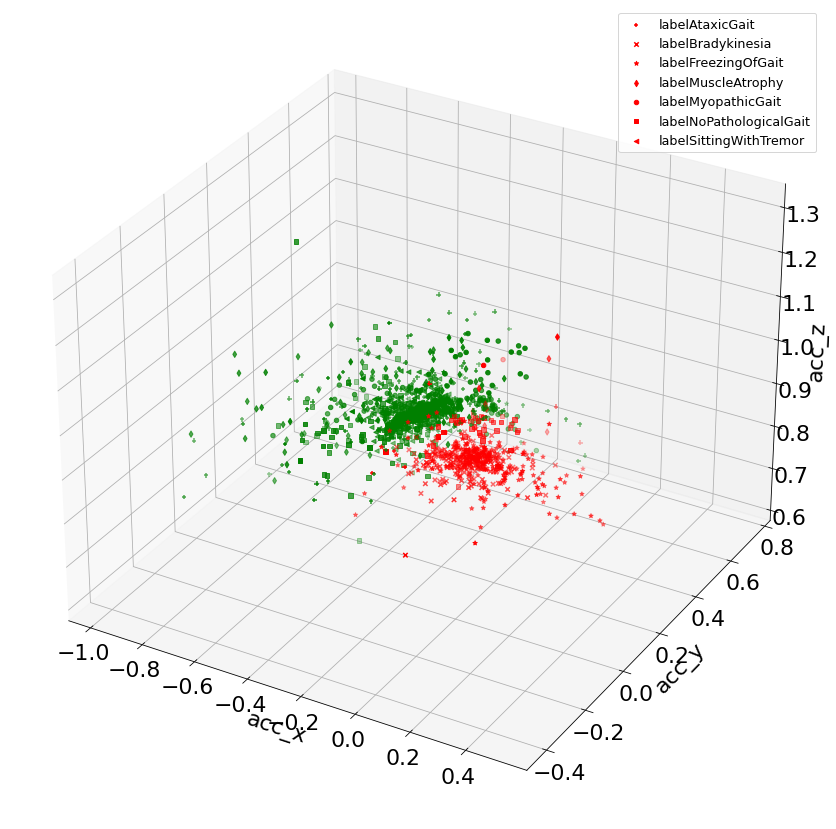

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


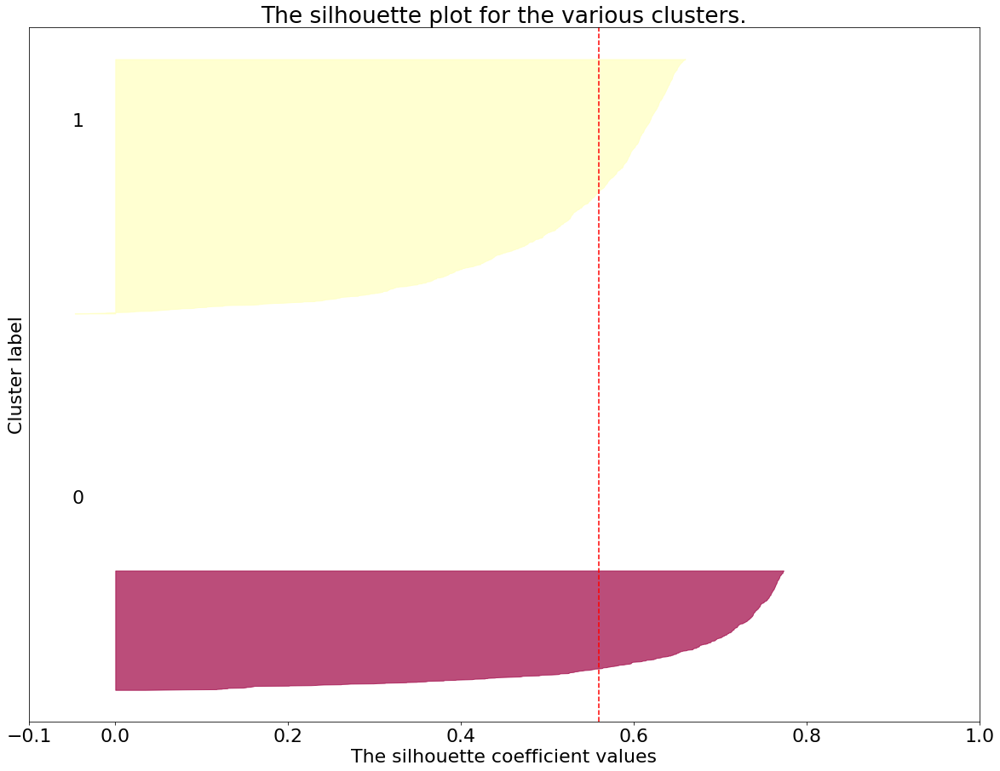

\multirow{2}{*}{ acc_x } & mean  &  0.12 &  -0.26\\
 & std  &  0.10 &  0.13\\
\multirow{2}{*}{ acc_y } & mean  &  -0.06 &  0.13\\
 & std  &  0.08 &  0.14\\
\multirow{2}{*}{ acc_z } & mean  &  0.99 &  0.96\\
 & std  &  0.03 &  0.06\\
labelAtaxicGait  & percentage  &  2.50 \% &  97.50 \%\\
labelBradykinesia  & percentage  &  99.58 \% &  0.42 \%\\
labelFreezingOfGait  & percentage  &  99.17 \% &  0.83 \%\\
labelMuscleAtrophy  & percentage  &  4.18 \% &  95.82 \%\\
labelMyopathicGait  & percentage  &  0.83 \% &  99.17 \%\\
labelNoPathologicalGait  & percentage  &  17.50 \% &  82.50 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  100.00 \%\\
Person 5 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.8255728739589189
k = 3
silhouette = 0.8127867860123543
k = 4
silhouette = 0.7833765743715985
k = 5
silhouette = 0.5445665226027202
k = 6
silhouette = 0.6010649382679512
k = 7
silhouette = 0.5755566648566828
k = 8
silhouette = 0.48530872039599904
k = 9


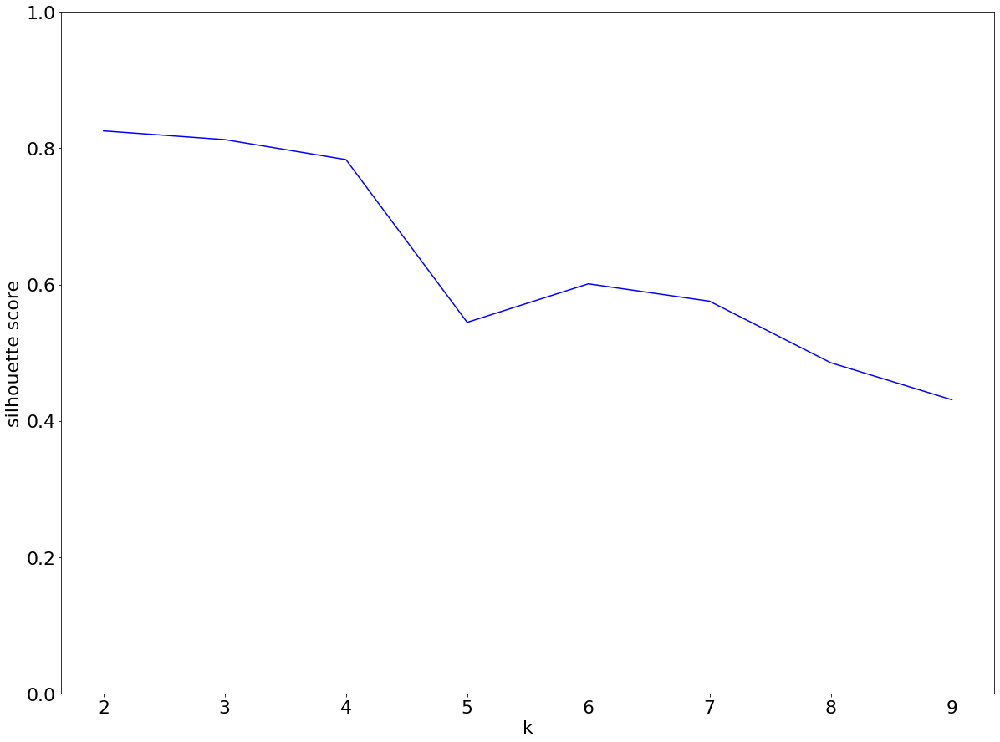

Highest K-Medoids silhouette score for Person 6: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


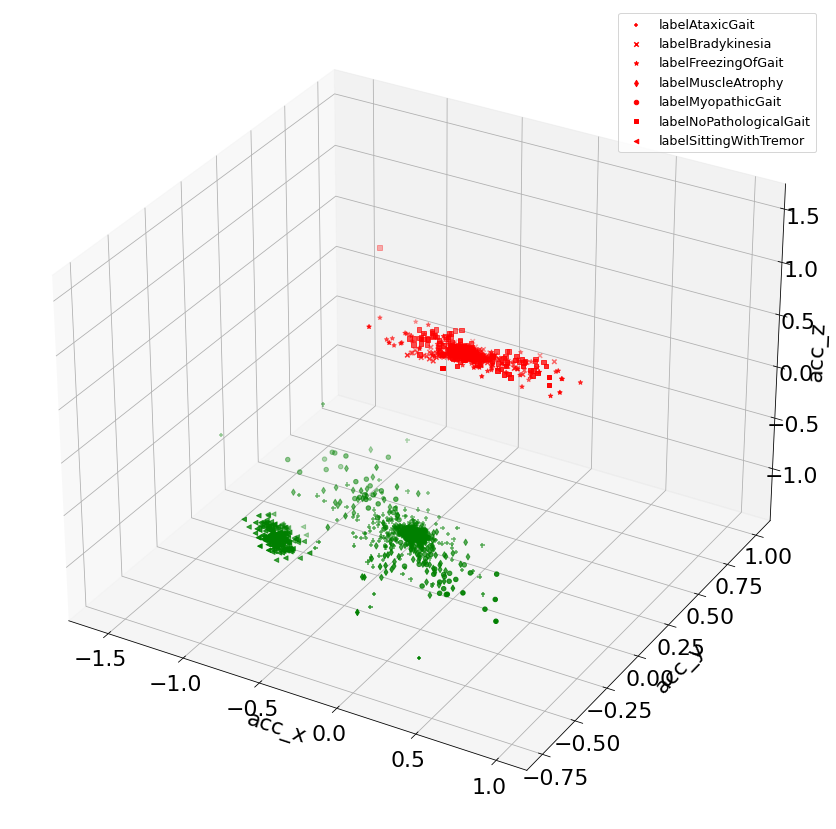

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


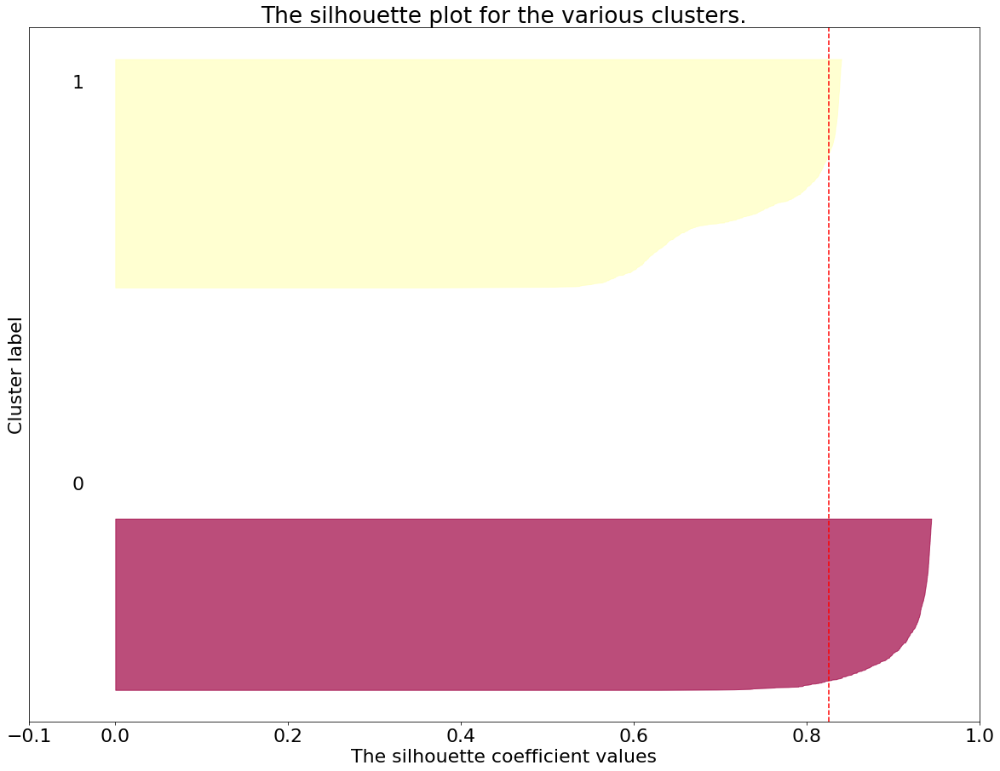

\multirow{2}{*}{ acc_x } & mean  &  0.16 &  -0.36\\
 & std  &  0.14 &  0.22\\
\multirow{2}{*}{ acc_y } & mean  &  -0.09 &  -0.18\\
 & std  &  0.04 &  0.26\\
\multirow{2}{*}{ acc_z } & mean  &  0.99 &  -0.84\\
 & std  &  0.05 &  0.23\\
labelAtaxicGait  & percentage  &  0.00 \% &  100.00 \%\\
labelBradykinesia  & percentage  &  100.00 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  100.00 \% &  0.00 \%\\
labelMuscleAtrophy  & percentage  &  0.00 \% &  100.00 \%\\
labelMyopathicGait  & percentage  &  0.00 \% &  100.00 \%\\
labelNoPathologicalGait  & percentage  &  100.00 \% &  0.00 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  100.00 \%\\
Person 6 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.5822271031081341
k = 3
silhouette = 0.3373474054676623
k = 4
silhouette = 0.35981320565361813
k = 5
silhouette = 0.3367899416285932
k = 6
silhouette = 0.32594747906954746
k = 7
silhouette = 0.2319034138459492
k = 8
silhouette = 0.308638017513662

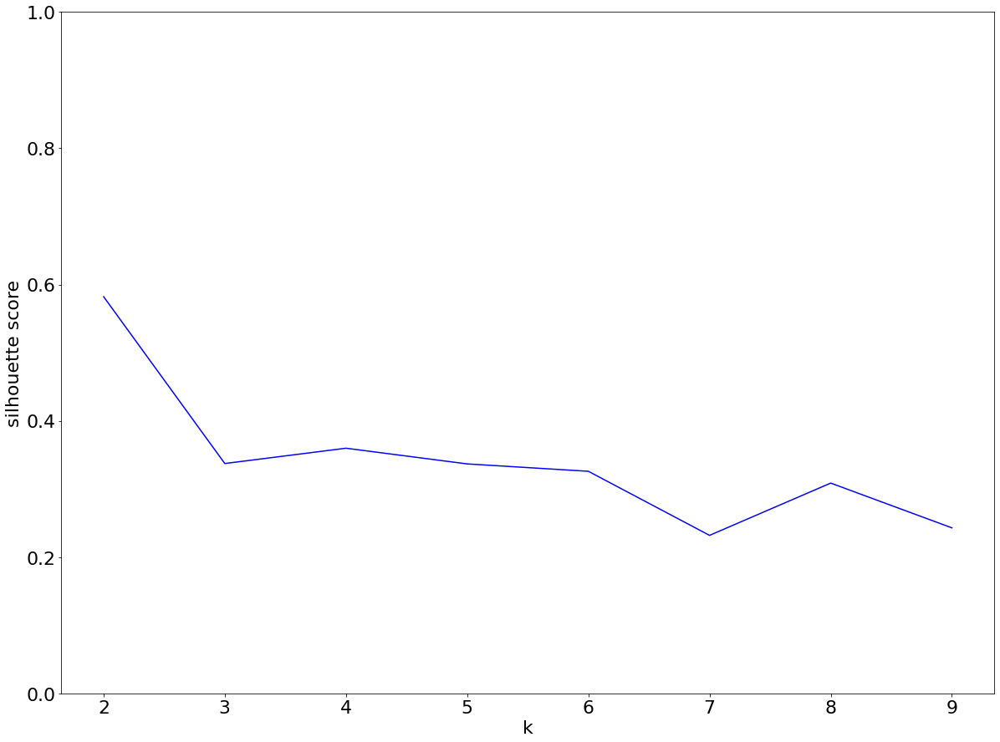

Highest K-Medoids silhouette score for Person 7: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


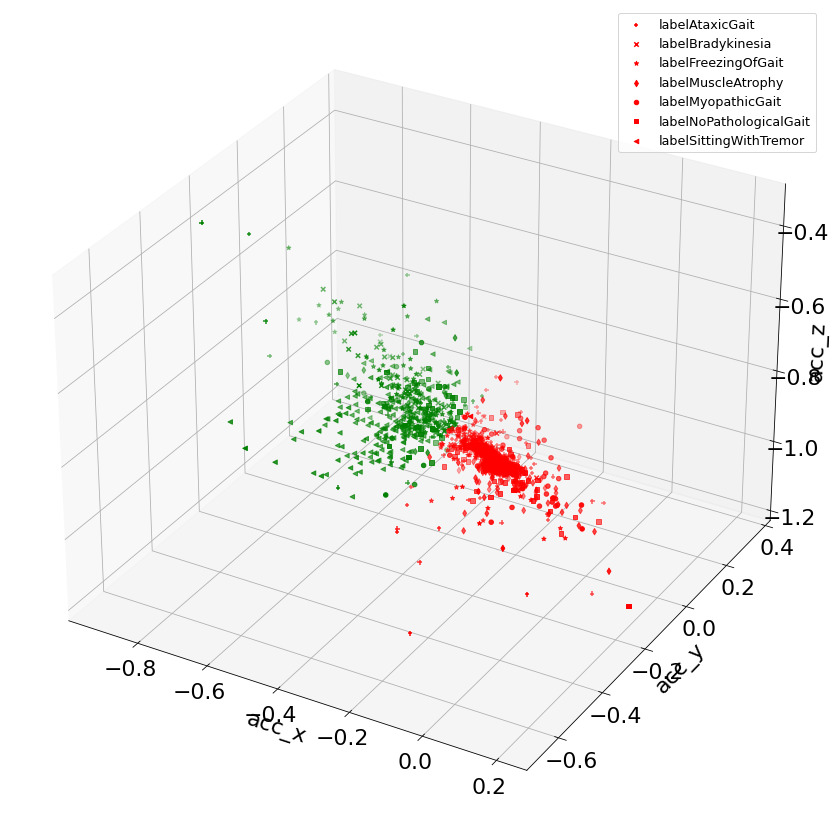

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


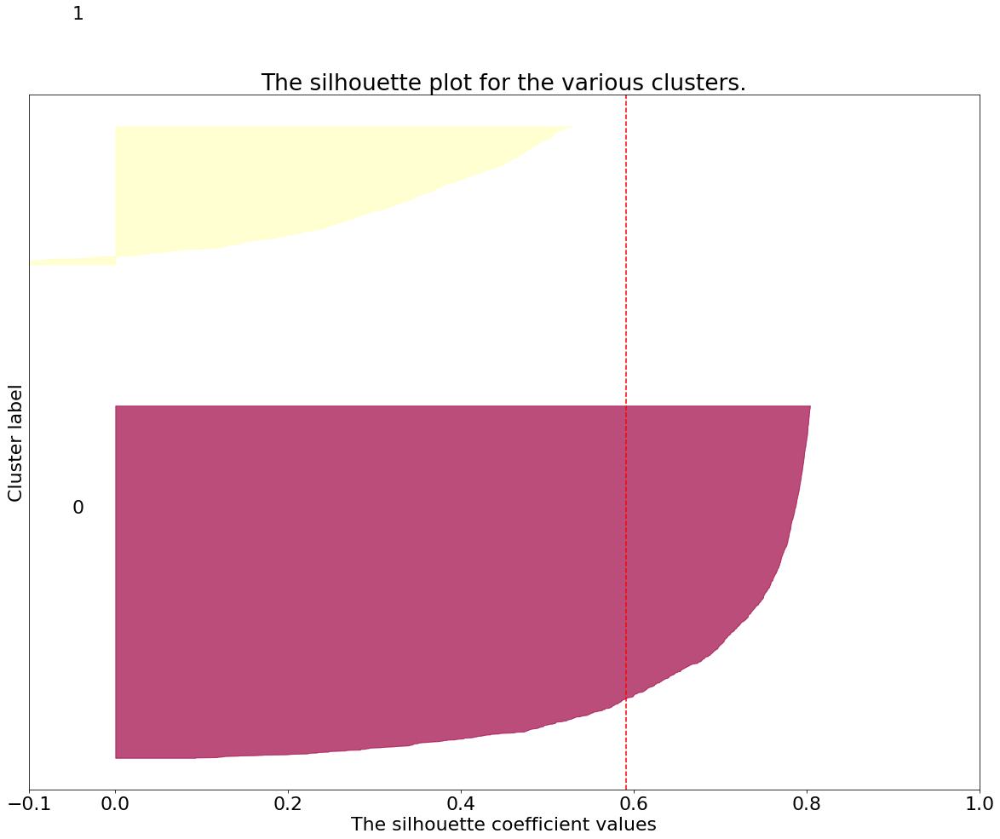

\multirow{2}{*}{ acc_x } & mean  &  -0.24 &  -0.50\\
 & std  &  0.06 &  0.09\\
\multirow{2}{*}{ acc_y } & mean  &  -0.03 &  -0.05\\
 & std  &  0.05 &  0.12\\
\multirow{2}{*}{ acc_z } & mean  &  -0.96 &  -0.86\\
 & std  &  0.03 &  0.07\\
labelAtaxicGait  & percentage  &  86.67 \% &  13.33 \%\\
labelBradykinesia  & percentage  &  78.75 \% &  21.25 \%\\
labelFreezingOfGait  & percentage  &  67.92 \% &  32.08 \%\\
labelMuscleAtrophy  & percentage  &  92.89 \% &  7.11 \%\\
labelMyopathicGait  & percentage  &  92.92 \% &  7.08 \%\\
labelNoPathologicalGait  & percentage  &  83.33 \% &  16.67 \%\\
labelSittingWithTremor  & percentage  &  0.42 \% &  99.58 \%\\
Person 7 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.5405653842828656
k = 3
silhouette = 0.5083740441564429
k = 4
silhouette = 0.505697821423532
k = 5
silhouette = 0.3922641504676629
k = 6
silhouette = 0.35063566722540185
k = 7
silhouette = 0.21168251111140857
k = 8
silhouette = 0.1762802701402967


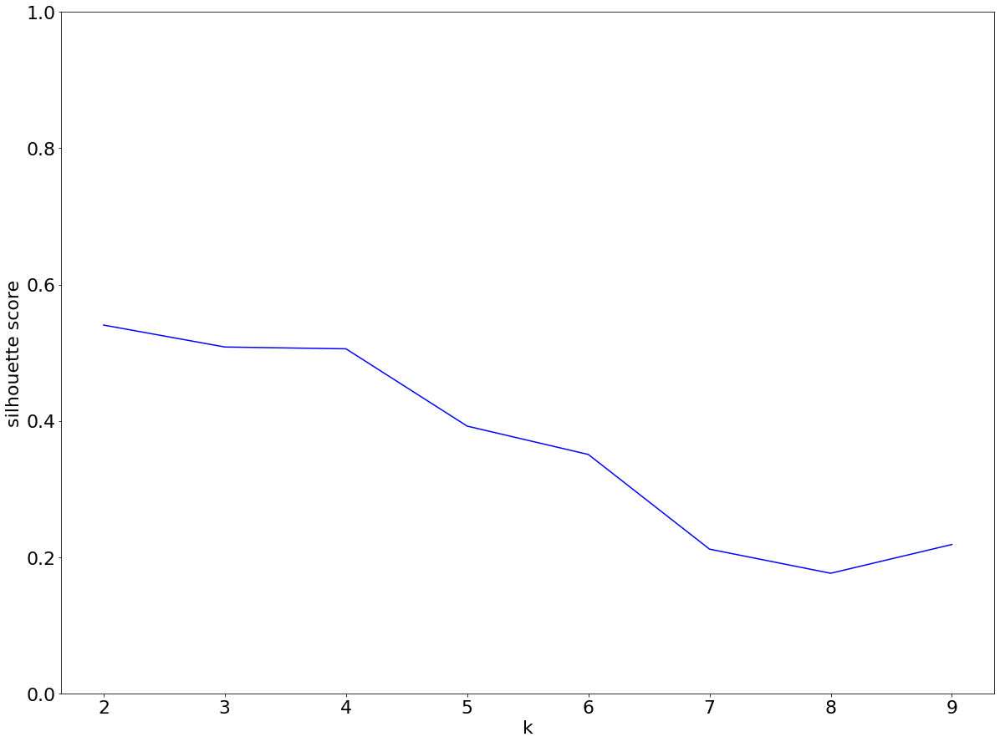

Highest K-Medoids silhouette score for Person 8: k = 2
Highest k = 2
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


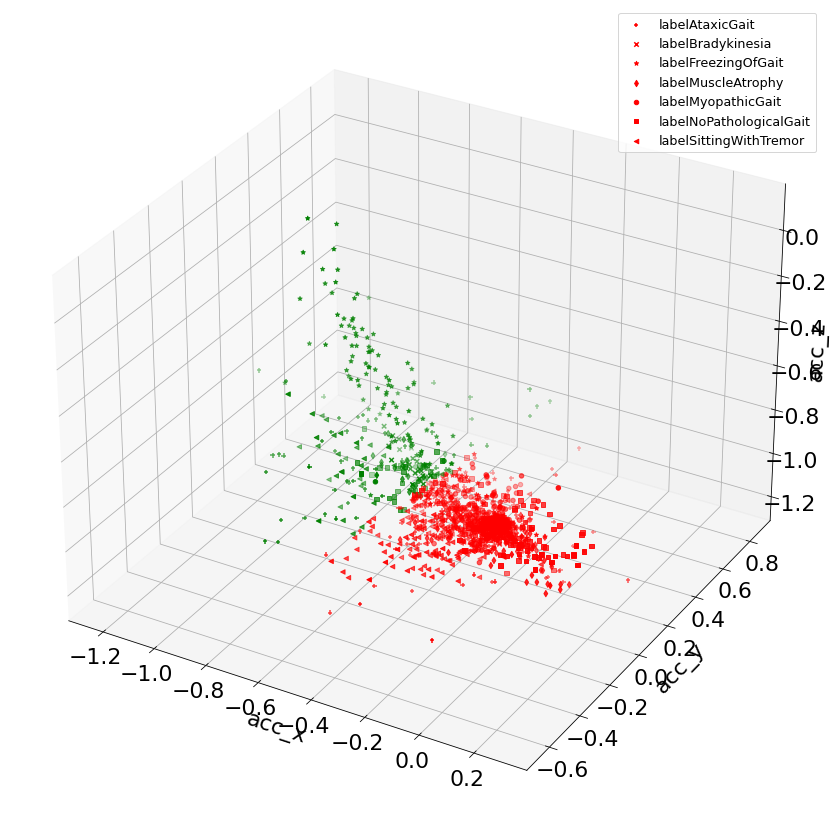

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


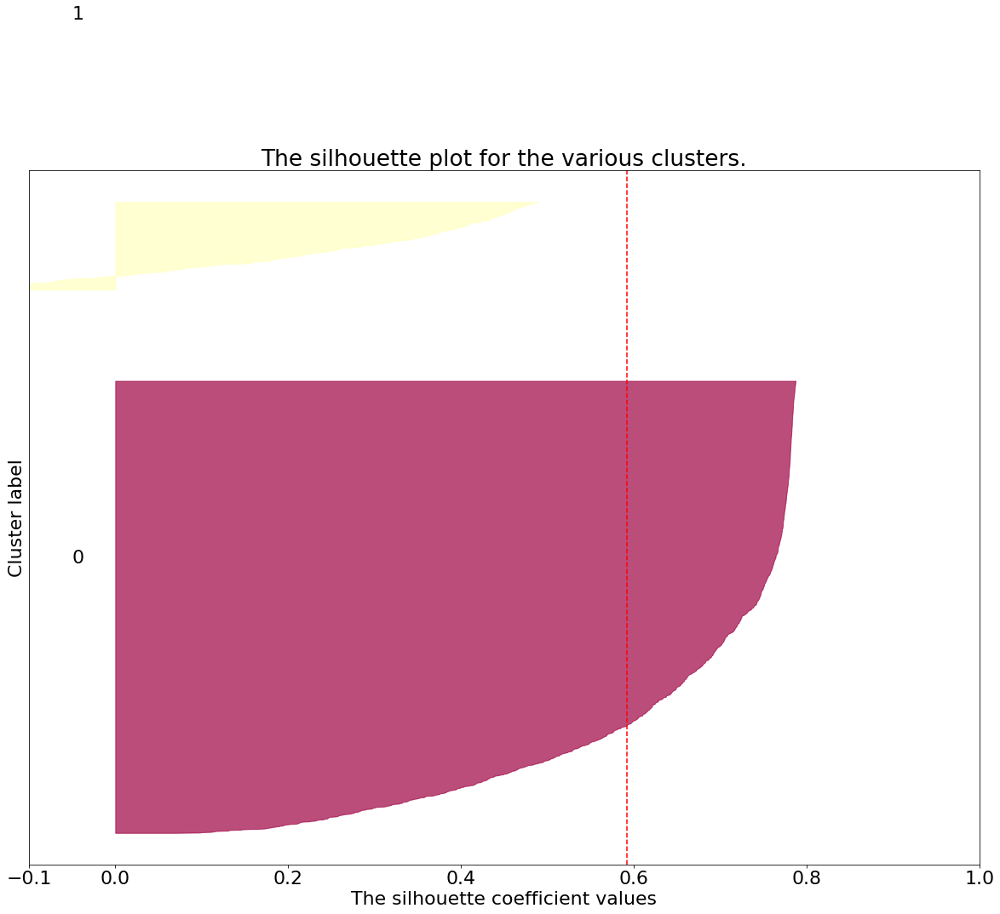

\multirow{2}{*}{ acc_x } & mean  &  -0.22 &  -0.64\\
 & std  &  0.10 &  0.15\\
\multirow{2}{*}{ acc_y } & mean  &  0.05 &  0.12\\
 & std  &  0.11 &  0.20\\
\multirow{2}{*}{ acc_z } & mean  &  -0.98 &  -0.75\\
 & std  &  0.05 &  0.21\\
labelAtaxicGait  & percentage  &  77.08 \% &  22.92 \%\\
labelBradykinesia  & percentage  &  88.75 \% &  11.25 \%\\
labelFreezingOfGait  & percentage  &  58.33 \% &  41.67 \%\\
labelMuscleAtrophy  & percentage  &  92.89 \% &  7.11 \%\\
labelMyopathicGait  & percentage  &  98.33 \% &  1.67 \%\\
labelNoPathologicalGait  & percentage  &  87.92 \% &  12.08 \%\\
labelSittingWithTremor  & percentage  &  82.92 \% &  17.08 \%\\
Person 8 done!
===== k-medoids clustering (Optimal K value search) =====
k = 2
silhouette = 0.4983212069219901
k = 3
silhouette = 0.5161530868597555
k = 4
silhouette = 0.42644898717633195
k = 5
silhouette = 0.432060972700415
k = 6
silhouette = 0.27845808741875266
k = 7
silhouette = 0.29847413838624093
k = 8
silhouette = 0.31181468438122345

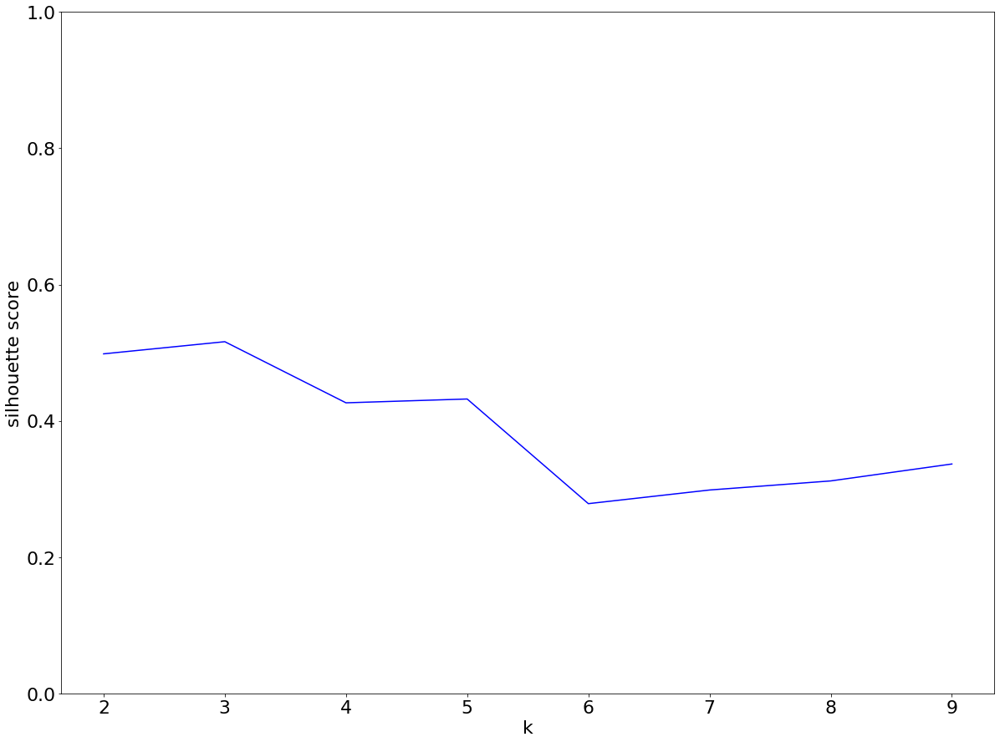

Highest K-Medoids silhouette score for Person 9: k = 3
Highest k = 3
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


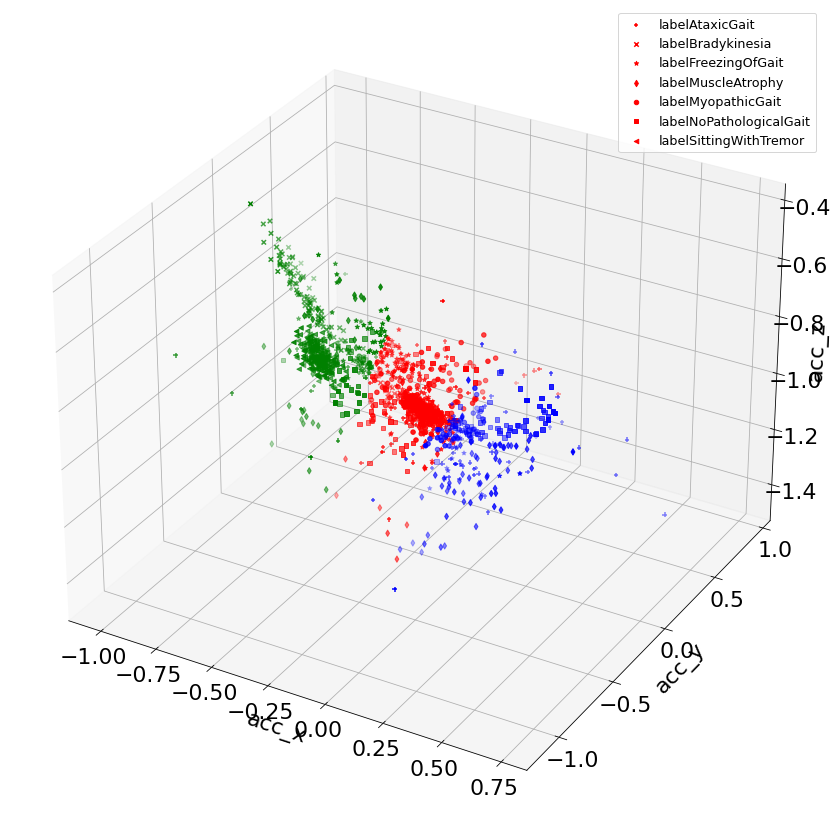

Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


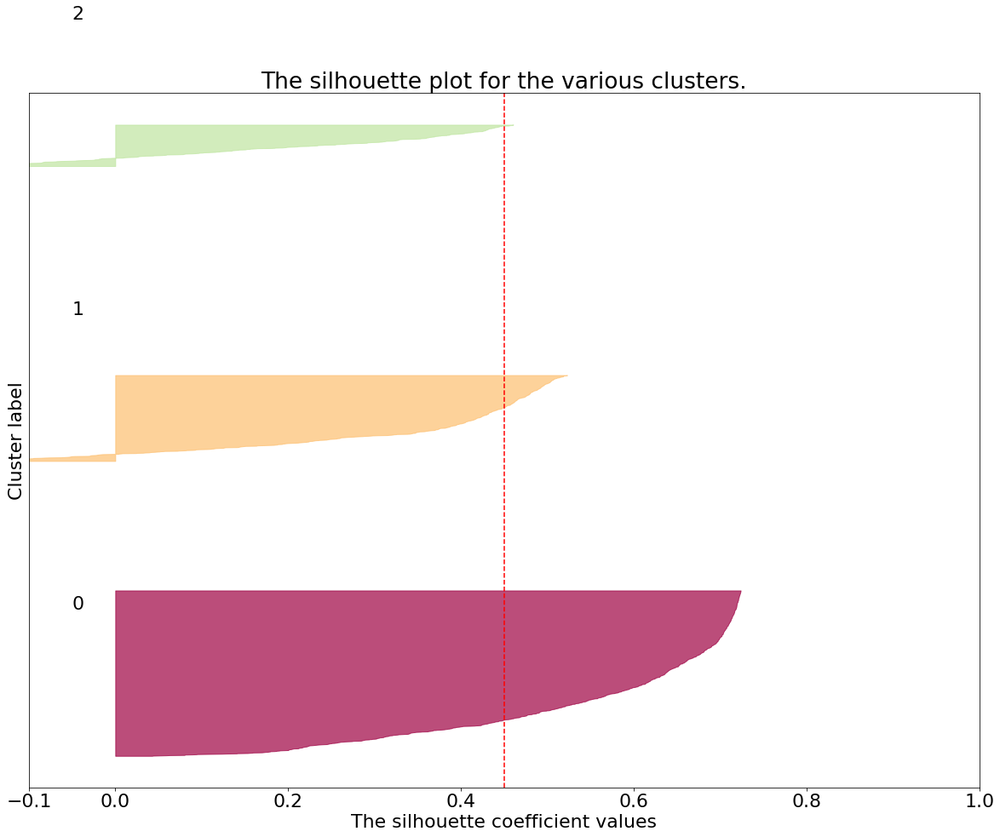

\multirow{2}{*}{ acc_x } & mean  &  -0.20 &  -0.56 &  0.10\\
 & std  &  0.08 &  0.12 &  0.14\\
\multirow{2}{*}{ acc_y } & mean  &  -0.06 &  -0.17 &  -0.13\\
 & std  &  0.10 &  0.18 &  0.15\\
\multirow{2}{*}{ acc_z } & mean  &  -0.97 &  -0.81 &  -1.02\\
 & std  &  0.06 &  0.12 &  0.11\\
labelAtaxicGait  & percentage  &  66.67 \% &  12.08 \% &  21.25 \%\\
labelBradykinesia  & percentage  &  54.17 \% &  45.83 \% &  0.00 \%\\
labelFreezingOfGait  & percentage  &  69.58 \% &  20.00 \% &  10.42 \%\\
labelMuscleAtrophy  & percentage  &  59.83 \% &  13.81 \% &  26.36 \%\\
labelMyopathicGait  & percentage  &  82.50 \% &  1.67 \% &  15.83 \%\\
labelNoPathologicalGait  & percentage  &  62.92 \% &  12.08 \% &  25.00 \%\\
labelSittingWithTremor  & percentage  &  0.00 \% &  100.00 \% &  0.00 \%\\
Person 9 done!


In [278]:
for per in range (10):
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)
    PARAMS_CHOSEN = ['acc_x', 'acc_y', 'acc_z']
    # PARAMS_CHOSEN = ['gyr_x', 'gyr_y', 'gyr_z']

    DataViz = VisualizeDataset()
    clusteringNH = NonHierarchicalClustering()

    k_values = range(2, 10)
    silhouette_values = []

    # Simulations to find k with highest silhouette score.
    #
    print('===== k-medoids clustering (Optimal K value search) =====')
    for k in k_values:
        print(f'k = {k}')
        dataset_cluster = clusteringNH.k_medoids_over_instances(copy.deepcopy(dataset), PARAMS_CHOSEN, k, 'default', 20, n_inits=10)
        silhouette_score = dataset_cluster['silhouette'].mean()

        print(f'silhouette = {silhouette_score}')
        silhouette_values.append(silhouette_score)

    DataViz.plot_xy(x=[k_values], y=[silhouette_values], xlabel='k', ylabel='silhouette score', ylim=[0, 1], line_styles=['b-'])

    # And run the km with the highest silhouette score.
    #
    k_best = k_values[np.argmax(silhouette_values)]
    print(f'Highest K-Medoids silhouette score for Person {per}: k = {k_best}')
    
    # =============================== Clustering, 3d-Visualizing & File Saving =============================== # 
    
    clusteringNH = NonHierarchicalClustering()
    print(f'Highest k = {k_best}')
    dataset = clusteringNH.k_means_over_instances(dataset, PARAMS_CHOSEN, k_best, 'default', 50, 50)

    DataViz.plot_clusters_3d(dataset, PARAMS_CHOSEN, 'cluster', ['label'])
    DataViz.plot_silhouette(dataset, 'cluster', 'silhouette')
    util.print_latex_statistics_clusters(dataset, 'cluster', PARAMS_CHOSEN, 'label')

    dataset = dataset.drop(columns=['silhouette'])
    dataset.to_csv(f'./parkinson_dataset/csv/chapter_5/k_medoids/chapter5_kmedoids_acc_per{per}.csv')
    print(f'Person {per} done!')

### Agglomerative

===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.4997011434187387
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


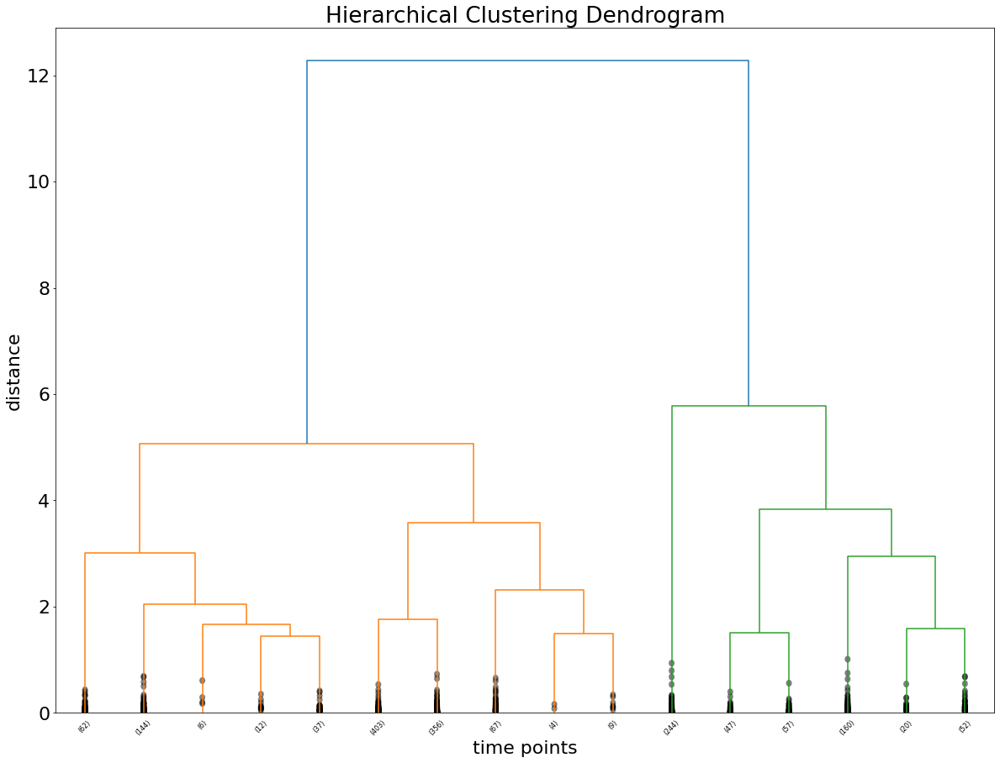

k = 3...
Silhouette = 0.5121461555701982
k = 4...
Silhouette = 0.4320802200219481
k = 5...
Silhouette = 0.4430042786838671
k = 6...
Silhouette = 0.4633900868158347
k = 7...
Silhouette = 0.4565964057989887
k = 8...
Silhouette = 0.4565880661037197
k = 9...
Silhouette = 0.46449469476310284
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


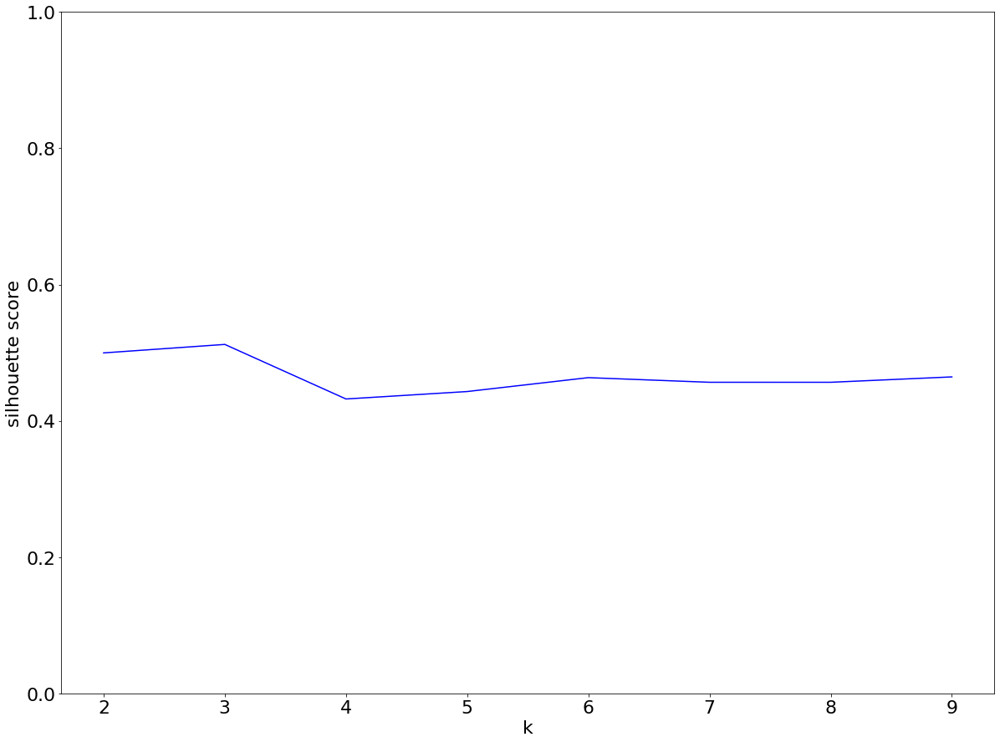

Person 0 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.46769262082847335
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


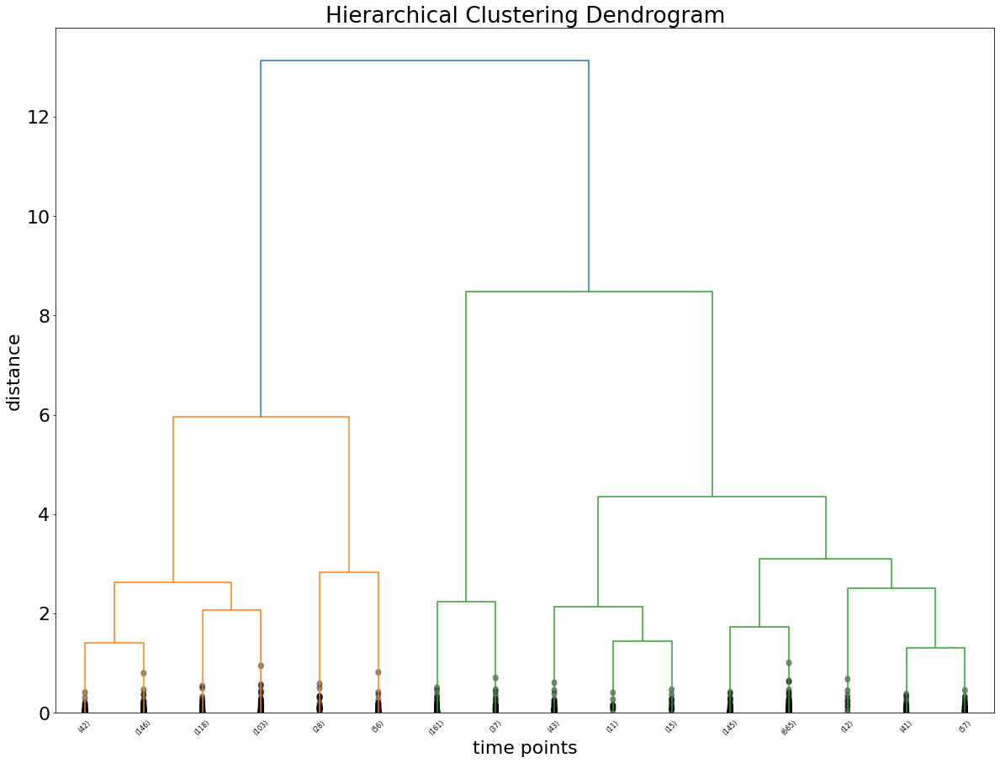

k = 3...
Silhouette = 0.4874020256763657
k = 4...
Silhouette = 0.4820159342130657
k = 5...
Silhouette = 0.5142279419643827
k = 6...
Silhouette = 0.49289455887936934
k = 7...
Silhouette = 0.4985371197462335
k = 8...
Silhouette = 0.46877678152403957
k = 9...
Silhouette = 0.4546594764007262
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


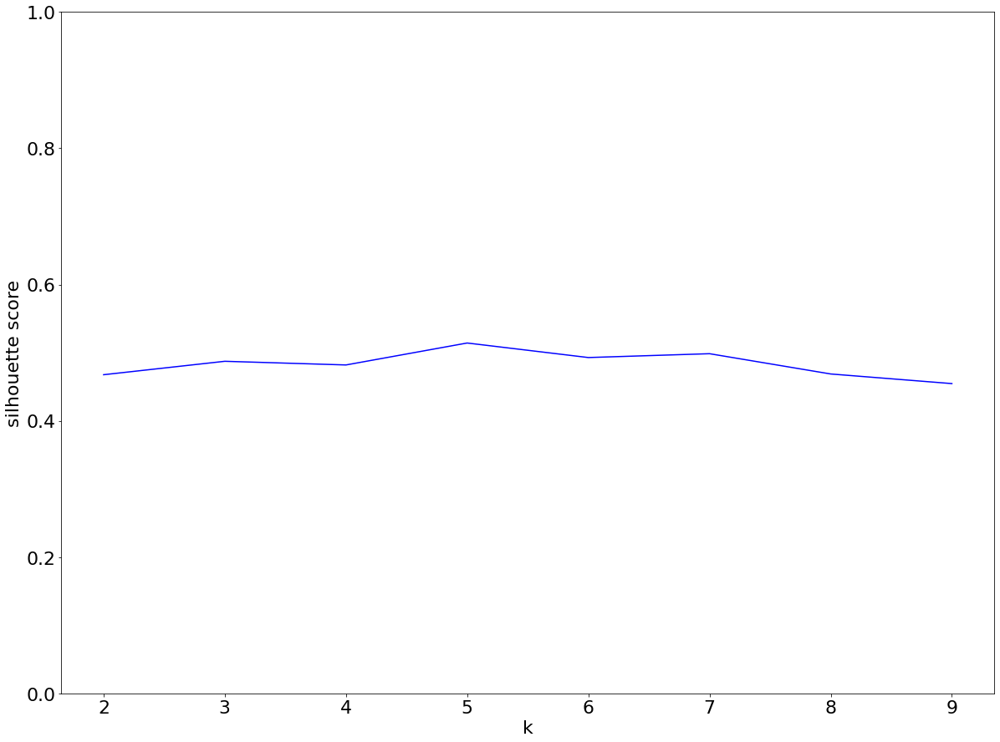

Person 1 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.5107025135490488
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


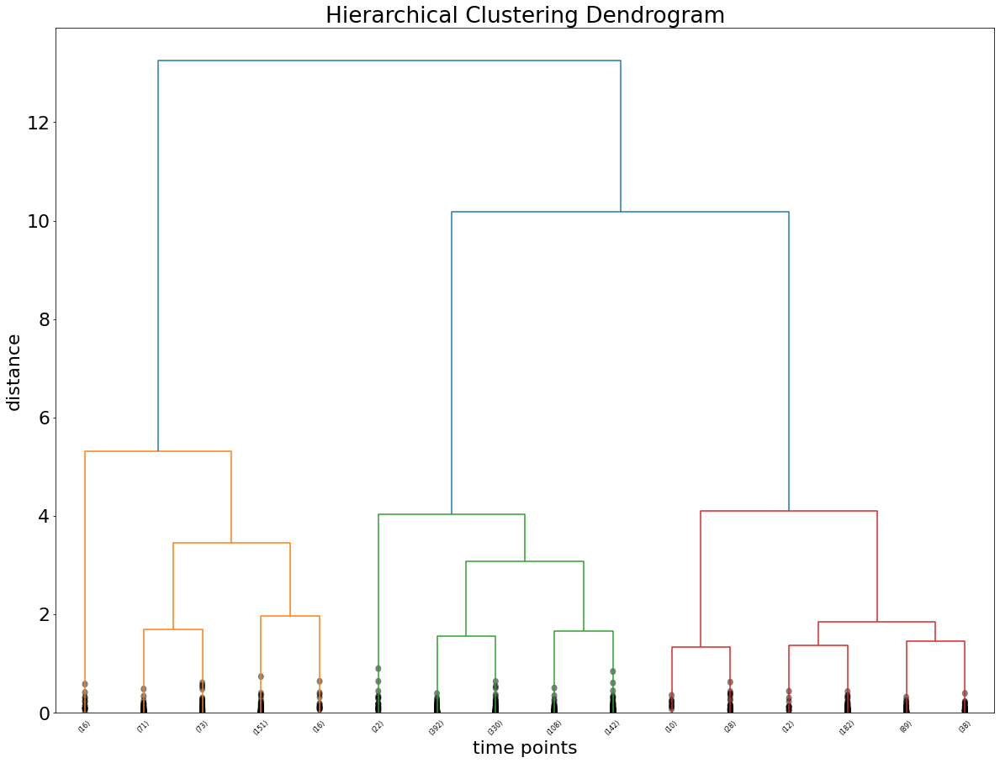

k = 3...
Silhouette = 0.556193438388097
k = 4...
Silhouette = 0.56263512591994
k = 5...
Silhouette = 0.5773958065495719
k = 6...
Silhouette = 0.5939327821374033
k = 7...
Silhouette = 0.5524532899853178
k = 8...
Silhouette = 0.4632185446062927
k = 9...
Silhouette = 0.4707094412814595
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


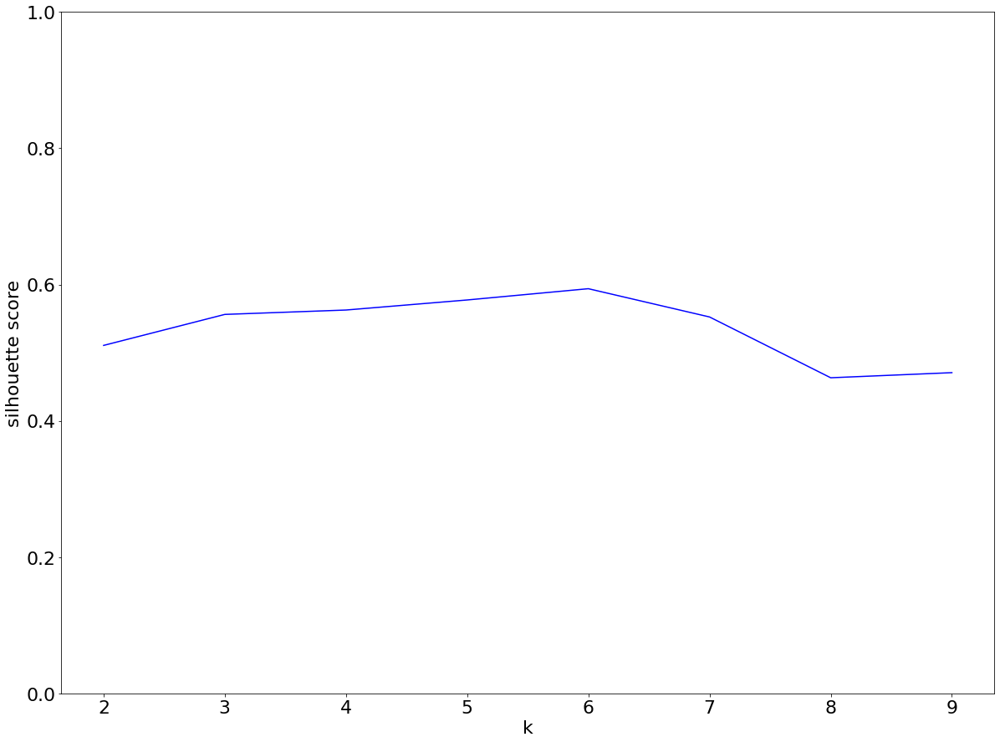

Person 2 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.4330843598070239
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


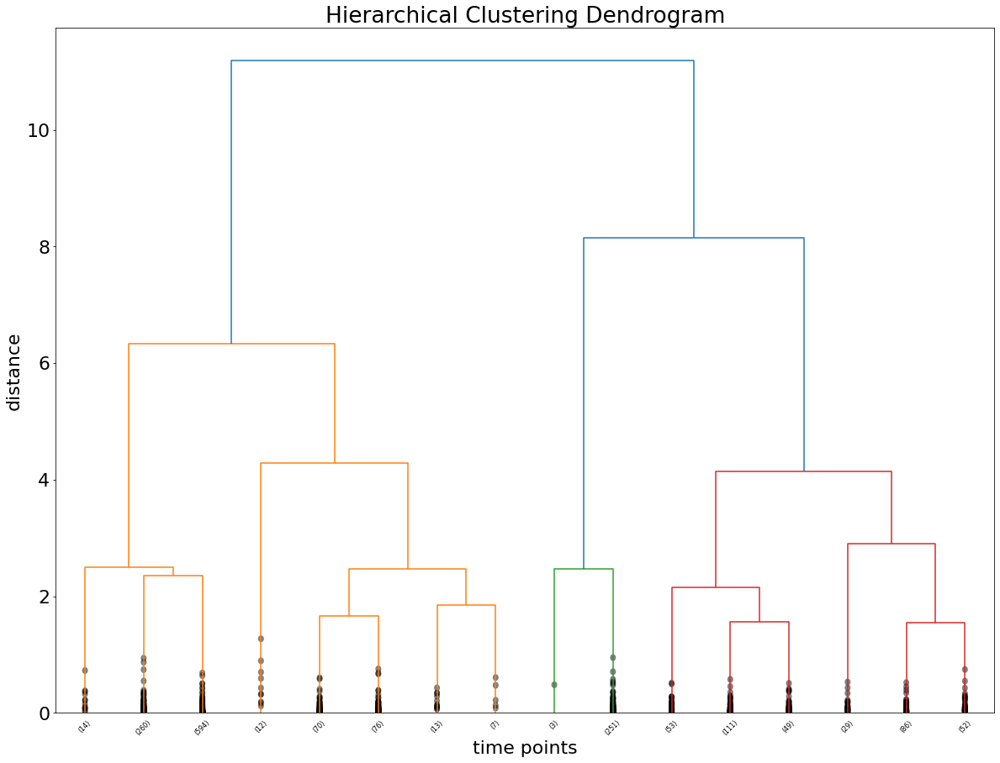

k = 3...
Silhouette = 0.5106969904608395
k = 4...
Silhouette = 0.5123140830389105
k = 5...
Silhouette = 0.5118441348985131
k = 6...
Silhouette = 0.4849891752514699
k = 7...
Silhouette = 0.487381621560085
k = 8...
Silhouette = 0.497724547421297
k = 9...
Silhouette = 0.49077980978392216
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


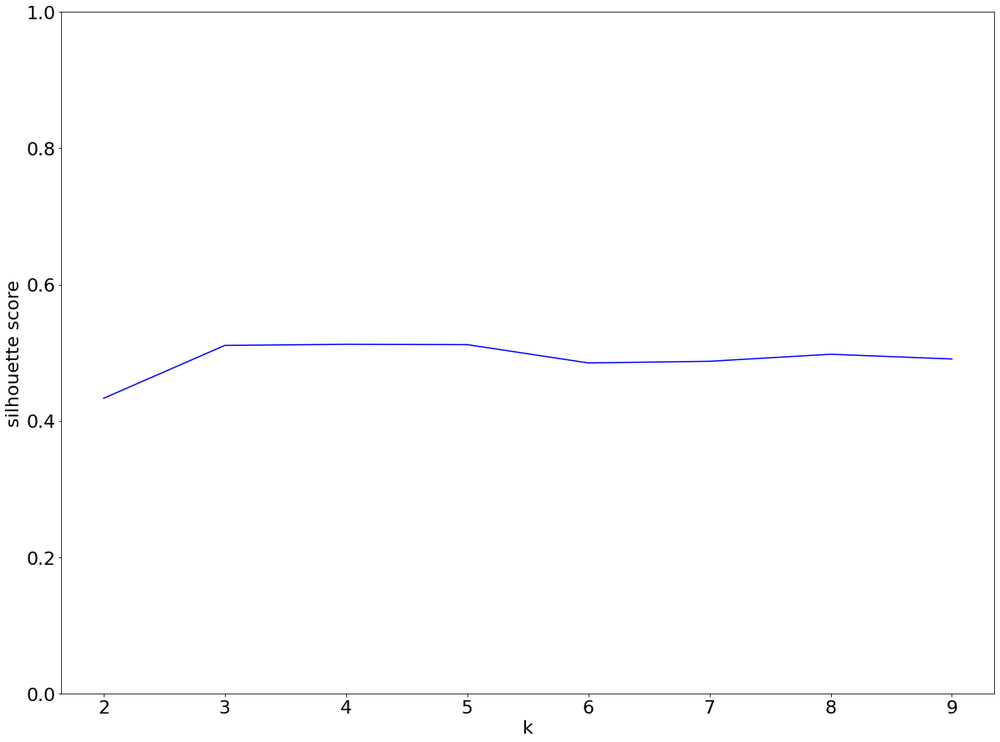

Person 3 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.3649123276179141
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


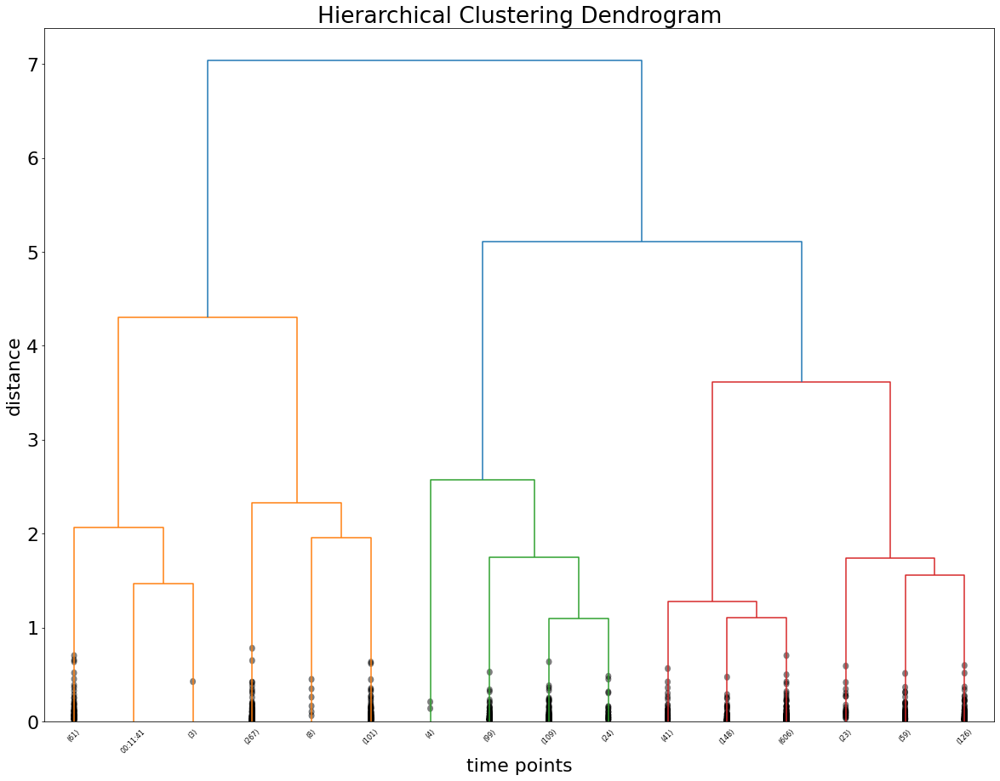

k = 3...
Silhouette = 0.3907455833753499
k = 4...
Silhouette = 0.38007630905125045
k = 5...
Silhouette = 0.37691218560370243
k = 6...
Silhouette = 0.3832063962166529
k = 7...
Silhouette = 0.3524349698999128
k = 8...
Silhouette = 0.3559440874205288
k = 9...
Silhouette = 0.35845662675849893
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


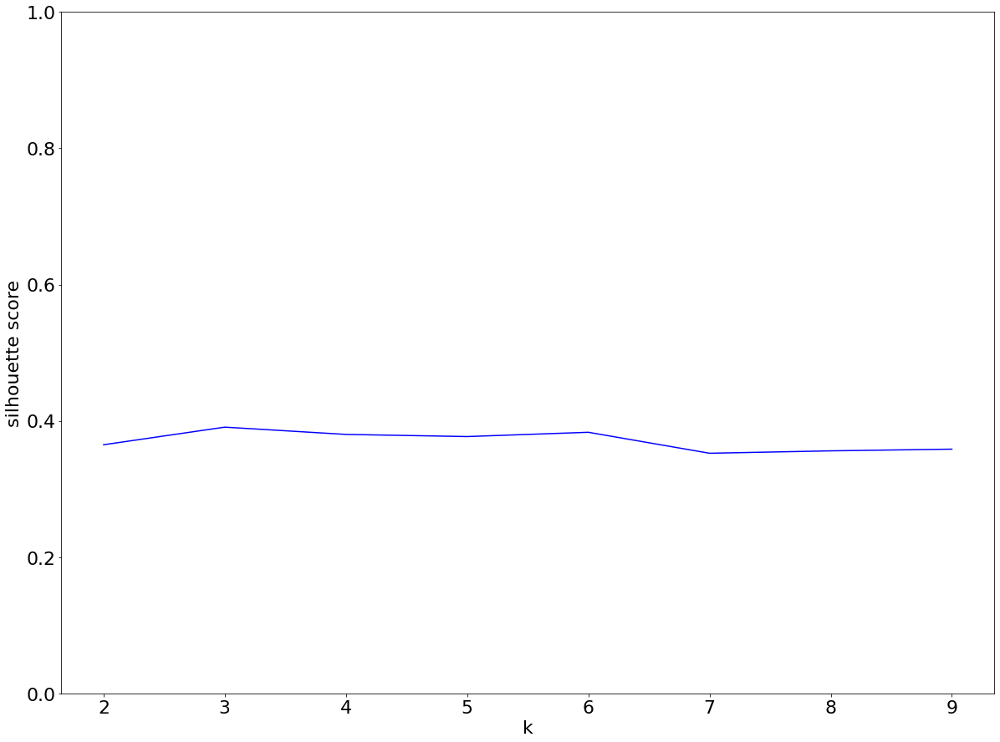

Person 4 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.5462396837878808
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


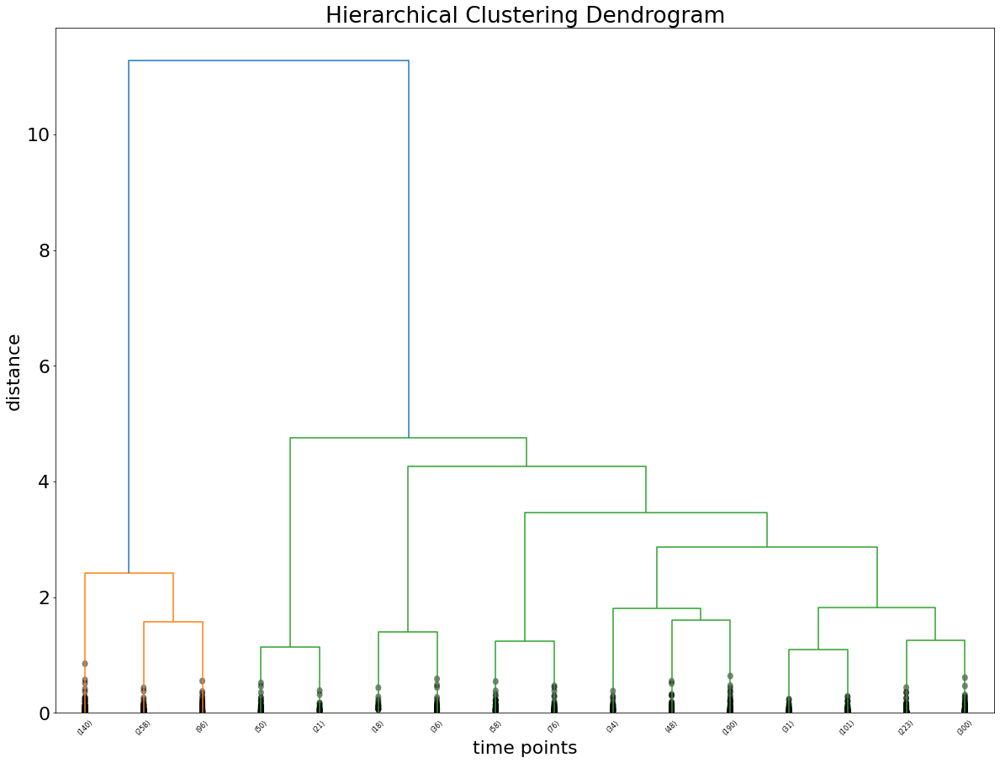

k = 3...
Silhouette = 0.5324672430317196
k = 4...
Silhouette = 0.5382132557048901
k = 5...
Silhouette = 0.4410902797544518
k = 6...
Silhouette = 0.3734363269149552
k = 7...
Silhouette = 0.32270758743003386
k = 8...
Silhouette = 0.2799317721440922
k = 9...
Silhouette = 0.28054243797312456
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


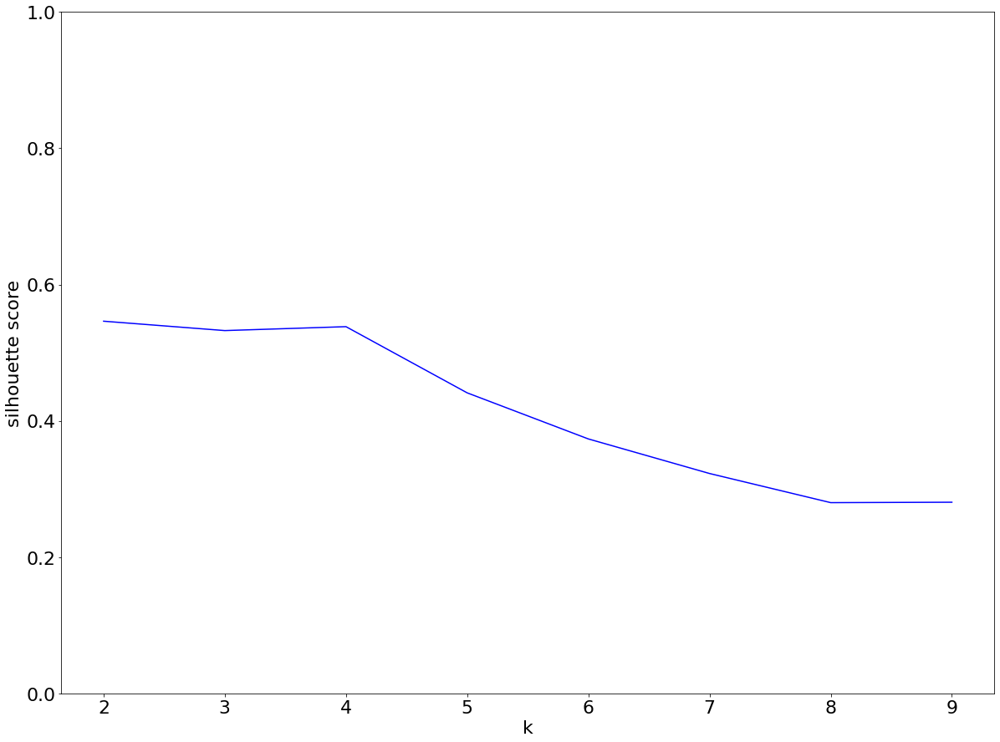

Person 5 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.8255728739589189
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


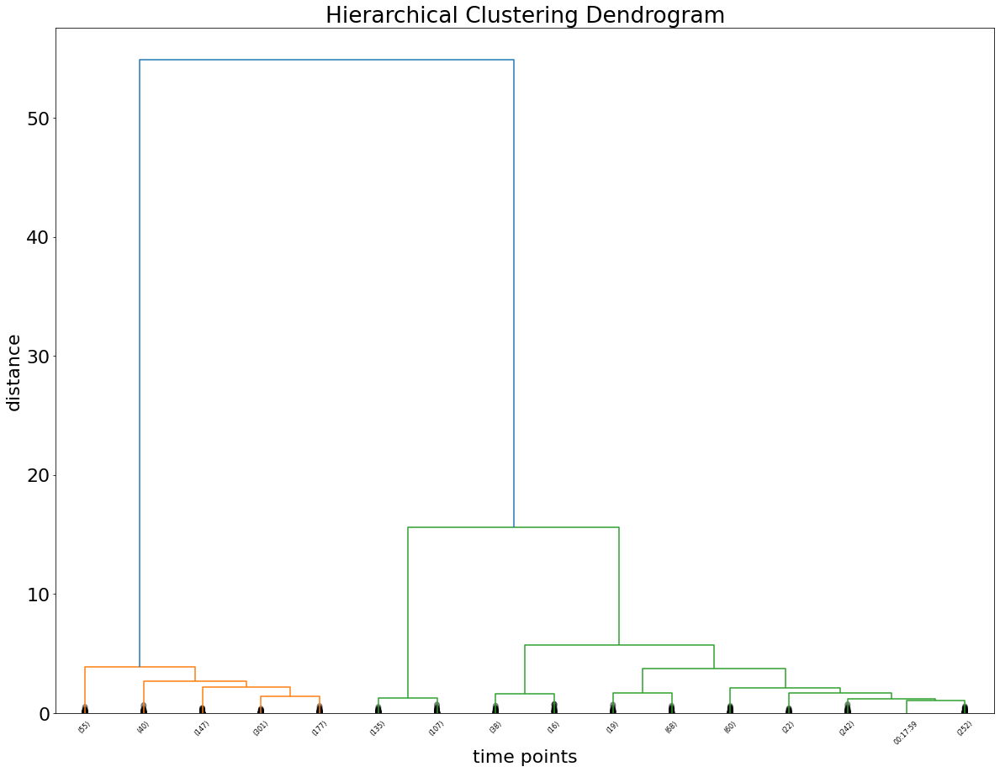

k = 3...
Silhouette = 0.8160385266270718
k = 4...
Silhouette = 0.7975717114488767
k = 5...
Silhouette = 0.6845900432656936
k = 6...
Silhouette = 0.6238727872023867
k = 7...
Silhouette = 0.5989311478651057
k = 8...
Silhouette = 0.5336229949185428
k = 9...
Silhouette = 0.4997032899779842
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


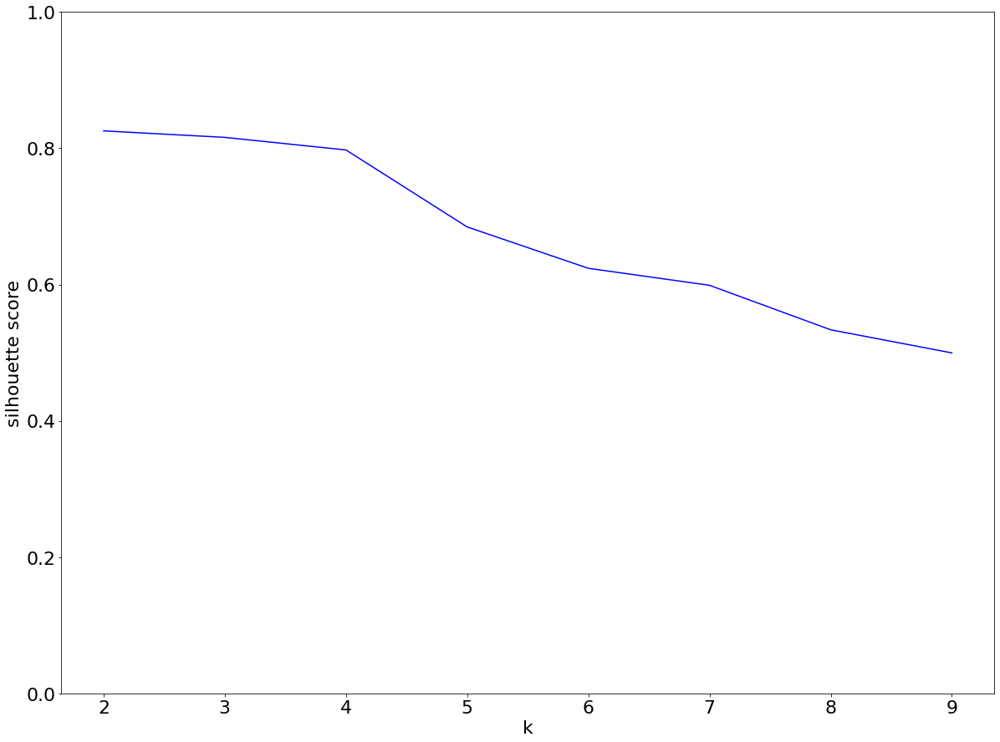

Person 6 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.5763306436813551
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


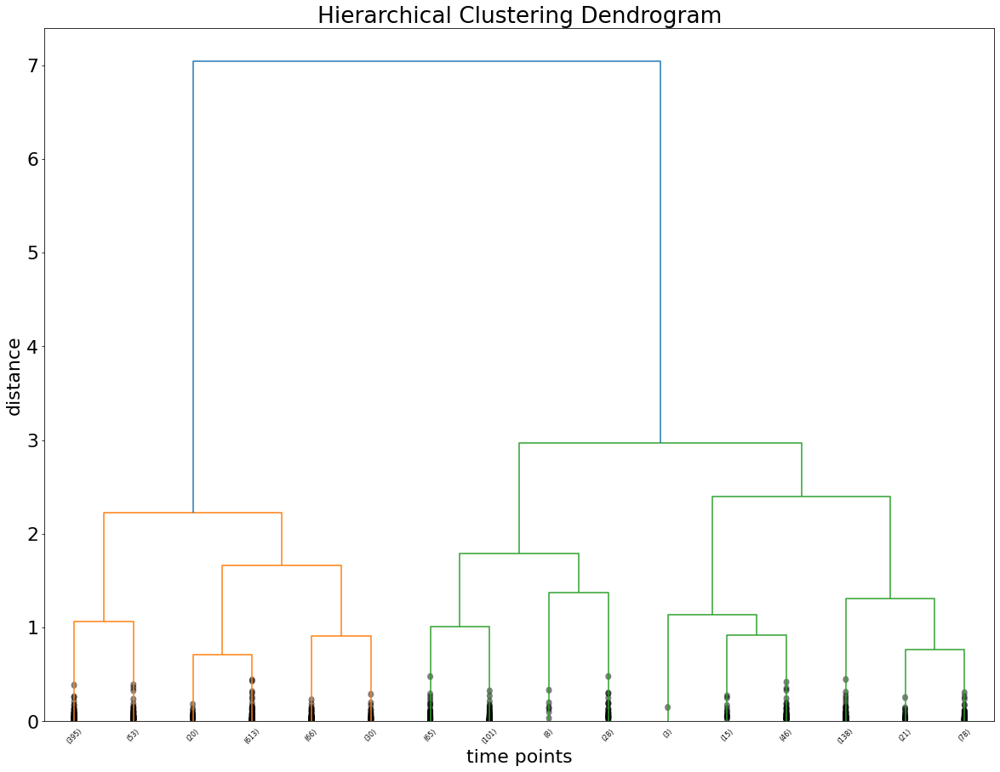

k = 3...
Silhouette = 0.5552817194132342
k = 4...
Silhouette = 0.5163770787439144
k = 5...
Silhouette = 0.3304835322566275
k = 6...
Silhouette = 0.3361107488293515
k = 7...
Silhouette = 0.34677835045357286
k = 8...
Silhouette = 0.3498944960858299
k = 9...
Silhouette = 0.34084181628891436
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


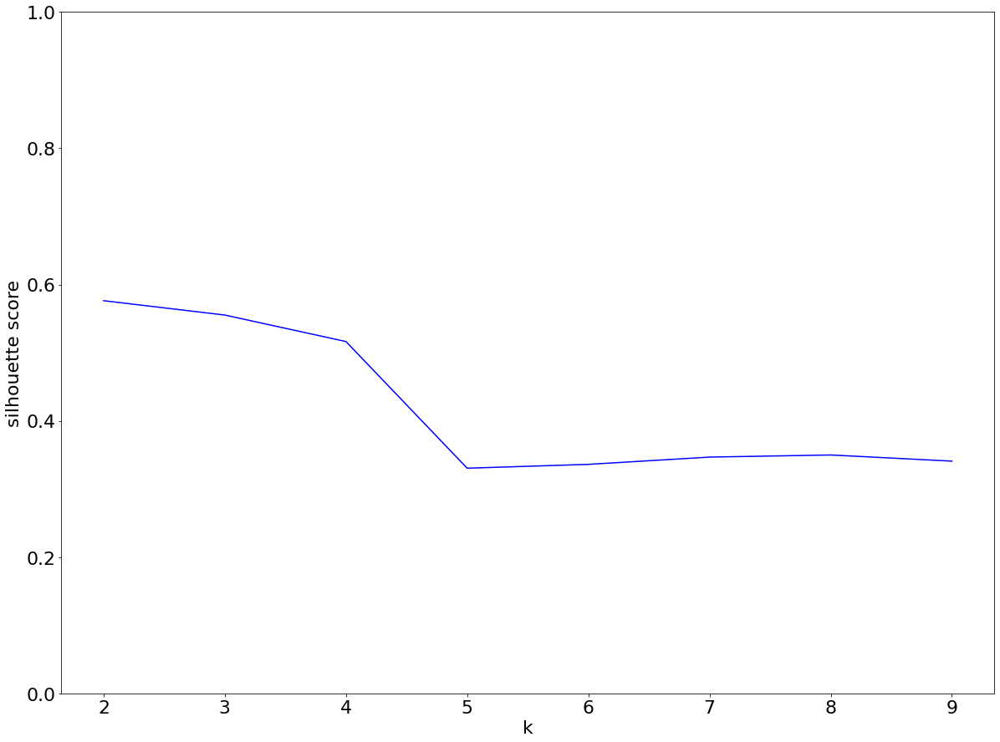

Person 7 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.38049873541152074
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


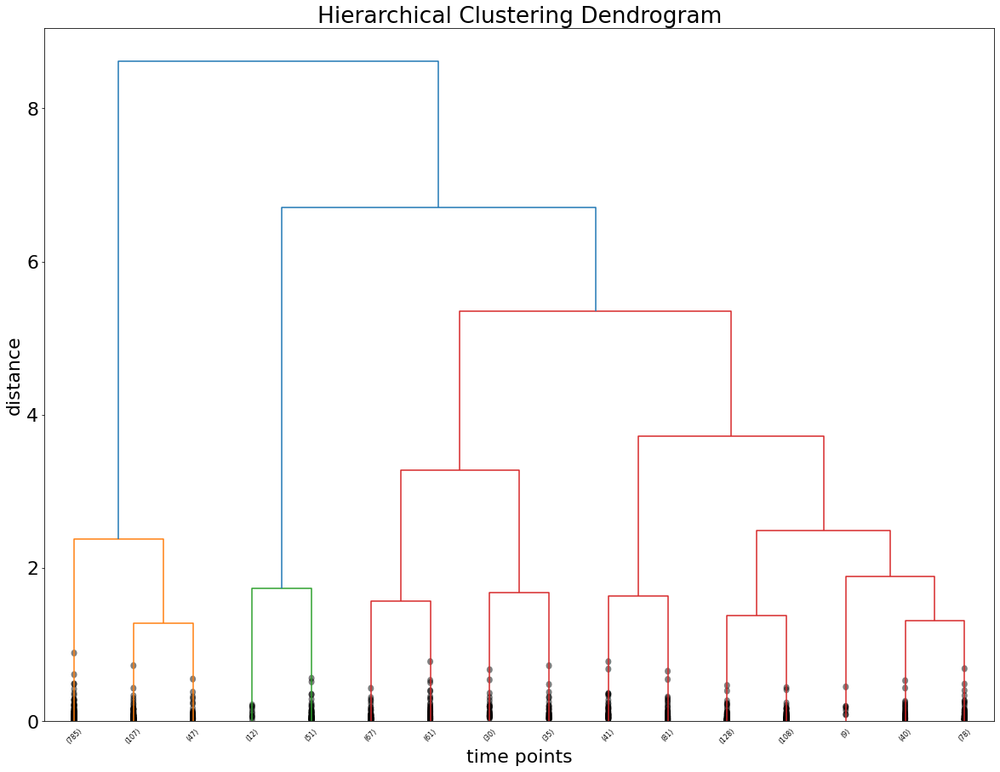

k = 3...
Silhouette = 0.3916930249120793
k = 4...
Silhouette = 0.424659180003535
k = 5...
Silhouette = 0.3887074557994037
k = 6...
Silhouette = 0.40232434193418776
k = 7...
Silhouette = 0.3787702391135016
k = 8...
Silhouette = 0.3662235813359618
k = 9...
Silhouette = 0.37196571796954914
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


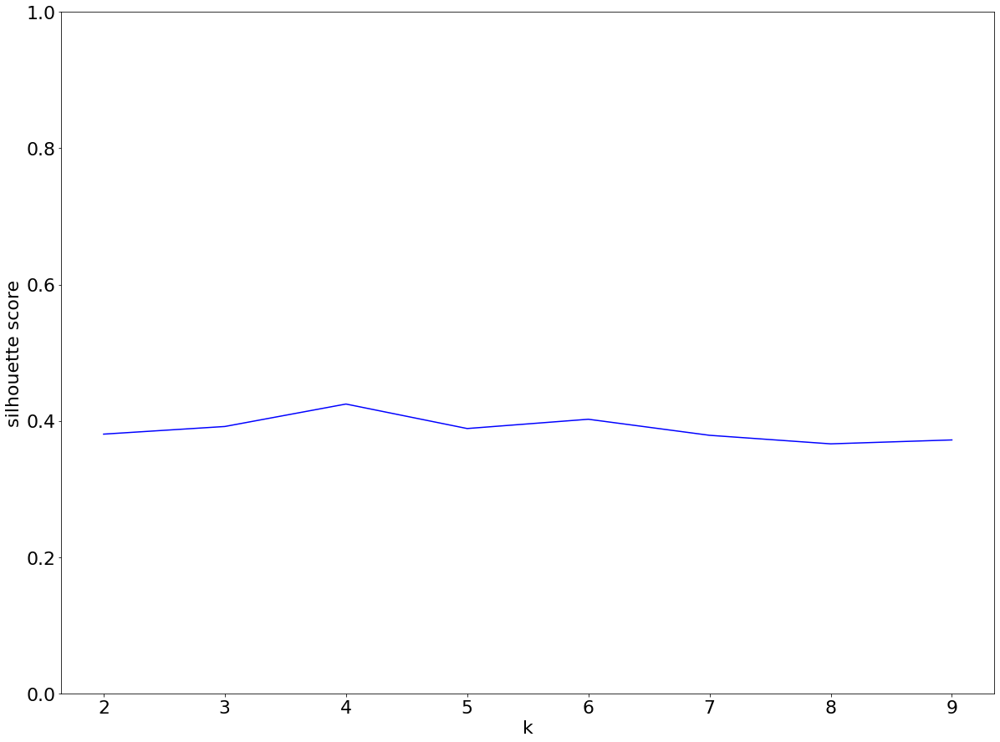

Person 8 done!
===== Agglomerative clustering (Optimal K value search) =====
k = 2...
Silhouette = 0.4997011434187387
Figure saved to figures\figure_1.png
Figure saved to figures\figure_1.pdf


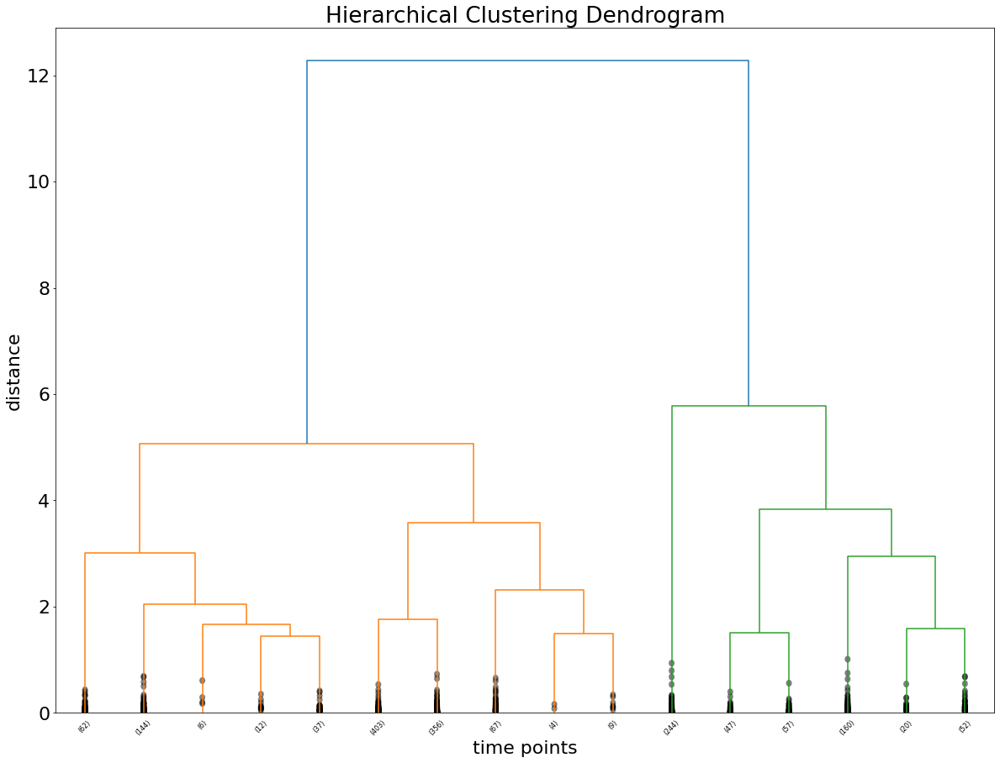

k = 3...
Silhouette = 0.5121461555701982
k = 4...
Silhouette = 0.4320802200219481
k = 5...
Silhouette = 0.4430042786838671
k = 6...
Silhouette = 0.4633900868158347
k = 7...
Silhouette = 0.4565964057989887
k = 8...
Silhouette = 0.4565880661037197
k = 9...
Silhouette = 0.46449469476310284
Figure saved to figures\figure_2.png
Figure saved to figures\figure_2.pdf


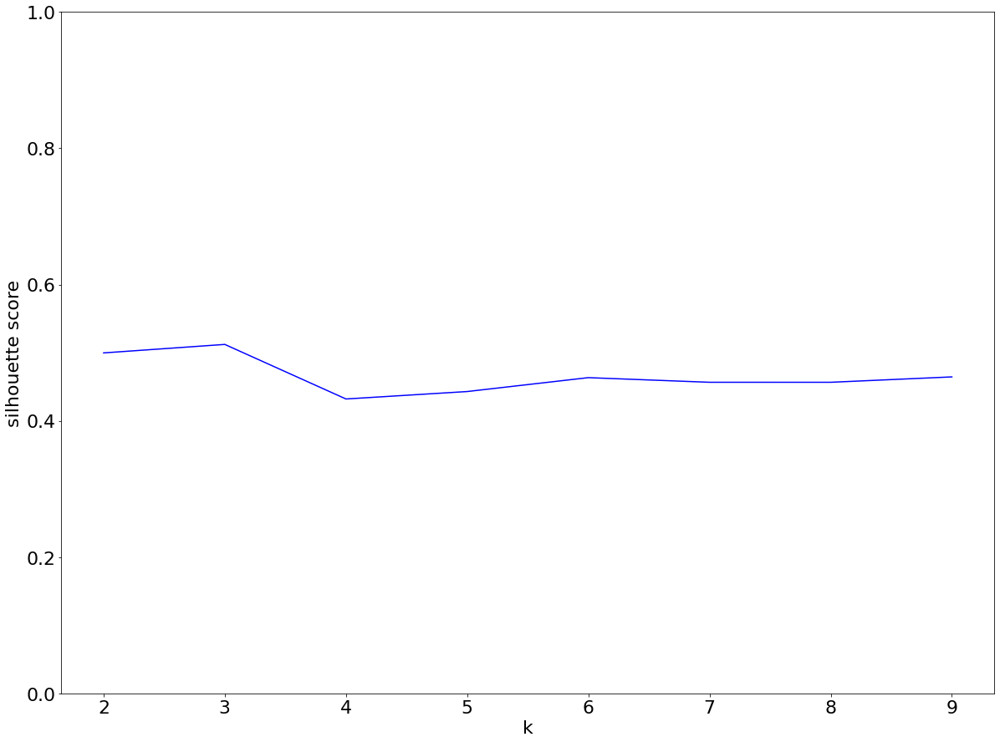

Person 9 done!


In [279]:
for per in range(10):
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)
    PARAMS_CHOSEN = ['acc_x', 'acc_y', 'acc_z']
    # PARAMS_CHOSEN = ['gyr_x', 'gyr_y', 'gyr_z']

    DataViz = VisualizeDataset()
    clusteringH = HierarchicalClustering()
    
    k_values = range(2, 10)
    silhouette_values = []

    # Simulations to find the right k for the maximum number of clusters.
    #
    print('===== Agglomerative clustering (Optimal K value search) =====')
    for k in k_values:
        print(f'k = {k}...')
        dataset, l = clusteringH.agglomerative_over_instances(dataset, PARAMS_CHOSEN, k, 'euclidean', use_prev_linkage=True, link_function='ward')
        silhouette_score = dataset['silhouette'].mean()
        print(f'Silhouette = {silhouette_score}')
        silhouette_values.append(silhouette_score)
        if k == k_values[0]:
            DataViz.plot_dendrogram(dataset, l)

    DataViz.plot_xy(x=[k_values], y=[silhouette_values], xlabel='k', ylabel='silhouette score', ylim=[0, 1], line_styles=['b-'])
    
    dataset = dataset.drop(columns=['silhouette'])
    dataset.to_csv(f'./parkinson_dataset/csv/chapter_5/agglomerative/chapter5_agglo_acc_per{per}.csv')
    print(f'Person {per} done!')

## Inter-Personal Clustering

### K-means

In [285]:
datasets = []
source = './parkinson_dataset/csv/chapter_4/'
for root, dirs, filenames in os.walk(source):
    for fn in filenames:
        datasets.append(pd.read_csv(source+fn))

In [286]:
PARAMS_CHOSEN = ['acc_x', 'acc_y', 'acc_z']

clusteringNH = NonHierarchicalClustering()
print(f'Max k = {k_best}')
datasets = clusteringNH.k_means_over_datasets(datasets, PARAMS_CHOSEN, k_best, 'abstraction_normal', 'euclidean', 50, 50, p=1)

Max k = 3


In [287]:
datasets.to_csv('./parkinson_dataset/csv/chapter_5/k_means/chapter5_kmeans_over_datasets_acc_combined.csv')
datasets

,acc_x_mu,acc_x_sigma,acc_y_mu,acc_y_sigma,acc_z_mu,acc_z_sigma,cluster,silhouette
0,-0.176879,0.307516,-0.000808,0.175254,-0.09346,0.936062,2,0.868255
1,-0.261637,0.243467,-0.103549,0.144473,-0.928326,0.117855,1,0.916475
2,-0.220439,0.294198,0.122732,0.123399,0.942694,0.114696,0,0.804563
3,-0.231979,0.303961,0.104536,0.137767,0.940999,0.107866,0,0.800659
4,-0.276231,0.23671,-0.077163,0.184351,-0.916712,0.133749,1,0.905429
5,0.368066,0.163283,0.091689,0.126739,0.921112,0.090825,0,0.593894
6,-0.140148,0.21226,0.071243,0.150796,0.967642,0.056603,0,0.804864
7,-0.135448,0.320995,-0.142727,0.205456,-0.055568,0.925919,2,0.871420
8,-0.316921,0.136933,-0.035909,0.077757,-0.9317,0.062501,1,0.871280
9,-0.292421,0.190955,0.064616,0.132061,-0.94641,0.128889,1,0.861988


Figure saved to figures\figure_3.png
Figure saved to figures\figure_3.pdf


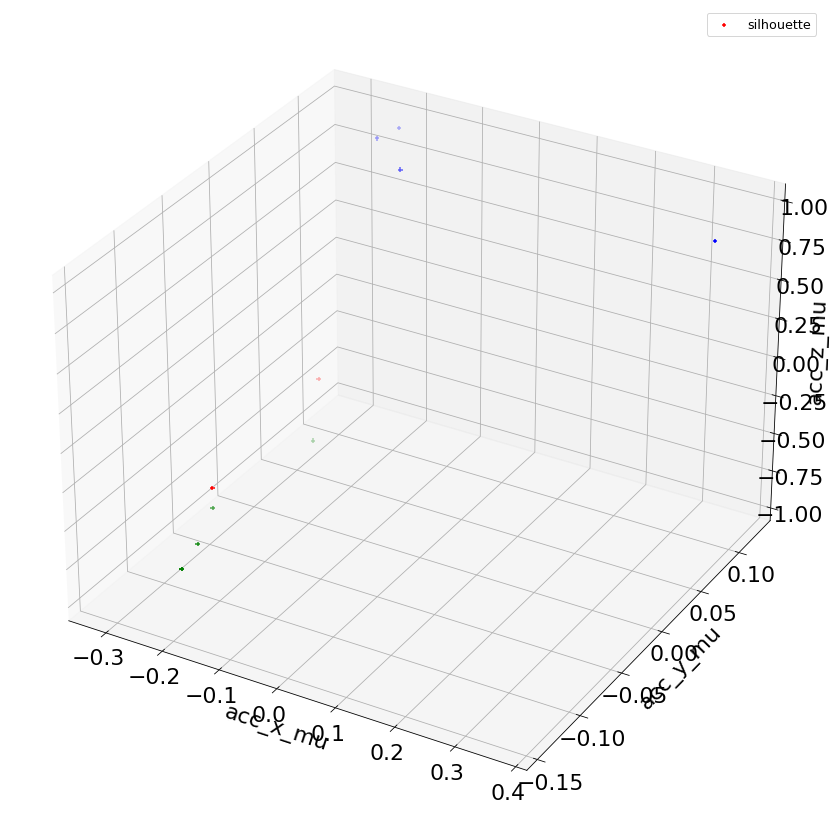

Figure saved to figures\figure_4.png
Figure saved to figures\figure_4.pdf


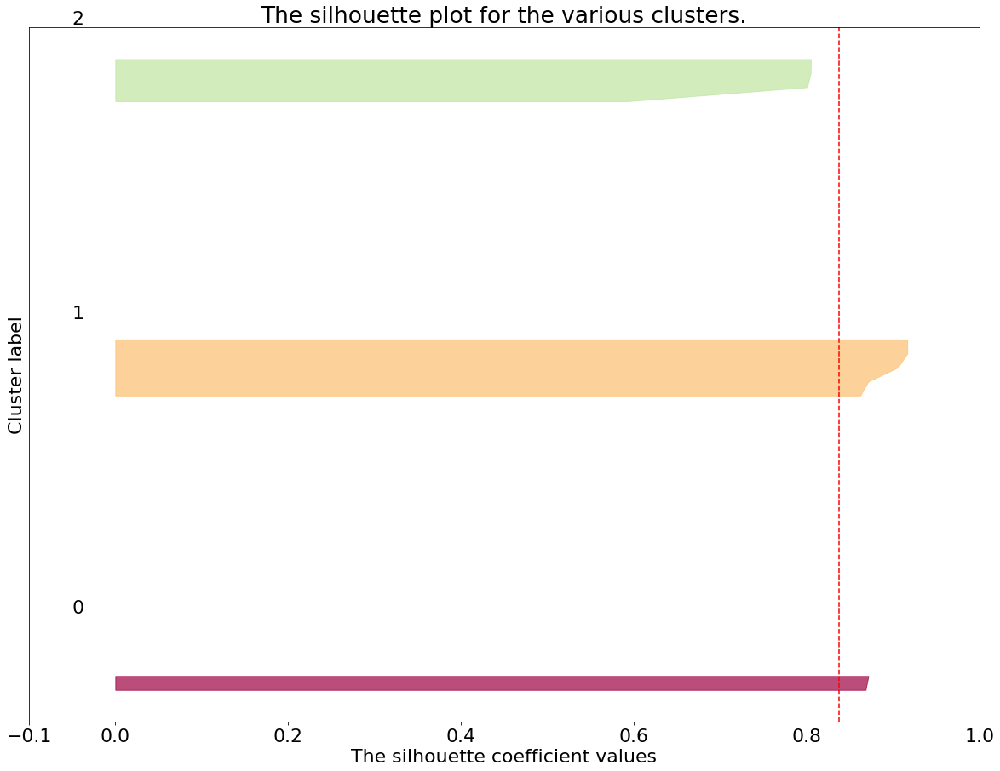

Figure saved to figures\figure_5.png
Figure saved to figures\figure_5.pdf


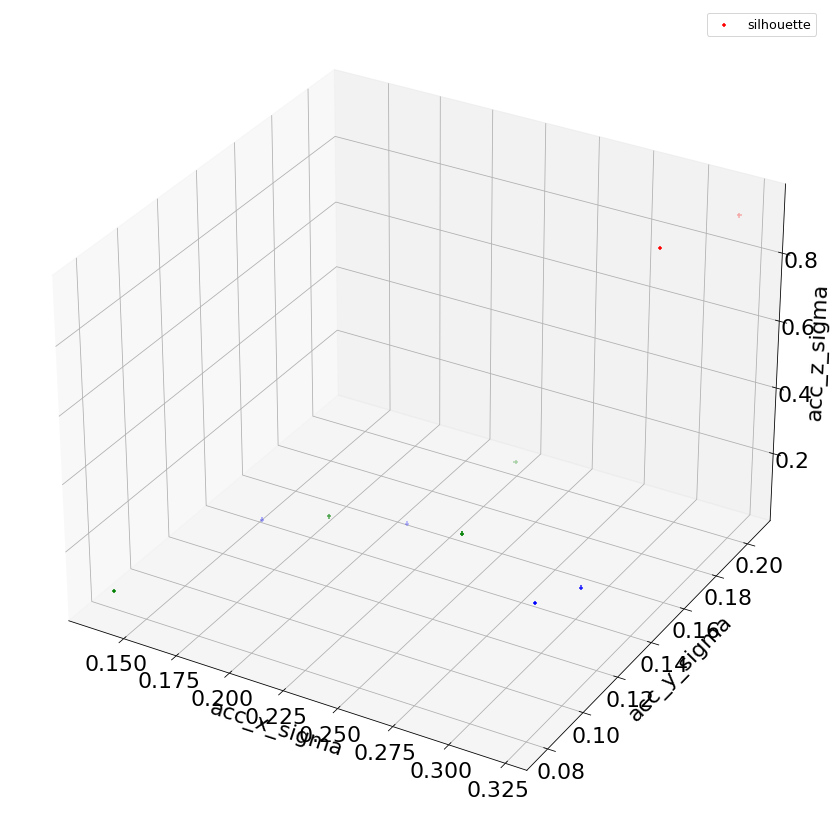

Figure saved to figures\figure_6.png
Figure saved to figures\figure_6.pdf


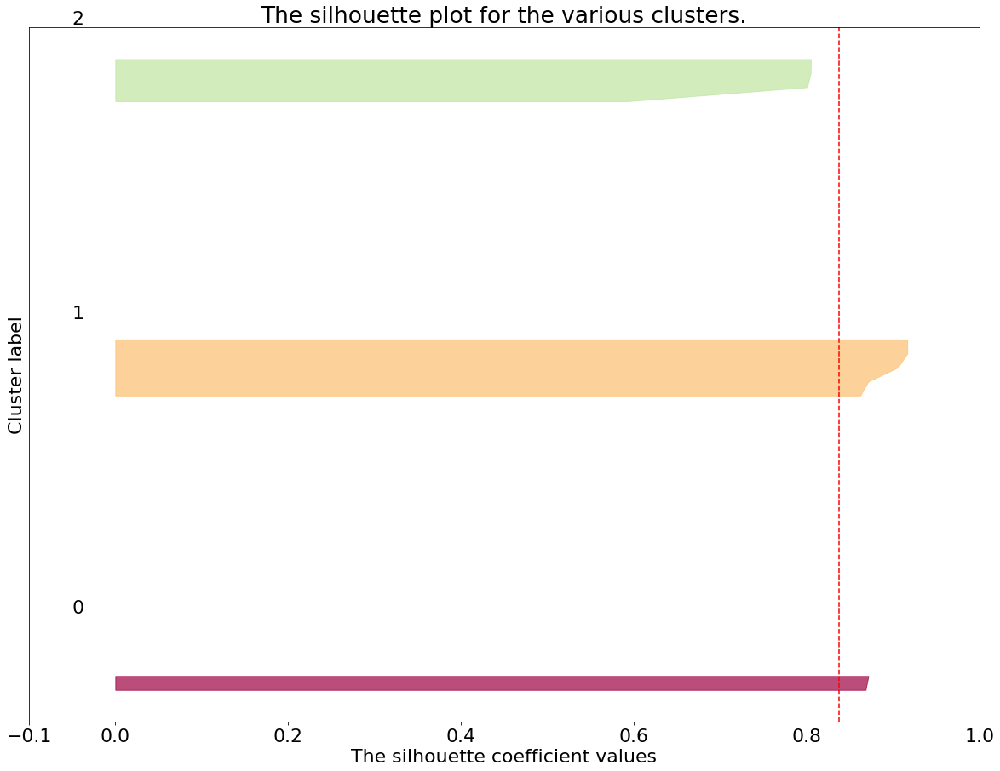

In [288]:
for x in [['acc_x_mu', 'acc_y_mu', 'acc_z_mu'], ['acc_x_sigma', 'acc_y_sigma', 'acc_z_sigma']]:
    DataViz.plot_clusters_3d(datasets, x, 'cluster', ['silhouette'])
    DataViz.plot_silhouette(datasets, 'cluster', 'silhouette')

# Feature Selection

In [289]:
from Chapter7.PrepareDatasetForLearning import PrepareDatasetForLearning
from Chapter7.LearningAlgorithms import ClassificationAlgorithms
from Chapter7.LearningAlgorithms import RegressionAlgorithms
from Chapter7.Evaluation import ClassificationEvaluation
from Chapter7.Evaluation import RegressionEvaluation
from Chapter7.FeatureSelection import FeatureSelectionClassification
from Chapter7.FeatureSelection import FeatureSelectionRegression
from sklearn.model_selection import train_test_split

## Individual

### Forward Selection - Classification  

For person 0...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.834, 0.918, 0.952, 0.966, 0.968, 0.968, 0.968, 0.968, 0.968, 0.968]
Features: 
 ['acc_z_kalman_temp_mean_ws_40', 'gyr_y_kalman_temp_std_ws_40', 'acc_z_kalman_freq_0.0_Hz_ws_40', 'acc_y_kalman_temp_std_ws_80', 'acc_x_kalman_temp_mean_ws_40', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted', 'gyr_z_kalman_freq_0.7_Hz_ws_40', 'acc_y_kalman_freq_0.1_Hz_ws_40']


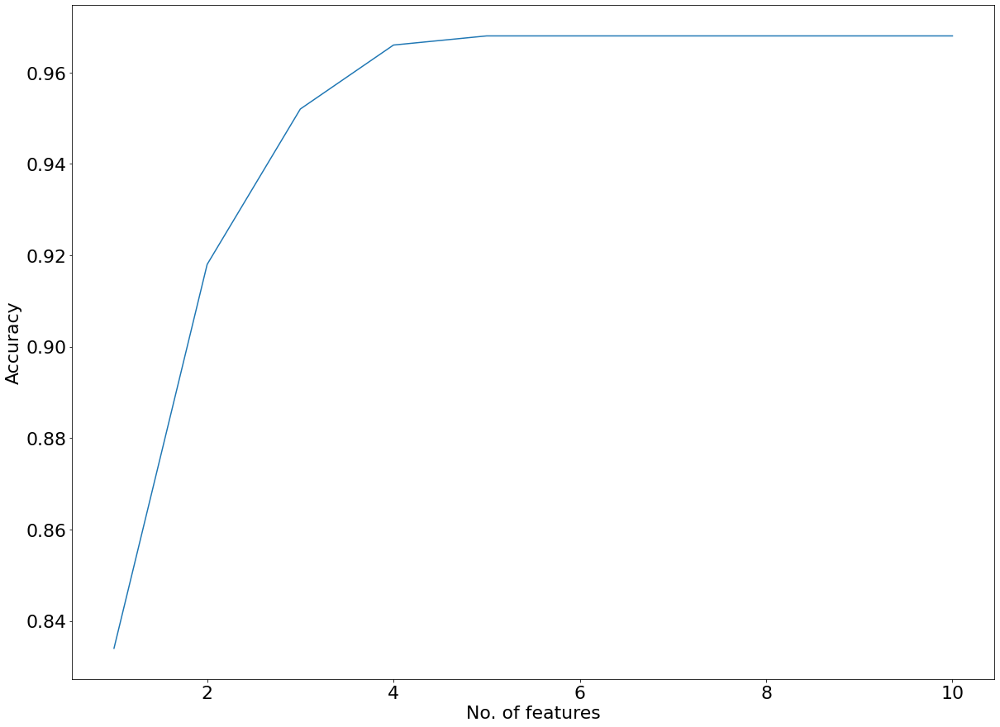

For person 1...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.904, 0.966, 0.982, 0.982, 0.982, 0.982, 0.986, 0.986, 0.986, 0.986]
Features: 
 ['acc_x_kalman_temp_mean_ws_40', 'acc_y_kalman_temp_std_ws_40', 'acc_y_kalman_temp_mean_ws_80', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted', 'acc_x_kalman_pse', 'gyr_z_kalman_freq_0.7_Hz_ws_40', 'gyr_x_kalman_freq_0.65_Hz_ws_40', 'acc_y_kalman_freq_0.1_Hz_ws_40']


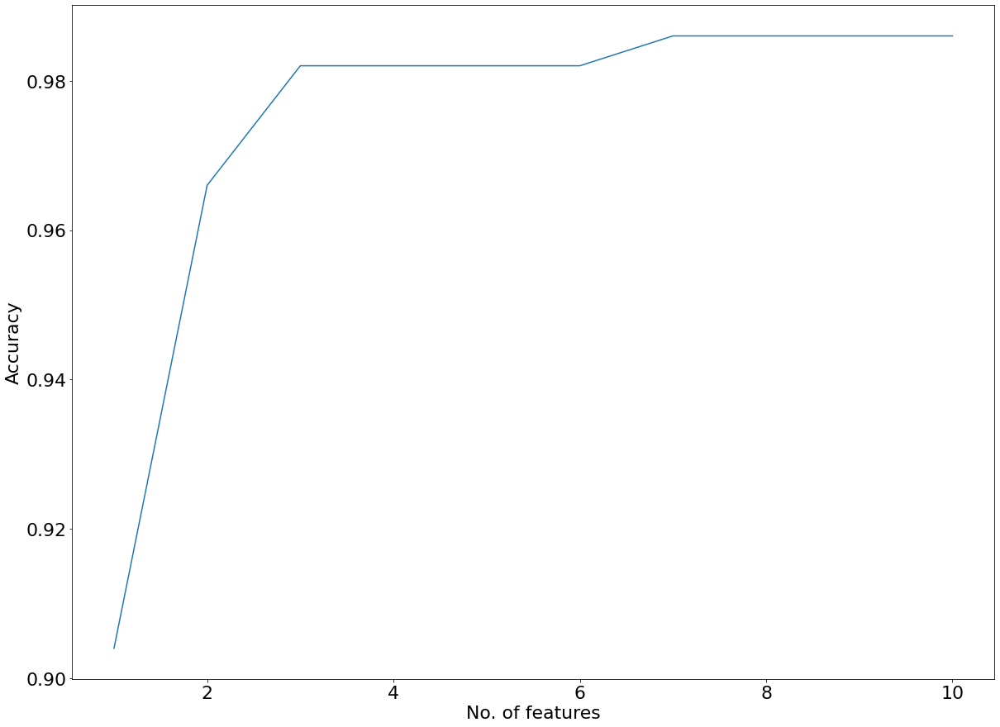

For person 2...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.746, 0.894, 0.932, 0.946, 0.958, 0.966, 0.968, 0.968, 0.968, 0.968]
Features: 
 ['gyr_y_kalman_temp_std_ws_80', 'acc_y_kalman_max_freq', 'acc_x_kalman_temp_mean_ws_80', 'pca_2', 'gyr_z_kalman_temp_mean_ws_40', 'acc_y_kalman_temp_std_ws_80', 'acc_x_kalman_max_freq', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted']


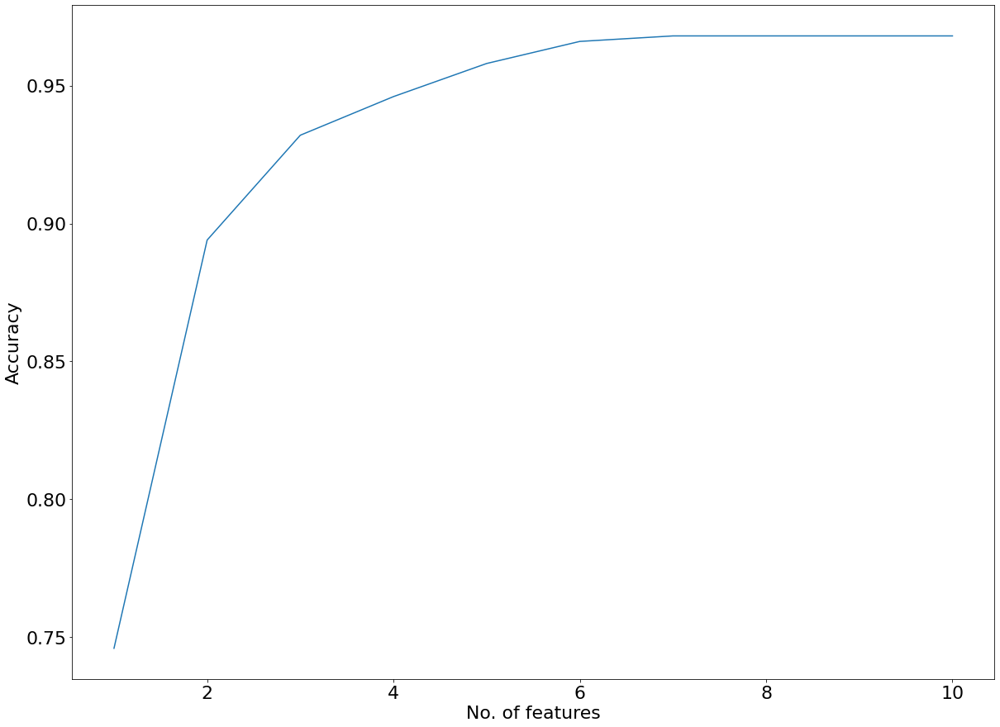

For person 3...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.762, 0.892, 0.944, 0.956, 0.962, 0.964, 0.966, 0.966, 0.966, 0.966]
Features: 
 ['gyr_x_kalman_temp_std_ws_80', 'gyr_z_kalman_temp_std_ws_80', 'acc_z_kalman_temp_mean_ws_80', 'gyr_z_kalman_temp_mean_ws_80', 'acc_z_kalman_freq_0.0_Hz_ws_40', 'acc_z_kalman_temp_std_ws_80', 'gyr_z_kalman_temp_std_ws_40', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted']


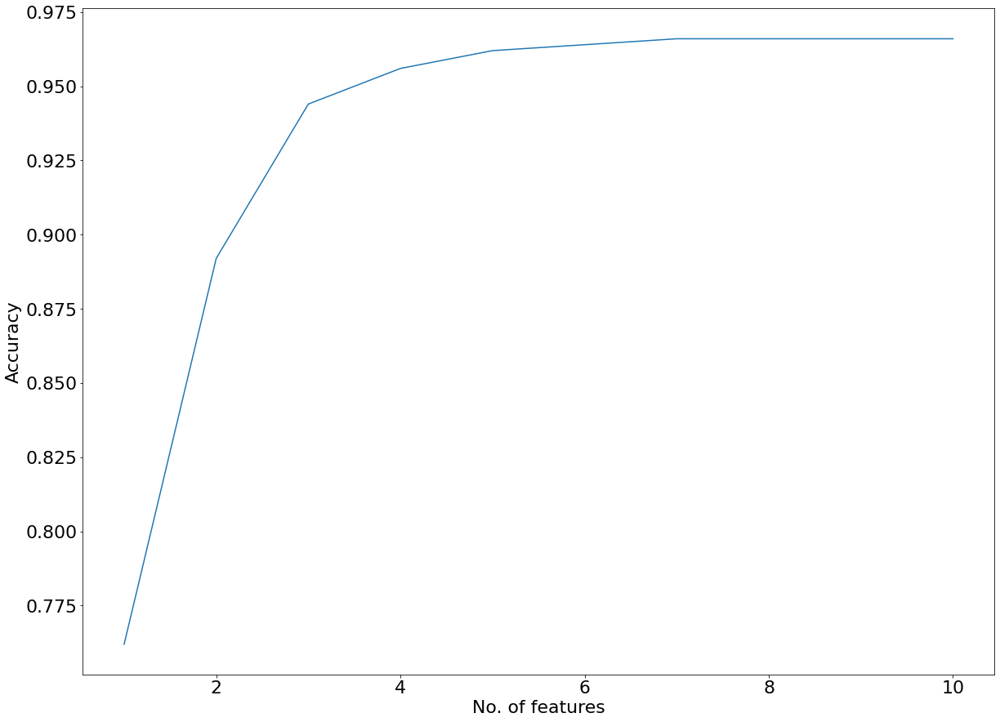

For person 4...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.656, 0.856, 0.902, 0.94, 0.94, 0.942, 0.942, 0.942, 0.942, 0.942]
Features: 
 ['acc_x_kalman_temp_std_ws_40', 'acc_x_kalman_temp_mean_ws_40', 'acc_z_kalman_temp_std_ws_80', 'acc_y_kalman_max_freq', 'gyr_z_kalman_freq_weighted', 'acc_x_kalman_temp_mean_ws_80', 'acc_y_kalman_freq_0.1_Hz_ws_40', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'gyr_z_kalman_freq_0.7_Hz_ws_40', 'acc_x_kalman_freq_weighted']


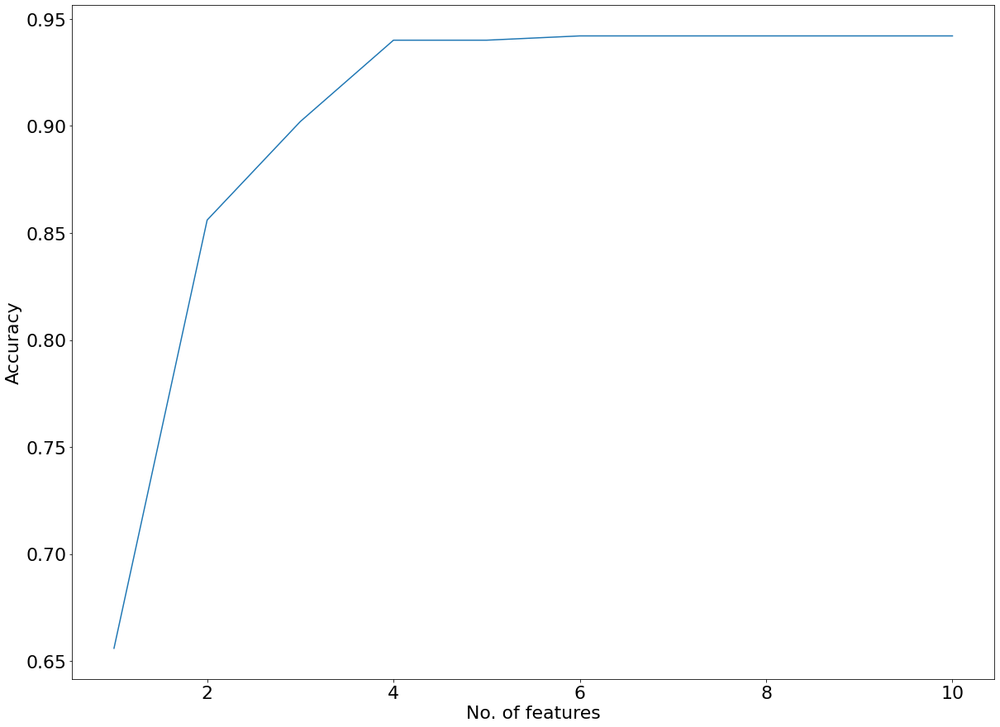

For person 5...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.76, 0.938, 0.954, 0.962, 0.966, 0.966, 0.966, 0.966, 0.966, 0.966]
Features: 
 ['acc_y_kalman_temp_mean_ws_40', 'gyr_x_kalman_temp_std_ws_80', 'gyr_z_kalman_temp_std_ws_40', 'acc_x_kalman_pse', 'acc_y_kalman_temp_mean_ws_80', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted', 'gyr_z_kalman_freq_weighted', 'acc_y_kalman_freq_0.1_Hz_ws_40', 'gyr_z_kalman_freq_0.7_Hz_ws_40']


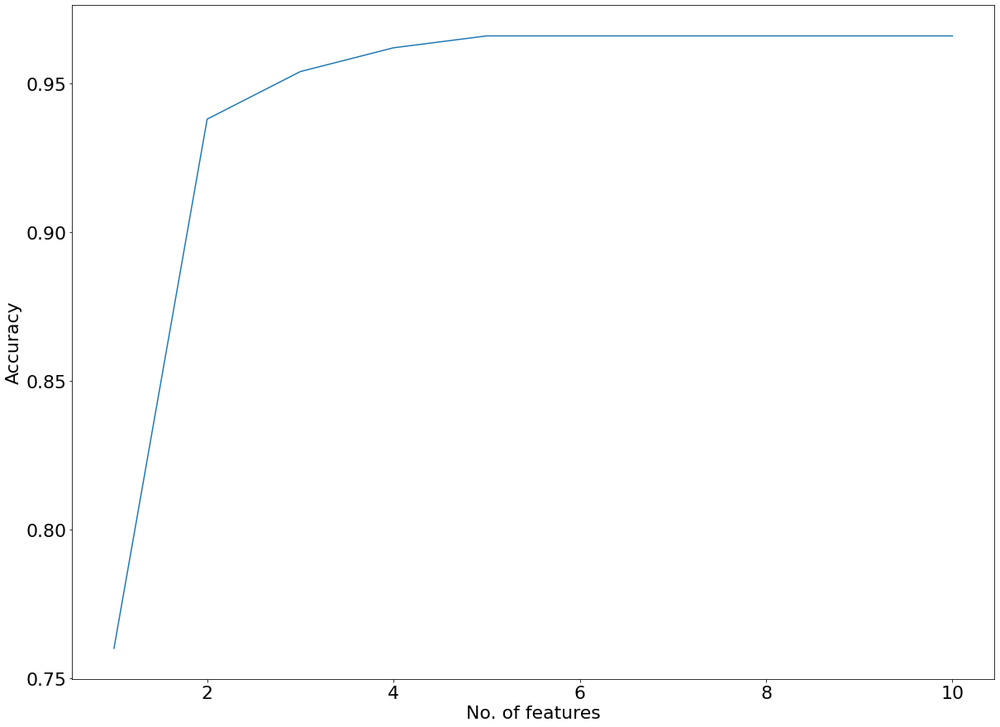

For person 6...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.86, 0.946, 0.968, 0.98, 0.99, 0.992, 0.992, 0.992, 0.992, 0.992]
Features: 
 ['acc_z_kalman_temp_mean_ws_40', 'acc_z_kalman_temp_std_ws_40', 'pca_1', 'acc_z_kalman_temp_mean_ws_80', 'gyr_x_kalman_temp_mean_ws_80', 'acc_x_kalman_temp_mean_ws_40', 'gyr_z_kalman_freq_weighted', 'acc_x_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'gyr_z_kalman_freq_0.7_Hz_ws_40']


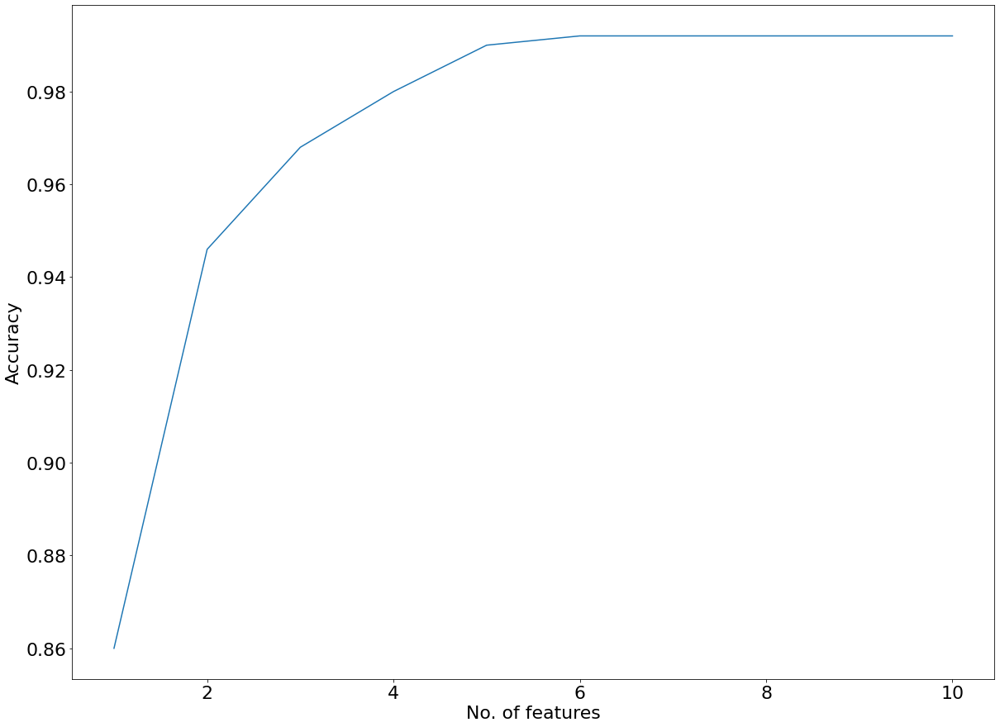

For person 7...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.734, 0.922, 0.958, 0.97, 0.972, 0.984, 0.984, 0.984, 0.984, 0.984]
Features: 
 ['acc_x_kalman_temp_mean_ws_80', 'gyr_z_kalman_temp_std_ws_80', 'acc_y_kalman_temp_std_ws_40', 'gyr_z_kalman_temp_mean_ws_40', 'acc_y_kalman_temp_mean_ws_80', 'gyr_y_kalman_temp_std_ws_40', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted', 'gyr_z_kalman_freq_0.7_Hz_ws_40']


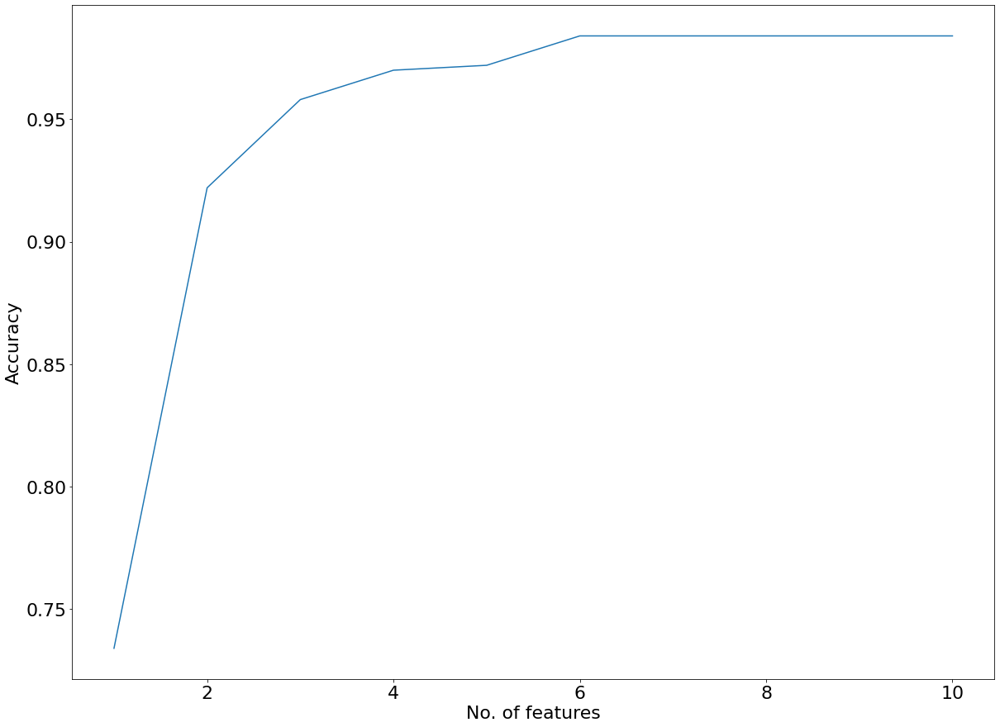

For person 8...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.782, 0.914, 0.934, 0.94, 0.942, 0.942, 0.942, 0.944, 0.944, 0.944]
Features: 
 ['acc_y_kalman_temp_std_ws_80', 'gyr_y_kalman_temp_std_ws_40', 'acc_x_kalman_freq_0.0_Hz_ws_40', 'acc_z_kalman_max_freq', 'acc_z_kalman_temp_std_ws_80', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'gyr_x_kalman_temp_mean_ws_80', 'acc_x_kalman_freq_weighted', 'gyr_z_kalman_freq_0.3_Hz_ws_40']


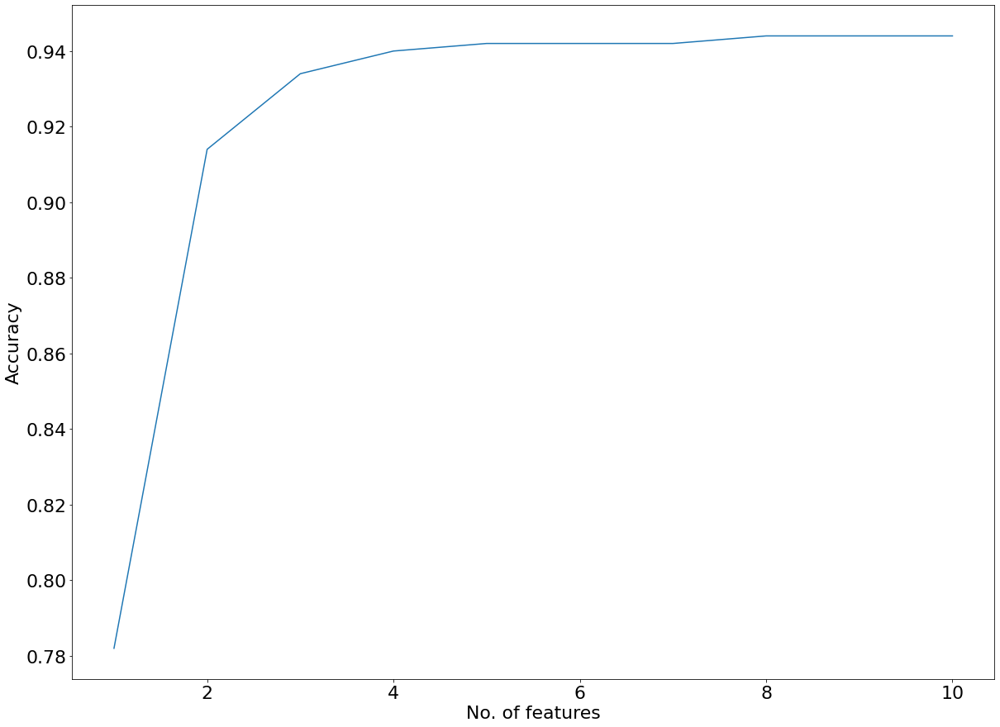

For person 9...
No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144
Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.834, 0.918, 0.952, 0.966, 0.968, 0.968, 0.968, 0.968, 0.968, 0.968]
Features: 
 ['acc_z_kalman_temp_mean_ws_40', 'gyr_y_kalman_temp_std_ws_40', 'acc_z_kalman_freq_0.0_Hz_ws_40', 'acc_y_kalman_temp_std_ws_80', 'acc_x_kalman_temp_mean_ws_40', 'gyr_z_kalman_freq_weighted', 'gyr_z_kalman_freq_0.9_Hz_ws_40', 'acc_x_kalman_freq_weighted', 'gyr_z_kalman_freq_0.7_Hz_ws_40', 'acc_y_kalman_freq_0.1_Hz_ws_40']


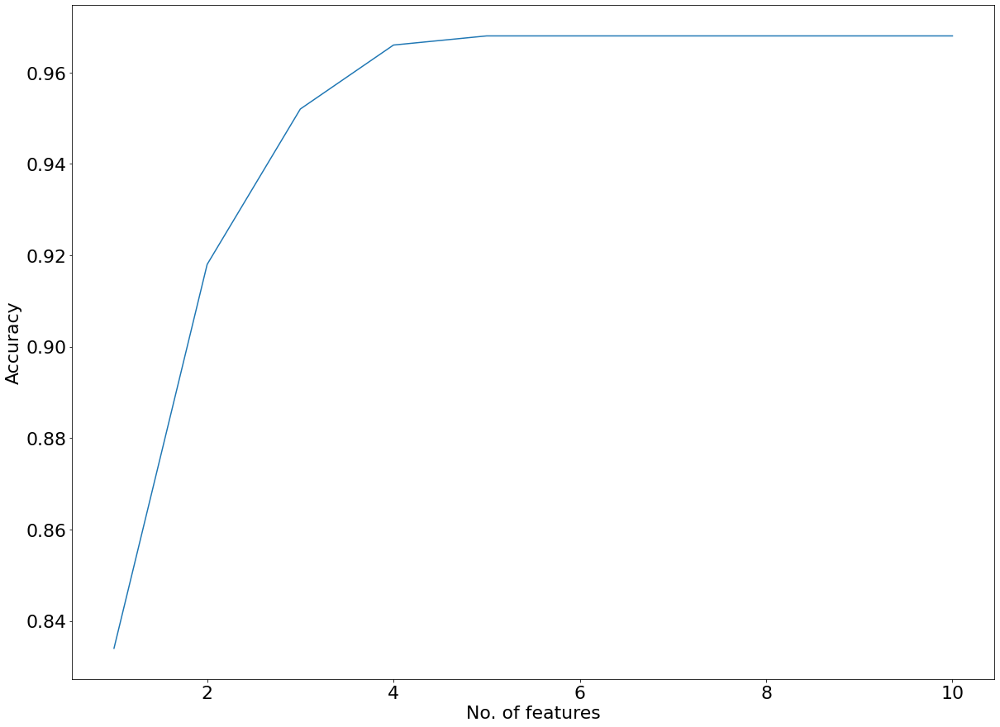

Done!


In [296]:
best_feats_set_fsc = []

for per in range(10):
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)

    prepare = PrepareDatasetForLearning()
    train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 
                                                                        'like', 0.7, filter=True, temporal=False)
    # Features to peruse.
    #
    basic_features = ['acc_x_kalman','acc_y_kalman','acc_z_kalman','gyr_x_kalman','gyr_y_kalman','gyr_z_kalman']
    pca_features = ['pca_1','pca_2']
    time_features = [name for name in dataset.columns if '_temp_' in name]
    freq_features = [name for name in dataset.columns if (('_freq' in name) or ('_pse' in name))]

    print(f'For person {per}...')
    print ('No. of Basic features: ', len(basic_features))
    print ('No. of PCA features: ', len(pca_features))
    print ('No. of Time features: ', len(time_features))
    print ('No. of Frequency features: ', len(freq_features))

    features_after_chapter_3 = list(set().union(basic_features, pca_features))
    all_features = list(set().union(basic_features, pca_features, time_features, freq_features))
    
    # =============================== Feature Selection =============================== #
    
    fs = FeatureSelectionClassification()
    features, ordered_features, ordered_scores = fs.forward_selection(10, train_X[all_features], 
                                                            test_X[all_features], train_y, test_y, True)
    
    print('Scores: \n', ordered_scores)
    print('Features: \n', ordered_features)
    best_feats_set.append(ordered_features)

    plt.plot(range(1, 11), ordered_scores)
    plt.xlabel('No. of features')
    plt.ylabel('Accuracy')
    plt.show()

print('Done!')

In [311]:
selected_features_fsc = list(set.intersection(*map(set, best_feats_set_fsc)))
selected_features_fsc

['acc_x_kalman_freq_weighted',
 'gyr_z_kalman_freq_0.9_Hz_ws_40',
 'gyr_z_kalman_freq_weighted']

### Backward Selection - Classification

In [ ]:
best_feats_set_bsc = []

for per in range(10):
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)

    prepare = PrepareDatasetForLearning()
    train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 
                                                                        'like', 0.7, filter=True, temporal=False)
    # Features to peruse.
    #
    basic_features = ['acc_x_kalman','acc_y_kalman','acc_z_kalman','gyr_x_kalman','gyr_y_kalman','gyr_z_kalman']
    pca_features = ['pca_1','pca_2']
    time_features = [name for name in dataset.columns if '_temp_' in name]
    freq_features = [name for name in dataset.columns if (('_freq' in name) or ('_pse' in name))]

    print(f'For person {per}...')
    print ('No. of Basic features: ', len(basic_features))
    print ('No. of PCA features: ', len(pca_features))
    print ('No. of Time features: ', len(time_features))
    print ('No. of Frequency features: ', len(freq_features))

    features_after_chapter_3 = list(set().union(basic_features, pca_features))
    all_features = list(set().union(basic_features, pca_features, time_features, freq_features))
    
    # =============================== Feature Selection =============================== #
    
    fs = FeatureSelectionClassification()
    features_bsc = fs.backward_selection(10, train_X[all_features], train_y)
    
    print(f'Selected Features for person {per}: ', selected_features_bsc)
    best_feats_set_bs.append(features_bsc)

print('Done!')

In [ ]:
selected_features_fsc = list(set.intersection(*map(set, best_feats_set_bs)))
selected_features_fsc

## Combined

In [291]:
datasets = []
source = './parkinson_dataset/csv/chapter_4/'
for root, dirs, filenames in os.walk(source):
    for fn in filenames:
        datasets.append(pd.read_csv(source+fn))
        
data = pd.concat(datasets, ignore_index=True)
data.to_csv('./parkinson_dataset/csv/chapter_4/chapter4_combined.csv')

In [292]:
dataset = pd.read_csv('./parkinson_dataset/csv/chapter_4/chapter4_combined.csv', index_col=0)
dataset.index = pd.to_datetime(dataset.index)

prepare = PrepareDatasetForLearning()
train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 'like', 0.7, filter=True, temporal=False)

basic_features = ['acc_x_kalman','acc_y_kalman','acc_z_kalman','gyr_x_kalman','gyr_y_kalman','gyr_z_kalman']
pca_features = ['pca_1','pca_2']
time_features = [name for name in dataset.columns if '_temp_' in name]
freq_features = [name for name in dataset.columns if (('_freq' in name) or ('_pse' in name))]

print ('No. of Basic features: ', len(basic_features))
print ('No. of PCA features: ', len(pca_features))
print ('No. of Time features: ', len(time_features))
print ('No. of Frequency features: ', len(freq_features))

features_after_chapter_3 = list(set().union(basic_features, pca_features))
all_features = list(set().union(basic_features, pca_features, time_features, freq_features))

No. of Basic features:  6
No. of PCA features:  2
No. of Time features:  24
No. of Frequency features:  144


Added feature0
Added feature1
Added feature2
Added feature3
Added feature4
Added feature5
Added feature6
Added feature7
Added feature8
Added feature9
Scores: 
 [0.5412329863891113, 0.7866293034427542, 0.8646917534027222, 0.8853082465972778, 0.9047237790232185, 0.9171337069655725, 0.9211369095276221, 0.921537229783827, 0.928142514011209, 0.9303442754203363]
Features: 
 ['acc_z_kalman_temp_mean_ws_80', 'acc_y_kalman_temp_std_ws_80', 'gyr_y_kalman_temp_std_ws_80', 'acc_y_kalman_temp_mean_ws_40', 'gyr_z_kalman_temp_std_ws_80', 'acc_z_kalman_temp_mean_ws_40', 'acc_y_kalman', 'gyr_z_kalman_temp_mean_ws_40', 'acc_y_kalman_max_freq', 'acc_y_kalman_freq_0.1_Hz_ws_40']


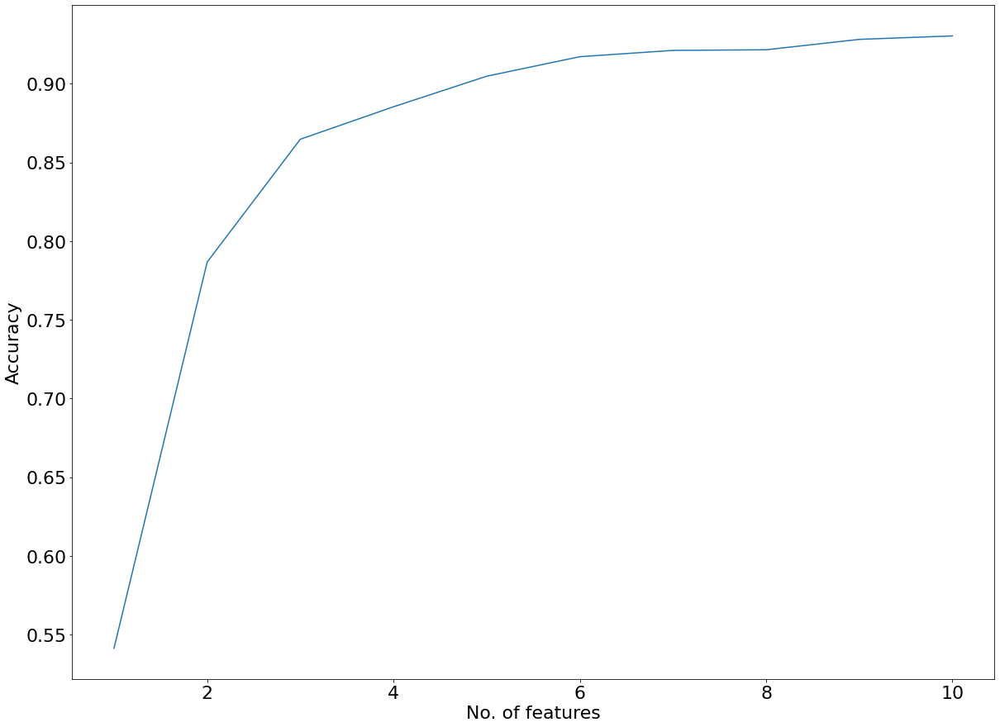

In [293]:
# Combined Feature Selection.
#
fs = FeatureSelectionClassification()
features, ordered_features, ordered_scores = fs.forward_selection(10, train_X[all_features], 
                                                        test_X[all_features], train_y, test_y, True)

print('Scores: \n', ordered_scores)
print('Features: \n', ordered_features)

plt.plot(range(1, 11), ordered_scores)
plt.xlabel('No. of features')
plt.ylabel('Accuracy')
plt.show()

# Predictive Model Testing

## Neural network - Individual

For Person 0
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 1.0]
Testing Performance = :  [0.8739999999999999, 0.8699999999999999, 0.8779999999999999, 0.9139999999999999, 0.9200000000000002]
Figure saved to figures\figure_18.png
Figure saved to figures\figure_18.pdf


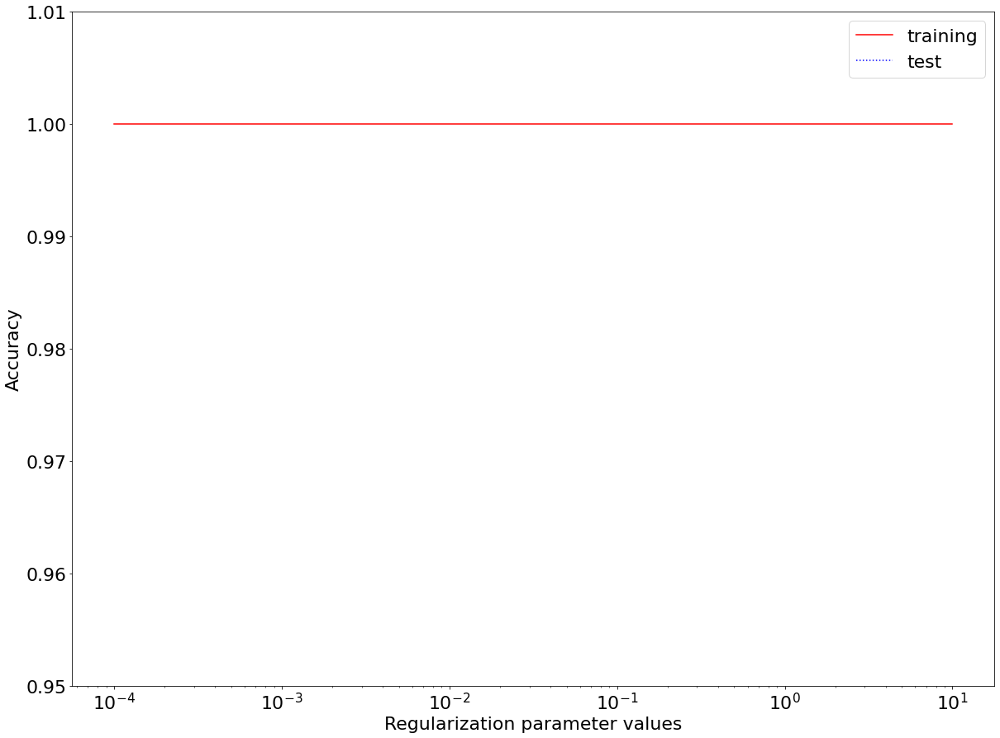

For Person 1
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9957081545064378]
Testing Performance = :  [0.9120000000000001, 0.908, 0.9000000000000001, 0.9339999999999999, 0.9139999999999999]
Figure saved to figures\figure_19.png
Figure saved to figures\figure_19.pdf


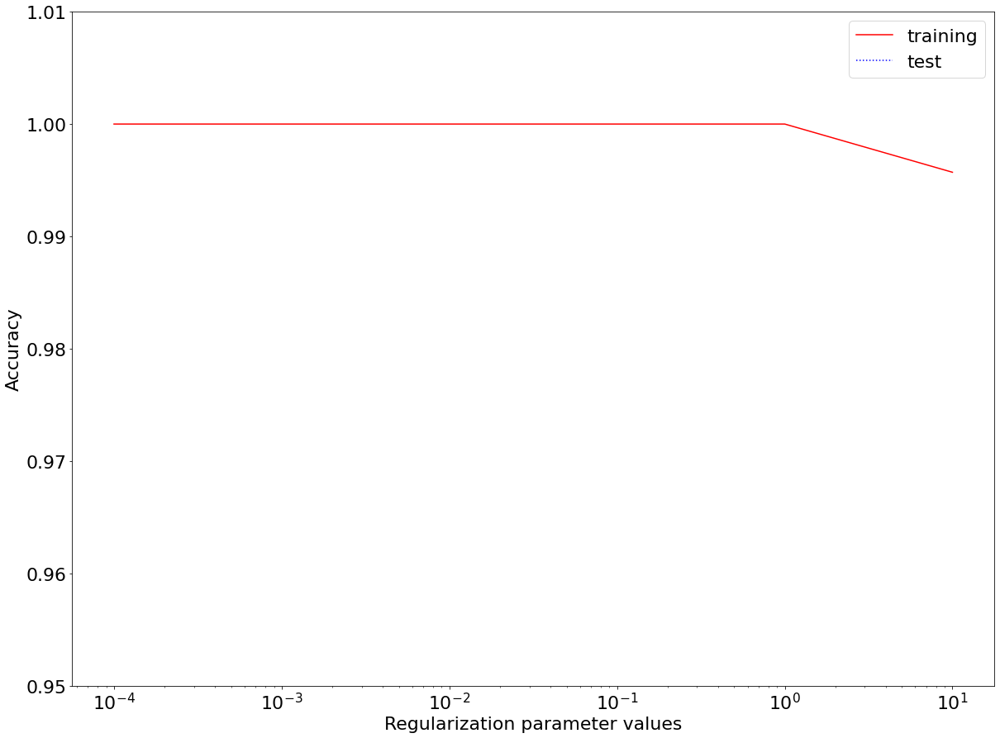

For Person 2
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [0.9991416309012877, 0.9991416309012877, 1.0, 1.0, 0.9828326180257511]
Testing Performance = :  [0.804, 0.812, 0.7960000000000002, 0.8419999999999999, 0.7999999999999999]
Figure saved to figures\figure_20.png
Figure saved to figures\figure_20.pdf


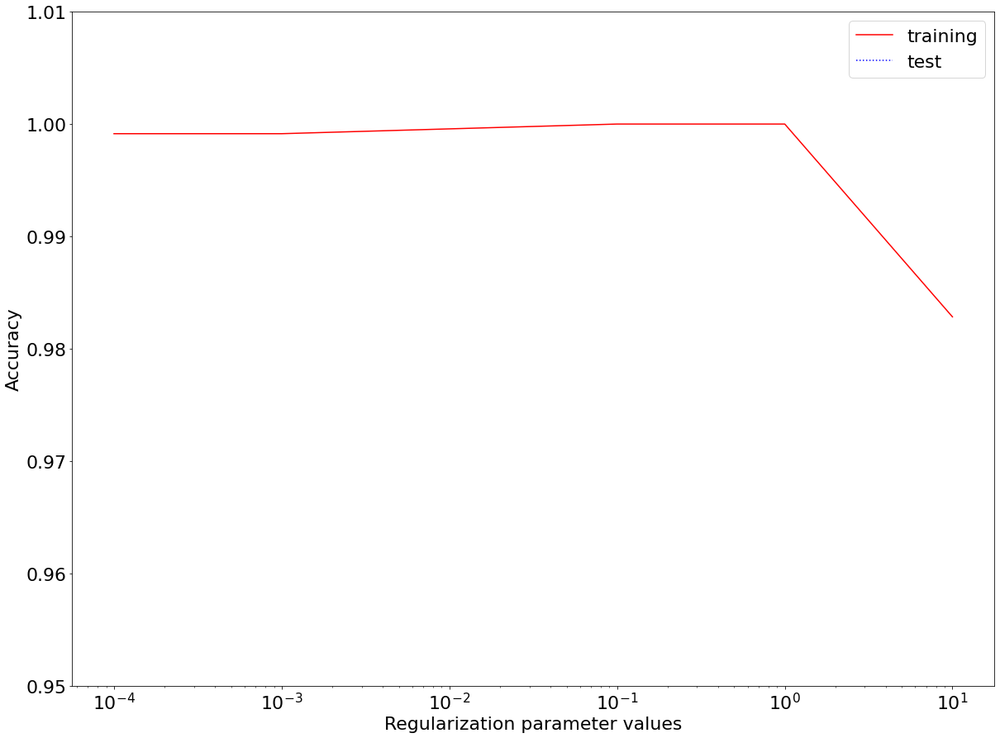

For Person 3
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9939914163090131]
Testing Performance = :  [0.774, 0.7599999999999999, 0.7519999999999999, 0.806, 0.774]
Figure saved to figures\figure_21.png
Figure saved to figures\figure_21.pdf


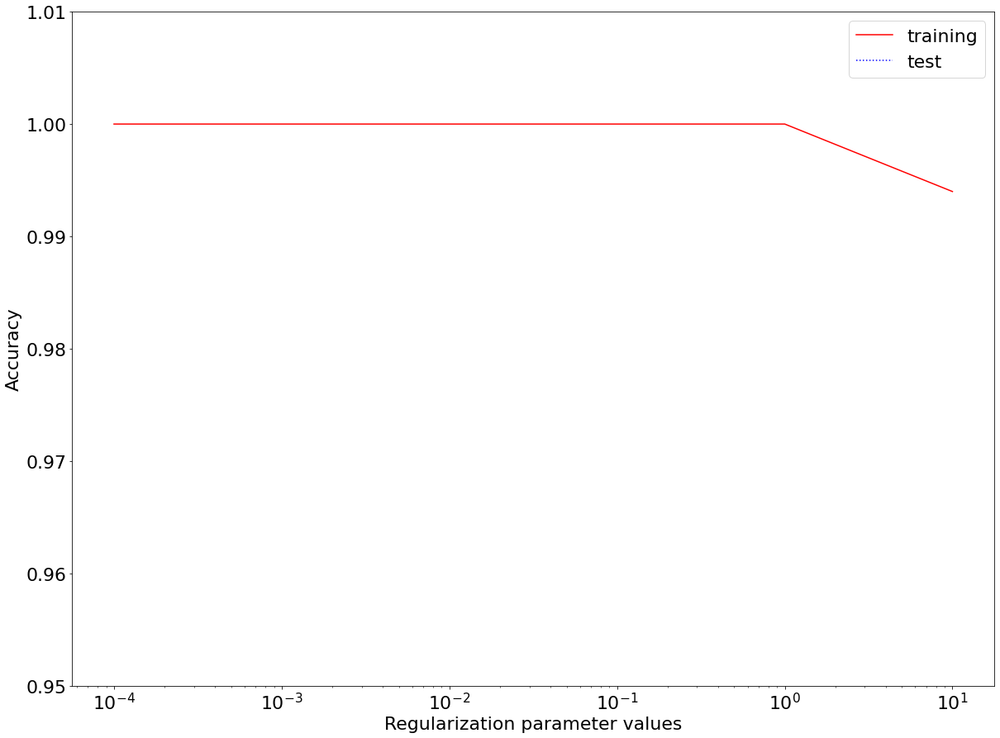

For Person 4
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9939914163090131]
Testing Performance = :  [0.718, 0.7059999999999998, 0.71, 0.7919999999999999, 0.774]
Figure saved to figures\figure_22.png
Figure saved to figures\figure_22.pdf


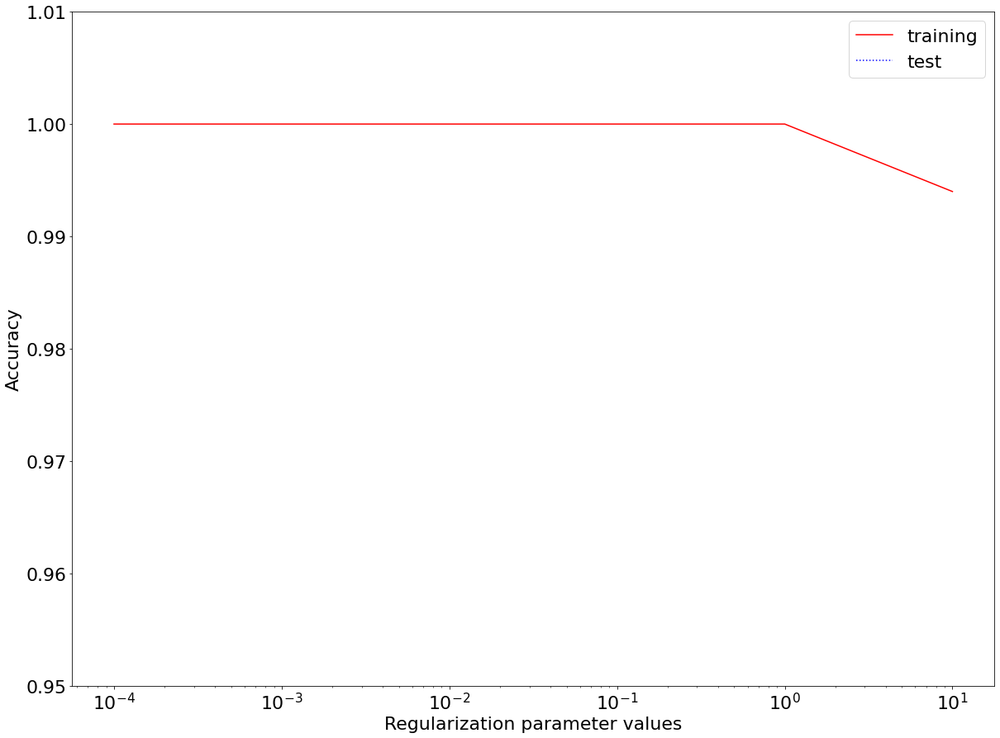

For Person 5
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9922746781115881]
Testing Performance = :  [0.7880000000000001, 0.7759999999999999, 0.7919999999999999, 0.8619999999999999, 0.8400000000000001]
Figure saved to figures\figure_23.png
Figure saved to figures\figure_23.pdf


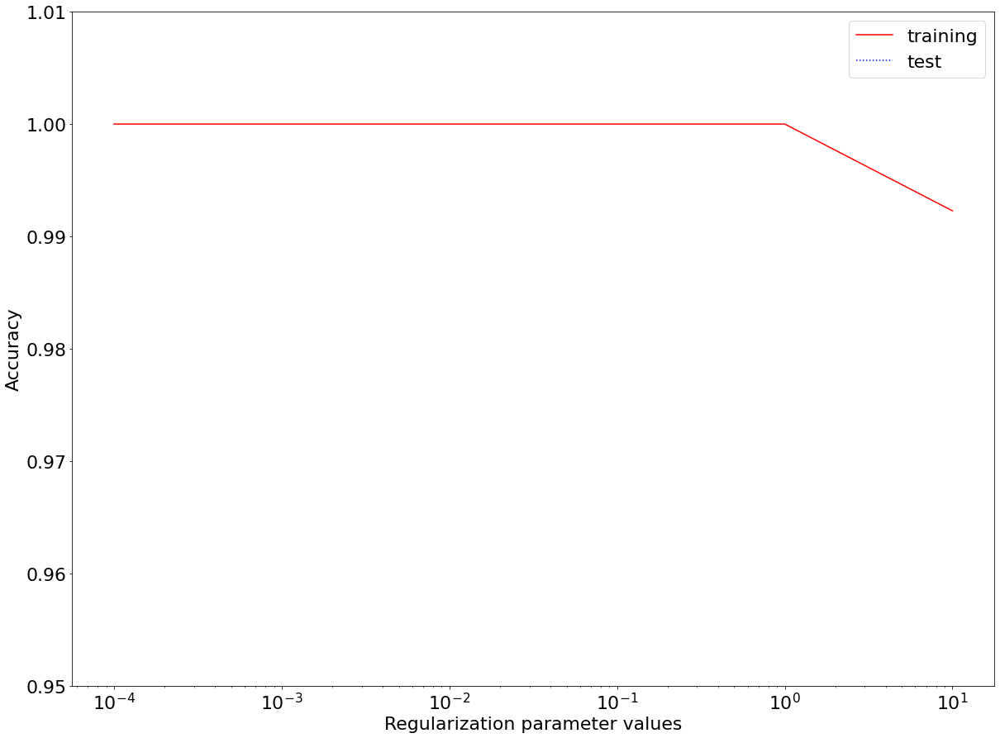

For Person 6
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9914163090128756]
Testing Performance = :  [0.8480000000000001, 0.8379999999999999, 0.8379999999999999, 0.8720000000000001, 0.8459999999999999]
Figure saved to figures\figure_24.png
Figure saved to figures\figure_24.pdf


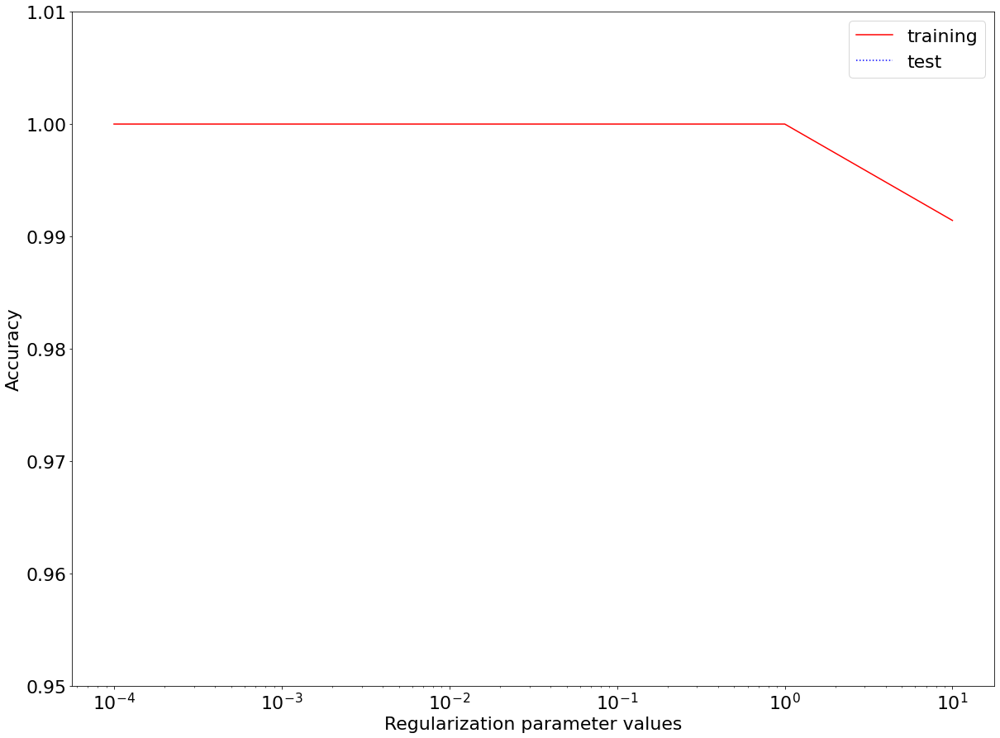

For Person 7
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9922746781115881]
Testing Performance = :  [0.7640000000000001, 0.7460000000000001, 0.71, 0.8379999999999999, 0.774]
Figure saved to figures\figure_25.png
Figure saved to figures\figure_25.pdf


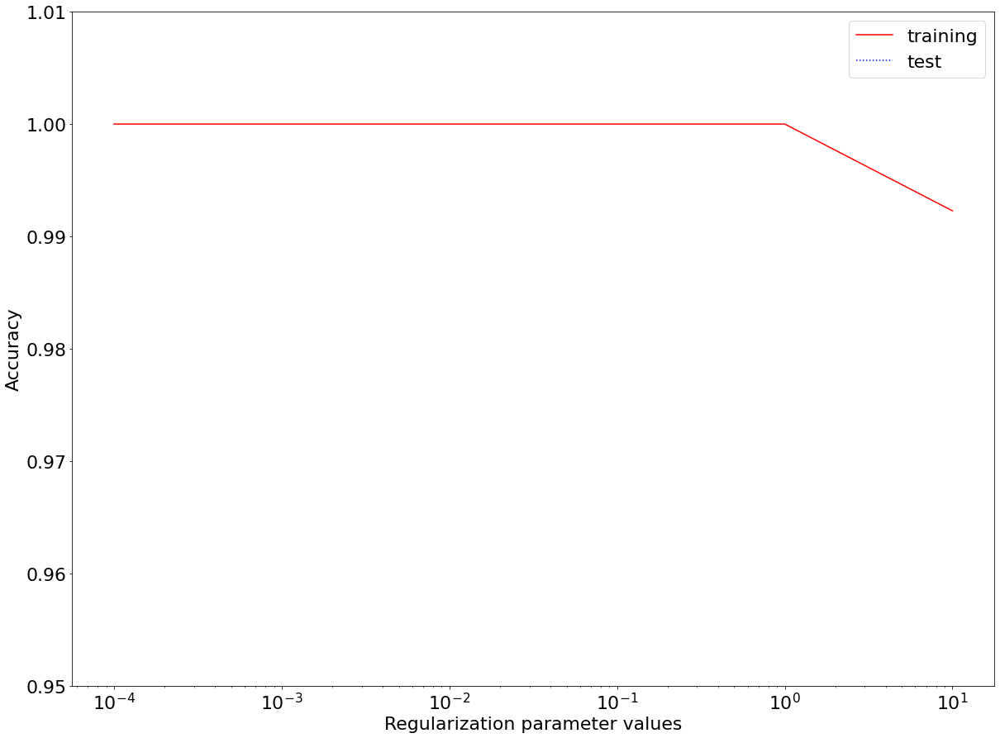

For Person 8
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9939914163090131]
Testing Performance = :  [0.8160000000000001, 0.8139999999999998, 0.804, 0.8680000000000001, 0.8480000000000001]
Figure saved to figures\figure_26.png
Figure saved to figures\figure_26.pdf


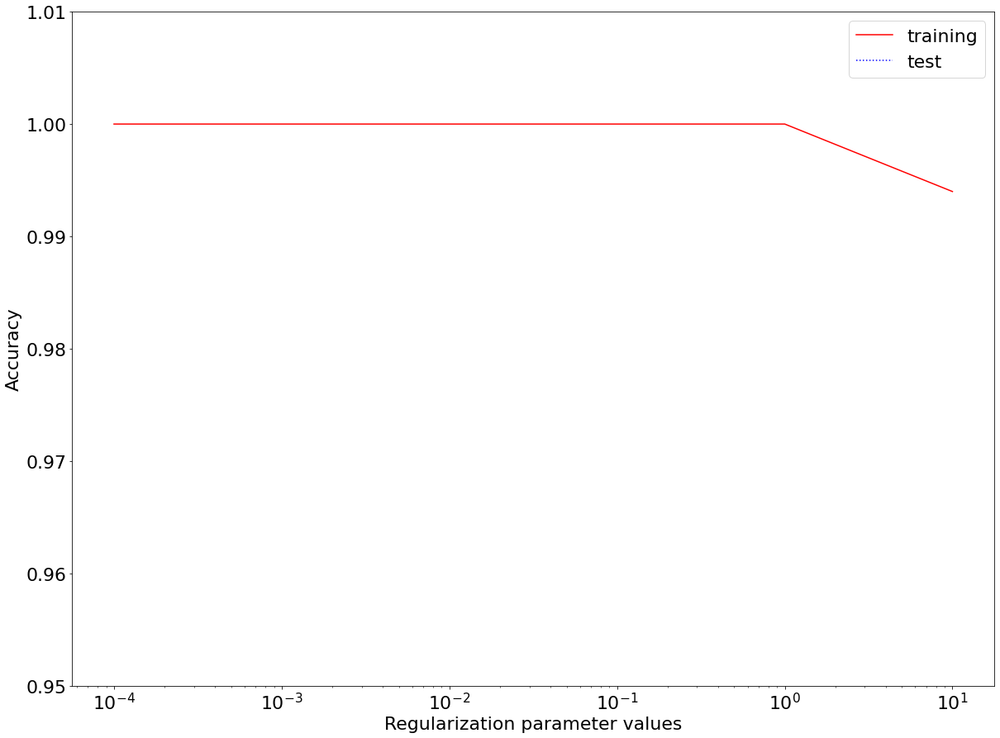

For Person 9
Regularization Param = 0.0001...
Regularization Param = 0.001...
Regularization Param = 0.1...
Regularization Param = 1...
Regularization Param = 10...
Training Performance = :  [1.0, 1.0, 1.0, 1.0, 0.9991416309012877]
Testing Performance = :  [0.8640000000000001, 0.8699999999999999, 0.8840000000000001, 0.9120000000000001, 0.906]
Figure saved to figures\figure_27.png
Figure saved to figures\figure_27.pdf


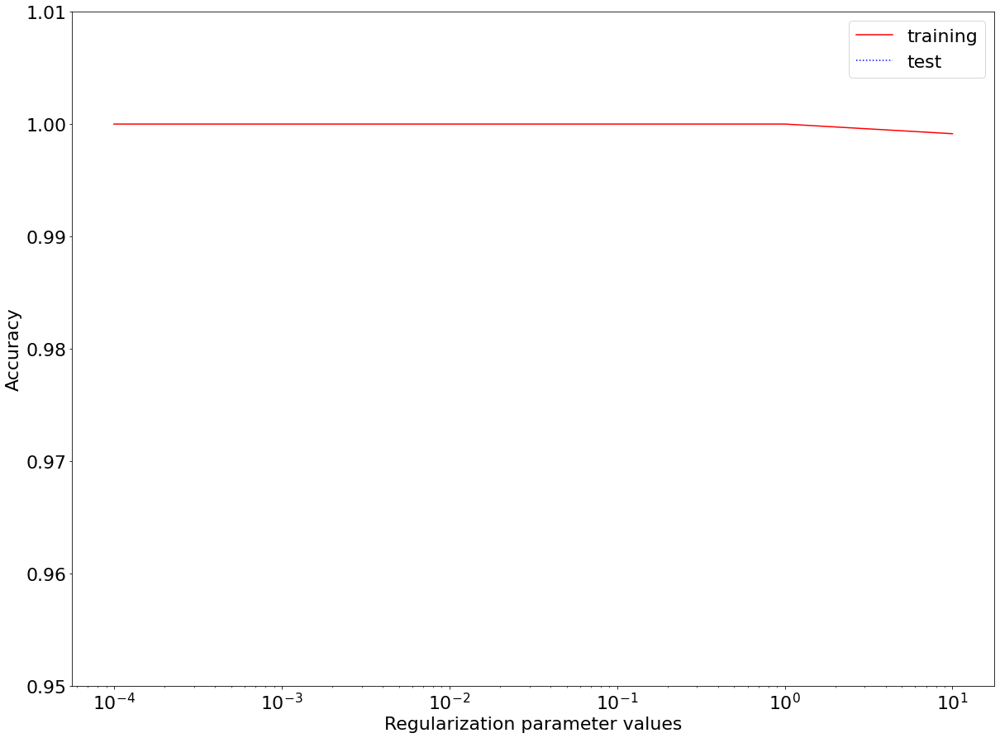

In [332]:
# Regularization parameter (alpha) checking over persons.
#
for per in range(10):
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)

    prepare = PrepareDatasetForLearning()
    train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 'like', 0.7, 
                                                                                                filter=True, temporal=False)
    # ===================================== NN Classification =====================================

    algo = ClassificationAlgorithms()
    eval = ClassificationEvaluation()

    reg_parameters = [0.0001, 0.001, 0.1, 1, 10]     # 0.001; [0.0001, 0.001, 0.1, 1, 10]
    performance_training = []
    performance_test = []

    # We repeat the experiment a number of times to get a bit more robust data as the initialization of the NN is random.
    #
    print(f'For Person {per}')
    iter = 10
    for param in reg_parameters:
        print(f'Regularization Param = {param}...')
        performance_tr = 0
        performance_te = 0

        for i in range(0, iter):
            class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = algo.feedforward_neural_network(train_X, train_y,
                                                                                                                test_X, hidden_layer_sizes=(100, ), alpha=param, max_iter=500,
                                                                                                                gridsearch=False)
            performance_tr += eval.accuracy(train_y, class_train_y)
            performance_te += eval.accuracy(test_y, class_test_y)

        performance_training.append(performance_tr/iter)
        performance_test.append(performance_te/iter)

    print("Training Performance = ", performance_training)
    print("Testing Performance = ", performance_test)

    DataViz.plot_xy(x=[reg_parameters, reg_parameters], y=[performance_training, performance_test], method='semilogx',
                    xlabel='Regularization parameter values', ylabel='Accuracy', ylim=[0.95, 1.01],
                    names=['training', 'test'], line_styles=['r-', 'b:'])

## All Classifiers Evaluation

### Person 0

Reading dataset...
Splitting Dataset for Classification...
Begining Possible feature-set-wise iteration...
For feature set - initial set...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward NN learning...
Performance eval for NN...
Iterations over!
Overall Performance eval for NN.
KNN learning...
Performance eval for KNN.
NB learning...
Performance eval for NB.
Overall Score calculation...
initial set & 0.8426\emph{( 0.8213 - 0.8640 )}  & 0.6847\emph{( 0.6431 - 0.7262 )} & 0.6103\emph{( 0.5817 - 0.6389 )}  & 0.5040\emph{( 0.4593 - 0.5487 )} & 0.6052\emph{( 0.5765 - 0.6338 )}  & 0.5860\emph{( 0.5419 - 0.6301 )}\\\hline
Scores appended for Iter 0!
For feature set - Chapter 3...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward N

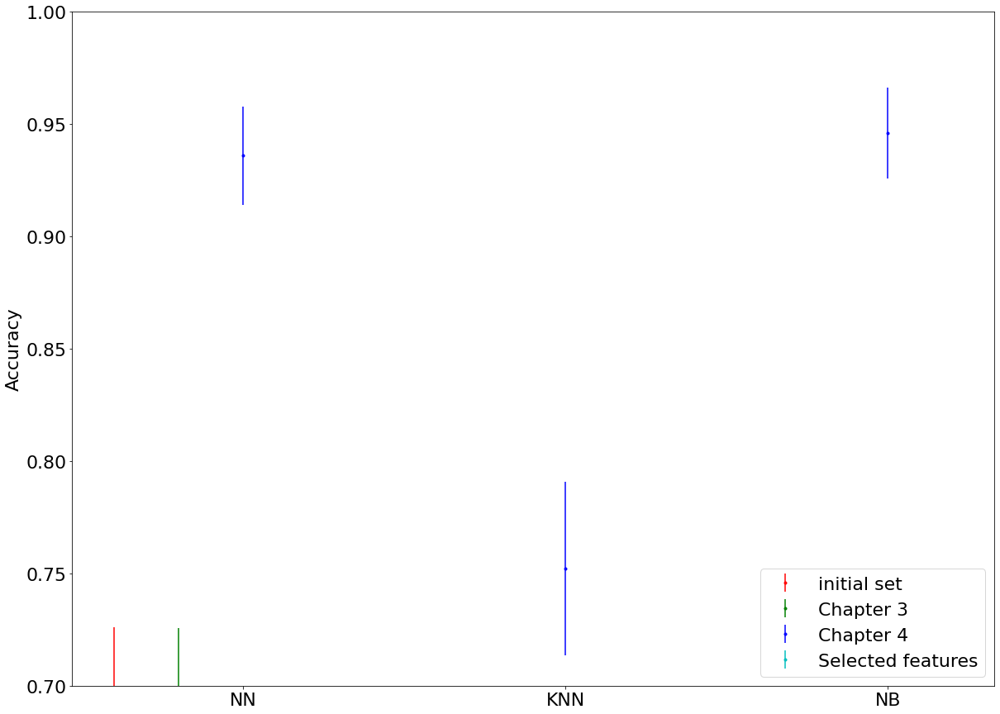

In [336]:
possible_feature_sets = [basic_features, features_after_chapter_3, all_features, selected_features]
feature_names = ['initial set', 'Chapter 3', 'Chapter 4', 'Selected features']
scores_over_all_algs = []

print('Reading dataset...')
dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per0.csv', index_col=0)
dataset.index = pd.to_datetime(dataset.index)

print("Splitting Dataset for Classification...")
prepare = PrepareDatasetForLearning()
train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 'like', 0.7, 
                                                                                                filter=True, temporal=False)
# ===================================== Neural Network & Naives Bayes Classification =====================================

learner = ClassificationAlgorithms()
eval = ClassificationEvaluation()
iter = 3

print('Begining Possible feature-set-wise iteration...')
for i in range(0, len(possible_feature_sets)):
    print(f'For feature set - {feature_names[i]}...')
    selected_train_X = train_X[possible_feature_sets[i]]
    selected_test_X = test_X[possible_feature_sets[i]]

    performance_tr_nn = 0
    performance_te_nn = 0
    
    print('Begining iterations...')
    for repeat in range(0, iter):
        print(f'Iteration {repeat}, Feedforward NN learning...')
        class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.feedforward_neural_network(selected_train_X, 
                                                                    train_y, selected_test_X, alpha=0.001, gridsearch=True)
        print('Performance eval for NN...')
        performance_tr_nn += eval.accuracy(train_y, class_train_y)
        performance_te_nn += eval.accuracy(test_y, class_test_y)
    print('Iterations over!')
    
    overall_performance_tr_nn = performance_tr_nn/iter
    overall_performance_te_nn = performance_te_nn/iter
    print('Overall Performance eval for NN.')

    print('KNN learning...')
    class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.k_nearest_neighbor(selected_train_X, train_y, 
                                                                                        selected_test_X, gridsearch=True)
    performance_tr_knn = eval.accuracy(train_y, class_train_y)
    performance_te_knn = eval.accuracy(test_y, class_test_y)
    print('Performance eval for KNN.')

    print('NB learning...')
    class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.naive_bayes(selected_train_X, train_y, selected_test_X) 
    performance_tr_nb = eval.accuracy(train_y, class_train_y)
    performance_te_nb = eval.accuracy(test_y, class_test_y)
    print('Performance eval for NB.')
    
    print('Overall Score calculation...')
    scores_with_sd = util.print_table_row_performances(feature_names[i], len(selected_train_X.index), len(selected_test_X.index), [
                                                                                                (overall_performance_tr_nn, overall_performance_te_nn),
                                                                                                (performance_tr_knn, performance_te_knn),
                                                                                                (performance_tr_nb, performance_te_nb)])
    print(f'Scores appended for Iter {i}!')
    scores_over_all_algs.append(scores_with_sd)

DataViz.plot_performances_classification(['NN', 'KNN', 'NB'], feature_names, scores_over_all_algs)

### Person 1

Reading dataset...
Splitting Dataset for Classification...
Begining Possible feature-set-wise iteration...
For feature set - initial set...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward NN learning...
Performance eval for NN...
Iterations over!
Overall Performance eval for NN.
KNN learning...
Performance eval for KNN.
NB learning...
Performance eval for NB.
Overall Score calculation...
initial set & 0.9628\emph{( 0.9517 - 0.9739 )}  & 0.8420\emph{( 0.8094 - 0.8746 )} & 0.6910\emph{( 0.6639 - 0.7181 )}  & 0.5560\emph{( 0.5116 - 0.6004 )} & 0.7837\emph{( 0.7596 - 0.8078 )}  & 0.7440\emph{( 0.7050 - 0.7830 )}\\\hline
Scores appended for Iter 0!
For feature set - Chapter 3...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward N

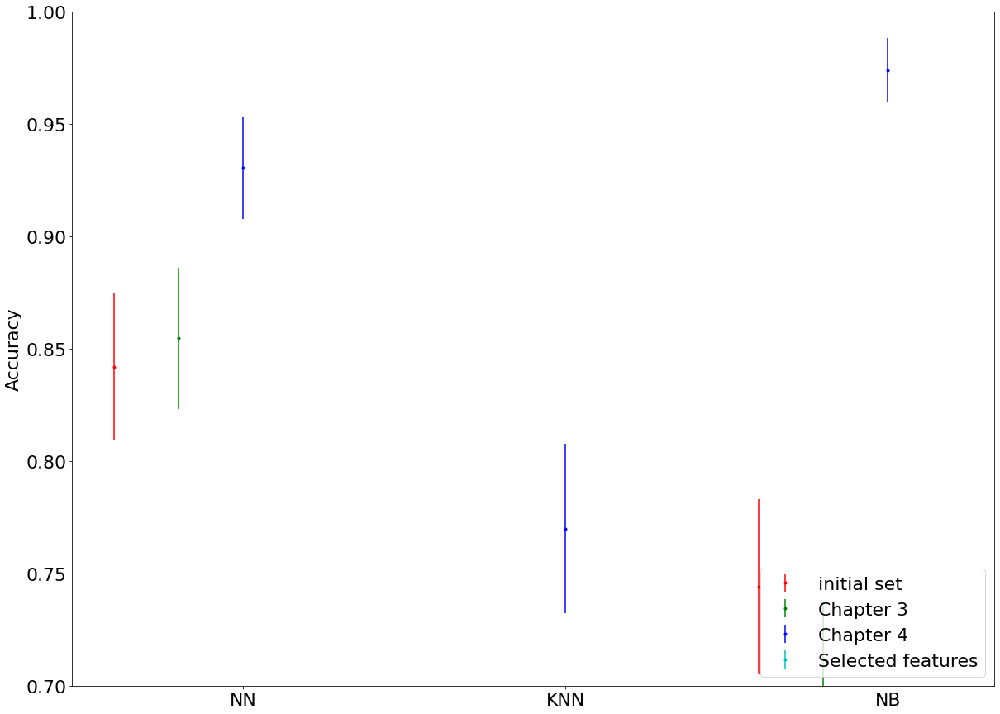

In [337]:
possible_feature_sets = [basic_features, features_after_chapter_3, all_features, selected_features]
feature_names = ['initial set', 'Chapter 3', 'Chapter 4', 'Selected features']
scores_over_all_algs = []

print('Reading dataset...')
dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per1.csv', index_col=0)
dataset.index = pd.to_datetime(dataset.index)

print("Splitting Dataset for Classification...")
prepare = PrepareDatasetForLearning()
train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 'like', 0.7, 
                                                                                                filter=True, temporal=False)
# ===================================== Neural Network & Naives Bayes Classification =====================================

learner = ClassificationAlgorithms()
eval = ClassificationEvaluation()
iter = 3

print('Begining Possible feature-set-wise iteration...')
for i in range(0, len(possible_feature_sets)):
    print(f'For feature set - {feature_names[i]}...')
    selected_train_X = train_X[possible_feature_sets[i]]
    selected_test_X = test_X[possible_feature_sets[i]]

    performance_tr_nn = 0
    performance_te_nn = 0
    
    print('Begining iterations...')
    for repeat in range(0, iter):
        print(f'Iteration {repeat}, Feedforward NN learning...')
        class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.feedforward_neural_network(selected_train_X, 
                                                                    train_y, selected_test_X, alpha=0.001, gridsearch=True)
        print('Performance eval for NN...')
        performance_tr_nn += eval.accuracy(train_y, class_train_y)
        performance_te_nn += eval.accuracy(test_y, class_test_y)
    print('Iterations over!')
    
    overall_performance_tr_nn = performance_tr_nn/iter
    overall_performance_te_nn = performance_te_nn/iter
    print('Overall Performance eval for NN.')

    print('KNN learning...')
    class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.k_nearest_neighbor(selected_train_X, train_y, 
                                                                                        selected_test_X, gridsearch=True)
    performance_tr_knn = eval.accuracy(train_y, class_train_y)
    performance_te_knn = eval.accuracy(test_y, class_test_y)
    print('Performance eval for KNN.')

    print('NB learning...')
    class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.naive_bayes(selected_train_X, train_y, selected_test_X) 
    performance_tr_nb = eval.accuracy(train_y, class_train_y)
    performance_te_nb = eval.accuracy(test_y, class_test_y)
    print('Performance eval for NB.')
    
    print('Overall Score calculation...')
    scores_with_sd = util.print_table_row_performances(feature_names[i], len(selected_train_X.index), len(selected_test_X.index), [
                                                                                                (overall_performance_tr_nn, overall_performance_te_nn),
                                                                                                (performance_tr_knn, performance_te_knn),
                                                                                                (performance_tr_nb, performance_te_nb)])
    print(f'Scores appended for Iter {i}!')
    scores_over_all_algs.append(scores_with_sd)

DataViz.plot_performances_classification(['NN', 'KNN', 'NB'], feature_names, scores_over_all_algs)

Reading dataset...
Splitting Dataset for Classification...
Begining Possible feature-set-wise iteration...
For feature set - initial set...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward NN learning...
Performance eval for NN...
Iterations over!
Overall Performance eval for NN.
KNN learning...
Performance eval for KNN!
NB learning...
Performance eval for NB.
Overall Score calculation...
initial set & 0.8083\emph{( 0.7852 - 0.8314 )}  & 0.6853\emph{( 0.6438 - 0.7269 )} & 0.5210\emph{( 0.4918 - 0.5503 )}  & 0.4520\emph{( 0.4075 - 0.4965 )} & 0.6275\emph{( 0.5991 - 0.6558 )}  & 0.6660\emph{( 0.6238 - 0.7082 )}\\\hline
Scores appended for Iter 0!
For feature set - Chapter 3...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward N

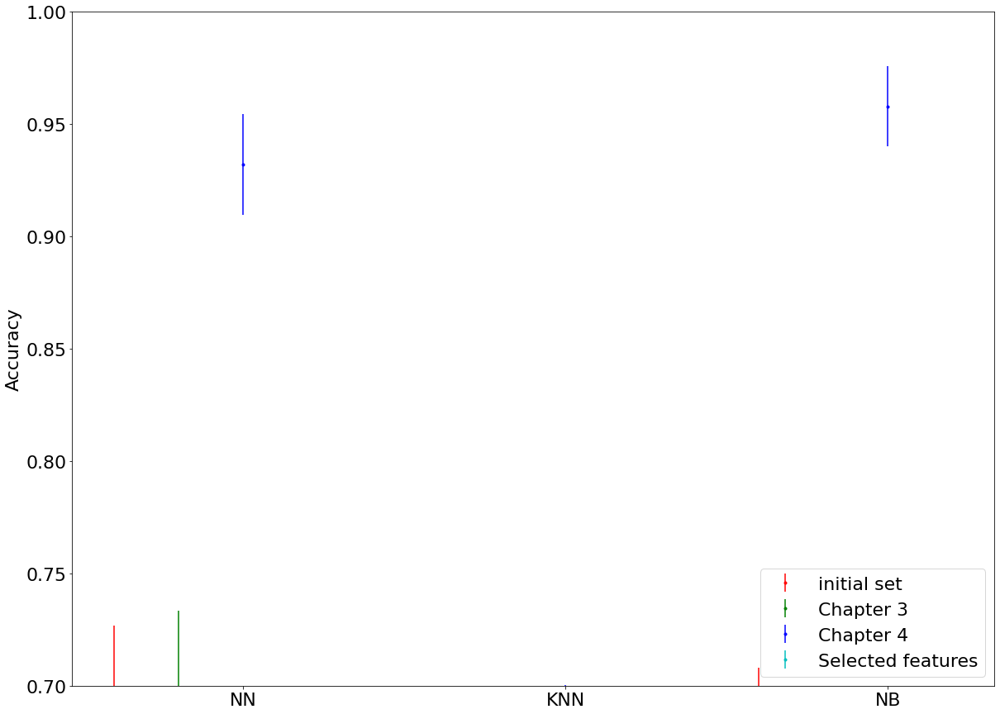

Reading dataset...
Splitting Dataset for Classification...
Begining Possible feature-set-wise iteration...
For feature set - initial set...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...
Performance eval for NN...
Iteration 2, Feedforward NN learning...
Performance eval for NN...
Iterations over!
Overall Performance eval for NN.
KNN learning...
Performance eval for KNN!
NB learning...
Performance eval for NB.
Overall Score calculation...
initial set & 0.8286\emph{( 0.8065 - 0.8507 )}  & 0.6547\emph{( 0.6121 - 0.6972 )} & 0.5768\emph{( 0.5479 - 0.6058 )}  & 0.5040\emph{( 0.4593 - 0.5487 )} & 0.5751\emph{( 0.5461 - 0.6041 )}  & 0.5660\emph{( 0.5217 - 0.6103 )}\\\hline
Scores appended for Iter 0!
For feature set - Chapter 3...
Begining iterations...
Iteration 0, Feedforward NN learning...
Performance eval for NN...
Iteration 1, Feedforward NN learning...


In [ ]:
for per in [2, 3]: # , 4, 5, 6, 7, 8, 9]:
    possible_feature_sets = [basic_features, features_after_chapter_3, all_features, selected_features]
    feature_names = ['initial set', 'Chapter 3', 'Chapter 4', 'Selected features']
    scores_over_all_algs = []

    print('Reading dataset...')
    dataset = pd.read_csv(f'./parkinson_dataset/csv/chapter_4/chapter4_num_freq_per{per}.csv', index_col=0)
    dataset.index = pd.to_datetime(dataset.index)

    print("Splitting Dataset for Classification...")
    prepare = PrepareDatasetForLearning()
    train_X, test_X, train_y, test_y = prepare.split_single_dataset_classification(dataset, ['label'], 'like', 0.7, 
                                                                                                    filter=True, temporal=False)
    # ===================================== Neural Network & Naives Bayes Classification =====================================

    learner = ClassificationAlgorithms()
    eval = ClassificationEvaluation()
    iter = 3

    print('Begining Possible feature-set-wise iteration...')
    for i in range(0, len(possible_feature_sets)):
        print(f'For feature set - {feature_names[i]}...')
        selected_train_X = train_X[possible_feature_sets[i]]
        selected_test_X = test_X[possible_feature_sets[i]]

        performance_tr_nn = 0
        performance_te_nn = 0

        print('Begining iterations...')
        for repeat in range(0, iter):
            print(f'Iteration {repeat}, Feedforward NN learning...')
            class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.feedforward_neural_network(selected_train_X, 
                                                                        train_y, selected_test_X, alpha=0.001, gridsearch=True)
            print('Performance eval for NN...')
            performance_tr_nn += eval.accuracy(train_y, class_train_y)
            performance_te_nn += eval.accuracy(test_y, class_test_y)
        print('Iterations over!')

        overall_performance_tr_nn = performance_tr_nn/iter
        overall_performance_te_nn = performance_te_nn/iter
        print('Overall Performance eval for NN.')

        print('KNN learning...')
        class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.k_nearest_neighbor(selected_train_X, train_y, 
                                                                                            selected_test_X, gridsearch=True)
        performance_tr_knn = eval.accuracy(train_y, class_train_y)
        performance_te_knn = eval.accuracy(test_y, class_test_y)
        print('Performance eval for KNN!')

        print('NB learning...')
        class_train_y, class_test_y, class_train_prob_y, class_test_prob_y = learner.naive_bayes(selected_train_X, train_y, selected_test_X) 
        performance_tr_nb = eval.accuracy(train_y, class_train_y)
        performance_te_nb = eval.accuracy(test_y, class_test_y)
        print('Performance eval for NB.')

        print('Overall Score calculation...')
        scores_with_sd = util.print_table_row_performances(feature_names[i], len(selected_train_X.index), len(selected_test_X.index), [
                                                                                                    (overall_performance_tr_nn, overall_performance_te_nn),
                                                                                                    (performance_tr_knn, performance_te_knn),
                                                                                                    (performance_tr_nb, performance_te_nb)])
        print(f'Scores appended for Iter {i}!')
        scores_over_all_algs.append(scores_with_sd)
    
    print(f'Plot for Person {per}!')
    DataViz.plot_performances_classification(['NN', 'KNN', 'NB'], feature_names, scores_over_all_algs)